# Load the dataset and separate out the training and test data sets

In [2]:
# point to the appropriate directory containing the dataset split into train/val/test
import os
os.chdir ('/Users/karthiksankar/Documents/SAR/3.DataSplit')

In [3]:
import pandas as pd
data = pd.read_csv ('dataset_input.csv', index_col = 0)
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 435246 entries, 0 to 447756
Data columns (total 9 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   Reaction SMILES                     435246 non-null  object
 1   reactionID                          435246 non-null  int64 
 2   react_smiles                        435246 non-null  object
 3   rxn_smiles                          435246 non-null  object
 4   template                            435246 non-null  object
 5   Template Verification (True/False)  435246 non-null  bool  
 6   canonical_rxn_smiles                435246 non-null  object
 7   dataset                             435246 non-null  object
 8   str_Reaction_Partner                435246 non-null  object
dtypes: bool(1), int64(1), object(7)
memory usage: 30.3+ MB


In [4]:
# convert str_Reaction_Partner into a list
from ast import literal_eval

#convert the string in the dataframe into list (result of storing the dataframe as csv!)
data['Reaction Partner (s)'] =  data.str_Reaction_Partner.apply(lambda x: literal_eval(str(x)))
#drop the string column str_Reaction_Partner
data.drop(columns = ['str_Reaction_Partner'], inplace = True)

In [5]:
os.chdir ('/Users/karthiksankar/Documents/SAR/5.Platform_ForApplication')

In [6]:
datasub = data[data['dataset']== 'train']

In [7]:
datasub_val = data[data['dataset']== 'test']

# Add fingerprint information to training and validation data sets

In [8]:
# import all necessary packages
import rdkit.Chem as Chem
import rdkit.Chem.AllChem as AllChem
from rdkit import DataStructs

# Set up fingerprinting of molecules, this is the final fingerprint decided after hyperparameter optimization
getfp = lambda smi: AllChem.GetMorganFingerprint(Chem.MolFromSmiles(smi),2, useFeatures=True)

# Set up similarity label, this is the final similarity label decided after hyperparameter optimization
similarity_metric = DataStructs.BulkTanimotoSimilarity

In [9]:
def do_one_getfp (smiles):
    '''Given an input SMILES, this code will return its fingerprint. This would be important for setting
    this up in parallel.
    '''
    getfp = lambda smi: AllChem.GetMorganFingerprint(Chem.MolFromSmiles(smi),2, useFeatures=True)
    
    return getfp(smiles)

In [10]:
#import the parallel libraries
from joblib import Parallel, delayed

#compute the fingerprints, training set
all_fps_train = Parallel (n_jobs = 7, verbose = 3) (delayed (do_one_getfp) (smiles) \
for smiles in datasub['react_smiles'])

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:    0.6s
[Parallel(n_jobs=7)]: Done 1479 tasks      | elapsed:    0.7s
[Parallel(n_jobs=7)]: Done 72199 tasks      | elapsed:    5.7s
[Parallel(n_jobs=7)]: Done 186887 tasks      | elapsed:   13.5s
[Parallel(n_jobs=7)]: Done 334343 tasks      | elapsed:   24.4s
[Parallel(n_jobs=7)]: Done 348196 out of 348196 | elapsed:   25.5s finished


In [11]:
#add reactant fingerprint to the pandas dataframe
datasub['react_fp'] = all_fps_train

/var/folders/63/4_fnssd92x5ddl69c4gft_sh0000gn/T/ipykernel_46198/2459195585.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datasub['react_fp'] = all_fps_train


In [12]:
#compute the fingerprints, validation set
all_fps_val = Parallel (n_jobs = 7, verbose = 3) (delayed (do_one_getfp) (smiles) \
for smiles in datasub_val ['react_smiles'])

[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  22 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 4082 tasks      | elapsed:    0.4s
[Parallel(n_jobs=7)]: Done 43512 out of 43525 | elapsed:    3.2s remaining:    0.0s
[Parallel(n_jobs=7)]: Done 43525 out of 43525 | elapsed:    3.2s finished


In [13]:
#Append the fingerprints of all reactants in the validation set
datasub_val ['react_fp'] = all_fps_val

/var/folders/63/4_fnssd92x5ddl69c4gft_sh0000gn/T/ipykernel_46198/516885177.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datasub_val ['react_fp'] = all_fps_val


# Diversification and fastfilter computations

In [14]:
import sys 
import os
import re
import copy
import numpy as np
import rdkit.Chem as Chem
import rdkit.Chem.AllChem as AllChem
from rdkit.Chem.rdchem import ChiralType, BondType, BondDir
from rdchiral.utils import vprint, PLEVEL, atoms_are_different
from rdchiral.initialization import rdchiralReaction, rdchiralReactants
from rdchiral.chiral import template_atom_could_have_been_tetra, copy_chirality,\
    atom_chirality_matches
from rdchiral.clean import canonicalize_outcome_smiles, combine_enantiomers_into_racemic
from rdchiral.bonds import BondDirOpposite, restore_bond_stereo_to_sp2_atom
from rdchiral.template_extractor import extract_from_reaction
from rdchiral.main import rdchiralRun

### Drawing tools

In [15]:
from rdkit.Chem.Draw import rdMolDraw2D

from IPython.display import SVG

from rdkit.Chem import rdChemReactions

def draw_rxn(rxn, unmap=True, width=800, height=200):
    if unmap:
        for mol in rxn.GetReactants():
            [a.SetAtomMapNum(0) for a in mol.GetAtoms()]
        for mol in rxn.GetProducts():
            [a.SetAtomMapNum(0) for a in mol.GetAtoms()]
    drawer = rdMolDraw2D.MolDraw2DSVG(width, height)
    drawer.DrawReaction(rxn)
    drawer.FinishDrawing()
    svg = drawer.GetDrawingText().replace('svg:', '')
    display(SVG(svg))

def draw_rxn_smi(rxn_smi, unmap=True, width=800, height=200):
    rxn = AllChem.ReactionFromSmarts(rxn_smi, useSmiles=True)
    draw_rxn(rxn, unmap=unmap, width=width, height=height)

### Fast filter tools

In [16]:
from api_client import APIClient

#this study was performed using the ASKCOS API for FastFilter. 
#Instructions to do so are available in 'Platform_ForMultiStepEnumeration'

#enter host name below
#hostname = ''

client = APIClient(hostname, verify=False)

#enter user name and password
client.client.auth = ('', '')

### Diverisification module
This will take the index associated with the test set as input. It will use fastfilter to evaluate reaction feasibility. Setting draw = True will draw out the suggestions. Setting debug = True will print the output out in text format. Setting result_print = True will print out the information that will go into the pandas dataframe. Setting coupling_partner_figure = True can help in making figures.

In [17]:
#jx_cache = {} #jx_cache is a dictionary
draw = True            
debug = False
result_print = False
coupling_partner_figure = False

def do_one_v4 (ix, draw=draw, debug=debug, max_prec=100, testlimit = 100, result_print = result_print):
    
    #get reactant smiles
    react_smiles = []
    react_smiles.append (datasub_val ['react_smiles'][ix])
    
    # for the moment, it is just an empty string
    rec_for_printing = '' 
    
    #loads reactant SMILES into RDKit object
    ex = Chem.MolFromSmiles(datasub_val ['react_smiles'][ix]) 
    
    #loads reactant SMILES into RDChiral object
    rct = rdchiralReactants(datasub_val ['react_smiles'][ix])
    
    #if Draw = True, then Print Mol {Index}
    if draw:
        print ('Mol {}, reactant input:'.format(ix))
        display (ex)
        
    #if Debug = True, then Print {Product SMILES} + go to new line +
    # True reaction: {reaction smiles}
    
    if debug:
        rec_for_printing += 'Desired Reactant:' + '\n'
        rec_for_printing += datasub_val ['react_smiles'][ix] + '\n'
        rec_for_printing += 'True reaction:' + '\n'
        rec_for_printing += datasub_val ['rxn_smiles'] [ix] + '\n'
        
  
    #get the fingerprint of the product
    fp = datasub_val['react_fp'][ix]
    
    #calculates similarity metric between fingerprint 
    # and all fingerprints in the database
    sims = similarity_metric (fp, [fp_ for fp_ in datasub['react_fp']])
    
    #sort the similarity metric in reverse order
    js = np.argsort(sims) [::-1]
    
    #draw the reaction smiles out
    if draw:
        print ('Desired Reaction:')
        draw_rxn_smi (datasub_val['rxn_smiles'][ix])
    
    #get the product goal from the reaction smiles string
    prod_goal = Chem.MolFromSmiles (datasub_val['rxn_smiles'][ix].split('>')[2])
    [a.ClearProp('molAtomMapNumber') for a in prod_goal.GetAtoms()]
    prod_goal = Chem.MolToSmiles(prod_goal, True)
    
    #sometimes stereochem takes another canonicalization
    prod_goal = Chem.MolToSmiles(Chem.MolFromSmiles(prod_goal), True)
    
    #print out the product goal
    if debug:
        rec_for_printing += 'prod_goal: {}\n'.format(prod_goal)
    
    #draw out the product
    if draw:
        print ('Desired Product:')
        display (Chem.MolFromSmiles (prod_goal))
    
    # Get probability of precursors
    probs = {}
    coreact = {}
    
    for ji,j in enumerate (js[:max_prec]):
        
        #get the index in the similarity search
        jx = datasub.index[j]
        
        #draw out the most similar reactions
        if draw: 
            print('\n\n'+'-'*50+'\n')
            print ('Train index: {}'.format (jx))
            print ('RANK {} PRECEDENT'.format(ji+1))
            print ('REACTANT MATCH SCORE: {}'.format(sims[j]))
            draw_rxn_smi (datasub['rxn_smiles'][jx])
        
        #debug statement- Reaction precedent rank, similarity score, and reaction smiles addition!
        if debug:
            rec_for_printing += '\nReaction precedent {}, prod similarity {}\n'.format(ji+1, sims[j])
            rec_for_printing += '-> rxn_smiles {}\n'.format(datasub['rxn_smiles'][jx])
        
        try:  
            #extract the template
            template = datasub['template'][jx]

            #get product reference fingerprint
            prods_ref_fp = getfp(datasub['rxn_smiles'][jx].split('>')[2])

            #load the reaction into an rdchiral object
            rxn = rdchiralReaction(template)

            #save it to the cache
            #jx_cache[jx] = (rxn, template, prods_ref_fp)

            #debug statement- print the reaction template and index
            if debug:
                rec_for_printing += '-> template: {}\n'.format(template)
                rec_for_printing += '-> jx/ index: {}\n'.format(jx)

            #draw: draw out the template
            if draw:
                print('-> template: {}'.format(template))
                rxn_for_display = rdChemReactions.ReactionFromSmarts(template)
                display (rxn_for_display)

        except:

            if debug:
                rec_for_printing += '-> Template extraction failed! \n'

            if draw:
                print ('-> Template extraction failed!')

            #if it fails, move to the next reaction
            continue 

        try:
            # try running the rdchiral reaction
            outcomes = rdchiralRun (rxn, rct, combine_enantiomers=False)
        
        #if running the rdchiral reaction is not possible go into this exception routine
        except Exception as e:
            print(e)
            outcomes = []
            continue
        
        #if you are unable to generate outcomes and draw -> print an error message
        if not outcomes and draw:
            print('->No precursors could be generated!')
            
        #if you are unable to generate outcomes and debug -> print an error message
        if not outcomes and debug:
            rec_for_printing += '-> Template application failed! \n'
            
        for products in outcomes:
            
            #proposed product fingerprint
            products_fp = getfp(products)
            
            #compare proposed and precedent product fp
            products_sim = similarity_metric(products_fp, [prods_ref_fp])[0]
            
            #debug statement
            if debug:
                rec_for_printing += 'prod sim {}, overall {}, smiles {}\n'.format(products_sim, products_sim*sims[j], products)
            
            #draw statement
            if draw:
                print('Product similarity {}, overall {}, smiles {}'.format(
                    products_sim, products_sim*sims[j], products))
                display(Chem.MolFromSmiles(products))
                
            #assemble the reaction
            rxn_to_print = ''

            #add core reactant
            rxn_to_print += datasub_val ['react_smiles'][ix]

            #add coreactants
            coreactants_draw = datasub ['Reaction Partner (s)'][jx]
            for reactant in coreactants_draw:
                rxn_to_print += '.' + reactant

            #add products
            rxn_to_print += '>>' + products
                  
            #compute fast filter scores
            endpoint = 'fast-filter'
            allreactants_ff,allproducts_ff = rxn_to_print.split ('>>')
            input_ff = {
                        'reactants': allreactants_ff,
                        'products' : allproducts_ff
                        }
            result = client.post (endpoint, input_ff)
            tid = result ['task_id']
            task_result = client.get_result (tid, timeout = 600, interval = 5)
                
            if draw:
                #display the reaction
                print ('The proposed reaction is:')
                draw_rxn_smi(rxn_to_print)
                print ('The reaction SMILES string is: {}'.format (rxn_to_print))
                print ('The fast filter score is {}'.format (task_result['output']))
                
                
            if products in probs:
                if (products_sim*sims[j]) > probs[products][0]:
                    probs[products] = [products_sim*sims[j],task_result['output']]
                    coreact[products] = datasub ['Reaction Partner (s)'][jx]
            else:
                probs[products] = [products_sim*sims[j],task_result['output']]
                coreact[products] = datasub ['Reaction Partner (s)'][jx]
    
    found_rank = 9999
    
    sim_to_idealProdPrevious = -1
    
    #convert prod_goal to its fingerprint
    prod_goal_fp = getfp(prod_goal)

        
    for r, (prod, prob) in enumerate(sorted(probs.items(), key=lambda x:x[1], reverse=True)[:testlimit]):         
        
        #convert prod to its fingeprint
        prod_fp = getfp (prod)
        
        #compute similarity to ideal product
        sim_to_idealProd = similarity_metric (prod_fp, [prod_goal_fp])[0]
        
        if coupling_partner_figure and r == 0:
            print ('Desired Reaction (in test set): {}'.format (datasub_val['Reaction SMILES'][ix]))
            draw_rxn_smi (datasub_val['rxn_smiles'][ix])
                        
        if coupling_partner_figure:
            print('\n\n'+'-'*50+'\n')
            print ('The Product SMILES is: {}'.format (prod))
            display (Chem.MolFromSmiles (prod))
            print ('The overall similarity score is: {}'. format (prob[0]))
            print ('The fast filter score is: {}'. format (prob[1]))
            for reactant in coreact[prod]:
                print ('The coupling partner is {}'.format (reactant))
                display (Chem.MolFromSmiles (reactant))
        
        if sim_to_idealProd > sim_to_idealProdPrevious:
            sim_to_idealProdPrevious = sim_to_idealProd
            found_rank = r + 1
            recoveredProduct = prod
            coreactant = coreact[prod]
    
    #get reactant fingerprint
    reactant_fp = getfp(datasub_val ['react_smiles'][ix])
    sim_reactant_to_idealProd = similarity_metric (reactant_fp, [prod_goal_fp])[0]
    
    #assemble the reaction
    return_rxn = ''
    
    return_rxn += datasub_val ['react_smiles'][ix]
    

                
    for reactant in coreactant:
        return_rxn += '.' + reactant
    
    return_rxn += '>>' + recoveredProduct
    
    if debug:
        print(rec_for_printing)
        
    if result_print:
        print ('******RESULTS******')
        print ('Mol {}, reactant input:'.format(ix))
        display (ex)
        print ('Desired Reaction:')
        draw_rxn_smi (datasub_val['rxn_smiles'][ix])
        print ('Desired Product:')
        display (Chem.MolFromSmiles (prod_goal))
        print ('Identified Product:')
        display (Chem.MolFromSmiles (recoveredProduct))
        print ('Rank: {}'.format (found_rank))
        print ('Similarity of proposed product to ideal product: {}'.format (sim_to_idealProdPrevious))
        print ('Similarity of original reactant to ideal product: {}'. format (sim_reactant_to_idealProd))
    
    if sim_to_idealProdPrevious <= sim_reactant_to_idealProd:
        found_rank = 9999
        return_rxn = 9999

    return (found_rank, return_rxn, sim_to_idealProdPrevious, sim_reactant_to_idealProd)

### DIversification module (without fastfilter)
This will take the index associated with the test set as input. For speed, it doesn't use fastfilter to evaluate reaction feasibility. Setting draw = True will draw out the suggestions. Setting debug = True will print the output out in text format. Setting result_print = True will print out the information that will go into the pandas dataframe. Setting coupling_partner_figure = True can help in making figures (it will explicity draw out the reaction partners associated with the template and provide their SMILES string).

In [18]:
#jx_cache = {} #jx_cache is a dictionary
draw = True            
debug = False
result_print = False
coupling_partner_figure = True

def do_one_v4_woFastFilter (ix, draw=draw, debug=debug, max_prec=8, testlimit = 200, result_print = result_print):
    
    #get reactant smiles
    react_smiles = []
    react_smiles.append (datasub_val ['react_smiles'][ix])
    
    # for the moment, it is just an empty string
    rec_for_printing = '' 
    
    #loads reactant SMILES into RDKit object
    ex = Chem.MolFromSmiles(datasub_val ['react_smiles'][ix]) 
    
    #loads reactant SMILES into RDChiral object
    rct = rdchiralReactants(datasub_val ['react_smiles'][ix])
    
    #if Draw = True, then Print Mol {Index}
    if draw:
        print ('Mol {}, reactant input:'.format(ix))
        display (ex)
        print ('SMILES: {}'.format (datasub_val ['react_smiles'][ix]))
        
    #if Debug = True, then Print {Product SMILES} + go to new line +
    # True reaction: {reaction smiles}
    
    if debug:
        rec_for_printing += 'Desired Reactant:' + '\n'
        rec_for_printing += datasub_val ['react_smiles'][ix] + '\n'
        rec_for_printing += 'True reaction:' + '\n'
        rec_for_printing += datasub_val ['rxn_smiles'] [ix] + '\n'
        
  
    #get the fingerprint of the product
    fp = datasub_val['react_fp'][ix]
    
    #calculates similarity metric between fingerprint 
    # and all fingerprints in the database
    sims = similarity_metric (fp, [fp_ for fp_ in datasub['react_fp']])
    
    #sort the similarity metric in reverse order
    js = np.argsort(sims) [::-1]
    
    #draw the reaction smiles out
    if draw:
        print ('Desired Reaction:')
        draw_rxn_smi (datasub_val['rxn_smiles'][ix])
        print ('Reaction SMILES: {}'.format (datasub_val['rxn_smiles'][ix]))
    
    #get the product goal from the reaction smiles string
    prod_goal = Chem.MolFromSmiles (datasub_val['rxn_smiles'][ix].split('>')[2])
    [a.ClearProp('molAtomMapNumber') for a in prod_goal.GetAtoms()]
    prod_goal = Chem.MolToSmiles(prod_goal, True)
    
    #sometimes stereochem takes another canonicalization
    prod_goal = Chem.MolToSmiles(Chem.MolFromSmiles(prod_goal), True)
    
    #print out the product goal
    if debug:
        rec_for_printing += 'prod_goal: {}\n'.format(prod_goal)
    
    #draw out the product
    if draw:
        print ('Desired Product:')
        display (Chem.MolFromSmiles (prod_goal))
        print ('SMILES: {}'.format (prod_goal))
    
    # Get probability of precursors
    probs = {}
    coreact = {}
    
    for ji,j in enumerate (js[:max_prec]):
        
        #get the index in the similarity search
        jx = datasub.index[j]
        
        #draw out the most similar reactions
        if draw: 
            print('\n\n'+'-'*50+'\n')
            print ('Train index: {}'.format (jx))
            print ('RANK {} PRECEDENT'.format(ji+1))
            print ('REACTANT MATCH SCORE: {}'.format(sims[j]))
            print ('Reaction SMILES (Precedent): {}'.format (datasub['rxn_smiles'][jx]))
            draw_rxn_smi (datasub['rxn_smiles'][jx])
        
        #debug statement- Reaction precedent rank, similarity score, and reaction smiles addition!
        if debug:
            rec_for_printing += '\nReaction precedent {}, prod similarity {}\n'.format(ji+1, sims[j])
            rec_for_printing += '-> rxn_smiles {}\n'.format(datasub['rxn_smiles'][jx])
        
        try:  
            #extract the template
            template = datasub['template'][jx]

            #get product reference fingerprint
            prods_ref_fp = getfp(datasub['rxn_smiles'][jx].split('>')[2])

            #load the reaction into an rdchiral object
            rxn = rdchiralReaction(template)

            #save it to the cache
            #jx_cache[jx] = (rxn, template, prods_ref_fp)

            #debug statement- print the reaction template and index
            if debug:
                rec_for_printing += '-> template: {}\n'.format(template)
                rec_for_printing += '-> jx/ index: {}\n'.format(jx)

            #draw: draw out the template
            if draw:
                print('-> template: {}'.format(template))
                rxn_for_display = rdChemReactions.ReactionFromSmarts(template)
                display (rxn_for_display)

        except:

            if debug:
                rec_for_printing += '-> Template extraction failed! \n'

            if draw:
                print ('-> Template extraction failed!')

            #if it fails, move to the next reaction
            continue 

        try:
            # try running the rdchiral reaction
            outcomes = rdchiralRun (rxn, rct, combine_enantiomers=False)
        
        #if running the rdchiral reaction is not possible go into this exception routine
        except Exception as e:
            print(e)
            outcomes = []
            continue
        
        #if you are unable to generate outcomes and draw -> print an error message
        if not outcomes and draw:
            print('->No precursors could be generated!')
            
        #if you are unable to generate outcomes and debug -> print an error message
        if not outcomes and debug:
            rec_for_printing += '-> Template application failed! \n'
            
        for products in outcomes:
            
            #proposed product fingerprint
            products_fp = getfp(products)
            
            #compare proposed and precedent product fp
            products_sim = similarity_metric(products_fp, [prods_ref_fp])[0]
            
            #debug statement
            if debug:
                rec_for_printing += 'prod sim {}, overall {}, smiles {}\n'.format(products_sim, products_sim*sims[j], products)
            
            #draw statement
            if draw:
                print('Product similarity {}, overall {}, smiles {}'.format(
                    products_sim, products_sim*sims[j], products))
                display(Chem.MolFromSmiles(products))
                
            #assemble the reaction
            rxn_to_print = ''

            #add core reactant
            rxn_to_print += datasub_val ['react_smiles'][ix]

            #add coreactants
            coreactants_draw = datasub ['Reaction Partner (s)'][jx]
            for reactant in coreactants_draw:
                rxn_to_print += '.' + reactant

            #add products
            rxn_to_print += '>>' + products
                  
                
            if draw:
                #display the reaction
                print ('The proposed reaction is:')
                draw_rxn_smi(rxn_to_print)
                print ('The reaction SMILES string is: {}'.format (rxn_to_print))
                
                
            if products in probs:
                if (products_sim*sims[j]) > probs[products][0]:
                    probs[products] = [products_sim*sims[j]]
                    coreact[products] = datasub ['Reaction Partner (s)'][jx]
            else:
                probs[products] = [products_sim*sims[j]]
                coreact[products] = datasub ['Reaction Partner (s)'][jx]
    
    found_rank = 9999
    
    sim_to_idealProdPrevious = -1
    
    #convert prod_goal to its fingerprint
    prod_goal_fp = getfp(prod_goal)

        
    for r, (prod, prob) in enumerate(sorted(probs.items(), key=lambda x:x[1], reverse=True)[:testlimit]):         
        
        #convert prod to its fingeprint
        prod_fp = getfp (prod)
        
        #compute similarity to ideal product
        sim_to_idealProd = similarity_metric (prod_fp, [prod_goal_fp])[0]
        
        if coupling_partner_figure and r == 0:
            print ('Desired Reaction (in test set): {}'.format (datasub_val['Reaction SMILES'][ix]))
            draw_rxn_smi (datasub_val['rxn_smiles'][ix])
                        
        if coupling_partner_figure:
            print('\n\n'+'-'*50+'\n')
            print('Rank {}'.format (r+1))
            print ('The Product SMILES is: {}'.format (prod))
            display (Chem.MolFromSmiles (prod))
            print ('The overall similarity score is: {}'. format (prob[0]))
            for reactant in coreact[prod]:
                print ('The coupling partner is {}'.format (reactant))
                display (Chem.MolFromSmiles (reactant))
        
        if sim_to_idealProd > sim_to_idealProdPrevious:
            sim_to_idealProdPrevious = sim_to_idealProd
            found_rank = r + 1
            recoveredProduct = prod
            coreactant = coreact[prod]
    
    #get reactant fingerprint
    reactant_fp = getfp(datasub_val ['react_smiles'][ix])
    sim_reactant_to_idealProd = similarity_metric (reactant_fp, [prod_goal_fp])[0]
    
    #assemble the reaction
    return_rxn = ''
    
    return_rxn += datasub_val ['react_smiles'][ix]
    

                
    for reactant in coreactant:
        return_rxn += '.' + reactant
    
    return_rxn += '>>' + recoveredProduct
    
    if debug:
        print(rec_for_printing)
        
    if result_print:
        print ('******RESULTS******')
        print ('Mol {}, reactant input:'.format(ix))
        display (ex)
        print ('Desired Reaction:')
        draw_rxn_smi (datasub_val['rxn_smiles'][ix])
        print ('Desired Product:')
        display (Chem.MolFromSmiles (prod_goal))
        print ('Identified Product:')
        display (Chem.MolFromSmiles (recoveredProduct))
        print ('Rank: {}'.format (found_rank))
        print ('Similarity of proposed product to ideal product: {}'.format (sim_to_idealProdPrevious))
        print ('Similarity of original reactant to ideal product: {}'. format (sim_reactant_to_idealProd))
    
    if sim_to_idealProdPrevious <= sim_reactant_to_idealProd:
        found_rank = 9999
        return_rxn = 9999

    return (found_rank, return_rxn, sim_to_idealProdPrevious, sim_reactant_to_idealProd) 

### Diversification module using SMILES string
This module will take in SMILES string as input for the diversification. For speed, it doesn't use fastfilter to evaluate reaction feasibility. Setting draw = True will draw out the suggestions. Setting debug = True will print the output out in text format. Setting result_print = True will print out the information that will go into the pandas dataframe. Setting coupling_partner_figure = True can help in making figures (it will explicity draw out the reaction partners associated with the template and provide their SMILES string).

In [19]:
#jx_cache = {} #jx_cache is a dictionary
draw = True            
debug = False
result_print = False
coupling_partner_figure = False

getfp = lambda smi: AllChem.GetMorganFingerprint(Chem.MolFromSmiles(smi),2, useFeatures=True)

def do_one_v4_SMILES (smiles, draw=draw, debug=debug, max_prec=100, testlimit = 100, result_print = result_print):
    
    #get reactant smiles
    react_smiles = []
    react_smiles.append (smiles)
    
    # for the moment, it is just an empty string
    rec_for_printing = '' 
    
    #loads reactant SMILES into RDKit object
    ex = Chem.MolFromSmiles(smiles) 
    
    #loads reactant SMILES into RDChiral object
    rct = rdchiralReactants(smiles)
    
    #if Draw = True, then Print Mol {Index}
    if draw:
        print ('Reactant input:')
        display (ex)
        
    #if Debug = True, then Print {Product SMILES} + go to new line +
    # True reaction: {reaction smiles}
    
    if debug:
        rec_for_printing += 'Desired Reactant:' + '\n'
        rec_for_printing += smiles + '\n'
        
  
    #get the fingerprint of the reactant
    fp = getfp(smiles)
    
    #calculates similarity metric between fingerprint 
    # and all fingerprints in the database
    sims = similarity_metric (fp, [fp_ for fp_ in datasub['react_fp']])
    
    #sort the similarity metric in reverse order
    js = np.argsort(sims) [::-1]
    
    
    # Get probability of precursors
    probs = {}
    coreact = {}
    
    for ji,j in enumerate (js[:max_prec]):
        
        #get the index in the similarity search
        jx = datasub.index[j]
        
        #draw out the most similar reactions
        if draw: 
            print('\n\n'+'-'*50+'\n')
            print ('Train index: {}'.format (jx))
            print ('RANK {} PRECEDENT'.format(ji+1))
            print ('REACTANT MATCH SCORE: {}'.format(sims[j]))
            draw_rxn_smi (datasub['rxn_smiles'][jx])
        
        #debug statement- Reaction precedent rank, similarity score, and reaction smiles addition!
        if debug:
            rec_for_printing += '\nReaction precedent {}, prod similarity {}\n'.format(ji+1, sims[j])
            rec_for_printing += '-> rxn_smiles {}\n'.format(datasub['rxn_smiles'][jx])
        
        try:  
            #extract the template
            template = datasub['template'][jx]

            #get product reference fingerprint
            prods_ref_fp = getfp(datasub['rxn_smiles'][jx].split('>')[2])

            #load the reaction into an rdchiral object
            rxn = rdchiralReaction(template)

            #save it to the cache
            #jx_cache[jx] = (rxn, template, prods_ref_fp)

            #debug statement- print the reaction template and index
            if debug:
                rec_for_printing += '-> template: {}\n'.format(template)
                rec_for_printing += '-> jx/ index: {}\n'.format(jx)

            #draw: draw out the template
            if draw:
                print('-> template: {}'.format(template))
                rxn_for_display = rdChemReactions.ReactionFromSmarts(template)
                display (rxn_for_display)

        except:

            if debug:
                rec_for_printing += '-> Template extraction failed! \n'

            if draw:
                print ('-> Template extraction failed!')

            #if it fails, move to the next reaction
            continue 

        try:
            # try running the rdchiral reaction
            outcomes = rdchiralRun (rxn, rct, combine_enantiomers=False)
        
        #if running the rdchiral reaction is not possible go into this exception routine
        except Exception as e:
            print(e)
            outcomes = []
            continue
        
        #if you are unable to generate outcomes and draw -> print an error message
        if not outcomes and draw:
            print('->No precursors could be generated!')
            
        #if you are unable to generate outcomes and debug -> print an error message
        if not outcomes and debug:
            rec_for_printing += '-> Template application failed! \n'
            
        for products in outcomes:
            
            #proposed product fingerprint
            products_fp = getfp(products)
            
            #compare proposed and precedent product fp
            products_sim = similarity_metric(products_fp, [prods_ref_fp])[0]
            
            #debug statement
            if debug:
                rec_for_printing += 'prod sim {}, overall {}, smiles {}\n'.format(products_sim, products_sim*sims[j], products)
            
            #draw statement
            if draw:
                print('Product similarity {}, overall {}, smiles {}'.format(
                    products_sim, products_sim*sims[j], products))
                display(Chem.MolFromSmiles(products))
                
            #assemble the reaction
            rxn_to_print = ''

            #add core reactant
            rxn_to_print += smiles

            #add coreactants
            coreactants_draw = datasub ['Reaction Partner (s)'][jx]
            for reactant in coreactants_draw:
                rxn_to_print += '.' + reactant

            #add products
            rxn_to_print += '>>' + products
                  
                
            if draw:
                #display the reaction
                print ('The proposed reaction is:')
                draw_rxn_smi(rxn_to_print)
                print ('The reaction SMILES string is: {}'.format (rxn_to_print))
                
                
            if products in probs:
                if (products_sim*sims[j]) > probs[products][0]:
                    probs[products] = [products_sim*sims[j]]
                    coreact[products] = datasub ['Reaction Partner (s)'][jx]
            else:
                probs[products] = [products_sim*sims[j]]
                coreact[products] = datasub ['Reaction Partner (s)'][jx]
    
    
    return None

# A few examples ...

In [22]:
datasub_val.head(5)

,Reaction SMILES,reactionID,react_smiles,rxn_smiles,template,Template Verification (True/False),canonical_rxn_smiles,dataset,Reaction Partner (s),react_fp
38,[CH2:2]([c:3]1[cH:4][cH:5][cH:6][cH:7][cH:8]1)...,38,O=C1CN(c2ccc(Oc3ccccc3)cc2OCc2ccccc2)S(=O)(=O)N1,c1ccc(C[O:9][c:10]2[c:11]([N:23]3[CH2:24][C:25...,[c:2]-[O;H0;D2;+0:1]-[C;H2;D2;+0]-[c;H0;D3;+0]...,True,O=C1CN(c2ccc(Oc3ccccc3)cc2OCc2ccccc2)S(=O)(=O)...,test,[[K]],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...
41,[CH3:1][c:2]1[n:3][cH:4][cH:5][c:6](-[c:8]2[cH...,41,Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1,O=[C:15]([CH2:14][c:11]1[cH:10][cH:9][c:8](-[c...,[C:1]-[C;H0;D3;+0:2](=[O;H0;D1;+0])-[OH;D1;+0:...,True,Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1>>Cc1cc(-c2ccc(CC...,test,[Nc1ccc(N2CCOCC2)nc1],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...
44,[Br:1][c:2]1[n:3][c:4]([CH:8]([CH2:9][F:10])[B...,44,FCC(Br)c1cccc(Br)n1,Br[CH:8]([c:4]1[n:3][c:2]([Br:1])[cH:7][cH:6][...,[#7;a:1]:[c:2]-[CH;D3;+0:3](-[Br;H0;D1;+0])-[C...,True,FCC(Br)c1cccc(Br)n1>>FCC(c1cccc(Br)n1)N1CCOCC1,test,[C1COCCN1],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...
47,[CH3:27][CH2:28][N:29]([CH2:30][CH3:31])[CH2:3...,47,O=C(O)c1c[nH]c2ccccc12,O[C:2](=[O:3])[c:4]1[cH:5][nH:6][c:7]2[cH:8][c...,[#7;a:5]:[c:4]:[c:3]-[C;H0;D3;+0:1](=[O;D1;H0:...,True,O=C(O)c1c[nH]c2ccccc12>>CCOC(=O)Cc1ccc(NC(=O)c...,test,[CCOC(=O)Cc1ccc(N)c(Cl)c1],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...
55,[Al+3:2].[ClH:20].[H-:1].[H-:4].[H-:5].[H-:6]....,55,CC(C)C(C(=O)O)c1ccccc1,O[C:14]([CH:13]([c:7]1[cH:8][cH:9][cH:10][cH:1...,[C:1]-[C;H0;D3;+0:2](=[O;H0;D1;+0:3])-[O;H1;D1...,True,CC(C)C(C(=O)O)c1ccccc1>>CC(C)C(CO)c1ccccc1,test,[],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...


Mol 41, reactant input:


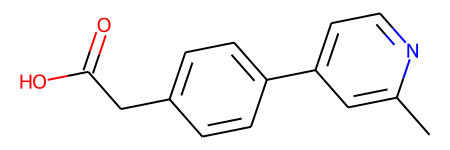

SMILES: Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1
Desired Reaction:


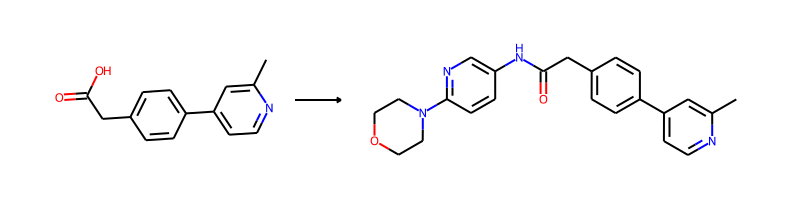

Reaction SMILES: O=[C:15]([CH2:14][c:11]1[cH:10][cH:9][c:8](-[c:6]2[cH:5][cH:4][n:3][c:2]([CH3:1])[cH:7]2)[cH:13][cH:12]1)[OH:17]>>c1cc(N2CCOCC2)ncc1N[C:15]([CH2:14][c:11]1[cH:10][cH:9][c:8](-[c:6]2[cH:5][cH:4][n:3][c:2]([CH3:1])[cH:7]2)[cH:13][cH:12]1)=[O:17]
Desired Product:


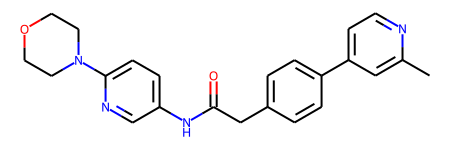

SMILES: Cc1cc(-c2ccc(CC(=O)Nc3ccc(N4CCOCC4)nc3)cc2)ccn1


--------------------------------------------------

Train index: 302496
RANK 1 PRECEDENT
REACTANT MATCH SCORE: 0.86
Reaction SMILES (Precedent): O=[C:14]([CH2:13][c:10]1[cH:9][cH:8][c:7](-[c:6]2[c:2]([CH3:1])[n:3][cH:4][o:5]2)[cH:12][cH:11]1)[OH:16]>>CC(N[C:14]([CH2:13][c:10]1[cH:9][cH:8][c:7](-[c:6]2[c:2]([CH3:1])[n:3][cH:4][o:5]2)[cH:12][cH:11]1)=[O:16])c1ccc(OCC(F)(F)F)cn1


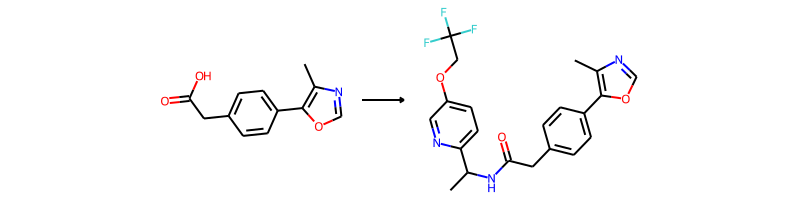

-> template: [C:2]-[C;H0;D3;+0:1](=[O;H0;D1;+0])-[OH;D1;+0:3]>>C-C(-N-[C;H0;D3;+0:1](-[C:2])=[O;H0;D1;+0:3])-c1:c:c:c(-O-C-C(-F)(-F)-F):c:n:1


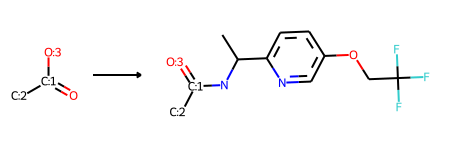

Product similarity 0.9213483146067416, overall 0.7923595505617977, smiles Cc1cc(-c2ccc(CC(=O)NC(C)c3ccc(OCC(F)(F)F)cn3)cc2)ccn1


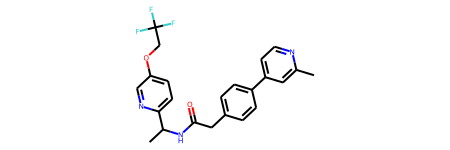

The proposed reaction is:


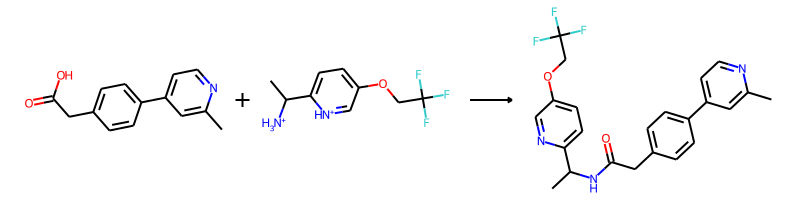

The reaction SMILES string is: Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1.CC([NH3+])c1ccc(OCC(F)(F)F)c[nH+]1>>Cc1cc(-c2ccc(CC(=O)NC(C)c3ccc(OCC(F)(F)F)cn3)cc2)ccn1


--------------------------------------------------

Train index: 264690
RANK 2 PRECEDENT
REACTANT MATCH SCORE: 0.7719298245614035
Reaction SMILES (Precedent): O=[C:17]([CH2:16][c:5]1[cH:4][c:3]([O:2][CH3:1])[c:8](-[c:9]2[cH:10][c:11]([CH3:15])[n:12][cH:13][cH:14]2)[cH:7][cH:6]1)[OH:19]>>CC(=O)N1CCN(c2ccc(N[C:17]([CH2:16][c:5]3[cH:4][c:3]([O:2][CH3:1])[c:8](-[c:9]4[cH:10][c:11]([CH3:15])[n:12][cH:13][cH:14]4)[cH:7][cH:6]3)=[O:19])nc2)CC1


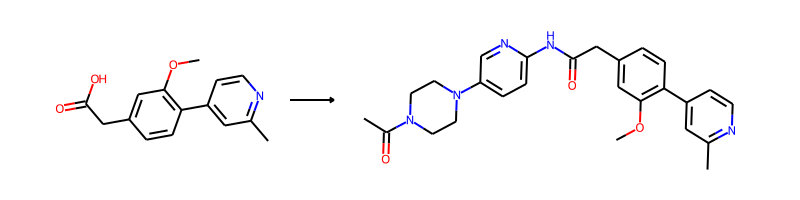

-> template: [C:2]-[C;H0;D3;+0:1](=[O;H0;D1;+0])-[OH;D1;+0:3]>>C-C(=O)-N1-C-C-N(-c2:c:c:c(-N-[C;H0;D3;+0:1](-[C:2])=[O;H0;D1;+0:3]):n:c:2)-C-C-1


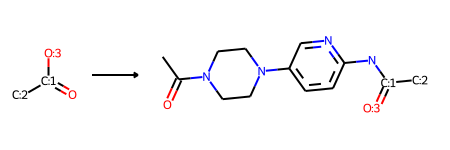

Product similarity 0.8712871287128713, overall 0.6725725204099356, smiles CC(=O)N1CCN(c2ccc(NC(=O)Cc3ccc(-c4ccnc(C)c4)cc3)nc2)CC1


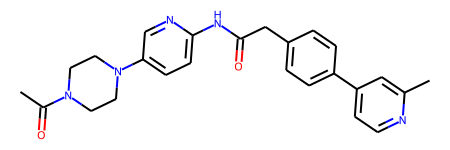

The proposed reaction is:


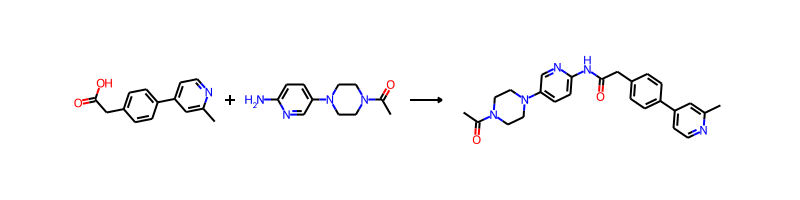

The reaction SMILES string is: Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1.CC(=O)N1CCN(c2ccc(N)nc2)CC1>>CC(=O)N1CCN(c2ccc(NC(=O)Cc3ccc(-c4ccnc(C)c4)cc3)nc2)CC1


--------------------------------------------------

Train index: 306410
RANK 3 PRECEDENT
REACTANT MATCH SCORE: 0.7719298245614035
Reaction SMILES (Precedent): O=[C:17]([CH2:16][c:5]1[cH:4][c:3]([C:1]#[N:2])[c:8](-[c:9]2[cH:10][c:11]([CH3:15])[n:12][cH:13][cH:14]2)[cH:7][cH:6]1)[OH:19]>>c1cnnc(-c2ccc(N[C:17]([CH2:16][c:5]3[cH:4][c:3]([C:1]#[N:2])[c:8](-[c:9]4[cH:10][c:11]([CH3:15])[n:12][cH:13][cH:14]4)[cH:7][cH:6]3)=[O:19])nc2)c1


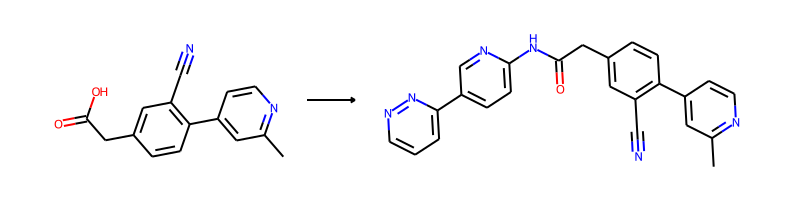

-> template: [C:1]-[C;H0;D3;+0:2](=[O;H0;D1;+0])-[OH;D1;+0:3]>>[C:1]-[C;H0;D3;+0:2](=[O;H0;D1;+0:3])-N-c1:c:c:c(-c2:c:c:c:n:n:2):c:n:1


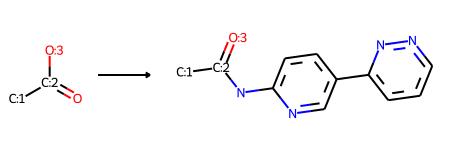

Product similarity 0.8617021276595744, overall 0.6651735722284434, smiles Cc1cc(-c2ccc(CC(=O)Nc3ccc(-c4cccnn4)cn3)cc2)ccn1


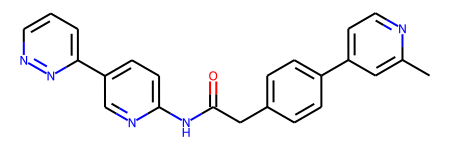

The proposed reaction is:


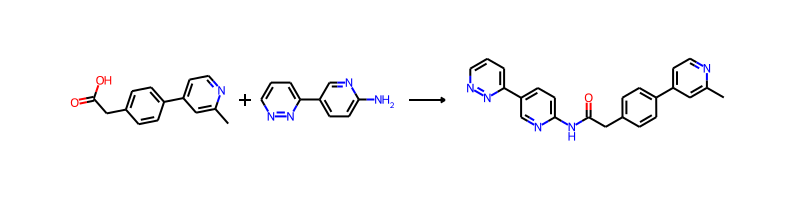

The reaction SMILES string is: Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1.Nc1ccc(-c2cccnn2)cn1>>Cc1cc(-c2ccc(CC(=O)Nc3ccc(-c4cccnn4)cn3)cc2)ccn1


--------------------------------------------------

Train index: 333719
RANK 4 PRECEDENT
REACTANT MATCH SCORE: 0.7719298245614035
Reaction SMILES (Precedent): O=[C:17]([CH2:16][c:5]1[cH:4][c:3]([C:1]#[N:2])[c:8](-[c:9]2[cH:10][c:11]([CH3:15])[n:12][cH:13][cH:14]2)[cH:7][cH:6]1)[OH:19]>>CC(=O)N1CCN(c2ccc(N[C:17]([CH2:16][c:5]3[cH:4][c:3]([C:1]#[N:2])[c:8](-[c:9]4[cH:10][c:11]([CH3:15])[n:12][cH:13][cH:14]4)[cH:7][cH:6]3)=[O:19])nc2)CC1


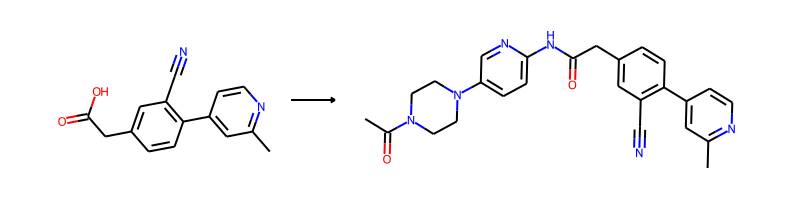

-> template: [C:2]-[C;H0;D3;+0:1](=[O;H0;D1;+0])-[OH;D1;+0:3]>>C-C(=O)-N1-C-C-N(-c2:c:c:c(-N-[C;H0;D3;+0:1](-[C:2])=[O;H0;D1;+0:3]):n:c:2)-C-C-1


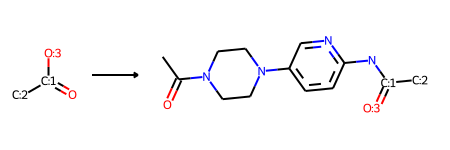

Product similarity 0.8712871287128713, overall 0.6725725204099356, smiles CC(=O)N1CCN(c2ccc(NC(=O)Cc3ccc(-c4ccnc(C)c4)cc3)nc2)CC1


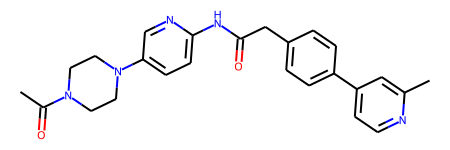

The proposed reaction is:


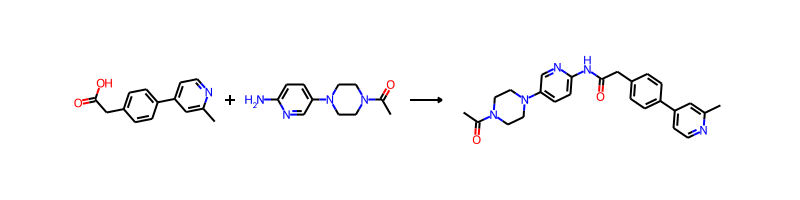

The reaction SMILES string is: Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1.CC(=O)N1CCN(c2ccc(N)nc2)CC1>>CC(=O)N1CCN(c2ccc(NC(=O)Cc3ccc(-c4ccnc(C)c4)cc3)nc2)CC1


--------------------------------------------------

Train index: 381926
RANK 5 PRECEDENT
REACTANT MATCH SCORE: 0.7222222222222222
Reaction SMILES (Precedent): O[C:23]([c:22]1[cH:21][cH:20][c:19](-[c:17]2[cH:16][cH:15][n:14][c:13]([CH3:12])[cH:18]2)[cH:27][cH:26]1)=[O:24]>>c1cnc2cc(N[C:23]([c:22]3[cH:21][cH:20][c:19](-[c:17]4[cH:16][cH:15][n:14][c:13]([CH3:12])[cH:18]4)[cH:27][cH:26]3)=[O:24])ccc2c1


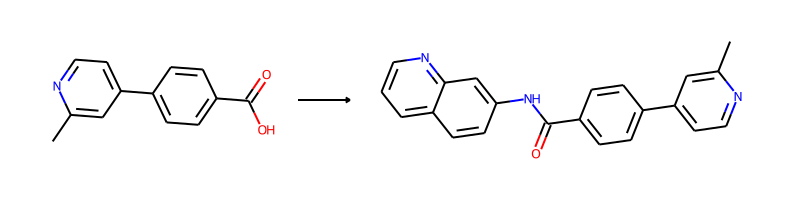

-> template: [O;D1;H0:1]=[C;H0;D3;+0:2](-[O;H1;D1;+0])-[c:3]>>[O;D1;H0:1]=[C;H0;D3;+0:2](-[c:3])-N-c1:c:c:c2:c:c:c:n:c:2:c:1


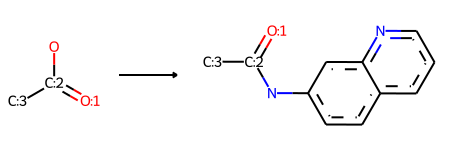

->No precursors could be generated!


--------------------------------------------------

Train index: 90971
RANK 6 PRECEDENT
REACTANT MATCH SCORE: 0.7222222222222222
Reaction SMILES (Precedent): O=[C:12]([c:11]1[cH:10][cH:9][c:8](-[c:6]2[cH:5][cH:4][n:3][c:2]([CH3:1])[cH:7]2)[cH:16][cH:15]1)[OH:14]>>O=S(=O)(c1ccc2cc(Br)ccc2c1)N1CCN([C:12]([c:11]2[cH:10][cH:9][c:8](-[c:6]3[cH:5][cH:4][n:3][c:2]([CH3:1])[cH:7]3)[cH:16][cH:15]2)=[O:14])CC1


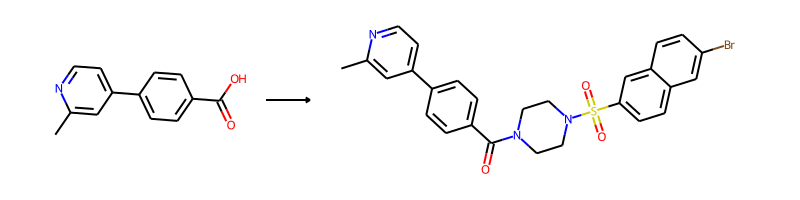

-> template: [O;H0;D1;+0]=[C;H0;D3;+0:1](-[OH;D1;+0:2])-[c:3]>>Br-c1:c:c:c2:c:c(-S(=O)(=O)-N3-C-C-N(-[C;H0;D3;+0:1](=[O;H0;D1;+0:2])-[c:3])-C-C-3):c:c:c:2:c:1


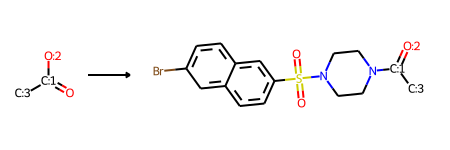

->No precursors could be generated!


--------------------------------------------------

Train index: 411665
RANK 7 PRECEDENT
REACTANT MATCH SCORE: 0.6785714285714286
Reaction SMILES (Precedent): O=[C:14]([CH2:13][c:10]1[cH:9][cH:8][c:7](-[c:2]2[n:1][cH:6][cH:5][cH:4][cH:3]2)[cH:12][cH:11]1)[OH:16]>>Fc1cccc(CN[C:14]([CH2:13][c:10]2[cH:9][cH:8][c:7](-[c:2]3[n:1][cH:6][cH:5][cH:4][cH:3]3)[cH:12][cH:11]2)=[O:16])c1


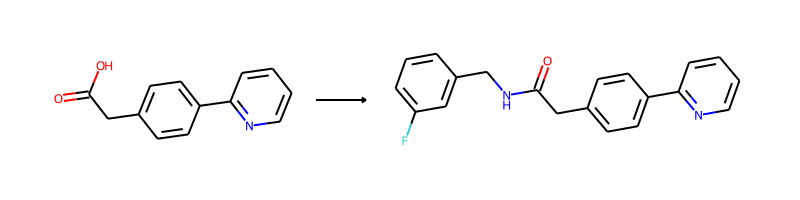

-> template: [C:2]-[C;H0;D3;+0:1](=[O;H0;D1;+0])-[OH;D1;+0:3]>>F-c1:c:c:c:c(-C-N-[C;H0;D3;+0:1](-[C:2])=[O;H0;D1;+0:3]):c:1


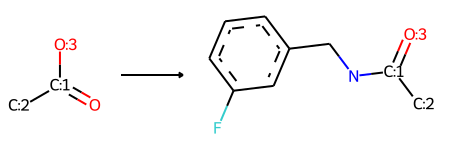

Product similarity 0.775, overall 0.5258928571428572, smiles Cc1cc(-c2ccc(CC(=O)NCc3cccc(F)c3)cc2)ccn1


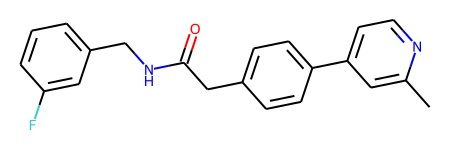

The proposed reaction is:


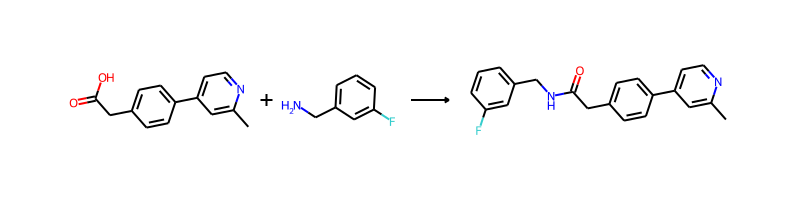

The reaction SMILES string is: Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1.NCc1cccc(F)c1>>Cc1cc(-c2ccc(CC(=O)NCc3cccc(F)c3)cc2)ccn1


--------------------------------------------------

Train index: 93792
RANK 8 PRECEDENT
REACTANT MATCH SCORE: 0.6666666666666666
Reaction SMILES (Precedent): O=[C:17]([CH2:16][c:3]1[c:2]([F:1])[cH:7][c:6](-[c:8]2[cH:9][c:10]([CH3:14])[n:11][cH:12][cH:13]2)[c:5]([CH3:15])[cH:4]1)[OH:19]>>CC(=O)N1CCN(c2ccc(N[C:17]([CH2:16][c:3]3[c:2]([F:1])[cH:7][c:6](-[c:8]4[cH:9][c:10]([CH3:14])[n:11][cH:12][cH:13]4)[c:5]([CH3:15])[cH:4]3)=[O:19])nc2)CC1


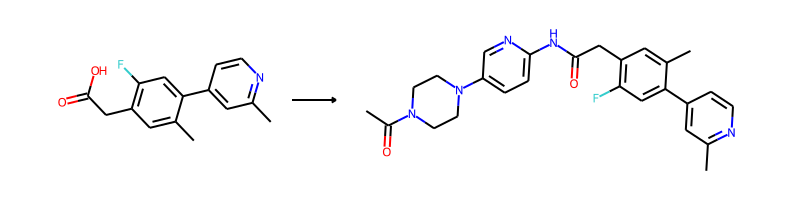

-> template: [C:2]-[C;H0;D3;+0:1](=[O;H0;D1;+0])-[OH;D1;+0:3]>>C-C(=O)-N1-C-C-N(-c2:c:c:c(-N-[C;H0;D3;+0:1](-[C:2])=[O;H0;D1;+0:3]):n:c:2)-C-C-1


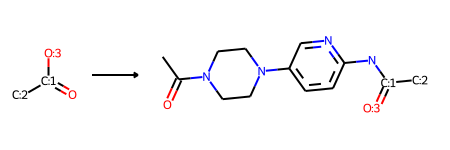

Product similarity 0.8076923076923077, overall 0.5384615384615384, smiles CC(=O)N1CCN(c2ccc(NC(=O)Cc3ccc(-c4ccnc(C)c4)cc3)nc2)CC1


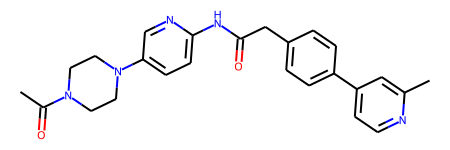

The proposed reaction is:


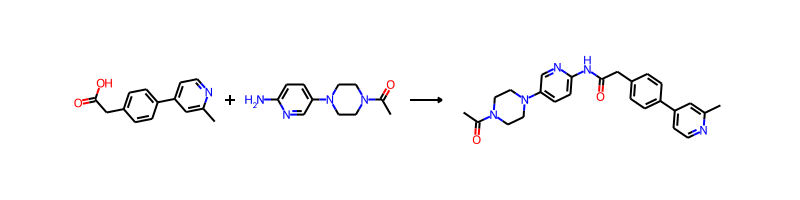

The reaction SMILES string is: Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1.CC(=O)N1CCN(c2ccc(N)nc2)CC1>>CC(=O)N1CCN(c2ccc(NC(=O)Cc3ccc(-c4ccnc(C)c4)cc3)nc2)CC1


(2,
 'Cc1cc(-c2ccc(CC(=O)O)cc2)ccn1.CC(=O)N1CCN(c2ccc(N)nc2)CC1>>CC(=O)N1CCN(c2ccc(NC(=O)Cc3ccc(-c4ccnc(C)c4)cc3)nc2)CC1',
 0.6090909090909091,
 0.43010752688172044)

In [24]:
do_one_v4_woFastFilter (41)

Mol 28140, reactant input:


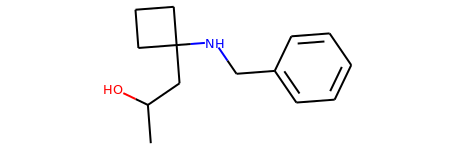

Desired Reaction:


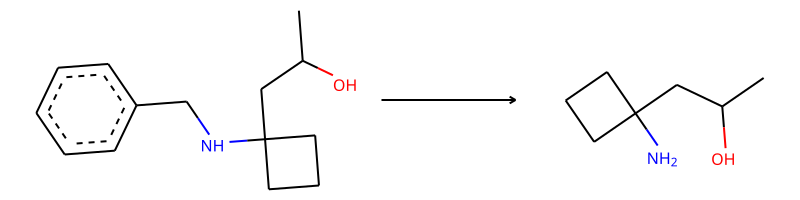

Desired Product:


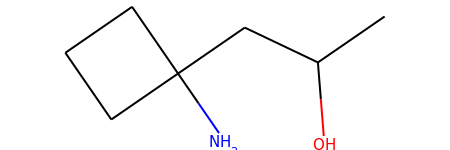



--------------------------------------------------

Train index: 44148
RANK 1 PRECEDENT
REACTANT MATCH SCORE: 0.6862745098039216


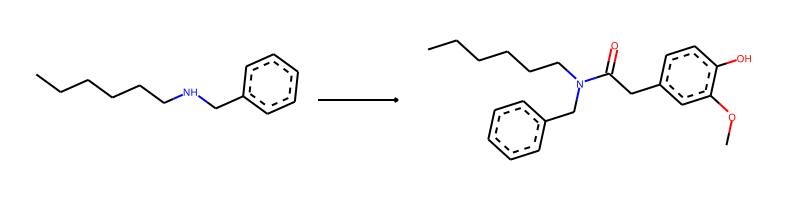

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>C-O-c1:c:c(-C-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]):c:c:c:1-O


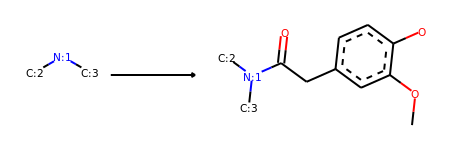

Product similarity 0.8095238095238095, overall 0.5555555555555556, smiles COc1cc(CC(=O)N(Cc2ccccc2)C2(CC(C)O)CCC2)ccc1O


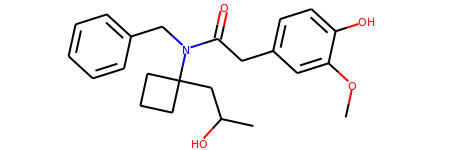

The proposed reaction is:


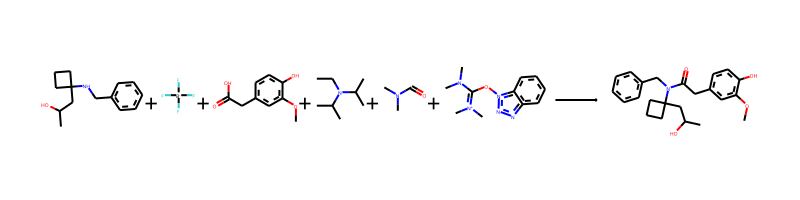

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.F[B-](F)(F)F.COc1cc(CC(=O)O)ccc1O.CCN(C(C)C)C(C)C.CN(C)C=O.CN(C)C(On1nnc2ccccc21)=[N+](C)C>>COc1cc(CC(=O)N(Cc2ccccc2)C2(CC(C)O)CCC2)ccc1O
The fast filter score is 0.938307524


--------------------------------------------------

Train index: 195623
RANK 2 PRECEDENT
REACTANT MATCH SCORE: 0.6792452830188679


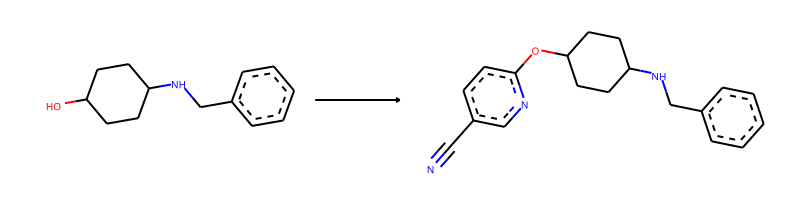

-> template: [C:2]-[OH;D1;+0:1]>>N#C-c1:c:c:c(-[O;H0;D2;+0:1]-[C:2]):n:c:1


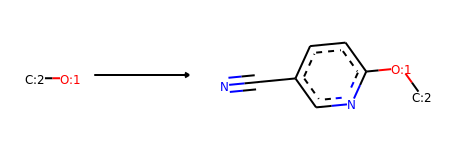

Product similarity 0.7792207792207793, overall 0.529282038716001, smiles CC(CC1(NCc2ccccc2)CCC1)Oc1ccc(C#N)cn1


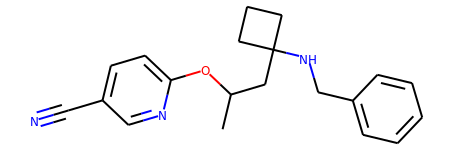

The proposed reaction is:


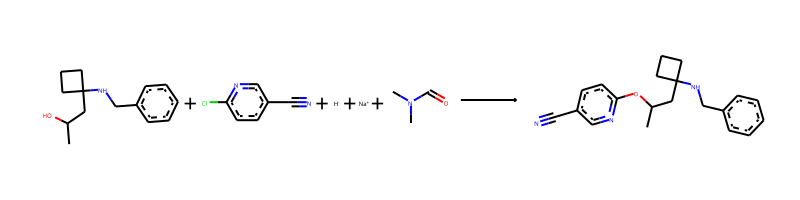

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.N#Cc1ccc(Cl)nc1.[H-].[Na+].CN(C)C=O>>CC(CC1(NCc2ccccc2)CCC1)Oc1ccc(C#N)cn1
The fast filter score is 0.976778507


--------------------------------------------------

Train index: 259678
RANK 3 PRECEDENT
REACTANT MATCH SCORE: 0.6727272727272727


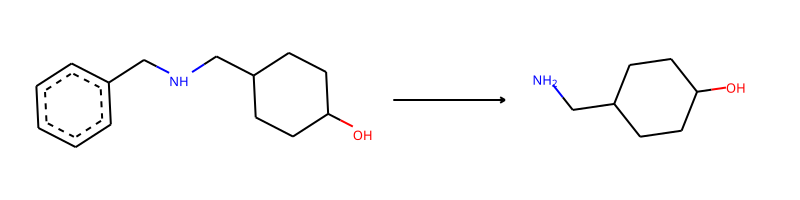

-> template: [C:1]-[NH;D2;+0:2]-[C;H2;D2;+0]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[C:1]-[NH2;D1;+0:2]


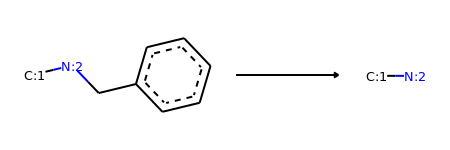

Product similarity 0.5, overall 0.33636363636363636, smiles CC(O)CC1(N)CCC1


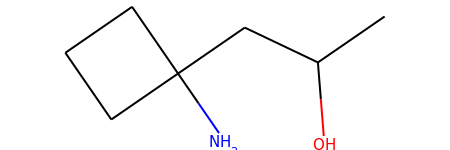

The proposed reaction is:


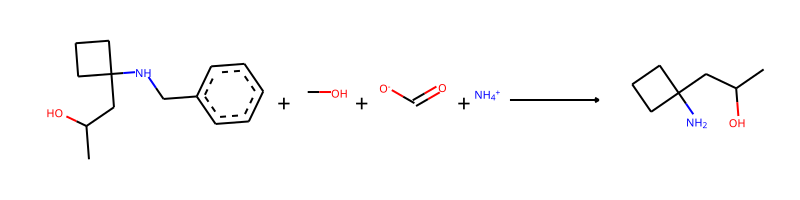

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CO.O=C[O-].[NH4+]>>CC(O)CC1(N)CCC1
The fast filter score is 0.444860429


--------------------------------------------------

Train index: 414278
RANK 4 PRECEDENT
REACTANT MATCH SCORE: 0.6615384615384615


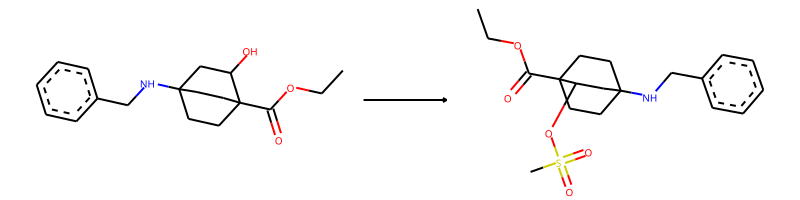

-> template: [C:2]-[OH;D1;+0:1]>>C-S(=O)(=O)-[O;H0;D2;+0:1]-[C:2]


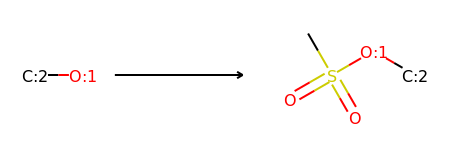

Product similarity 0.7066666666666667, overall 0.4674871794871795, smiles CC(CC1(NCc2ccccc2)CCC1)OS(C)(=O)=O


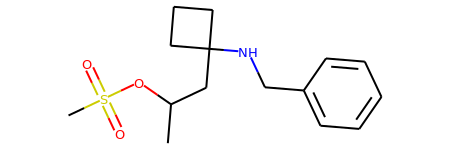

The proposed reaction is:


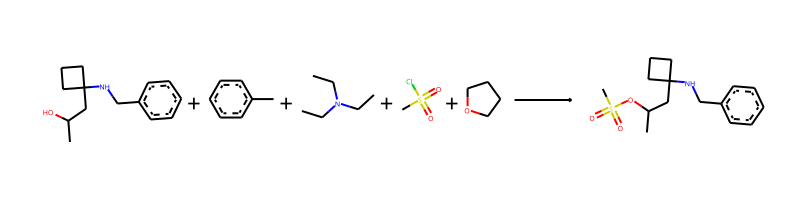

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.Cc1ccccc1.CCN(CC)CC.CS(=O)(=O)Cl.C1CCOC1>>CC(CC1(NCc2ccccc2)CCC1)OS(C)(=O)=O
The fast filter score is 0.979436636


--------------------------------------------------

Train index: 41082
RANK 5 PRECEDENT
REACTANT MATCH SCORE: 0.6530612244897959


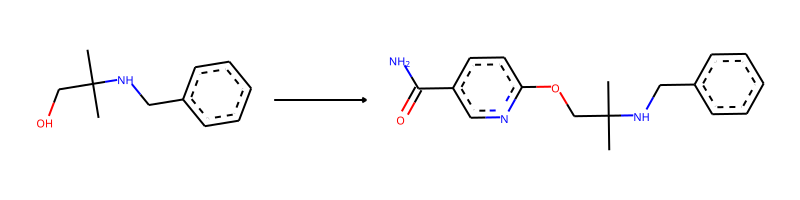

-> template: [C:2]-[OH;D1;+0:1]>>N-C(=O)-c1:c:c:c(-[O;H0;D2;+0:1]-[C:2]):n:c:1


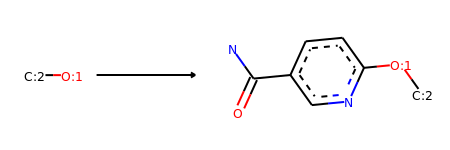

Product similarity 0.75, overall 0.4897959183673469, smiles CC(CC1(NCc2ccccc2)CCC1)Oc1ccc(C(N)=O)cn1


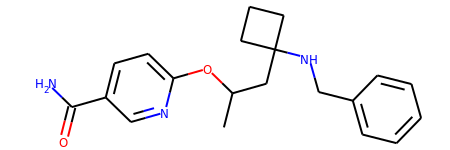

The proposed reaction is:


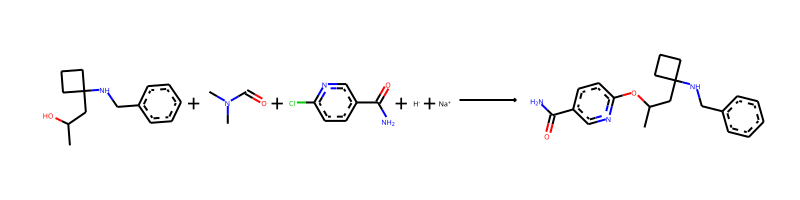

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CN(C)C=O.NC(=O)c1ccc(Cl)nc1.[H-].[Na+]>>CC(CC1(NCc2ccccc2)CCC1)Oc1ccc(C(N)=O)cn1
The fast filter score is 0.987702191


--------------------------------------------------

Train index: 405138
RANK 6 PRECEDENT
REACTANT MATCH SCORE: 0.6415094339622641


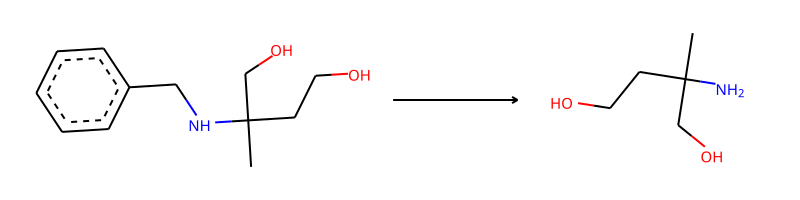

-> template: [C:1]-[NH;D2;+0:2]-[C;H2;D2;+0]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[C:1]-[NH2;D1;+0:2]


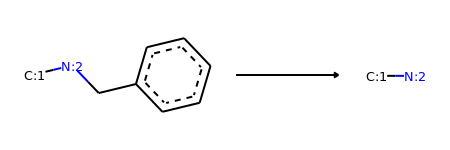

Product similarity 0.3870967741935484, overall 0.24832623250152158, smiles CC(O)CC1(N)CCC1


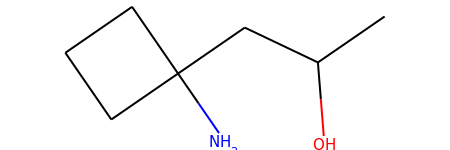

The proposed reaction is:


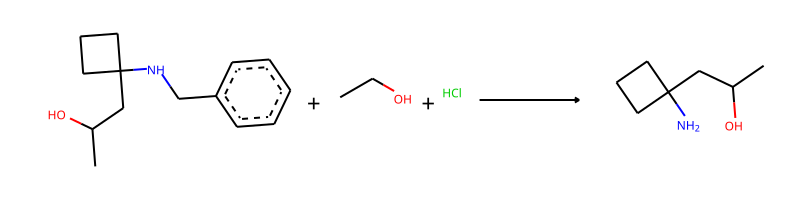

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCO.Cl>>CC(O)CC1(N)CCC1
The fast filter score is 0.408845782


--------------------------------------------------

Train index: 188169
RANK 7 PRECEDENT
REACTANT MATCH SCORE: 0.625


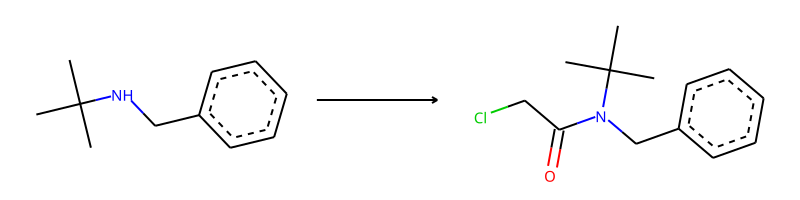

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>Cl-C-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]


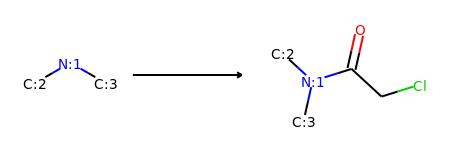

Product similarity 0.6896551724137931, overall 0.4310344827586207, smiles CC(O)CC1(N(Cc2ccccc2)C(=O)CCl)CCC1


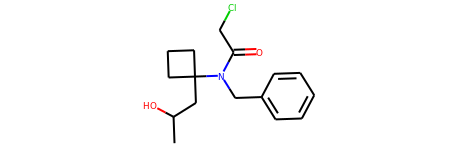

The proposed reaction is:


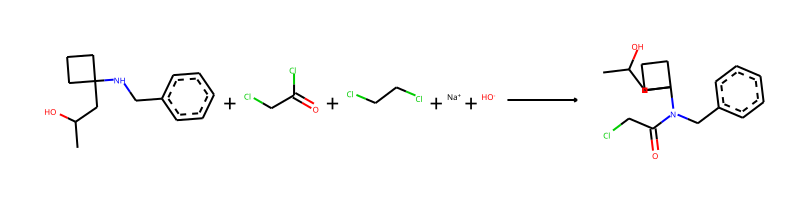

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=C(Cl)CCl.ClCCCl.[Na+].[OH-]>>CC(O)CC1(N(Cc2ccccc2)C(=O)CCl)CCC1
The fast filter score is 0.932059884


--------------------------------------------------

Train index: 412874
RANK 8 PRECEDENT
REACTANT MATCH SCORE: 0.625


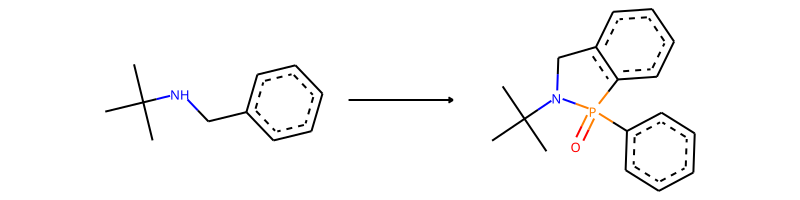

-> template: [C:2]-[NH;D2;+0:1]-[C:3]-[c:4]:[cH;D2;+0:5]:[c:6]>>O=P1(-c2:c:c:c:c:c:2)-[N;H0;D3;+0:1](-[C:2])-[C:3]-[c:4]:[c;H0;D3;+0:5]-1:[c:6]


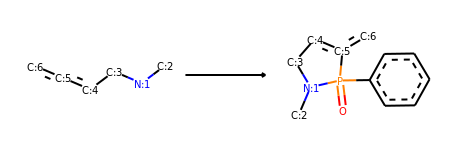

Product similarity 0.7464788732394366, overall 0.4665492957746479, smiles CC(O)CC1(N2Cc3ccccc3P2(=O)c2ccccc2)CCC1


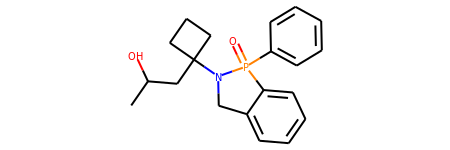

The proposed reaction is:


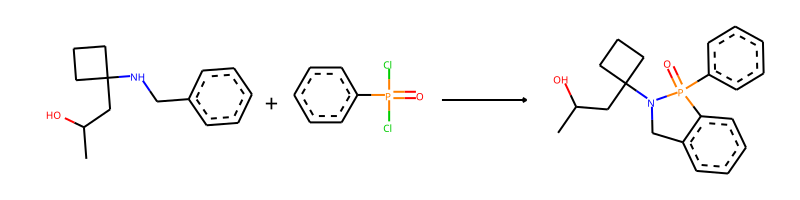

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=P(Cl)(Cl)c1ccccc1>>CC(O)CC1(N2Cc3ccccc3P2(=O)c2ccccc2)CCC1
The fast filter score is 0.928401291


--------------------------------------------------

Train index: 157552
RANK 9 PRECEDENT
REACTANT MATCH SCORE: 0.625


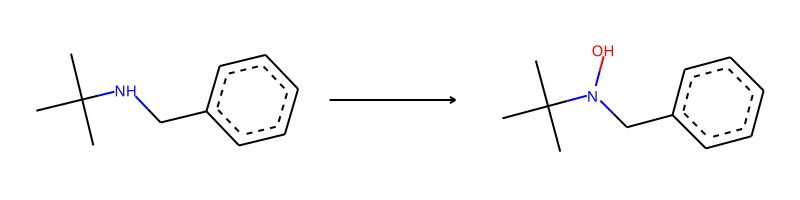

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>O-[N;H0;D3;+0:1](-[C:2])-[C:3]


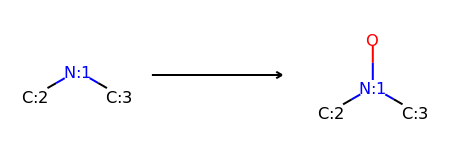

Product similarity 0.64, overall 0.4, smiles CC(O)CC1(N(O)Cc2ccccc2)CCC1


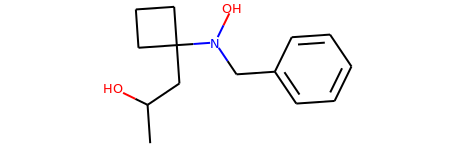

The proposed reaction is:


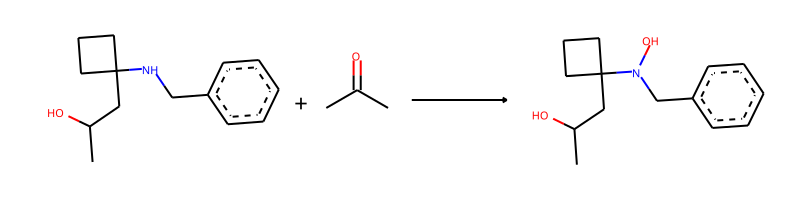

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CC(C)=O>>CC(O)CC1(N(O)Cc2ccccc2)CCC1
The fast filter score is 0.0599911511


--------------------------------------------------

Train index: 160120
RANK 10 PRECEDENT
REACTANT MATCH SCORE: 0.625


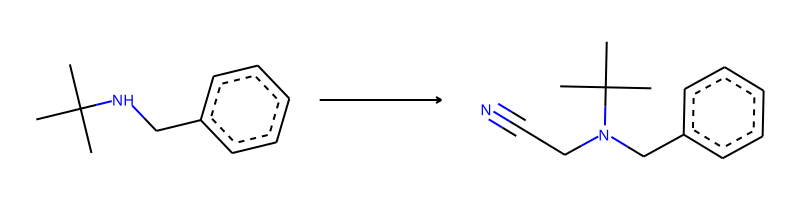

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>N#C-C-[N;H0;D3;+0:1](-[C:2])-[C:3]


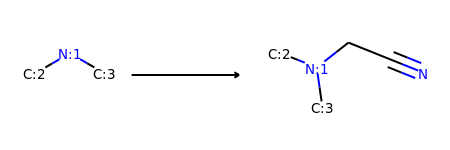

Product similarity 0.6785714285714286, overall 0.4241071428571429, smiles CC(O)CC1(N(CC#N)Cc2ccccc2)CCC1


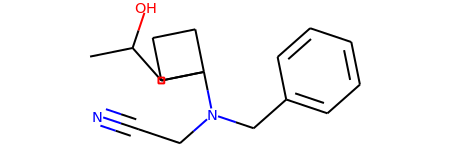

The proposed reaction is:


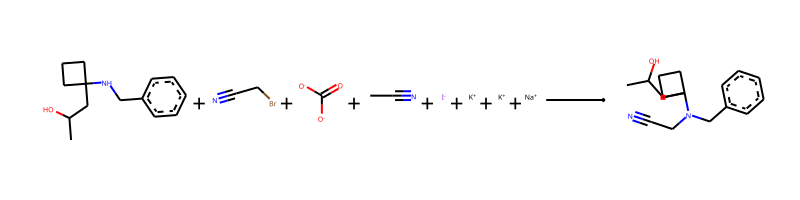

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.N#CCBr.O=C([O-])[O-].CC#N.[I-].[K+].[K+].[Na+]>>CC(O)CC1(N(CC#N)Cc2ccccc2)CCC1
The fast filter score is 0.672284544


--------------------------------------------------

Train index: 436228
RANK 11 PRECEDENT
REACTANT MATCH SCORE: 0.625


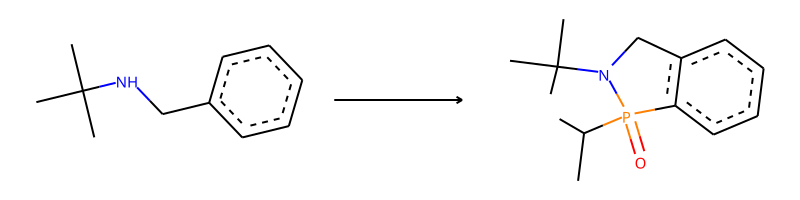

-> template: [C:2]-[NH;D2;+0:1]-[C:3]-[c:4]:[cH;D2;+0:5]:[c:6]>>C-C(-C)-P1(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]-[c:4]:[c;H0;D3;+0:5]-1:[c:6]


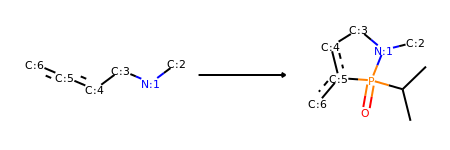

Product similarity 0.7, overall 0.4375, smiles CC(O)CC1(N2Cc3ccccc3P2(=O)C(C)C)CCC1


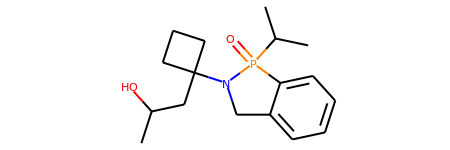

The proposed reaction is:


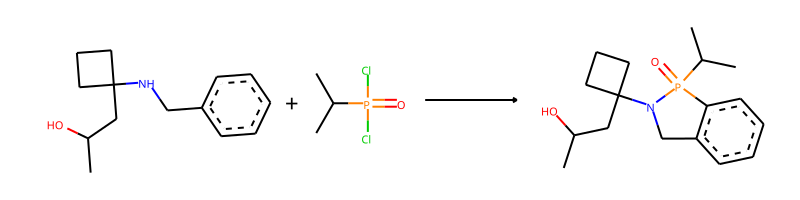

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CC(C)P(=O)(Cl)Cl>>CC(O)CC1(N2Cc3ccccc3P2(=O)C(C)C)CCC1
The fast filter score is 0.899341583


--------------------------------------------------

Train index: 310815
RANK 12 PRECEDENT
REACTANT MATCH SCORE: 0.6122448979591837


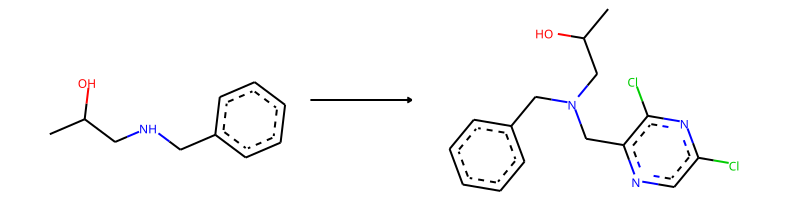

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>Cl-c1:c:n:c(-C-[N;H0;D3;+0:1](-[C:2])-[C:3]):c(-Cl):n:1


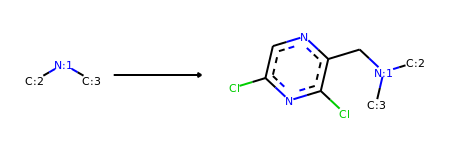

Product similarity 0.7432432432432432, overall 0.4550468836183122, smiles CC(O)CC1(N(Cc2ccccc2)Cc2ncc(Cl)nc2Cl)CCC1


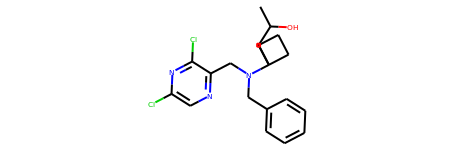

The proposed reaction is:


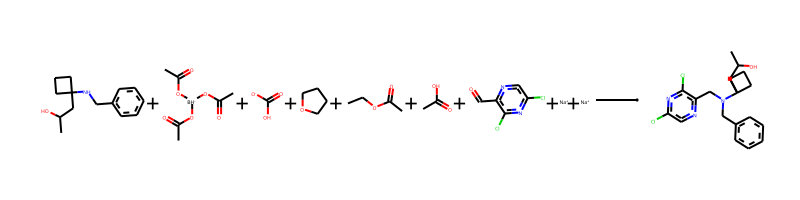

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CC(=O)O[BH-](OC(C)=O)OC(C)=O.O=C([O-])O.C1CCOC1.CCOC(C)=O.CC(=O)O.O=Cc1ncc(Cl)nc1Cl.[Na+].[Na+]>>CC(O)CC1(N(Cc2ccccc2)Cc2ncc(Cl)nc2Cl)CCC1
The fast filter score is 0.972766757


--------------------------------------------------

Train index: 435932
RANK 13 PRECEDENT
REACTANT MATCH SCORE: 0.6071428571428571


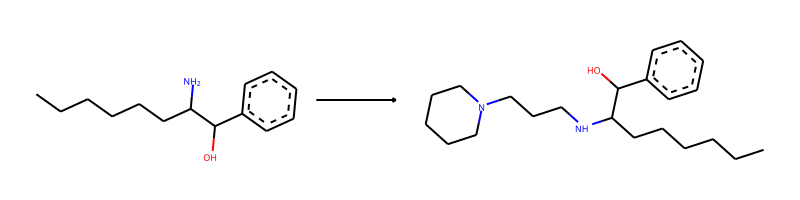

-> template: [C:1]-[NH2;D1;+0:2]>>[C:1]-[NH;D2;+0:2]-C-C-C-N1-C-C-C-C-C-1


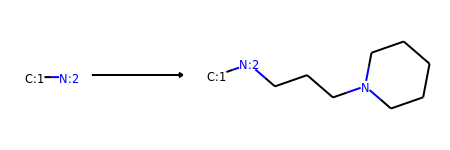

->No precursors could be generated!


--------------------------------------------------

Train index: 68435
RANK 14 PRECEDENT
REACTANT MATCH SCORE: 0.6037735849056604


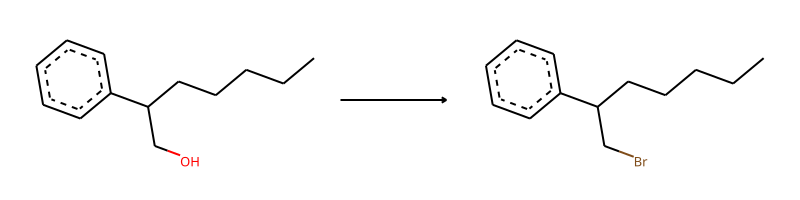

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Br-[CH2;D2;+0:1]-[C:2]


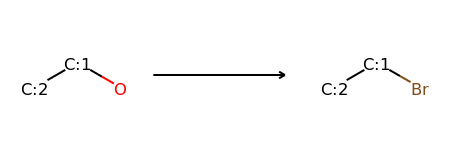

->No precursors could be generated!


--------------------------------------------------

Train index: 403695
RANK 15 PRECEDENT
REACTANT MATCH SCORE: 0.6


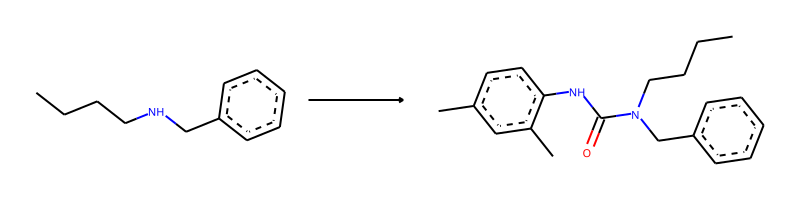

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>C-c1:c:c:c(-N-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]):c(-C):c:1


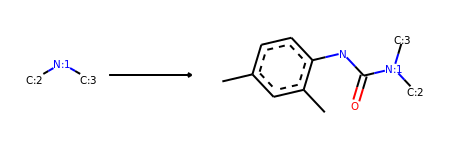

Product similarity 0.7948717948717948, overall 0.4769230769230769, smiles Cc1ccc(NC(=O)N(Cc2ccccc2)C2(CC(C)O)CCC2)c(C)c1


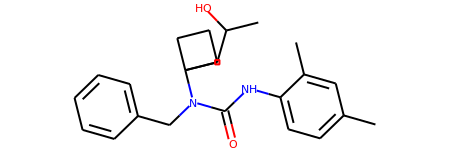

The proposed reaction is:


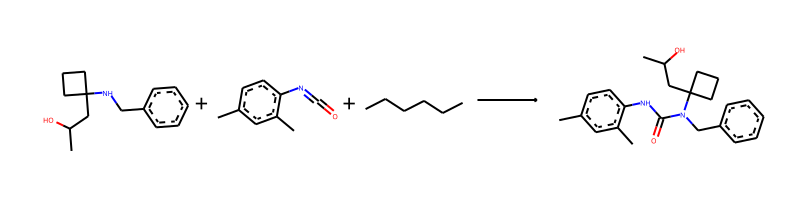

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.Cc1ccc(N=C=O)c(C)c1.CCCCCC>>Cc1ccc(NC(=O)N(Cc2ccccc2)C2(CC(C)O)CCC2)c(C)c1
The fast filter score is 0.995186925


--------------------------------------------------

Train index: 2657
RANK 16 PRECEDENT
REACTANT MATCH SCORE: 0.6


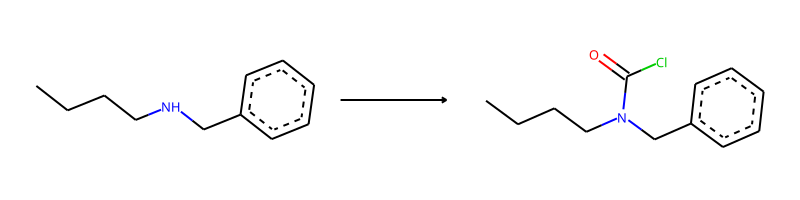

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>Cl-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]


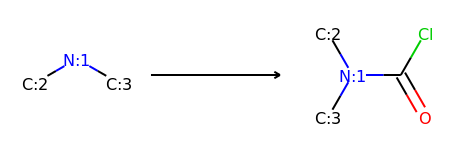

Product similarity 0.7090909090909091, overall 0.4254545454545455, smiles CC(O)CC1(N(Cc2ccccc2)C(=O)Cl)CCC1


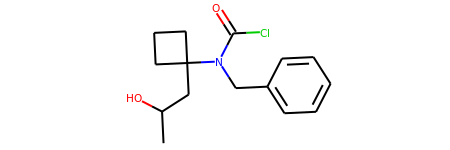

The proposed reaction is:


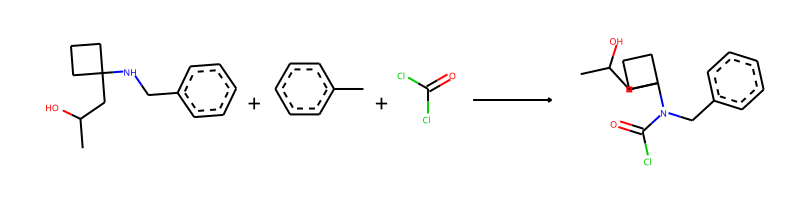

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.Cc1ccccc1.O=C(Cl)Cl>>CC(O)CC1(N(Cc2ccccc2)C(=O)Cl)CCC1
The fast filter score is 0.94858551


--------------------------------------------------

Train index: 100778
RANK 17 PRECEDENT
REACTANT MATCH SCORE: 0.6


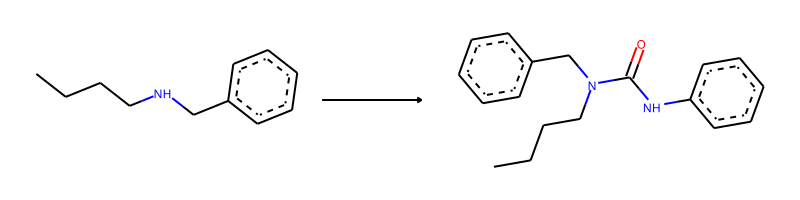

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>O=C(-N-c1:c:c:c:c:c:1)-[N;H0;D3;+0:1](-[C:2])-[C:3]


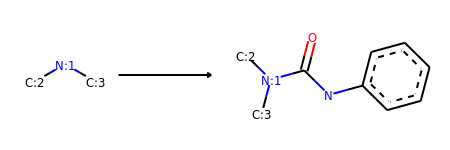

Product similarity 0.7837837837837838, overall 0.47027027027027024, smiles CC(O)CC1(N(Cc2ccccc2)C(=O)Nc2ccccc2)CCC1


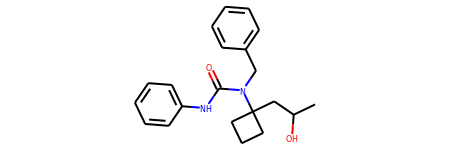

The proposed reaction is:


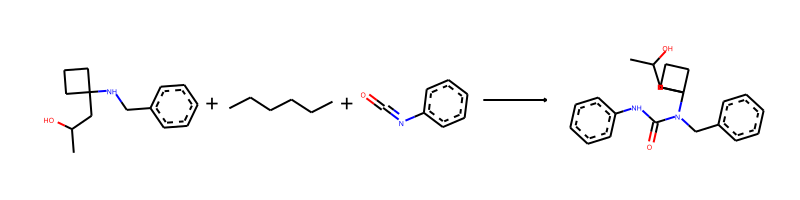

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCCCCC.O=C=Nc1ccccc1>>CC(O)CC1(N(Cc2ccccc2)C(=O)Nc2ccccc2)CCC1
The fast filter score is 0.877785265


--------------------------------------------------

Train index: 159380
RANK 18 PRECEDENT
REACTANT MATCH SCORE: 0.5964912280701754


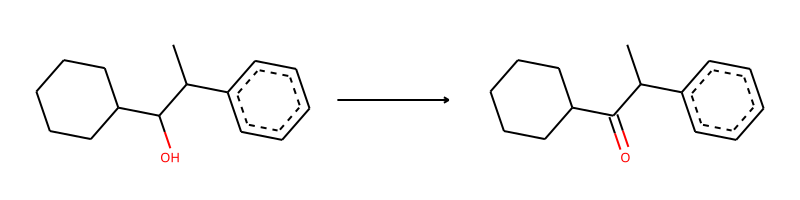

-> template: [C:1]-[CH;D3;+0:2](-[C:3])-[OH;D1;+0:4]>>[C:1]-[C;H0;D3;+0:2](-[C:3])=[O;H0;D1;+0:4]


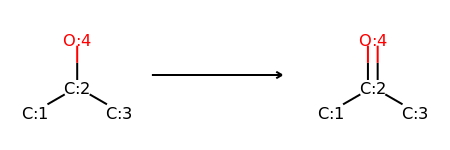

Product similarity 0.5964912280701754, overall 0.355801785164666, smiles CC(=O)CC1(NCc2ccccc2)CCC1


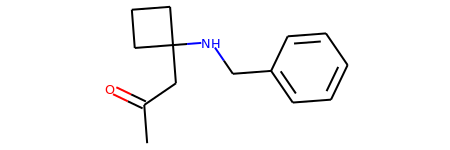

The proposed reaction is:


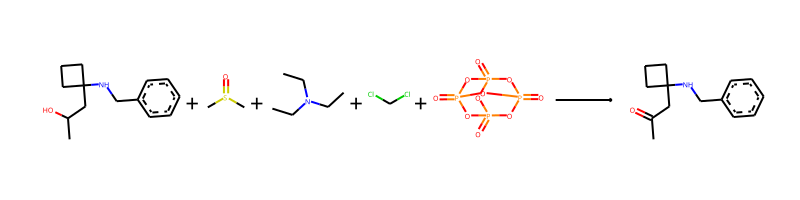

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CS(C)=O.CCN(CC)CC.ClCCl.O=P12OP3(=O)OP(=O)(O1)OP(=O)(O2)O3>>CC(=O)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.187242836


--------------------------------------------------

Train index: 83042
RANK 19 PRECEDENT
REACTANT MATCH SCORE: 0.5961538461538461


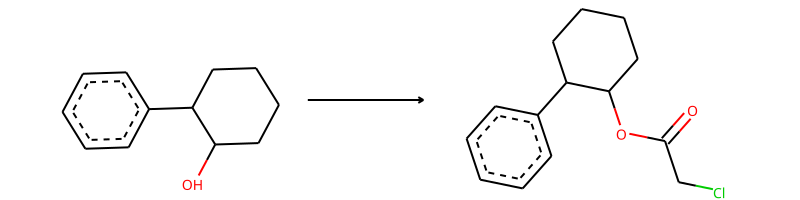

-> template: [C:2]-[OH;D1;+0:1]>>Cl-C-C(=O)-[O;H0;D2;+0:1]-[C:2]


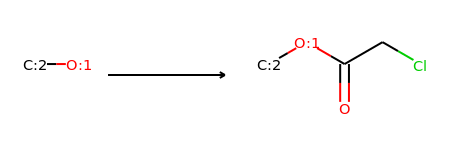

Product similarity 0.6666666666666666, overall 0.3974358974358974, smiles CC(CC1(NCc2ccccc2)CCC1)OC(=O)CCl


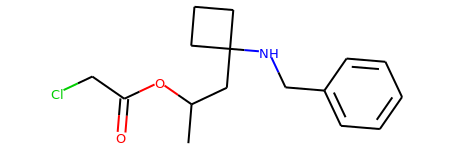

The proposed reaction is:


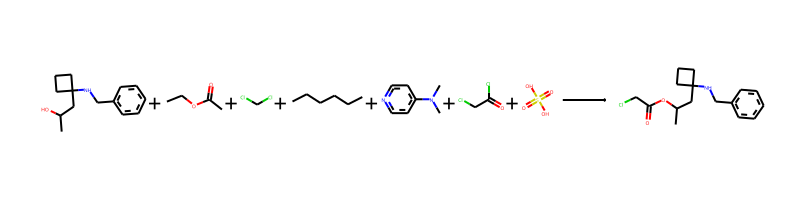

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCOC(C)=O.ClCCl.CCCCCC.CN(C)c1ccncc1.O=C(Cl)CCl.O=S(=O)(O)O>>CC(CC1(NCc2ccccc2)CCC1)OC(=O)CCl
The fast filter score is 0.00603616238


--------------------------------------------------

Train index: 198668
RANK 20 PRECEDENT
REACTANT MATCH SCORE: 0.5961538461538461


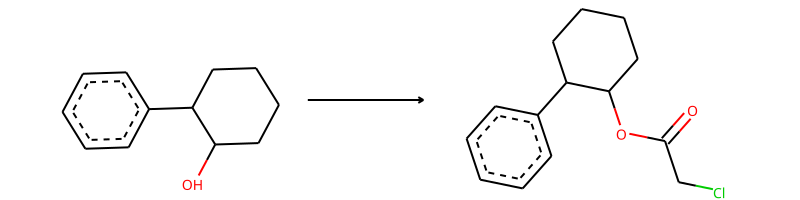

-> template: [C:2]-[OH;D1;+0:1]>>Cl-C-C(=O)-[O;H0;D2;+0:1]-[C:2]


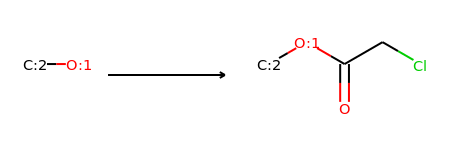

Product similarity 0.6666666666666666, overall 0.3974358974358974, smiles CC(CC1(NCc2ccccc2)CCC1)OC(=O)CCl


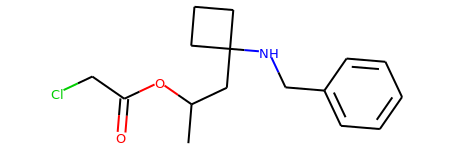

The proposed reaction is:


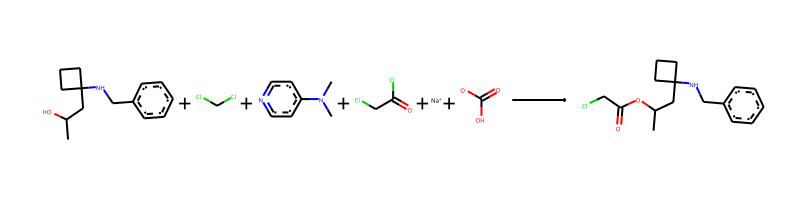

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.ClCCl.CN(C)c1ccncc1.O=C(Cl)CCl.[Na+].O=C([O-])O>>CC(CC1(NCc2ccccc2)CCC1)OC(=O)CCl
The fast filter score is 0.00129783154


--------------------------------------------------

Train index: 329878
RANK 21 PRECEDENT
REACTANT MATCH SCORE: 0.5961538461538461


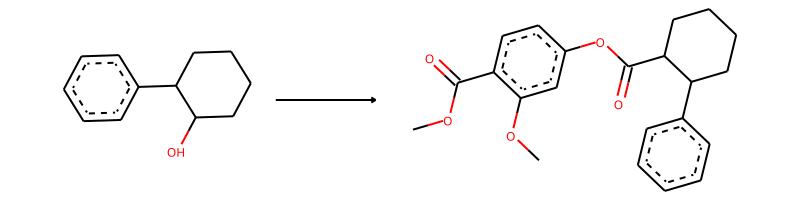

-> template: [C:2]-[CH;D3;+0:1](-[C:3])-[O;H1;D1;+0]>>C-O-C(=O)-c1:c:c:c(-O-C(=O)-[CH;D3;+0:1](-[C:2])-[C:3]):c:c:1-O-C


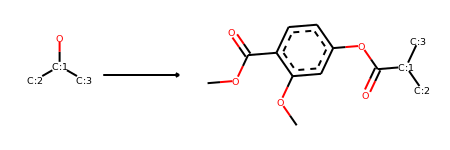

Product similarity 0.7692307692307693, overall 0.45857988165680474, smiles COC(=O)c1ccc(OC(=O)C(C)CC2(NCc3ccccc3)CCC2)cc1OC


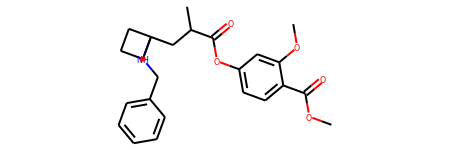

The proposed reaction is:


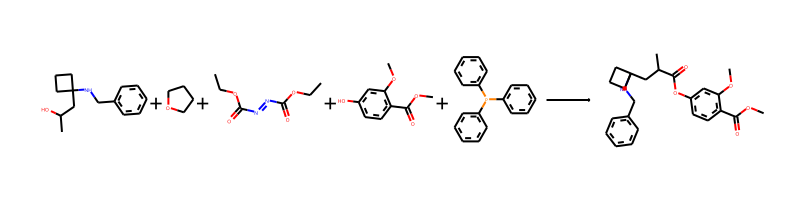

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C1CCOC1.CCOC(=O)N=NC(=O)OCC.COC(=O)c1ccc(O)cc1OC.c1ccc(P(c2ccccc2)c2ccccc2)cc1>>COC(=O)c1ccc(OC(=O)C(C)CC2(NCc3ccccc3)CCC2)cc1OC
The fast filter score is 0.998704314


--------------------------------------------------

Train index: 153775
RANK 22 PRECEDENT
REACTANT MATCH SCORE: 0.5961538461538461


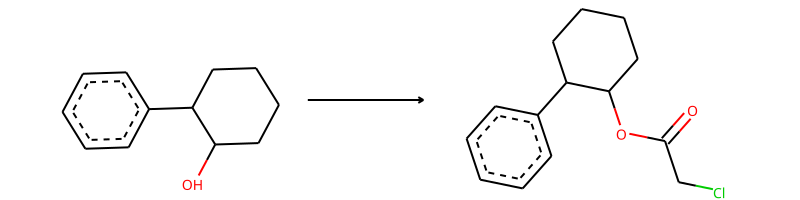

-> template: [C:2]-[OH;D1;+0:1]>>Cl-C-C(=O)-[O;H0;D2;+0:1]-[C:2]


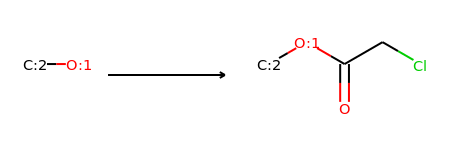

Product similarity 0.6666666666666666, overall 0.3974358974358974, smiles CC(CC1(NCc2ccccc2)CCC1)OC(=O)CCl


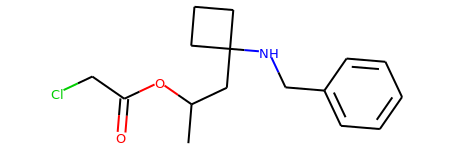

The proposed reaction is:


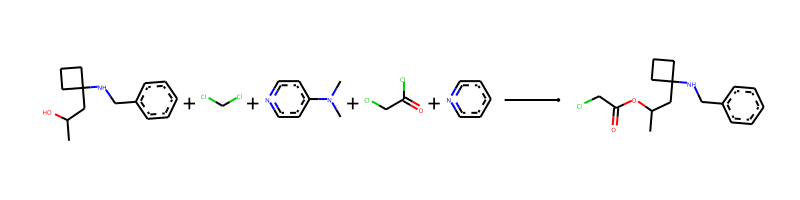

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.ClCCl.CN(C)c1ccncc1.O=C(Cl)CCl.c1ccncc1>>CC(CC1(NCc2ccccc2)CCC1)OC(=O)CCl
The fast filter score is 0.00649690628


--------------------------------------------------

Train index: 36614
RANK 23 PRECEDENT
REACTANT MATCH SCORE: 0.5932203389830508


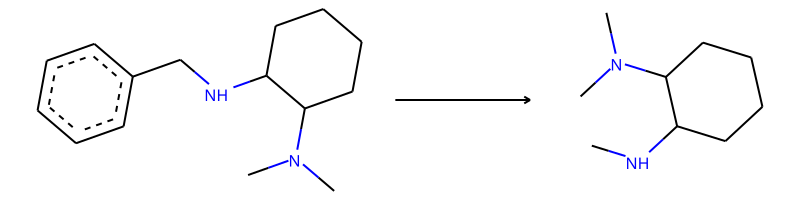

-> template: [#7:1]-[CH2;D2;+0:2]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[#7:1]-[CH3;D1;+0:2]


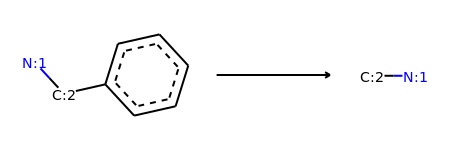

Product similarity 0.4, overall 0.23728813559322035, smiles CNC1(CC(C)O)CCC1


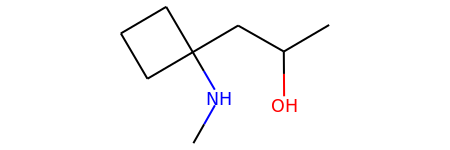

The proposed reaction is:


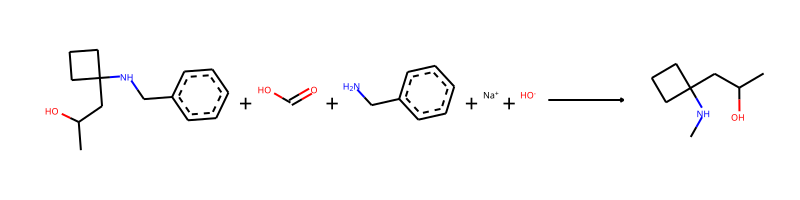

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=CO.NCc1ccccc1.[Na+].[OH-]>>CNC1(CC(C)O)CCC1
The fast filter score is 0.156469792


--------------------------------------------------

Train index: 80558
RANK 24 PRECEDENT
REACTANT MATCH SCORE: 0.5892857142857143


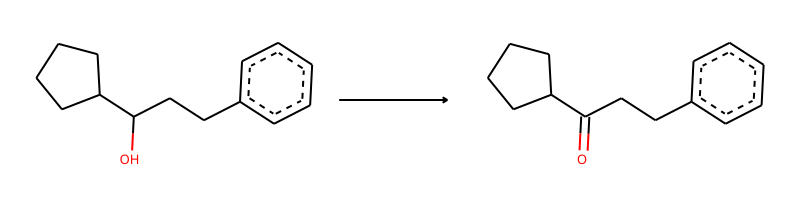

-> template: [C:1]-[CH;D3;+0:2](-[C:3])-[OH;D1;+0:4]>>[C:1]-[C;H0;D3;+0:2](-[C:3])=[O;H0;D1;+0:4]


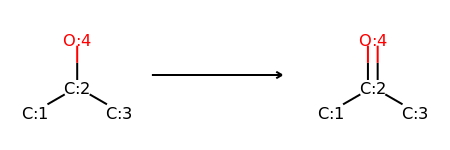

Product similarity 0.5892857142857143, overall 0.3472576530612245, smiles CC(=O)CC1(NCc2ccccc2)CCC1


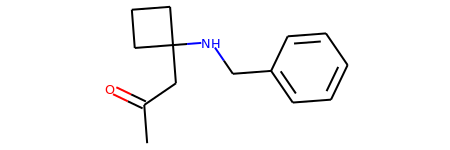

The proposed reaction is:


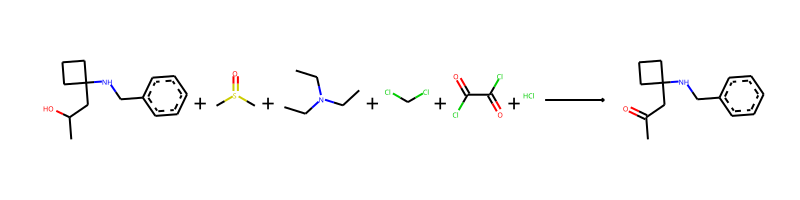

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CS(C)=O.CCN(CC)CC.ClCCl.O=C(Cl)C(=O)Cl.Cl>>CC(=O)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.164829433


--------------------------------------------------

Train index: 39490
RANK 25 PRECEDENT
REACTANT MATCH SCORE: 0.5892857142857143


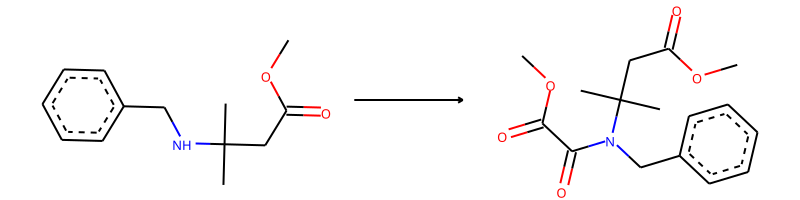

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>C-O-C(=O)-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]


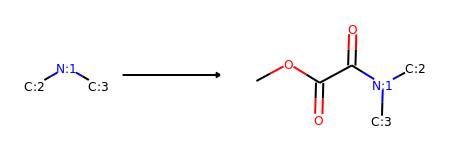

Product similarity 0.676056338028169, overall 0.3983903420523139, smiles COC(=O)C(=O)N(Cc1ccccc1)C1(CC(C)O)CCC1


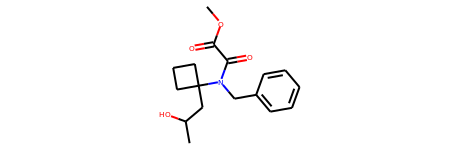

The proposed reaction is:


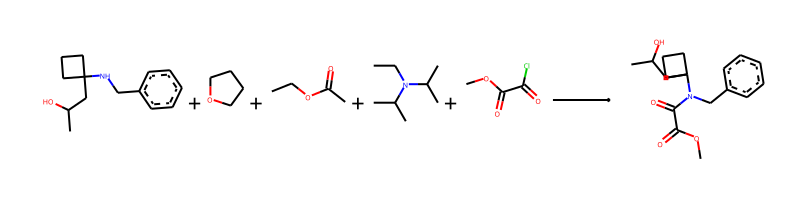

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C1CCOC1.CCOC(C)=O.CCN(C(C)C)C(C)C.COC(=O)C(=O)Cl>>COC(=O)C(=O)N(Cc1ccccc1)C1(CC(C)O)CCC1
The fast filter score is 0.994662106


--------------------------------------------------

Train index: 206404
RANK 26 PRECEDENT
REACTANT MATCH SCORE: 0.5892857142857143


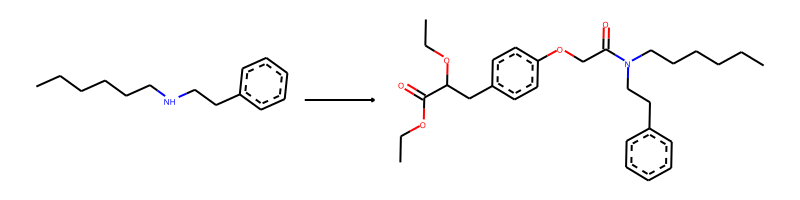

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>C-C-O-C(-C-c1:c:c:c(-O-C-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]):c:c:1)-C(=O)-O-C-C


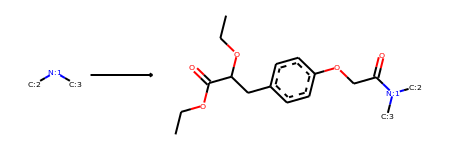

Product similarity 0.8272727272727273, overall 0.4875, smiles CCOC(=O)C(Cc1ccc(OCC(=O)N(Cc2ccccc2)C2(CC(C)O)CCC2)cc1)OCC


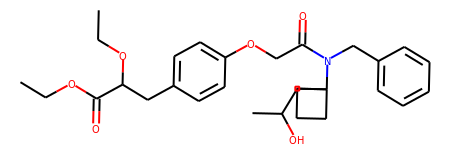

The proposed reaction is:


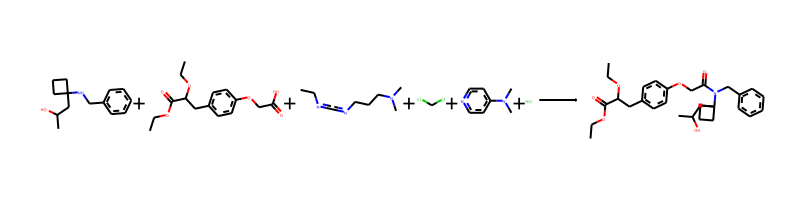

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCOC(=O)C(Cc1ccc(OCC(=O)O)cc1)OCC.CCN=C=NCCCN(C)C.ClCCl.CN(C)c1ccncc1.Cl>>CCOC(=O)C(Cc1ccc(OCC(=O)N(Cc2ccccc2)C2(CC(C)O)CCC2)cc1)OCC
The fast filter score is 0.99924469


--------------------------------------------------

Train index: 68690
RANK 27 PRECEDENT
REACTANT MATCH SCORE: 0.5862068965517241


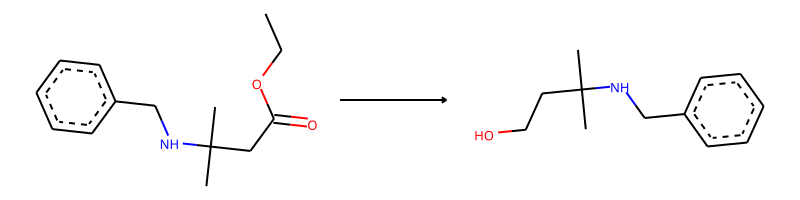

-> template: [C:1]-[C;H0;D3;+0:2](=[O;H0;D1;+0:3])-[O;H0;D2;+0]-[C;H2;D2;+0]-[C;H3;D1;+0]>>[C:1]-[CH2;D2;+0:2]-[OH;D1;+0:3]


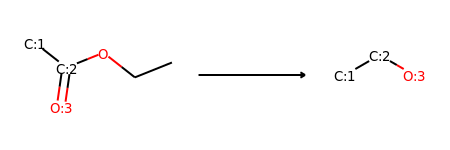

->No precursors could be generated!


--------------------------------------------------

Train index: 345922
RANK 28 PRECEDENT
REACTANT MATCH SCORE: 0.5833333333333334


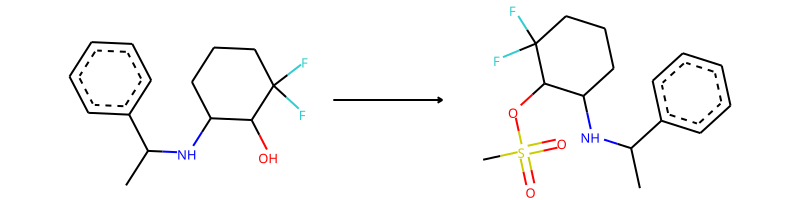

-> template: [C:2]-[OH;D1;+0:1]>>C-S(=O)(=O)-[O;H0;D2;+0:1]-[C:2]


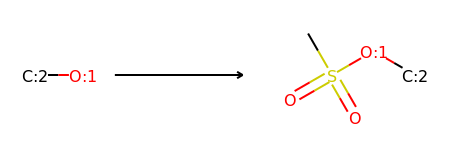

Product similarity 0.6428571428571429, overall 0.37500000000000006, smiles CC(CC1(NCc2ccccc2)CCC1)OS(C)(=O)=O


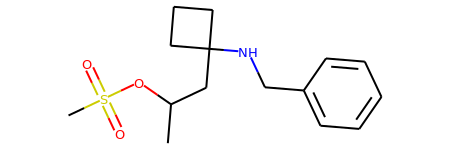

The proposed reaction is:


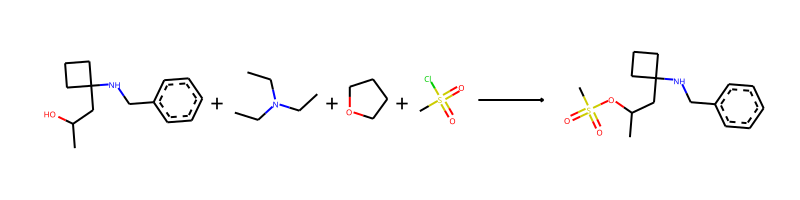

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCN(CC)CC.C1CCOC1.CS(=O)(=O)Cl>>CC(CC1(NCc2ccccc2)CCC1)OS(C)(=O)=O
The fast filter score is 0.980598092


--------------------------------------------------

Train index: 344709
RANK 29 PRECEDENT
REACTANT MATCH SCORE: 0.5833333333333334


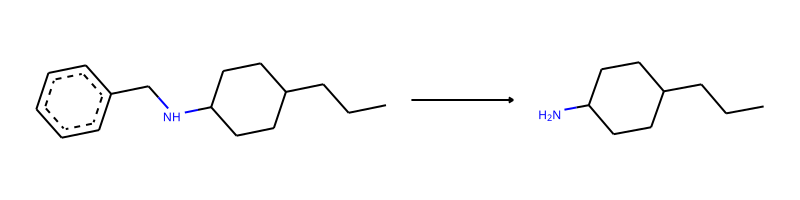

-> template: [C:1]-[NH;D2;+0:2]-[C;H2;D2;+0]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[C:1]-[NH2;D1;+0:2]


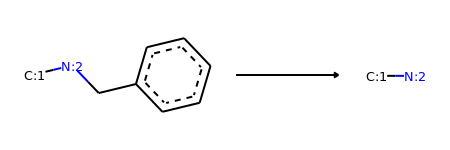

Product similarity 0.3783783783783784, overall 0.22072072072072074, smiles CC(O)CC1(N)CCC1


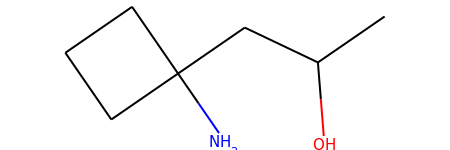

The proposed reaction is:


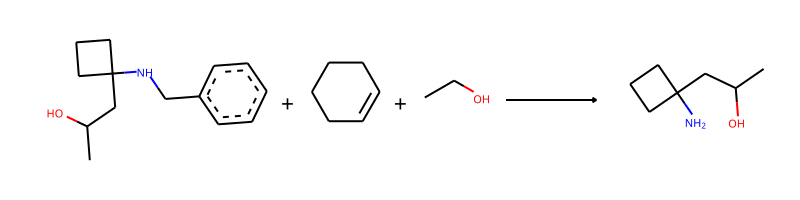

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C1=CCCCC1.CCO>>CC(O)CC1(N)CCC1
The fast filter score is 0.555344641


--------------------------------------------------

Train index: 208125
RANK 30 PRECEDENT
REACTANT MATCH SCORE: 0.58


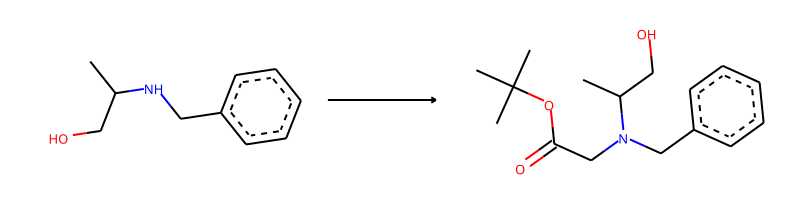

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>C-C(-C)(-C)-O-C(=O)-C-[N;H0;D3;+0:1](-[C:2])-[C:3]


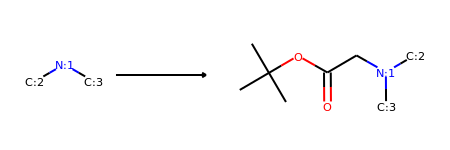

Product similarity 0.7, overall 0.40599999999999997, smiles CC(O)CC1(N(CC(=O)OC(C)(C)C)Cc2ccccc2)CCC1


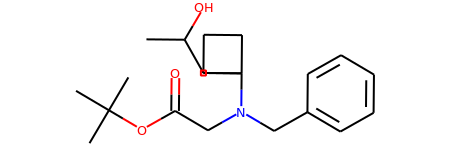

The proposed reaction is:


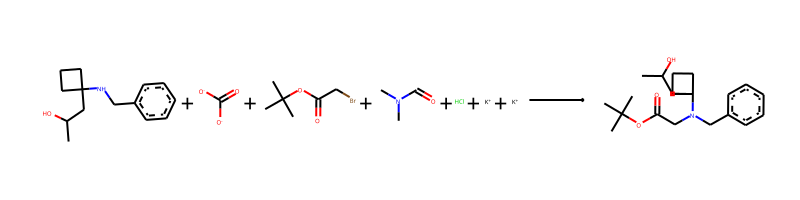

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=C([O-])[O-].CC(C)(C)OC(=O)CBr.CN(C)C=O.Cl.[K+].[K+]>>CC(O)CC1(N(CC(=O)OC(C)(C)C)Cc2ccccc2)CCC1
The fast filter score is 0.964411378


--------------------------------------------------

Train index: 138428
RANK 31 PRECEDENT
REACTANT MATCH SCORE: 0.58


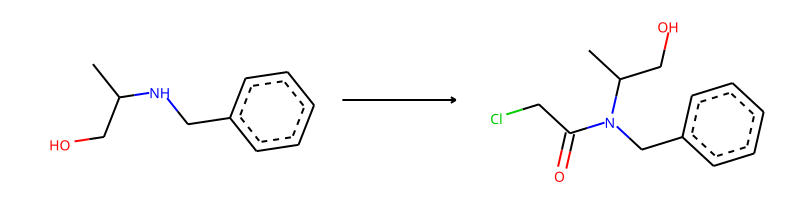

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>Cl-C-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]


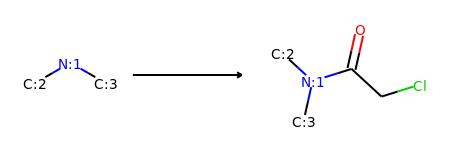

Product similarity 0.65, overall 0.377, smiles CC(O)CC1(N(Cc2ccccc2)C(=O)CCl)CCC1


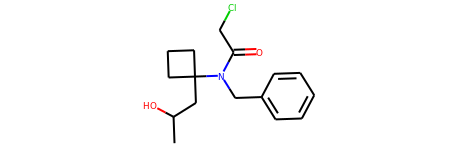

The proposed reaction is:


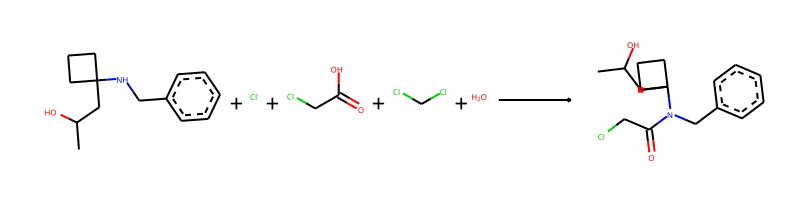

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Cl-].O=C(O)CCl.ClCCl.O>>CC(O)CC1(N(Cc2ccccc2)C(=O)CCl)CCC1
The fast filter score is 0.97361356


--------------------------------------------------

Train index: 359000
RANK 32 PRECEDENT
REACTANT MATCH SCORE: 0.58


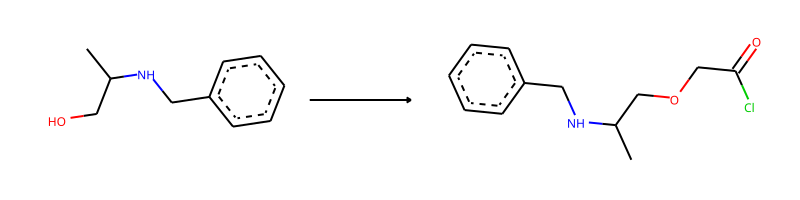

-> template: [C:2]-[OH;D1;+0:1]>>Cl-C(=O)-C-[O;H0;D2;+0:1]-[C:2]


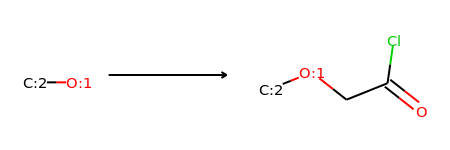

Product similarity 0.6290322580645161, overall 0.3648387096774193, smiles CC(CC1(NCc2ccccc2)CCC1)OCC(=O)Cl


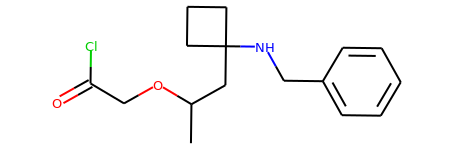

The proposed reaction is:


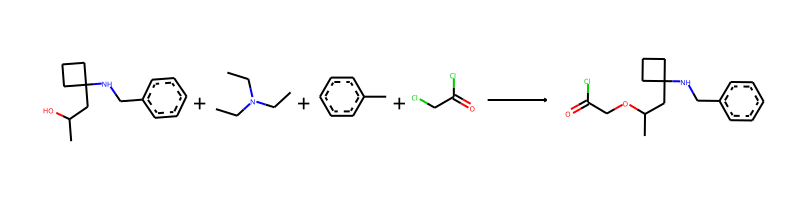

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCN(CC)CC.Cc1ccccc1.O=C(Cl)CCl>>CC(CC1(NCc2ccccc2)CCC1)OCC(=O)Cl
The fast filter score is 0.000242233276


--------------------------------------------------

Train index: 10359
RANK 33 PRECEDENT
REACTANT MATCH SCORE: 0.58


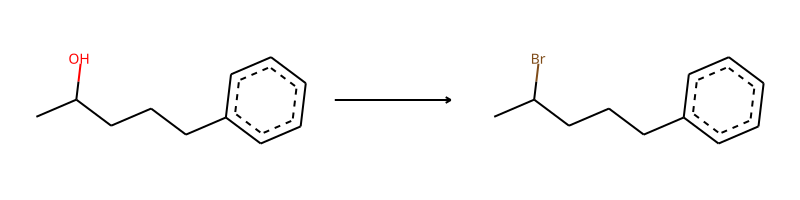

-> template: [C:2]-[CH;D3;+0:1](-[C;D1;H3:3])-[O;H1;D1;+0]>>Br-[CH;D3;+0:1](-[C:2])-[C;D1;H3:3]


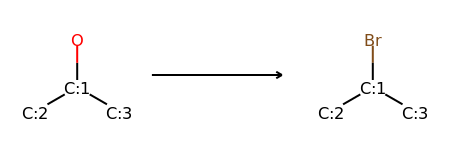

Product similarity 0.58, overall 0.3364, smiles CC(Br)CC1(NCc2ccccc2)CCC1


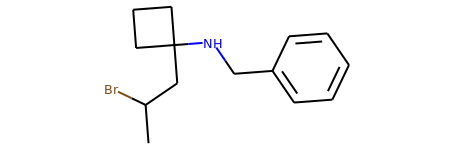

The proposed reaction is:


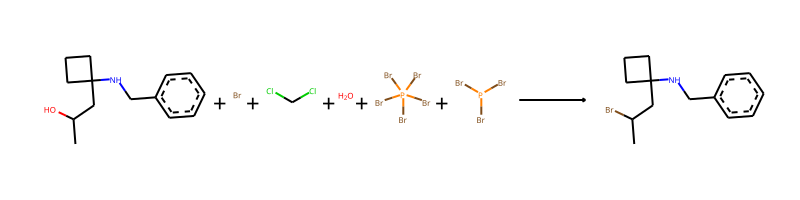

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Br].ClCCl.O.BrP(Br)(Br)(Br)Br.BrP(Br)Br>>CC(Br)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.815375686


--------------------------------------------------

Train index: 322634
RANK 34 PRECEDENT
REACTANT MATCH SCORE: 0.58


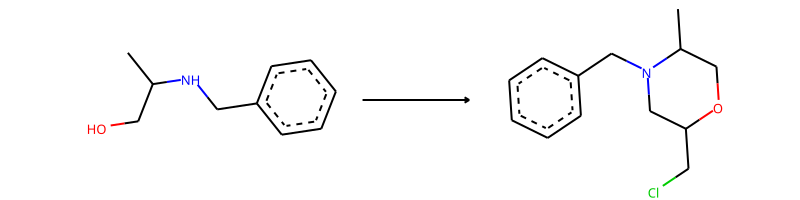

-> template: [C:2]-[NH;D2;+0:1]-[C:3]-[C:4]-[OH;D1;+0:5]>>Cl-C-C1-C-[N;H0;D3;+0:1](-[C:2])-[C:3]-[C:4]-[O;H0;D2;+0:5]-1


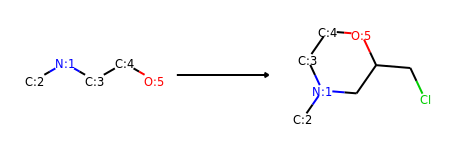

->No precursors could be generated!


--------------------------------------------------

Train index: 18017
RANK 35 PRECEDENT
REACTANT MATCH SCORE: 0.58


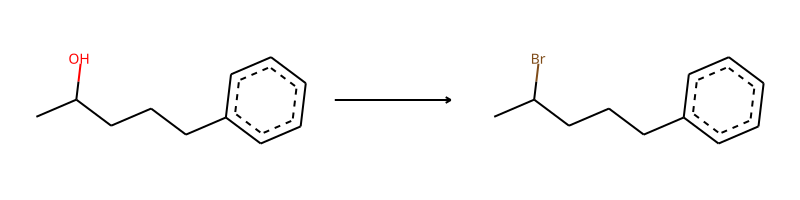

-> template: [C:2]-[CH;D3;+0:1](-[C;D1;H3:3])-[O;H1;D1;+0]>>Br-[CH;D3;+0:1](-[C:2])-[C;D1;H3:3]


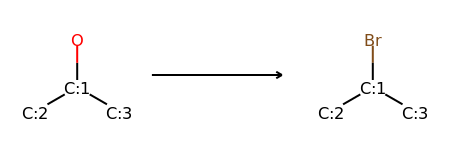

Product similarity 0.58, overall 0.3364, smiles CC(Br)CC1(NCc2ccccc2)CCC1


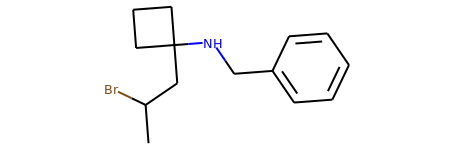

The proposed reaction is:


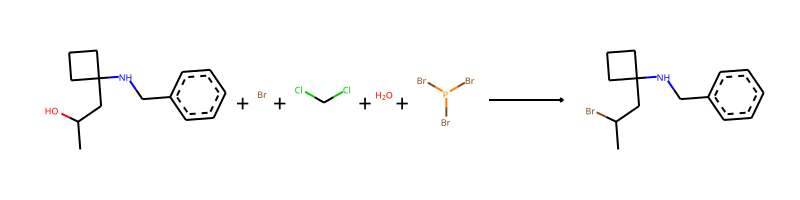

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Br].ClCCl.O.BrP(Br)Br>>CC(Br)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.870692253


--------------------------------------------------

Train index: 46533
RANK 36 PRECEDENT
REACTANT MATCH SCORE: 0.576271186440678


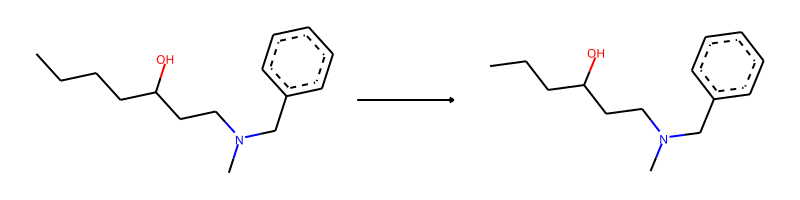

-> template: [C:1]-[CH2;D2;+0:2]-[C;H3;D1;+0]>>[C:1]-[CH3;D1;+0:2]


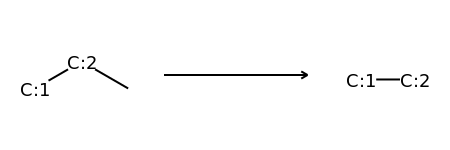

->No precursors could be generated!


--------------------------------------------------

Train index: 162476
RANK 37 PRECEDENT
REACTANT MATCH SCORE: 0.5692307692307692


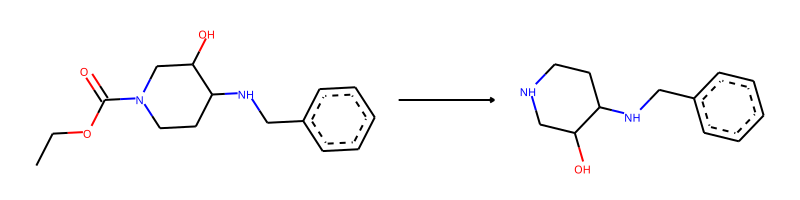

-> template: [C:1]-[N;H0;D3;+0:2](-[C:3])-[C;H0;D3;+0](=[O;H0;D1;+0])-[O;H0;D2;+0]-[C;H2;D2;+0]-[C;H3;D1;+0]>>[C:1]-[NH;D2;+0:2]-[C:3]


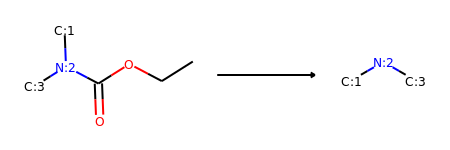

->No precursors could be generated!


--------------------------------------------------

Train index: 354997
RANK 38 PRECEDENT
REACTANT MATCH SCORE: 0.5689655172413793


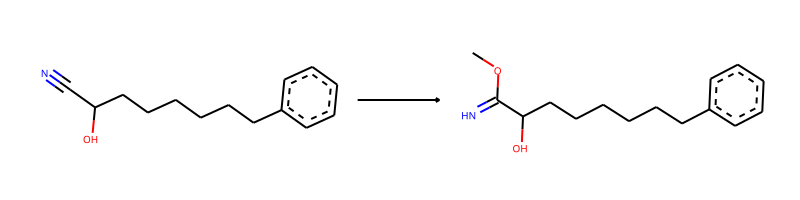

-> template: [C:2]-[C;H0;D2;+0:1]#[N;H0;D1;+0:3]>>C-O-[C;H0;D3;+0:1](-[C:2])=[NH;D1;+0:3]


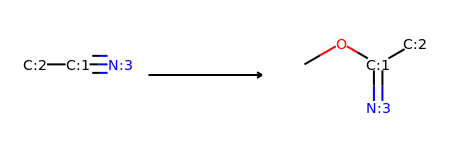

->No precursors could be generated!


--------------------------------------------------

Train index: 281902
RANK 39 PRECEDENT
REACTANT MATCH SCORE: 0.5689655172413793


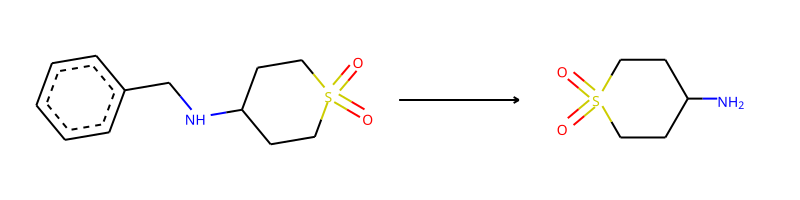

-> template: [C:1]-[NH;D2;+0:2]-[C;H2;D2;+0]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[C:1]-[NH2;D1;+0:2]


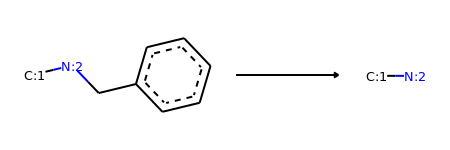

Product similarity 0.34285714285714286, overall 0.19507389162561578, smiles CC(O)CC1(N)CCC1


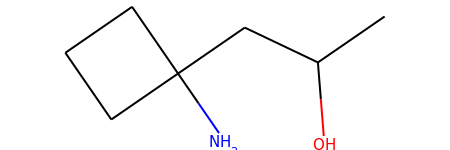

The proposed reaction is:


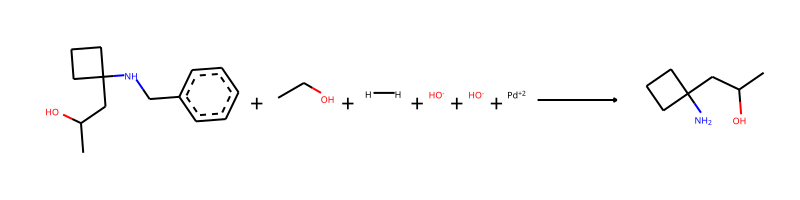

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCO.[H][H].[OH-].[OH-].[Pd+2]>>CC(O)CC1(N)CCC1
The fast filter score is 0.178622663


--------------------------------------------------

Train index: 340350
RANK 40 PRECEDENT
REACTANT MATCH SCORE: 0.5686274509803921


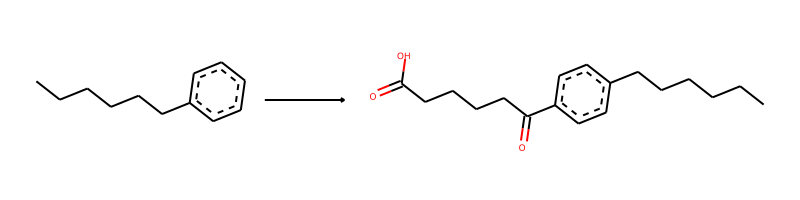

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>O-C(=O)-C-C-C-C-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


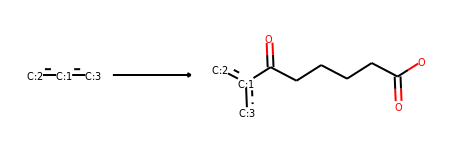

Product similarity 0.6410256410256411, overall 0.3645047762694822, smiles CC(O)CC1(NCc2ccccc2C(=O)CCCCC(=O)O)CCC1


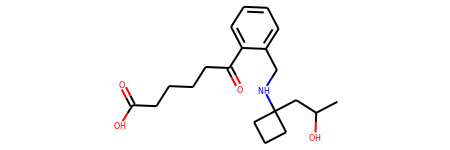

The proposed reaction is:


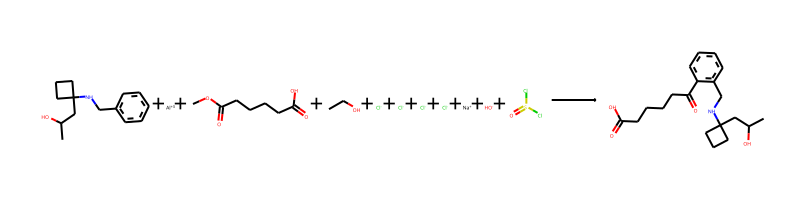

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].COC(=O)CCCCC(=O)O.CCO.[Cl-].[Cl-].[Cl-].[Cl-].[Na+].[OH-].O=S(Cl)Cl>>CC(O)CC1(NCc2ccccc2C(=O)CCCCC(=O)O)CCC1
The fast filter score is 0.0190345049
Product similarity 0.7066666666666667, overall 0.40183006535947713, smiles CC(O)CC1(NCc2ccc(C(=O)CCCCC(=O)O)cc2)CCC1


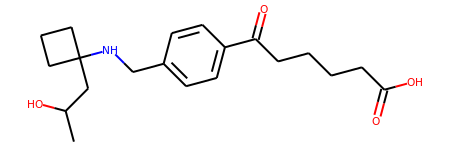

The proposed reaction is:


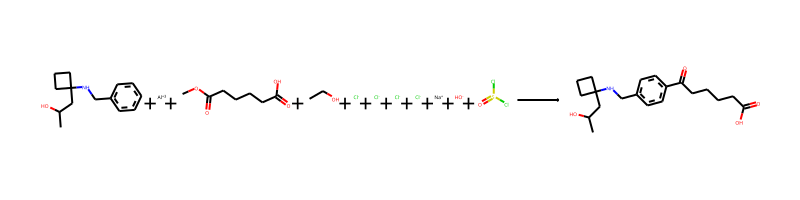

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].COC(=O)CCCCC(=O)O.CCO.[Cl-].[Cl-].[Cl-].[Cl-].[Na+].[OH-].O=S(Cl)Cl>>CC(O)CC1(NCc2ccc(C(=O)CCCCC(=O)O)cc2)CCC1
The fast filter score is 0.0373516083
Product similarity 0.6623376623376623, overall 0.3766233766233766, smiles CC(O)CC1(NCc2cccc(C(=O)CCCCC(=O)O)c2)CCC1


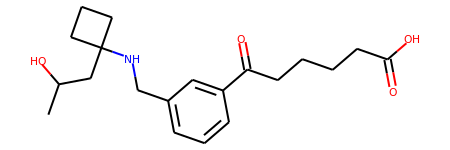

The proposed reaction is:


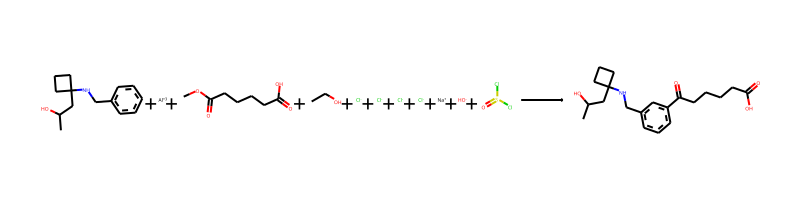

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].COC(=O)CCCCC(=O)O.CCO.[Cl-].[Cl-].[Cl-].[Cl-].[Na+].[OH-].O=S(Cl)Cl>>CC(O)CC1(NCc2cccc(C(=O)CCCCC(=O)O)c2)CCC1
The fast filter score is 0.00612509251


--------------------------------------------------

Train index: 187737
RANK 41 PRECEDENT
REACTANT MATCH SCORE: 0.5686274509803921


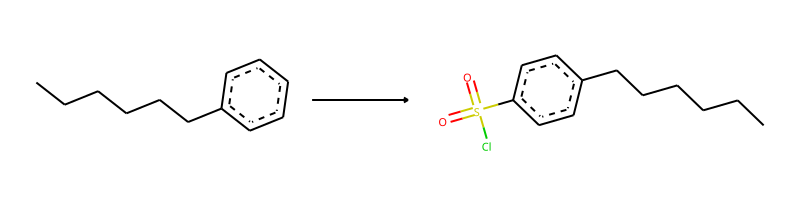

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>Cl-S(=O)(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


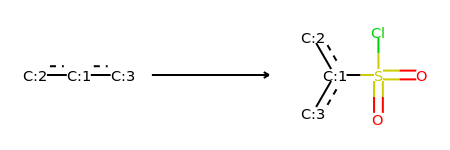

Product similarity 0.6333333333333333, overall 0.3601307189542483, smiles CC(O)CC1(NCc2ccc(S(=O)(=O)Cl)cc2)CCC1


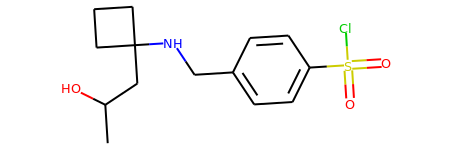

The proposed reaction is:


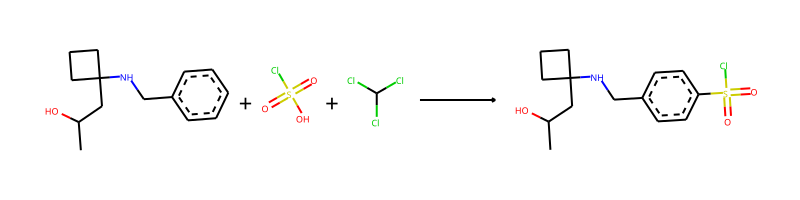

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=S(=O)(O)Cl.ClC(Cl)Cl>>CC(O)CC1(NCc2ccc(S(=O)(=O)Cl)cc2)CCC1
The fast filter score is 0.309603155
Product similarity 0.5806451612903226, overall 0.3301707779886148, smiles CC(O)CC1(NCc2cccc(S(=O)(=O)Cl)c2)CCC1


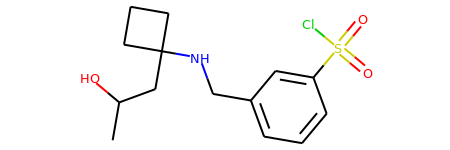

The proposed reaction is:


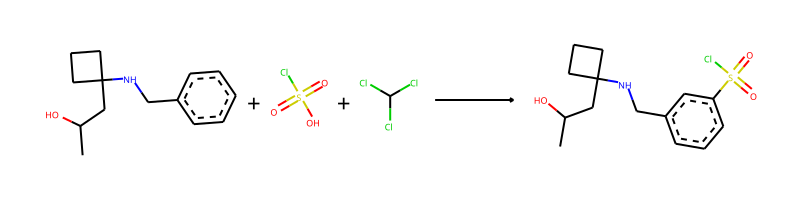

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=S(=O)(O)Cl.ClC(Cl)Cl>>CC(O)CC1(NCc2cccc(S(=O)(=O)Cl)c2)CCC1
The fast filter score is 0.529639184
Product similarity 0.5555555555555556, overall 0.3159041394335512, smiles CC(O)CC1(NCc2ccccc2S(=O)(=O)Cl)CCC1


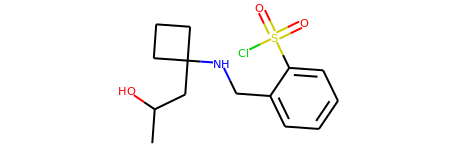

The proposed reaction is:


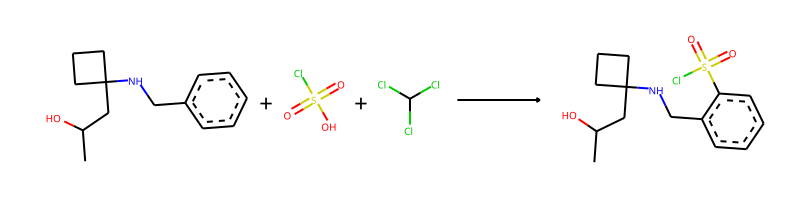

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=S(=O)(O)Cl.ClC(Cl)Cl>>CC(O)CC1(NCc2ccccc2S(=O)(=O)Cl)CCC1
The fast filter score is 0.34713614


--------------------------------------------------

Train index: 336399
RANK 42 PRECEDENT
REACTANT MATCH SCORE: 0.5686274509803921


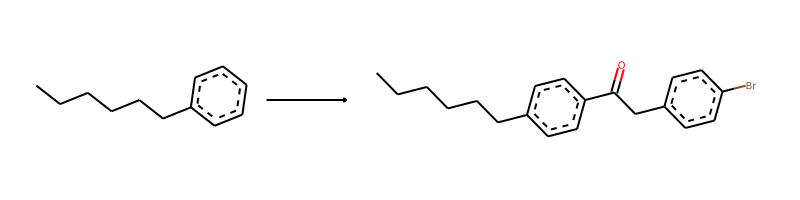

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>Br-c1:c:c:c(-C-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]):c:c:1


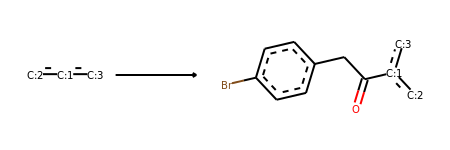

Product similarity 0.6790123456790124, overall 0.3861050593076737, smiles CC(O)CC1(NCc2cccc(C(=O)Cc3ccc(Br)cc3)c2)CCC1


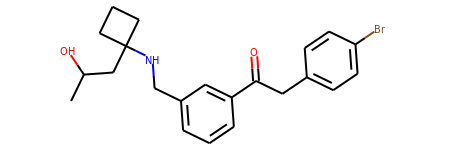

The proposed reaction is:


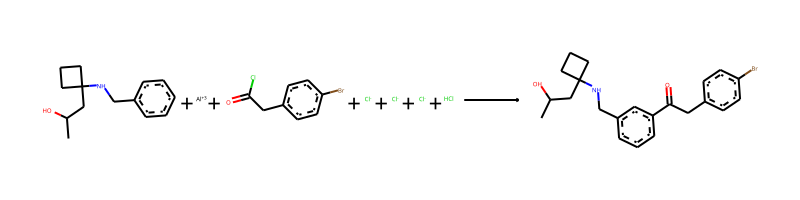

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C(Cl)Cc1ccc(Br)cc1.[Cl-].[Cl-].[Cl-].Cl>>CC(O)CC1(NCc2cccc(C(=O)Cc3ccc(Br)cc3)c2)CCC1
The fast filter score is 0.347851932
Product similarity 0.7215189873417721, overall 0.4102755026061057, smiles CC(O)CC1(NCc2ccc(C(=O)Cc3ccc(Br)cc3)cc2)CCC1


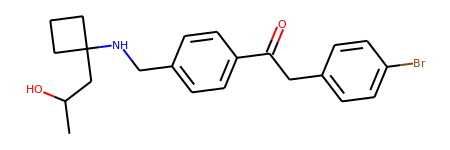

The proposed reaction is:


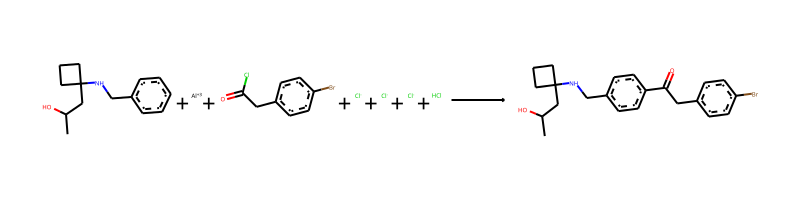

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C(Cl)Cc1ccc(Br)cc1.[Cl-].[Cl-].[Cl-].Cl>>CC(O)CC1(NCc2ccc(C(=O)Cc3ccc(Br)cc3)cc2)CCC1
The fast filter score is 0.86463362
Product similarity 0.6585365853658537, overall 0.3744619799139168, smiles CC(O)CC1(NCc2ccccc2C(=O)Cc2ccc(Br)cc2)CCC1


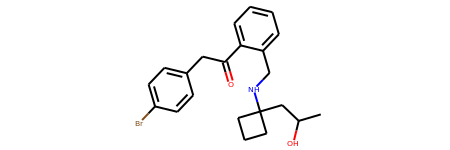

The proposed reaction is:


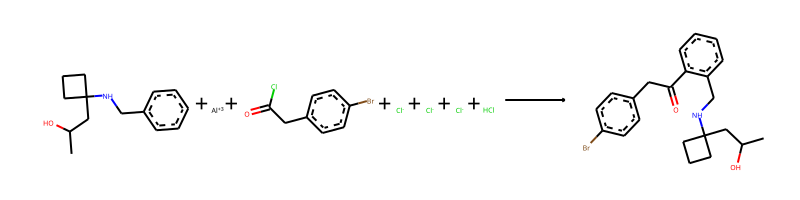

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C(Cl)Cc1ccc(Br)cc1.[Cl-].[Cl-].[Cl-].Cl>>CC(O)CC1(NCc2ccccc2C(=O)Cc2ccc(Br)cc2)CCC1
The fast filter score is 0.950359285


--------------------------------------------------

Train index: 158240
RANK 43 PRECEDENT
REACTANT MATCH SCORE: 0.5686274509803921


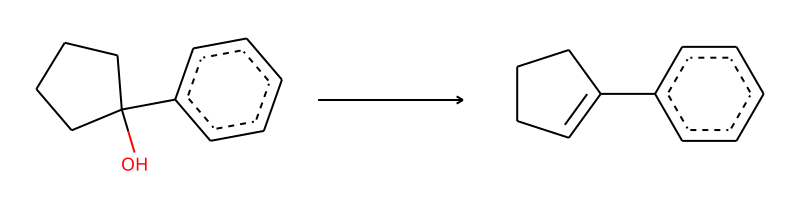

-> template: [C:1]-[CH2;D2;+0:2]-[C;H0;D4;+0:3](-[C:4])(-[O;H1;D1;+0])-[c:5]>>[C:1]-[CH;D2;+0:2]=[C;H0;D3;+0:3](-[C:4])-[c:5]


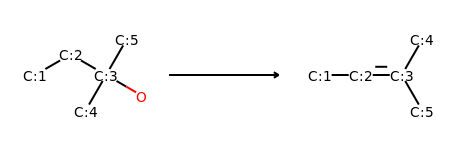

->No precursors could be generated!


--------------------------------------------------

Train index: 328889
RANK 44 PRECEDENT
REACTANT MATCH SCORE: 0.5686274509803921


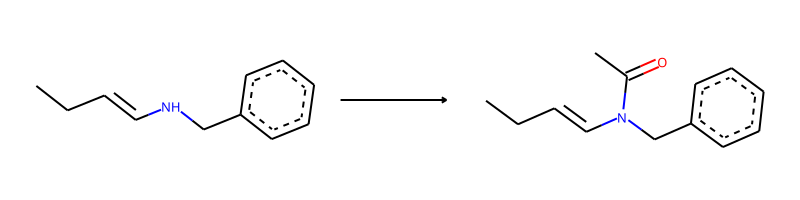

-> template: [C:4]=[C:3]-[NH;D2;+0:1]-[C:2]>>C-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]=[C:4]


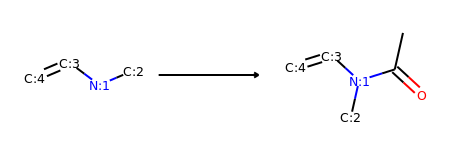

->No precursors could be generated!


--------------------------------------------------

Train index: 78262
RANK 45 PRECEDENT
REACTANT MATCH SCORE: 0.5671641791044776


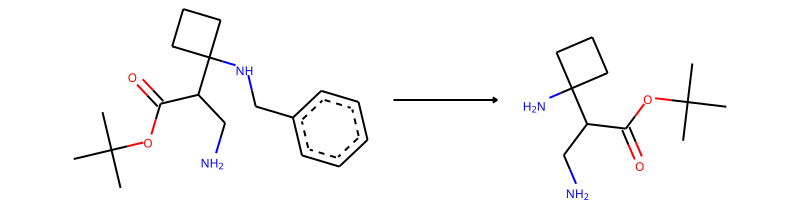

-> template: [C:1]-[NH;D2;+0:2]-[C;H2;D2;+0]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[C:1]-[NH2;D1;+0:2]


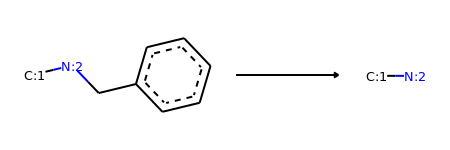

Product similarity 0.35555555555555557, overall 0.20165837479270315, smiles CC(O)CC1(N)CCC1


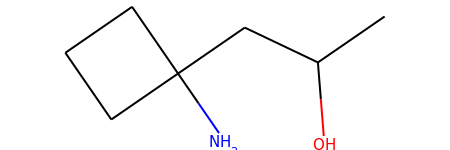

The proposed reaction is:


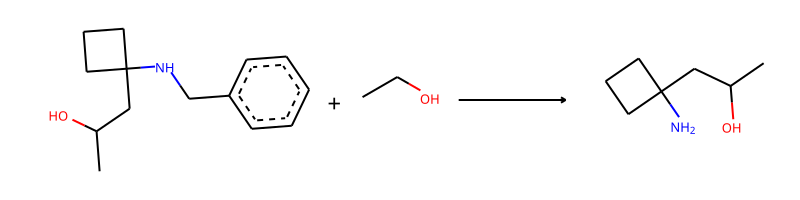

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCO>>CC(O)CC1(N)CCC1
The fast filter score is 0.627759039


--------------------------------------------------

Train index: 158519
RANK 46 PRECEDENT
REACTANT MATCH SCORE: 0.5666666666666667


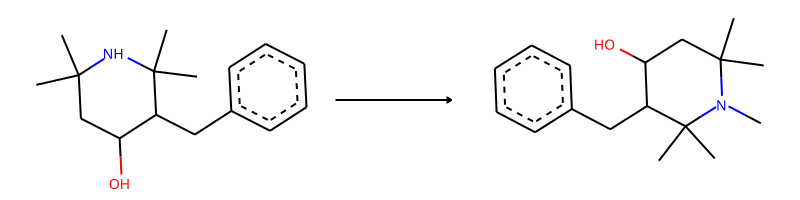

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>C-[N;H0;D3;+0:1](-[C:2])-[C:3]


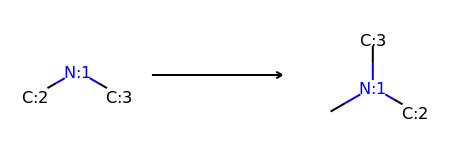

Product similarity 0.5806451612903226, overall 0.32903225806451614, smiles CC(O)CC1(N(C)Cc2ccccc2)CCC1


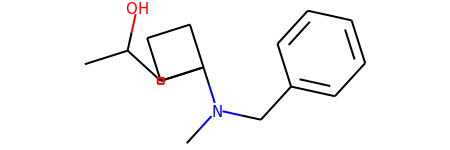

The proposed reaction is:


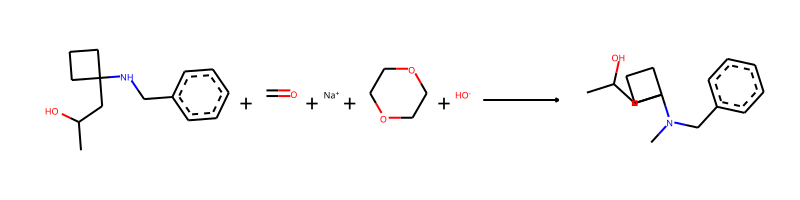

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C=O.[Na+].C1COCCO1.[OH-]>>CC(O)CC1(N(C)Cc2ccccc2)CCC1
The fast filter score is 0.738816559


--------------------------------------------------

Train index: 409823
RANK 47 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


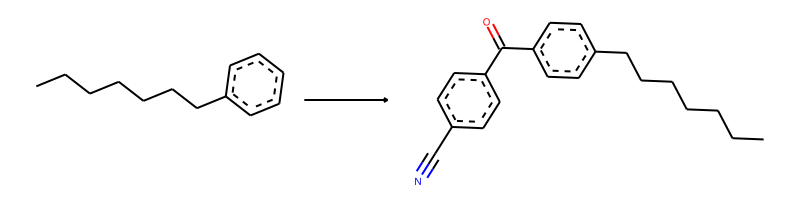

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>N#C-c1:c:c:c(-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]):c:c:1


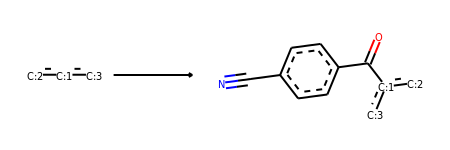

Product similarity 0.6547619047619048, overall 0.3706199460916442, smiles CC(O)CC1(NCc2ccccc2C(=O)c2ccc(C#N)cc2)CCC1


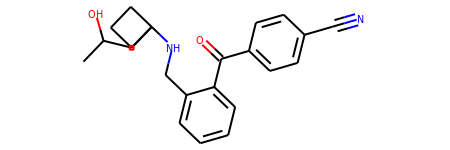

The proposed reaction is:


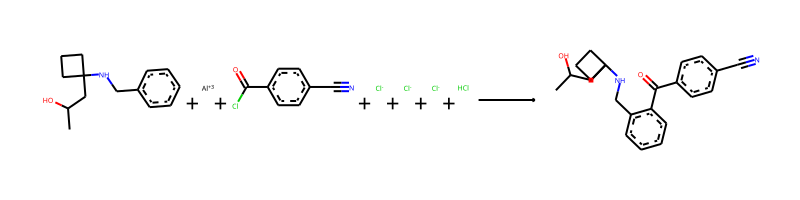

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1ccc(C(=O)Cl)cc1.[Cl-].[Cl-].[Cl-].Cl>>CC(O)CC1(NCc2ccccc2C(=O)c2ccc(C#N)cc2)CCC1
The fast filter score is 0.181002378
Product similarity 0.7160493827160493, overall 0.40531097134870714, smiles CC(O)CC1(NCc2ccc(C(=O)c3ccc(C#N)cc3)cc2)CCC1


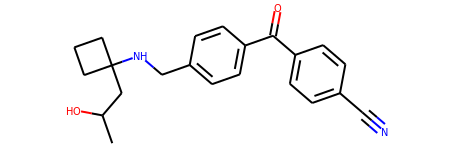

The proposed reaction is:


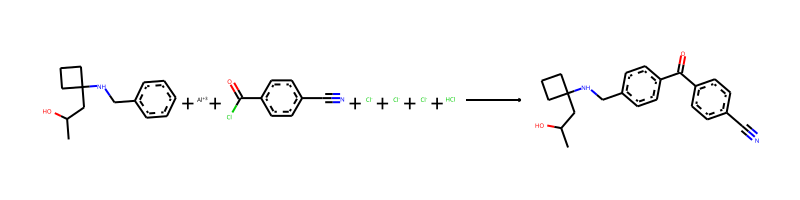

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1ccc(C(=O)Cl)cc1.[Cl-].[Cl-].[Cl-].Cl>>CC(O)CC1(NCc2ccc(C(=O)c3ccc(C#N)cc3)cc2)CCC1
The fast filter score is 0.866228342
Product similarity 0.6746987951807228, overall 0.38190497840418275, smiles CC(O)CC1(NCc2cccc(C(=O)c3ccc(C#N)cc3)c2)CCC1


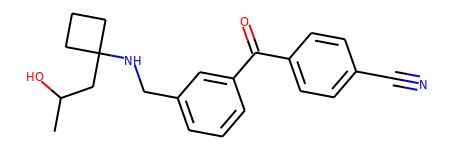

The proposed reaction is:


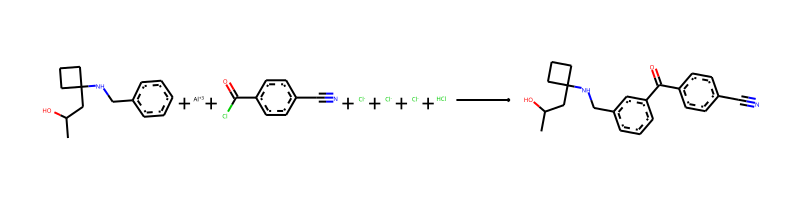

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1ccc(C(=O)Cl)cc1.[Cl-].[Cl-].[Cl-].Cl>>CC(O)CC1(NCc2cccc(C(=O)c3ccc(C#N)cc3)c2)CCC1
The fast filter score is 0.801475286


--------------------------------------------------

Train index: 443667
RANK 48 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


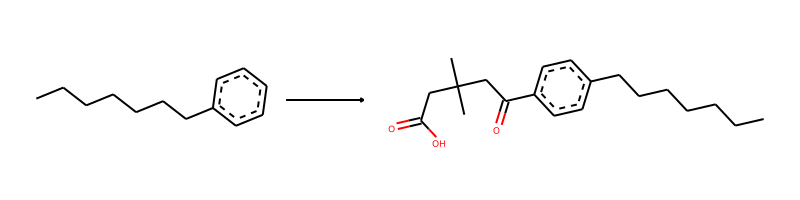

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>C-C(-C)(-C-C(-O)=O)-C-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


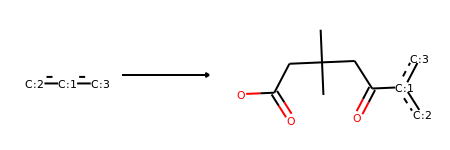

Product similarity 0.6419753086419753, overall 0.363382250174703, smiles CC(O)CC1(NCc2ccccc2C(=O)CC(C)(C)CC(=O)O)CCC1


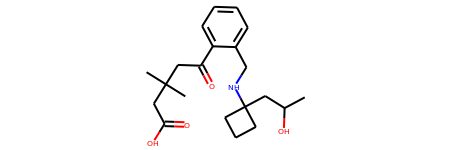

The proposed reaction is:


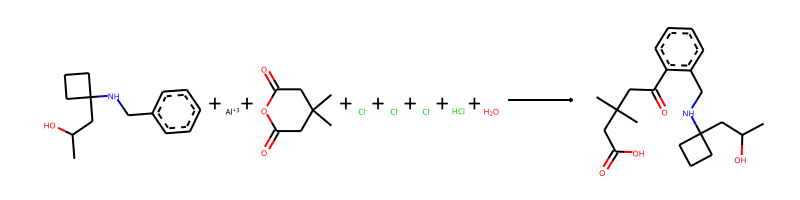

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].CC1(C)CC(=O)OC(=O)C1.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2ccccc2C(=O)CC(C)(C)CC(=O)O)CCC1
The fast filter score is 0.00595033169
Product similarity 0.6625, overall 0.375, smiles CC(O)CC1(NCc2cccc(C(=O)CC(C)(C)CC(=O)O)c2)CCC1


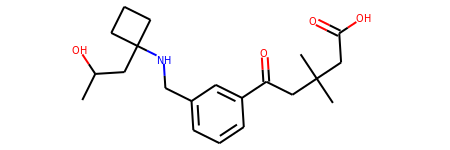

The proposed reaction is:


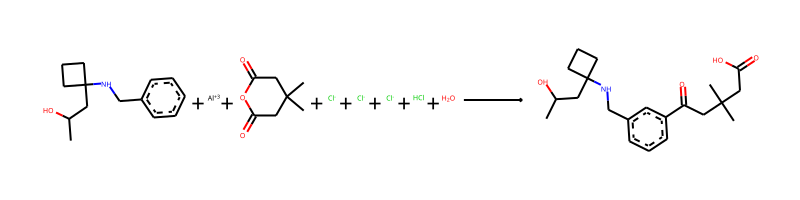

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].CC1(C)CC(=O)OC(=O)C1.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2cccc(C(=O)CC(C)(C)CC(=O)O)c2)CCC1
The fast filter score is 0.166727275
Product similarity 0.7051282051282052, overall 0.3991291727140784, smiles CC(O)CC1(NCc2ccc(C(=O)CC(C)(C)CC(=O)O)cc2)CCC1


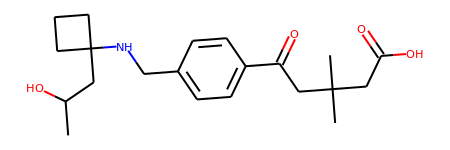

The proposed reaction is:


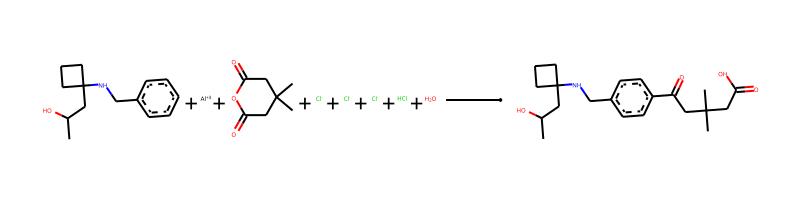

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].CC1(C)CC(=O)OC(=O)C1.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2ccc(C(=O)CC(C)(C)CC(=O)O)cc2)CCC1
The fast filter score is 0.450976789


--------------------------------------------------

Train index: 222961
RANK 49 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


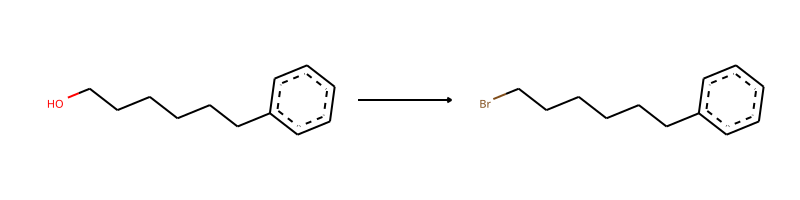

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Br-[CH2;D2;+0:1]-[C:2]


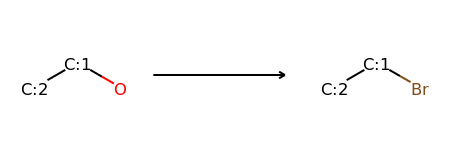

->No precursors could be generated!


--------------------------------------------------

Train index: 268056
RANK 50 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


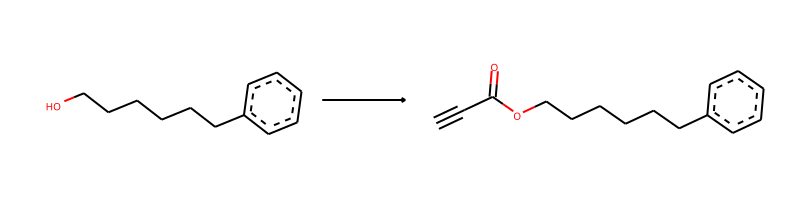

-> template: [C:2]-[OH;D1;+0:1]>>C#C-C(=O)-[O;H0;D2;+0:1]-[C:2]


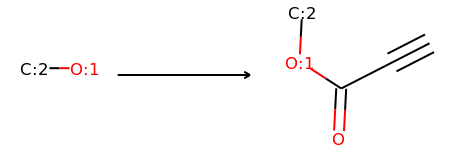

Product similarity 0.6153846153846154, overall 0.3483309143686502, smiles C#CC(=O)OC(C)CC1(NCc2ccccc2)CCC1


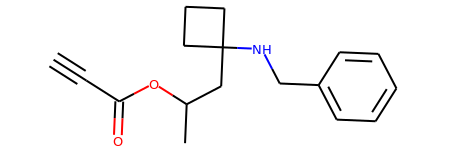

The proposed reaction is:


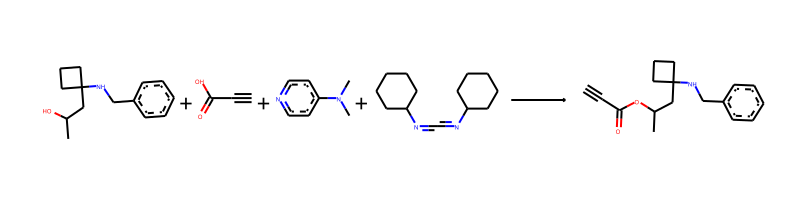

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C#CC(=O)O.CN(C)c1ccncc1.C(=NC1CCCCC1)=NC1CCCCC1>>C#CC(=O)OC(C)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.180476099


--------------------------------------------------

Train index: 13778
RANK 51 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


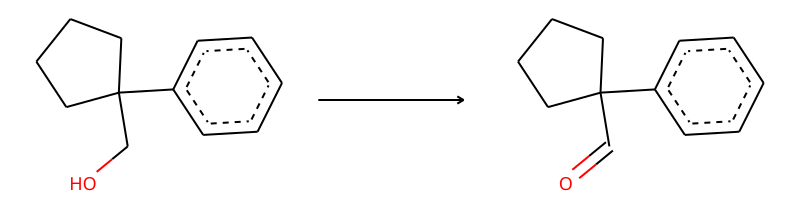

-> template: [C:1]-[CH2;D2;+0:2]-[OH;D1;+0:3]>>[C:1]-[CH;D2;+0:2]=[O;H0;D1;+0:3]


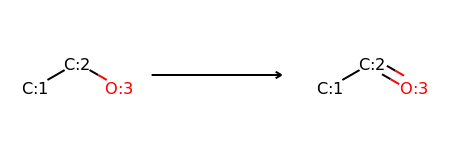

->No precursors could be generated!


--------------------------------------------------

Train index: 132389
RANK 52 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


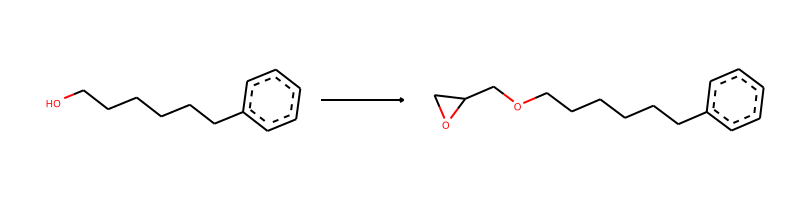

-> template: [C:1]-[OH;D1;+0:2]>>[C:1]-[O;H0;D2;+0:2]-C-C1-C-O-1


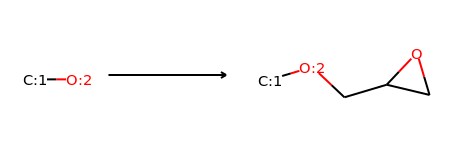

Product similarity 0.6212121212121212, overall 0.35162950257289877, smiles CC(CC1(NCc2ccccc2)CCC1)OCC1CO1


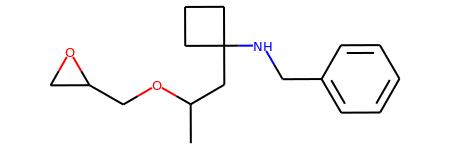

The proposed reaction is:


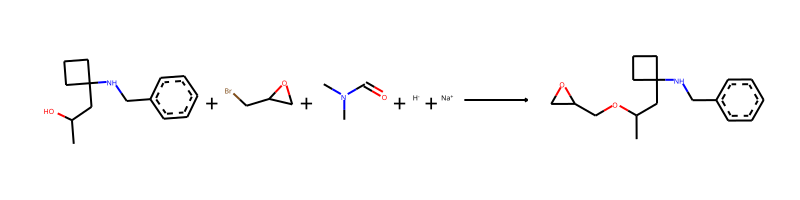

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.BrCC1CO1.CN(C)C=O.[H-].[Na+]>>CC(CC1(NCc2ccccc2)CCC1)OCC1CO1
The fast filter score is 0.981784105


--------------------------------------------------

Train index: 337688
RANK 53 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


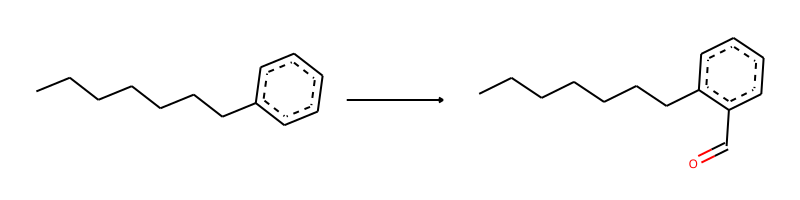

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>O=C-[c;H0;D3;+0:1](:[c:2]):[c:3]


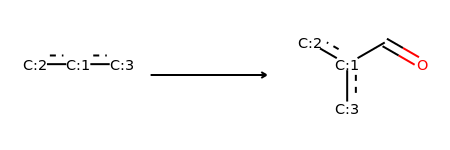

Product similarity 0.5245901639344263, overall 0.2969378286421281, smiles CC(O)CC1(NCc2ccc(C=O)cc2)CCC1


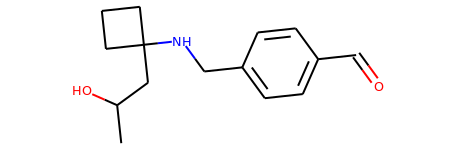

The proposed reaction is:


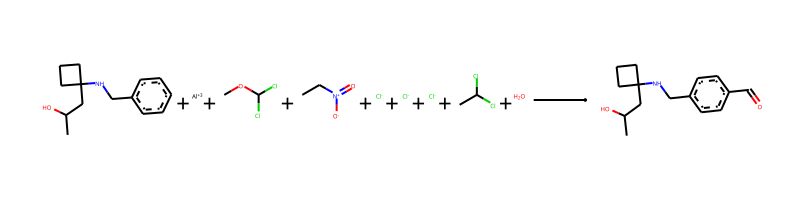

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].COC(Cl)Cl.CC[N+](=O)[O-].[Cl-].[Cl-].[Cl-].CC(Cl)Cl.O>>CC(O)CC1(NCc2ccc(C=O)cc2)CCC1
The fast filter score is 0.575938404
Product similarity 0.603448275862069, overall 0.3415744957709824, smiles CC(O)CC1(NCc2ccccc2C=O)CCC1


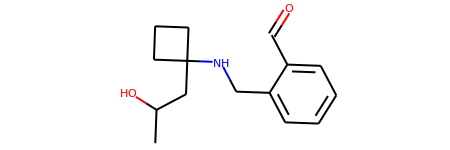

The proposed reaction is:


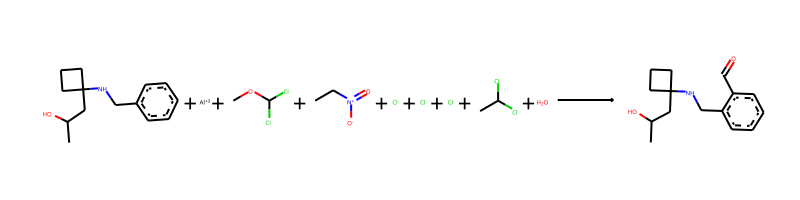

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].COC(Cl)Cl.CC[N+](=O)[O-].[Cl-].[Cl-].[Cl-].CC(Cl)Cl.O>>CC(O)CC1(NCc2ccccc2C=O)CCC1
The fast filter score is 0.152326852
Product similarity 0.55, overall 0.3113207547169812, smiles CC(O)CC1(NCc2cccc(C=O)c2)CCC1


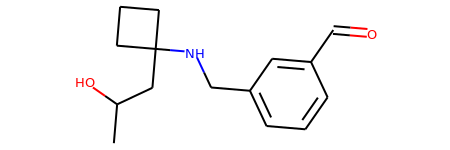

The proposed reaction is:


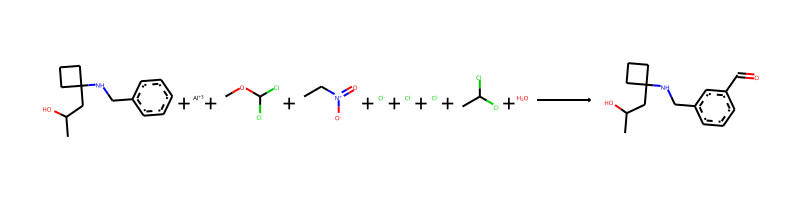

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].COC(Cl)Cl.CC[N+](=O)[O-].[Cl-].[Cl-].[Cl-].CC(Cl)Cl.O>>CC(O)CC1(NCc2cccc(C=O)c2)CCC1
The fast filter score is 0.00738722086


--------------------------------------------------

Train index: 458005
RANK 54 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


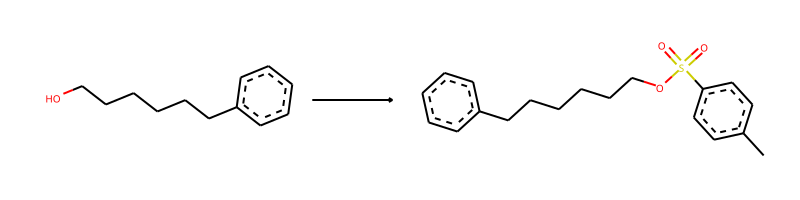

-> template: [C:2]-[OH;D1;+0:1]>>C-c1:c:c:c(-S(=O)(=O)-[O;H0;D2;+0:1]-[C:2]):c:c:1


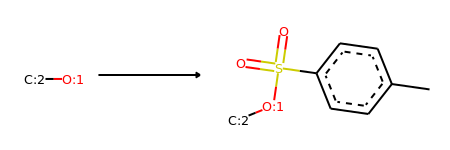

Product similarity 0.6951219512195121, overall 0.393465255407271, smiles Cc1ccc(S(=O)(=O)OC(C)CC2(NCc3ccccc3)CCC2)cc1


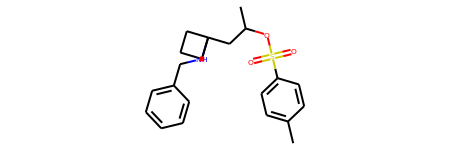

The proposed reaction is:


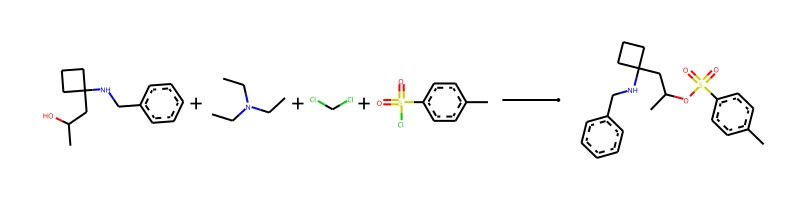

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCN(CC)CC.ClCCl.Cc1ccc(S(=O)(=O)Cl)cc1>>Cc1ccc(S(=O)(=O)OC(C)CC2(NCc3ccccc3)CCC2)cc1
The fast filter score is 0.997666121


--------------------------------------------------

Train index: 131535
RANK 55 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


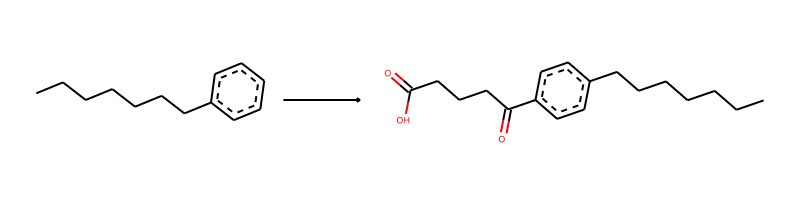

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>O-C(=O)-C-C-C-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


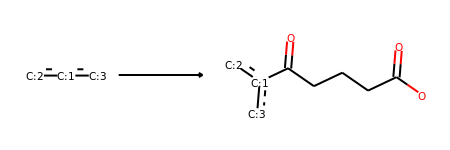

Product similarity 0.6233766233766234, overall 0.352854692477334, smiles CC(O)CC1(NCc2ccccc2C(=O)CCCC(=O)O)CCC1


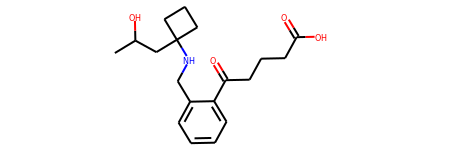

The proposed reaction is:


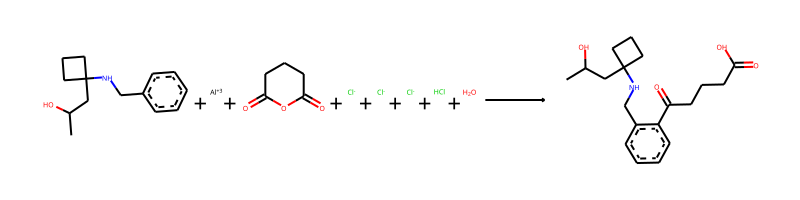

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C1CCCC(=O)O1.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2ccccc2C(=O)CCCC(=O)O)CCC1
The fast filter score is 0.617663324
Product similarity 0.6891891891891891, overall 0.3901070882202957, smiles CC(O)CC1(NCc2ccc(C(=O)CCCC(=O)O)cc2)CCC1


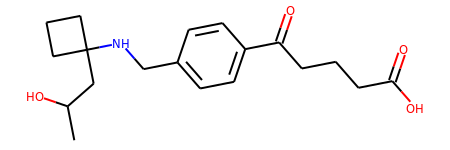

The proposed reaction is:


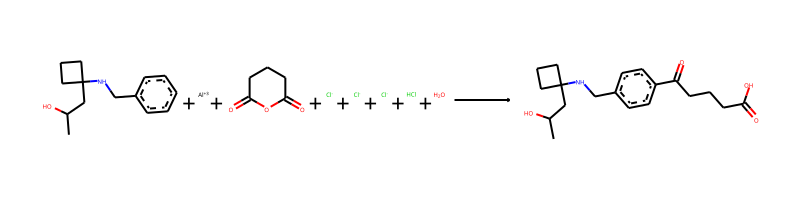

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C1CCCC(=O)O1.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2ccc(C(=O)CCCC(=O)O)cc2)CCC1
The fast filter score is 0.988553047
Product similarity 0.6447368421052632, overall 0.36494538232373386, smiles CC(O)CC1(NCc2cccc(C(=O)CCCC(=O)O)c2)CCC1


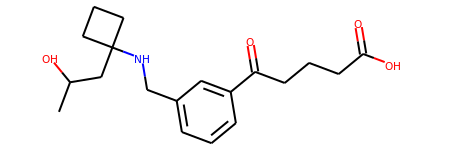

The proposed reaction is:


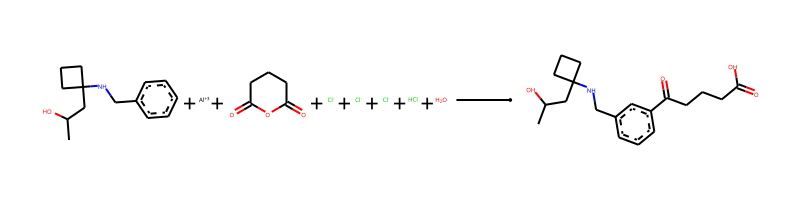

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C1CCCC(=O)O1.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2cccc(C(=O)CCCC(=O)O)c2)CCC1
The fast filter score is 0.318477809


--------------------------------------------------

Train index: 211925
RANK 56 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


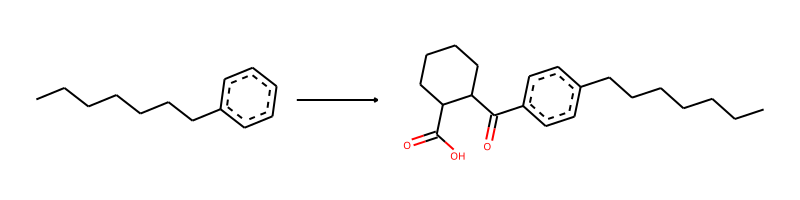

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>O-C(=O)-C1-C-C-C-C-C-1-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


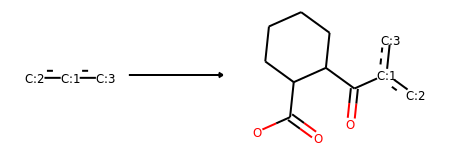

Product similarity 0.7228915662650602, overall 0.40918390543305294, smiles CC(O)CC1(NCc2ccc(C(=O)C3CCCCC3C(=O)O)cc2)CCC1


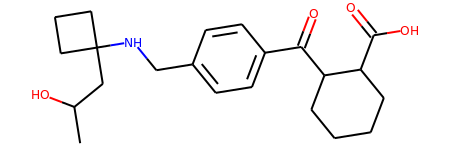

The proposed reaction is:


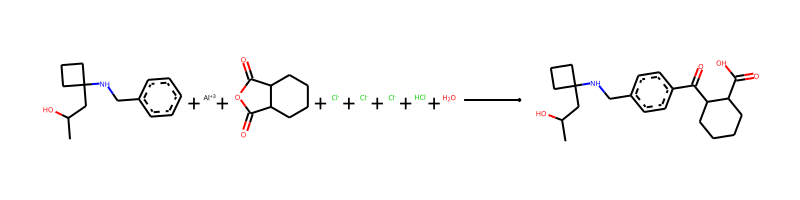

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C1OC(=O)C2CCCCC12.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2ccc(C(=O)C3CCCCC3C(=O)O)cc2)CCC1
The fast filter score is 0.0994940698
Product similarity 0.6823529411764706, overall 0.38623751387347394, smiles CC(O)CC1(NCc2cccc(C(=O)C3CCCCC3C(=O)O)c2)CCC1


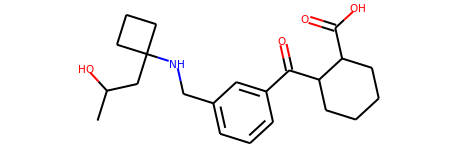

The proposed reaction is:


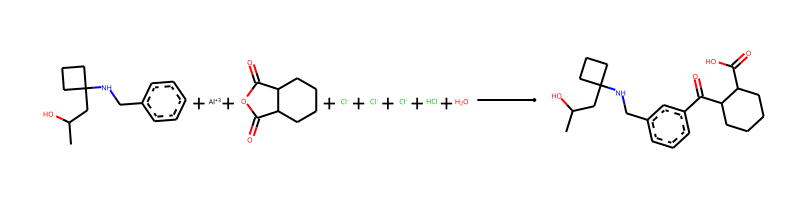

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C1OC(=O)C2CCCCC12.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2cccc(C(=O)C3CCCCC3C(=O)O)c2)CCC1
The fast filter score is 0.0348258317
Product similarity 0.6627906976744186, overall 0.37516454585344444, smiles CC(O)CC1(NCc2ccccc2C(=O)C2CCCCC2C(=O)O)CCC1


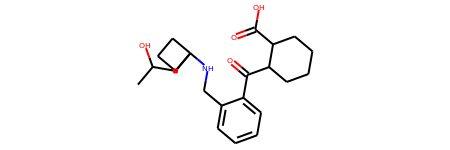

The proposed reaction is:


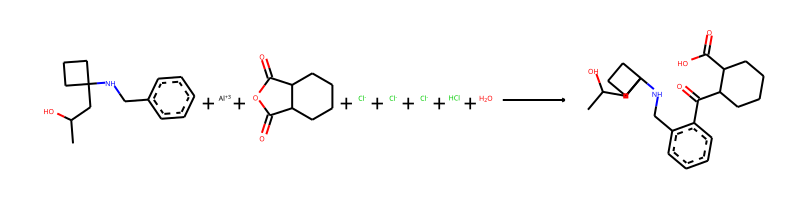

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].O=C1OC(=O)C2CCCCC12.[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2ccccc2C(=O)C2CCCCC2C(=O)O)CCC1
The fast filter score is 6.31076473e-05


--------------------------------------------------

Train index: 92750
RANK 57 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


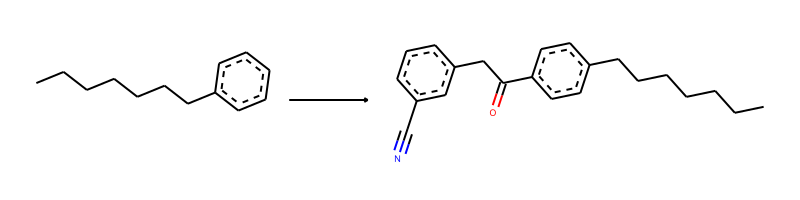

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>N#C-c1:c:c:c:c(-C-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]):c:1


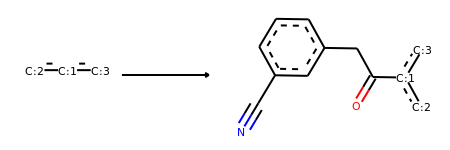

Product similarity 0.686046511627907, overall 0.3883282141290039, smiles CC(O)CC1(NCc2cccc(C(=O)Cc3cccc(C#N)c3)c2)CCC1


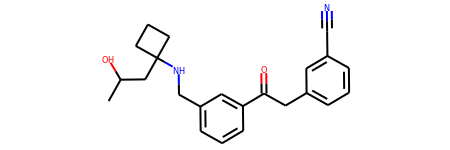

The proposed reaction is:


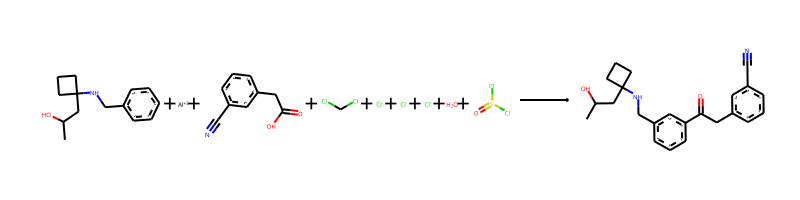

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1cccc(CC(=O)O)c1.ClCCl.[Cl-].[Cl-].[Cl-].O.O=S(Cl)Cl>>CC(O)CC1(NCc2cccc(C(=O)Cc3cccc(C#N)c3)c2)CCC1
The fast filter score is 0.99691546
Product similarity 0.6666666666666666, overall 0.3773584905660377, smiles CC(O)CC1(NCc2ccccc2C(=O)Cc2cccc(C#N)c2)CCC1


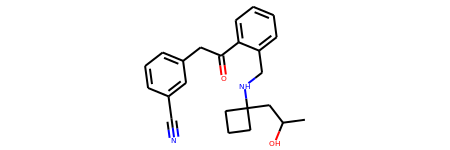

The proposed reaction is:


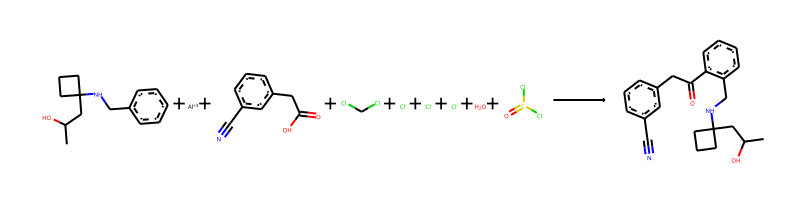

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1cccc(CC(=O)O)c1.ClCCl.[Cl-].[Cl-].[Cl-].O.O=S(Cl)Cl>>CC(O)CC1(NCc2ccccc2C(=O)Cc2cccc(C#N)c2)CCC1
The fast filter score is 0.999468327
Product similarity 0.7261904761904762, overall 0.41105121293800534, smiles CC(O)CC1(NCc2ccc(C(=O)Cc3cccc(C#N)c3)cc2)CCC1


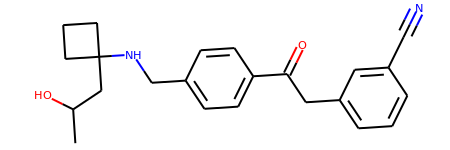

The proposed reaction is:


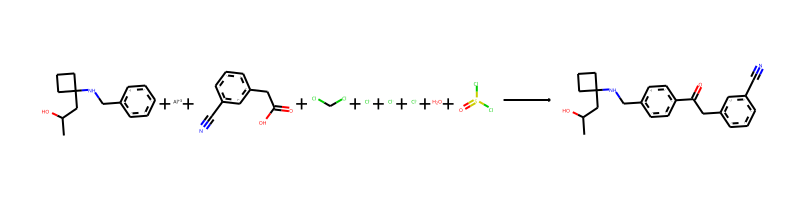

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1cccc(CC(=O)O)c1.ClCCl.[Cl-].[Cl-].[Cl-].O.O=S(Cl)Cl>>CC(O)CC1(NCc2ccc(C(=O)Cc3cccc(C#N)c3)cc2)CCC1
The fast filter score is 0.995438218


--------------------------------------------------

Train index: 400375
RANK 58 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


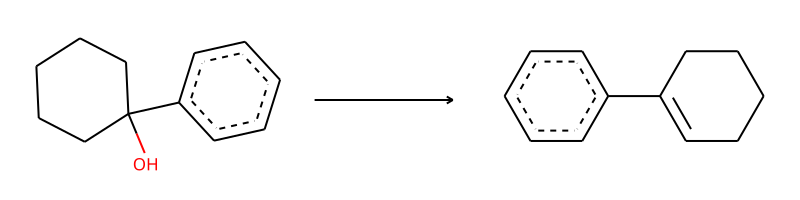

-> template: [C:1]-[C;H0;D4;+0:2](-[O;H1;D1;+0])(-[c:3])-[CH2;D2;+0:4]-[C:5]>>[C:1]-[C;H0;D3;+0:2](-[c:3])=[CH;D2;+0:4]-[C:5]


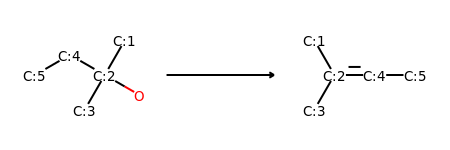

->No precursors could be generated!


--------------------------------------------------

Train index: 67016
RANK 59 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


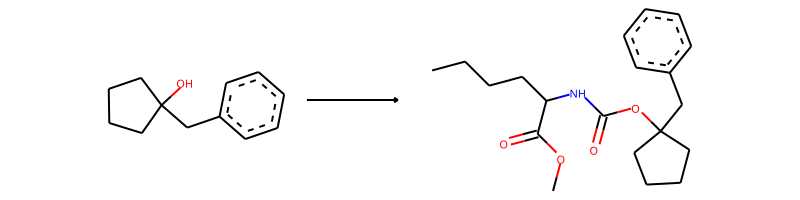

-> template: [C:3]-[C:2](-[C:4])(-[C:5])-[OH;D1;+0:1]>>C-C-C-C-C(-N-C(=O)-[O;H0;D2;+0:1]-[C:2](-[C:3])(-[C:4])-[C:5])-C(=O)-O-C


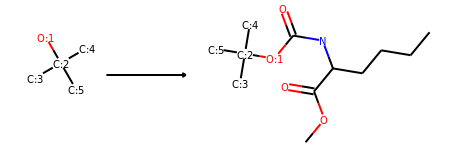

->No precursors could be generated!


--------------------------------------------------

Train index: 310991
RANK 60 PRECEDENT
REACTANT MATCH SCORE: 0.5660377358490566


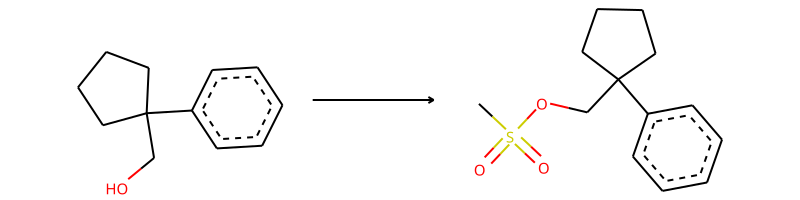

-> template: [C:2]-[OH;D1;+0:1]>>C-S(=O)(=O)-[O;H0;D2;+0:1]-[C:2]


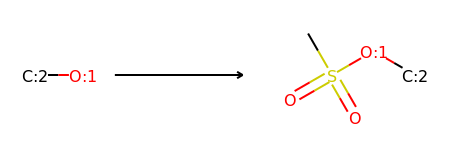

Product similarity 0.609375, overall 0.3449292452830189, smiles CC(CC1(NCc2ccccc2)CCC1)OS(C)(=O)=O


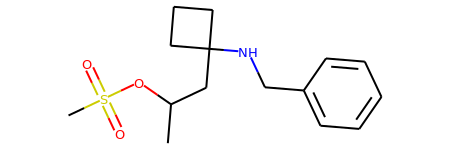

The proposed reaction is:


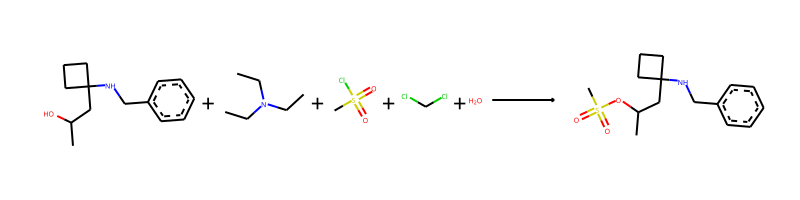

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCN(CC)CC.CS(=O)(=O)Cl.ClCCl.O>>CC(CC1(NCc2ccccc2)CCC1)OS(C)(=O)=O
The fast filter score is 0.982209384


--------------------------------------------------

Train index: 327990
RANK 61 PRECEDENT
REACTANT MATCH SCORE: 0.5652173913043478


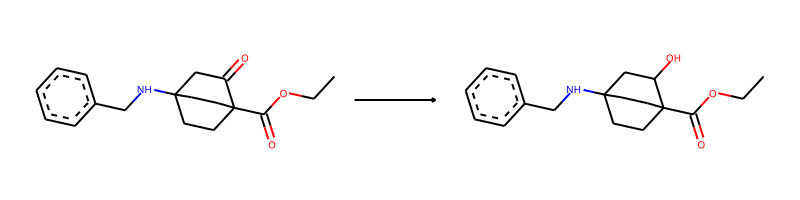

-> template: [#8:1]-[C:2](=[O;D1;H0:3])-[C:4]-[C;H0;D3;+0:5](-[C:6])=[O;H0;D1;+0:7]>>[#8:1]-[C:2](=[O;D1;H0:3])-[C:4]-[CH;D3;+0:5](-[C:6])-[OH;D1;+0:7]


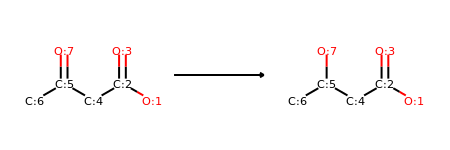

->No precursors could be generated!


--------------------------------------------------

Train index: 398496
RANK 62 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


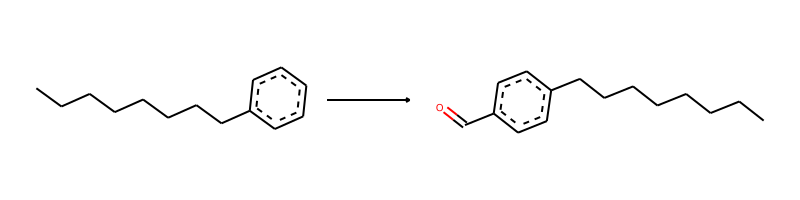

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>O=C-[c;H0;D3;+0:1](:[c:2]):[c:3]


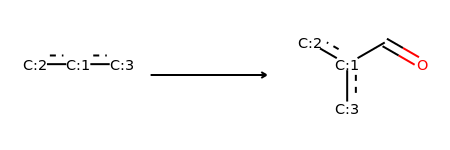

Product similarity 0.6, overall 0.33818181818181814, smiles CC(O)CC1(NCc2ccc(C=O)cc2)CCC1


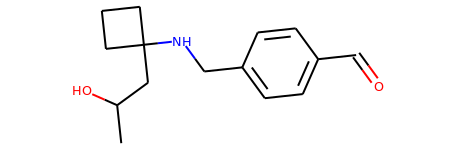

The proposed reaction is:


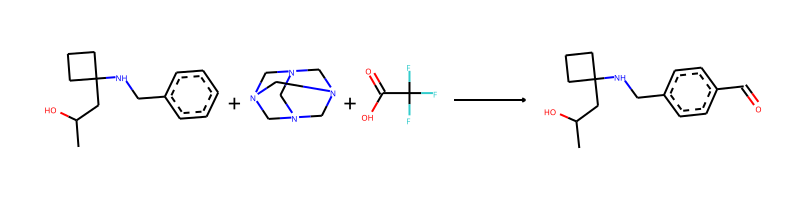

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C1N2CN3CN1CN(C2)C3.O=C(O)C(F)(F)F>>CC(O)CC1(NCc2ccc(C=O)cc2)CCC1
The fast filter score is 0.0831937194
Product similarity 0.5238095238095238, overall 0.29523809523809524, smiles CC(O)CC1(NCc2ccccc2C=O)CCC1


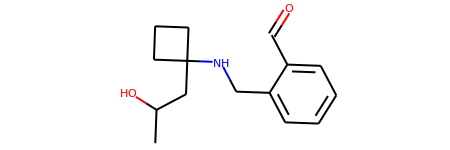

The proposed reaction is:


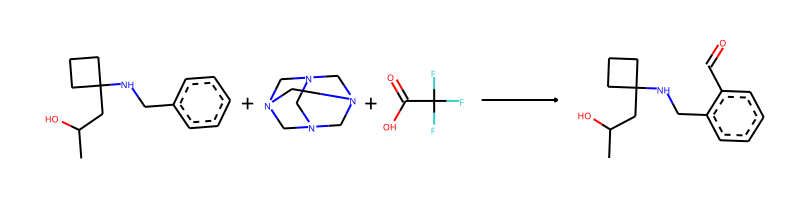

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C1N2CN3CN1CN(C2)C3.O=C(O)C(F)(F)F>>CC(O)CC1(NCc2ccccc2C=O)CCC1
The fast filter score is 0.193693161
Product similarity 0.5483870967741935, overall 0.309090909090909, smiles CC(O)CC1(NCc2cccc(C=O)c2)CCC1


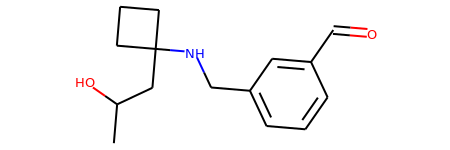

The proposed reaction is:


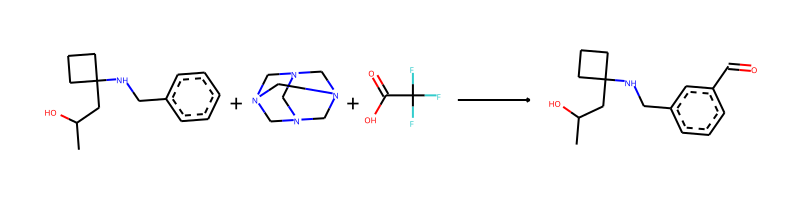

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C1N2CN3CN1CN(C2)C3.O=C(O)C(F)(F)F>>CC(O)CC1(NCc2cccc(C=O)c2)CCC1
The fast filter score is 0.00203174353


--------------------------------------------------

Train index: 58123
RANK 63 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


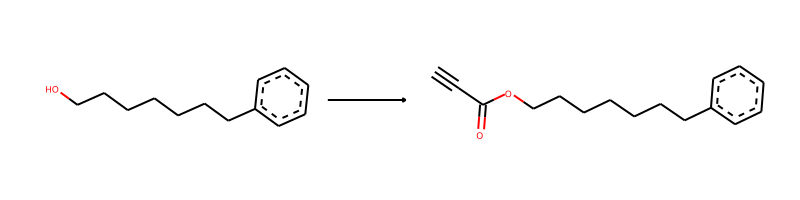

-> template: [C:2]-[OH;D1;+0:1]>>C#C-C(=O)-[O;H0;D2;+0:1]-[C:2]


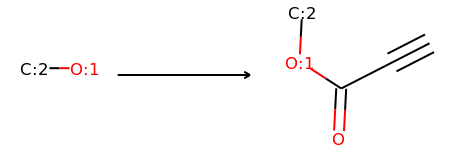

Product similarity 0.6119402985074627, overall 0.3449118046132971, smiles C#CC(=O)OC(C)CC1(NCc2ccccc2)CCC1


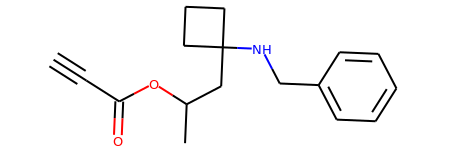

The proposed reaction is:


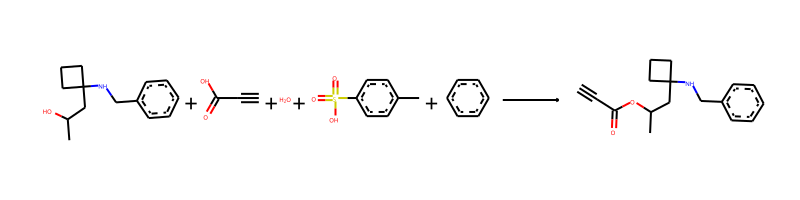

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C#CC(=O)O.O.Cc1ccc(S(=O)(=O)O)cc1.c1ccccc1>>C#CC(=O)OC(C)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.981814504


--------------------------------------------------

Train index: 219532
RANK 64 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


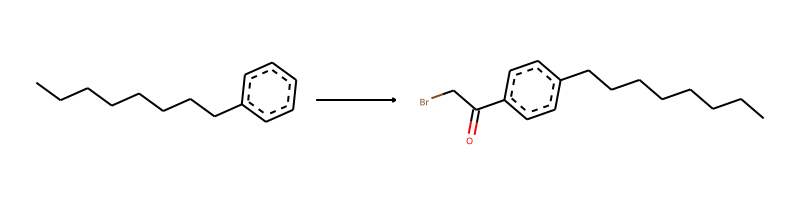

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>Br-C-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


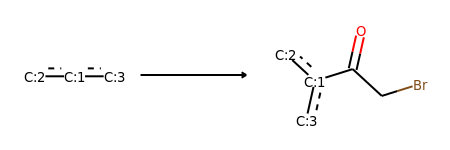

Product similarity 0.582089552238806, overall 0.3280868385345997, smiles CC(O)CC1(NCc2cccc(C(=O)CBr)c2)CCC1


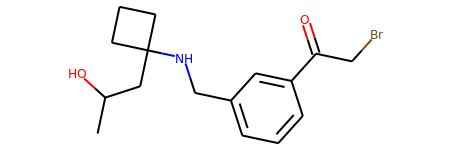

The proposed reaction is:


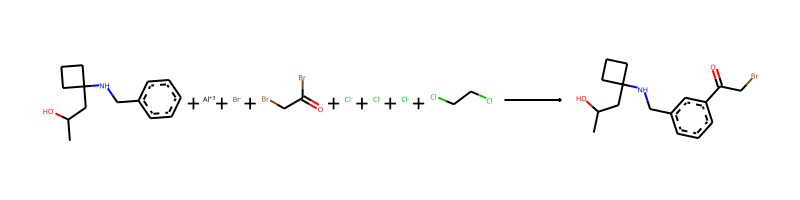

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].[Br-].O=C(Br)CBr.[Cl-].[Cl-].[Cl-].ClCCCl>>CC(O)CC1(NCc2cccc(C(=O)CBr)c2)CCC1
The fast filter score is 0.132385224
Product similarity 0.6307692307692307, overall 0.35552447552447547, smiles CC(O)CC1(NCc2ccc(C(=O)CBr)cc2)CCC1


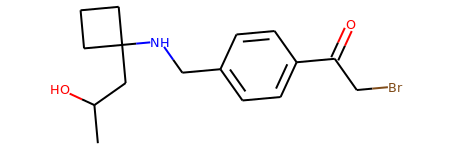

The proposed reaction is:


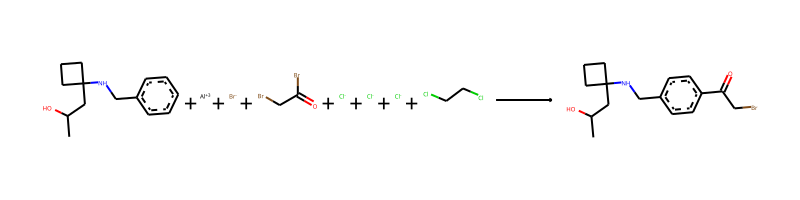

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].[Br-].O=C(Br)CBr.[Cl-].[Cl-].[Cl-].ClCCCl>>CC(O)CC1(NCc2ccc(C(=O)CBr)cc2)CCC1
The fast filter score is 0.0371328
Product similarity 0.5588235294117647, overall 0.31497326203208553, smiles CC(O)CC1(NCc2ccccc2C(=O)CBr)CCC1


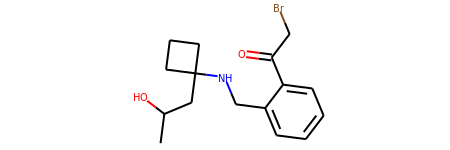

The proposed reaction is:


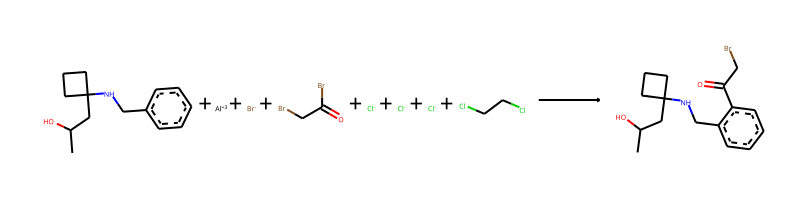

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].[Br-].O=C(Br)CBr.[Cl-].[Cl-].[Cl-].ClCCCl>>CC(O)CC1(NCc2ccccc2C(=O)CBr)CCC1
The fast filter score is 0.000201255083


--------------------------------------------------

Train index: 357926
RANK 65 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


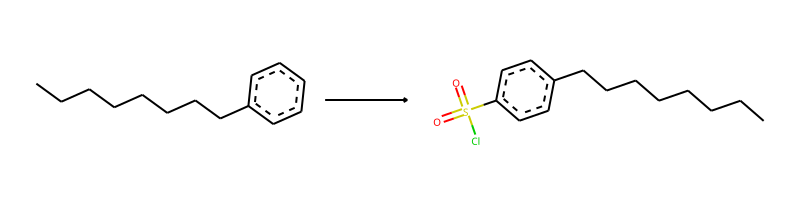

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>Cl-S(=O)(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


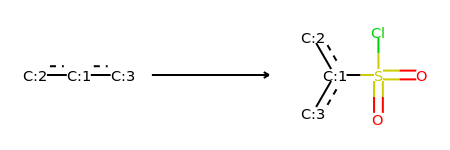

Product similarity 0.625, overall 0.35227272727272724, smiles CC(O)CC1(NCc2ccc(S(=O)(=O)Cl)cc2)CCC1


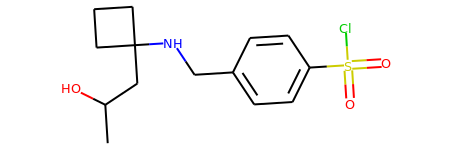

The proposed reaction is:


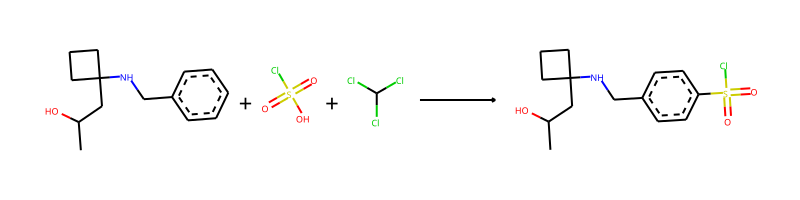

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=S(=O)(O)Cl.ClC(Cl)Cl>>CC(O)CC1(NCc2ccc(S(=O)(=O)Cl)cc2)CCC1
The fast filter score is 0.309603155
Product similarity 0.5757575757575758, overall 0.3245179063360882, smiles CC(O)CC1(NCc2cccc(S(=O)(=O)Cl)c2)CCC1


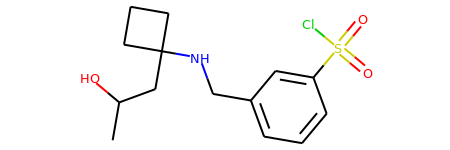

The proposed reaction is:


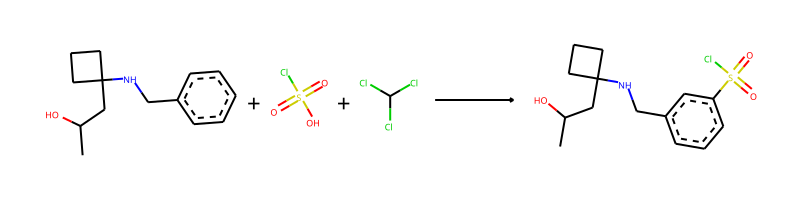

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=S(=O)(O)Cl.ClC(Cl)Cl>>CC(O)CC1(NCc2cccc(S(=O)(=O)Cl)c2)CCC1
The fast filter score is 0.529639184
Product similarity 0.5522388059701493, overall 0.3112618724559023, smiles CC(O)CC1(NCc2ccccc2S(=O)(=O)Cl)CCC1


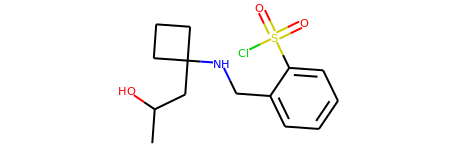

The proposed reaction is:


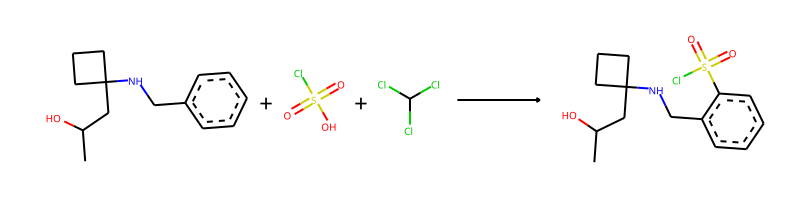

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=S(=O)(O)Cl.ClC(Cl)Cl>>CC(O)CC1(NCc2ccccc2S(=O)(=O)Cl)CCC1
The fast filter score is 0.34713614


--------------------------------------------------

Train index: 52301
RANK 66 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


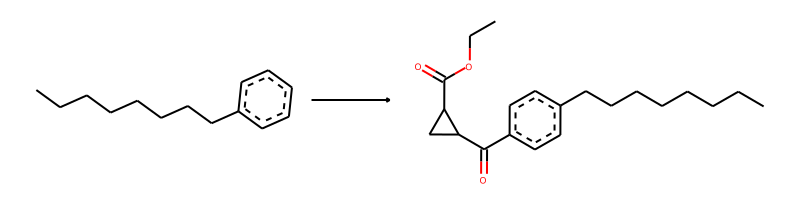

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>C-C-O-C(=O)-C1-C-C-1-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


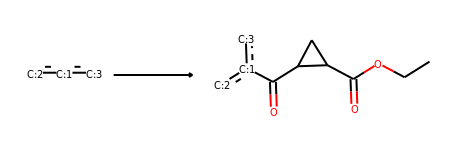

Product similarity 0.6470588235294118, overall 0.36470588235294116, smiles CCOC(=O)C1CC1C(=O)c1ccccc1CNC1(CC(C)O)CCC1


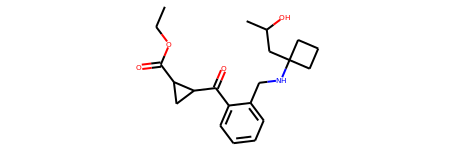

The proposed reaction is:


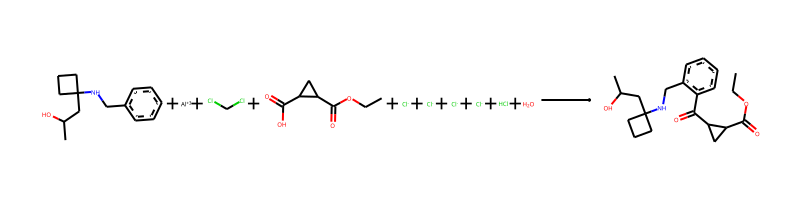

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].ClCCl.CCOC(=O)C1CC1C(=O)O.[Cl-].[Cl-].[Cl-].[Cl-].Cl.O>>CCOC(=O)C1CC1C(=O)c1ccccc1CNC1(CC(C)O)CCC1
The fast filter score is 0.317661345
Product similarity 0.7073170731707317, overall 0.3986696230598669, smiles CCOC(=O)C1CC1C(=O)c1ccc(CNC2(CC(C)O)CCC2)cc1


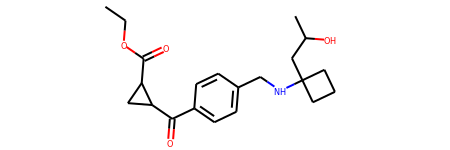

The proposed reaction is:


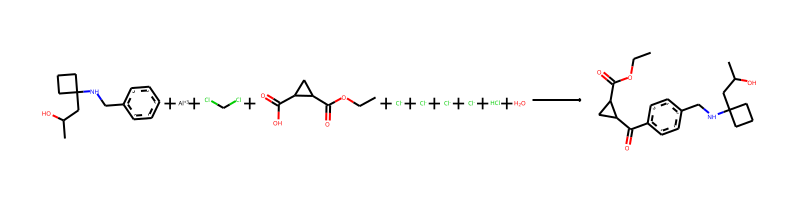

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].ClCCl.CCOC(=O)C1CC1C(=O)O.[Cl-].[Cl-].[Cl-].[Cl-].Cl.O>>CCOC(=O)C1CC1C(=O)c1ccc(CNC2(CC(C)O)CCC2)cc1
The fast filter score is 0.627037764
Product similarity 0.6666666666666666, overall 0.37575757575757573, smiles CCOC(=O)C1CC1C(=O)c1cccc(CNC2(CC(C)O)CCC2)c1


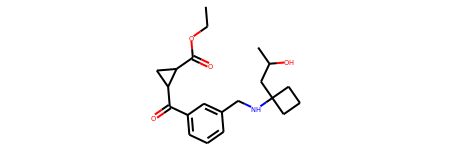

The proposed reaction is:


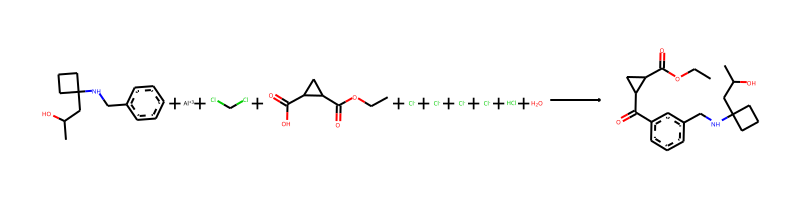

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].ClCCl.CCOC(=O)C1CC1C(=O)O.[Cl-].[Cl-].[Cl-].[Cl-].Cl.O>>CCOC(=O)C1CC1C(=O)c1cccc(CNC2(CC(C)O)CCC2)c1
The fast filter score is 0.885440528


--------------------------------------------------

Train index: 78125
RANK 67 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


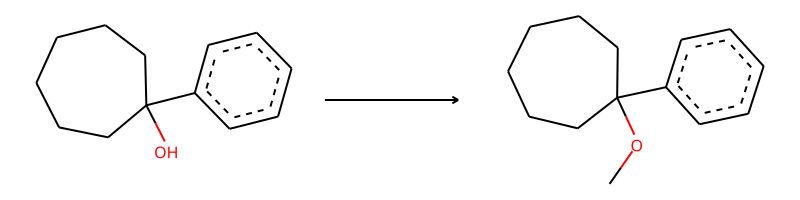

-> template: [C:2]-[OH;D1;+0:1]>>C-[O;H0;D2;+0:1]-[C:2]


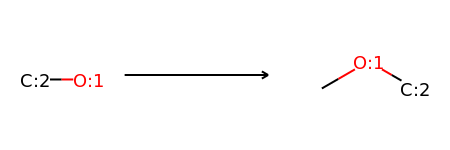

Product similarity 0.559322033898305, overall 0.31525423728813556, smiles COC(C)CC1(NCc2ccccc2)CCC1


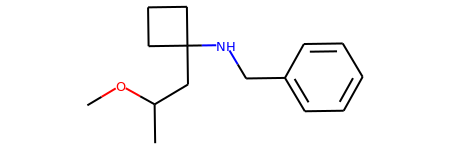

The proposed reaction is:


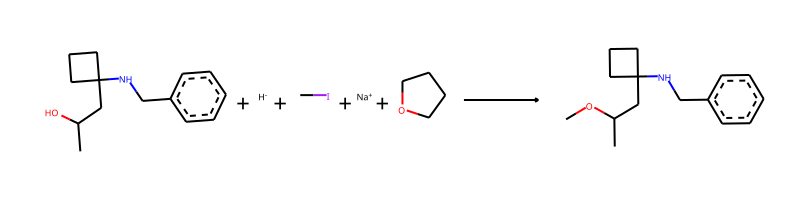

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[H-].CI.[Na+].C1CCOC1>>COC(C)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.993847132


--------------------------------------------------

Train index: 469001
RANK 68 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


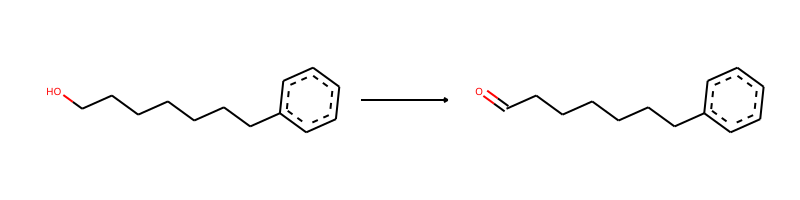

-> template: [C:1]-[CH2;D2;+0:2]-[OH;D1;+0:3]>>[C:1]-[CH;D2;+0:2]=[O;H0;D1;+0:3]


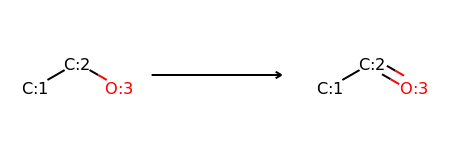

->No precursors could be generated!


--------------------------------------------------

Train index: 89293
RANK 69 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


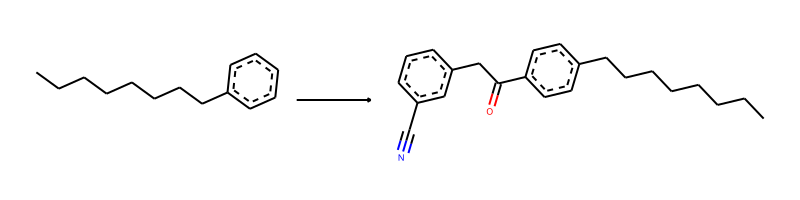

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>N#C-c1:c:c:c:c(-C-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]):c:1


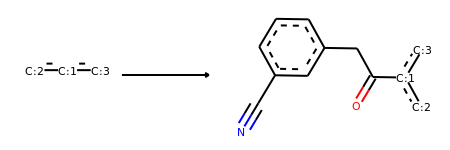

Product similarity 0.6818181818181818, overall 0.38429752066115697, smiles CC(O)CC1(NCc2cccc(C(=O)Cc3cccc(C#N)c3)c2)CCC1


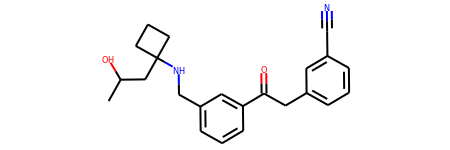

The proposed reaction is:


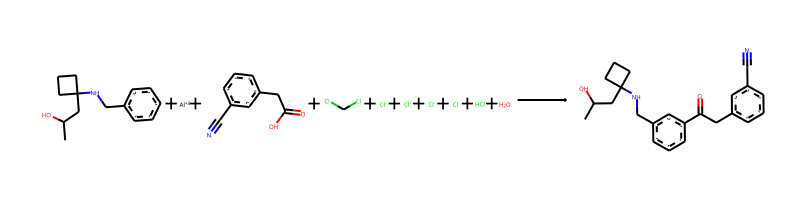

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1cccc(CC(=O)O)c1.ClCCl.[Cl-].[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2cccc(C(=O)Cc3cccc(C#N)c3)c2)CCC1
The fast filter score is 0.998211503
Product similarity 0.6629213483146067, overall 0.37364657814096014, smiles CC(O)CC1(NCc2ccccc2C(=O)Cc2cccc(C#N)c2)CCC1


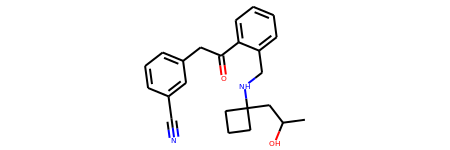

The proposed reaction is:


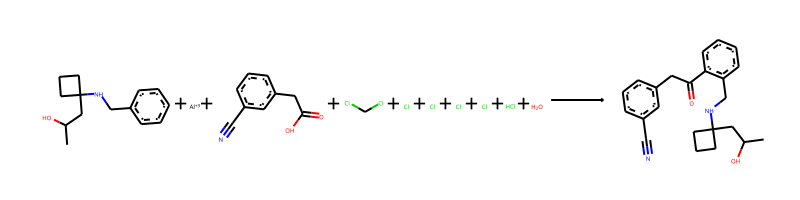

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1cccc(CC(=O)O)c1.ClCCl.[Cl-].[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2ccccc2C(=O)Cc2cccc(C#N)c2)CCC1
The fast filter score is 0.999010921
Product similarity 0.7209302325581395, overall 0.40634249471458767, smiles CC(O)CC1(NCc2ccc(C(=O)Cc3cccc(C#N)c3)cc2)CCC1


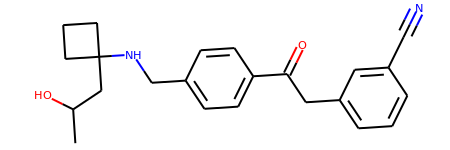

The proposed reaction is:


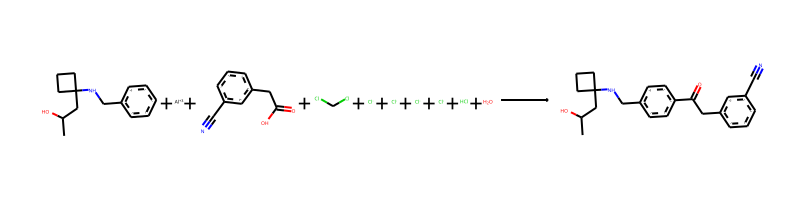

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].N#Cc1cccc(CC(=O)O)c1.ClCCl.[Cl-].[Cl-].[Cl-].[Cl-].Cl.O>>CC(O)CC1(NCc2ccc(C(=O)Cc3cccc(C#N)c3)cc2)CCC1
The fast filter score is 0.998108387


--------------------------------------------------

Train index: 463598
RANK 70 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


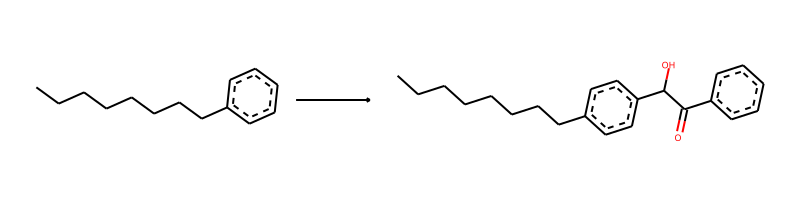

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>O-C(-C(=O)-c1:c:c:c:c:c:1)-[c;H0;D3;+0:1](:[c:2]):[c:3]


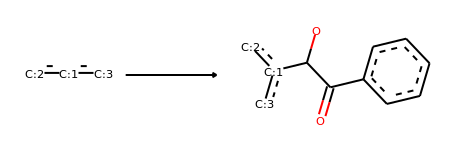

Product similarity 0.6705882352941176, overall 0.37796791443850264, smiles CC(O)CC1(NCc2cccc(C(O)C(=O)c3ccccc3)c2)CCC1


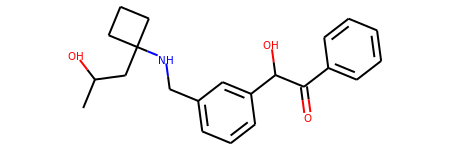

The proposed reaction is:


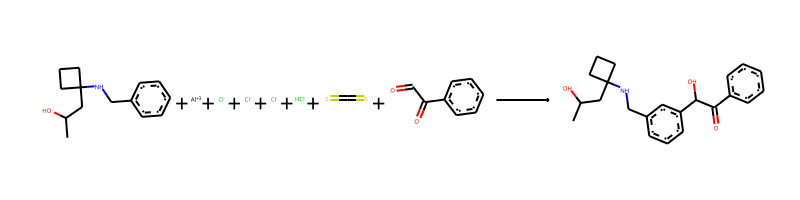

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].[Cl-].[Cl-].[Cl-].Cl.S=C=S.O=CC(=O)c1ccccc1>>CC(O)CC1(NCc2cccc(C(O)C(=O)c3ccccc3)c2)CCC1
The fast filter score is 0.0860677361
Product similarity 0.6511627906976745, overall 0.3670190274841438, smiles CC(O)CC1(NCc2ccccc2C(O)C(=O)c2ccccc2)CCC1


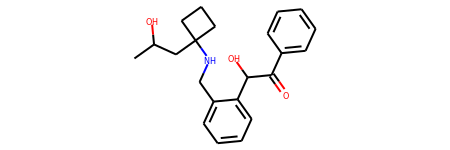

The proposed reaction is:


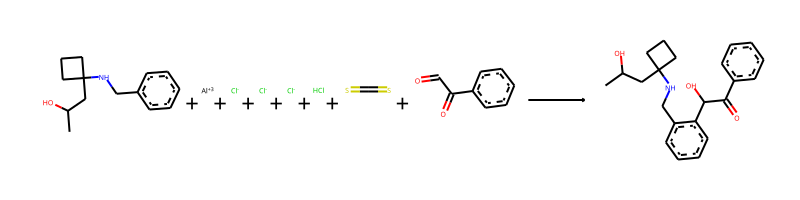

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].[Cl-].[Cl-].[Cl-].Cl.S=C=S.O=CC(=O)c1ccccc1>>CC(O)CC1(NCc2ccccc2C(O)C(=O)c2ccccc2)CCC1
The fast filter score is 0.0633960068
Product similarity 0.7108433734939759, overall 0.40065717415115, smiles CC(O)CC1(NCc2ccc(C(O)C(=O)c3ccccc3)cc2)CCC1


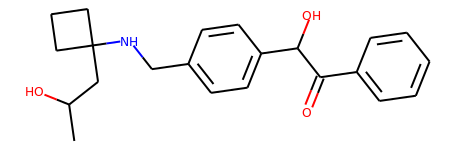

The proposed reaction is:


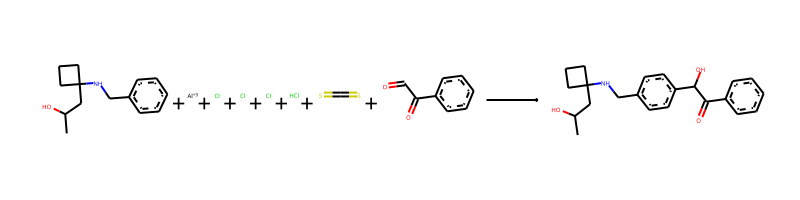

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].[Cl-].[Cl-].[Cl-].Cl.S=C=S.O=CC(=O)c1ccccc1>>CC(O)CC1(NCc2ccc(C(O)C(=O)c3ccccc3)cc2)CCC1
The fast filter score is 0.122272044


--------------------------------------------------

Train index: 108376
RANK 71 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


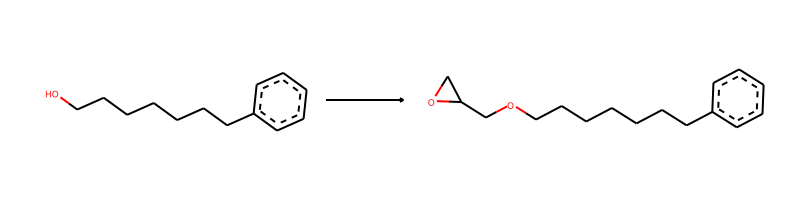

-> template: [C:1]-[OH;D1;+0:2]>>[C:1]-[O;H0;D2;+0:2]-C-C1-C-O-1


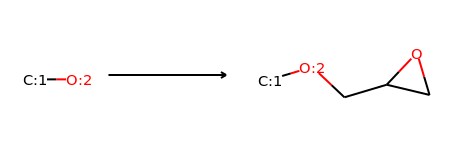

Product similarity 0.6176470588235294, overall 0.3481283422459893, smiles CC(CC1(NCc2ccccc2)CCC1)OCC1CO1


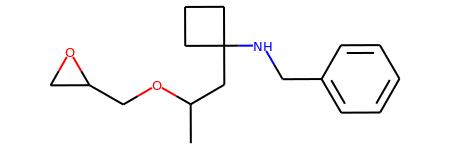

The proposed reaction is:


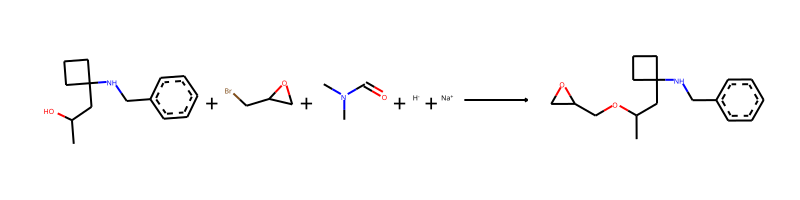

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.BrCC1CO1.CN(C)C=O.[H-].[Na+]>>CC(CC1(NCc2ccccc2)CCC1)OCC1CO1
The fast filter score is 0.981784105


--------------------------------------------------

Train index: 387461
RANK 72 PRECEDENT
REACTANT MATCH SCORE: 0.5636363636363636


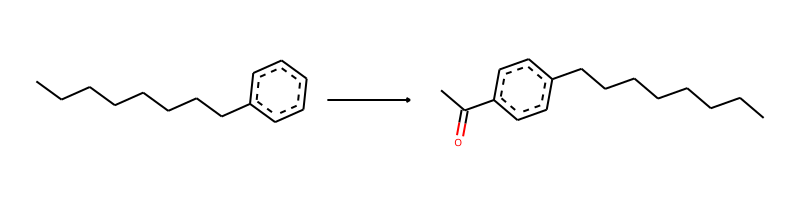

-> template: [c:2]:[cH;D2;+0:1]:[c:3]>>C-C(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]


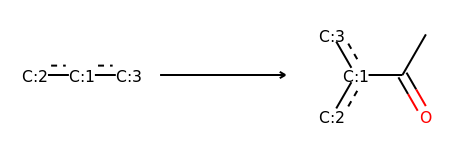

Product similarity 0.5625, overall 0.3170454545454545, smiles CC(=O)c1cccc(CNC2(CC(C)O)CCC2)c1


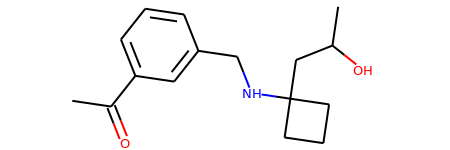

The proposed reaction is:


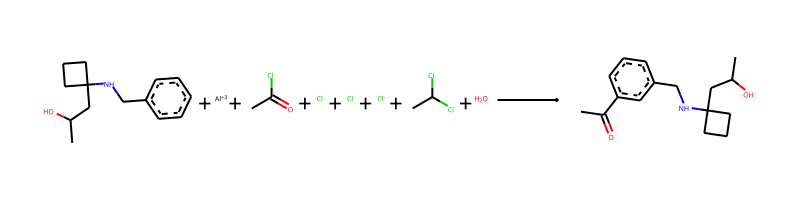

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].CC(=O)Cl.[Cl-].[Cl-].[Cl-].CC(Cl)Cl.O>>CC(=O)c1cccc(CNC2(CC(C)O)CCC2)c1
The fast filter score is 0.0448329747
Product similarity 0.5384615384615384, overall 0.3034965034965035, smiles CC(=O)c1ccccc1CNC1(CC(C)O)CCC1


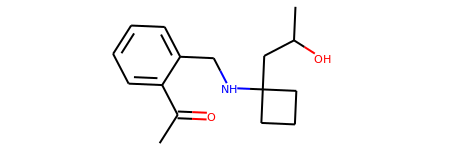

The proposed reaction is:


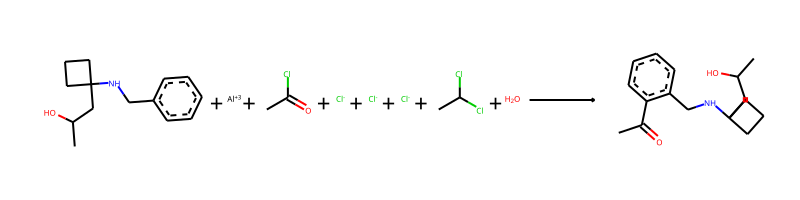

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].CC(=O)Cl.[Cl-].[Cl-].[Cl-].CC(Cl)Cl.O>>CC(=O)c1ccccc1CNC1(CC(C)O)CCC1
The fast filter score is 0.600030482
Product similarity 0.6129032258064516, overall 0.34545454545454546, smiles CC(=O)c1ccc(CNC2(CC(C)O)CCC2)cc1


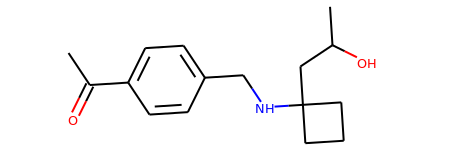

The proposed reaction is:


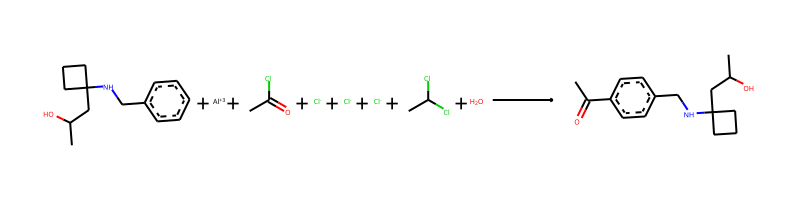

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.[Al+3].CC(=O)Cl.[Cl-].[Cl-].[Cl-].CC(Cl)Cl.O>>CC(=O)c1ccc(CNC2(CC(C)O)CCC2)cc1
The fast filter score is 0.4724347


--------------------------------------------------

Train index: 104975
RANK 73 PRECEDENT
REACTANT MATCH SCORE: 0.5614035087719298


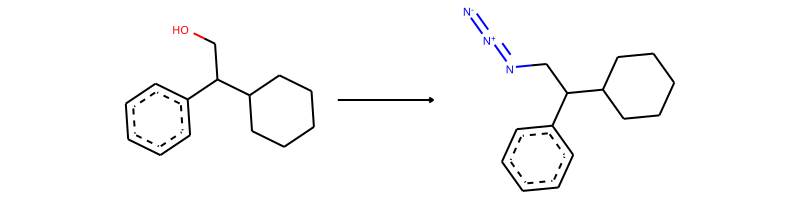

-> template: [C:1]-[CH2;D2;+0:2]-[O;H1;D1;+0]>>[C:1]-[CH2;D2;+0:2]-N=[N+]=[N-]


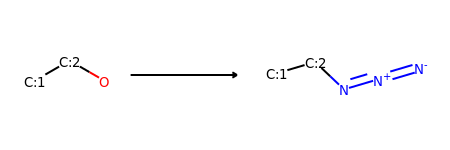

->No precursors could be generated!


--------------------------------------------------

Train index: 64007
RANK 74 PRECEDENT
REACTANT MATCH SCORE: 0.5614035087719298


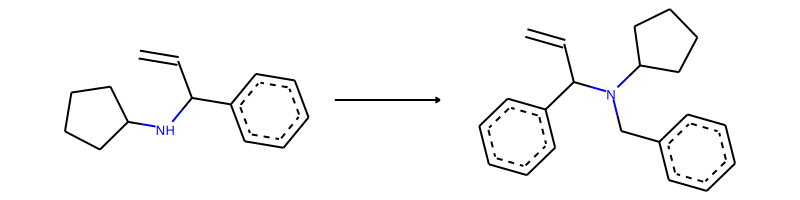

-> template: [C:1]-[NH;D2;+0:2]-[C:3]-[C:4]=[C;D1;H2:5]>>[C:1]-[N;H0;D3;+0:2](-C-c1:c:c:c:c:c:1)-[C:3]-[C:4]=[C;D1;H2:5]


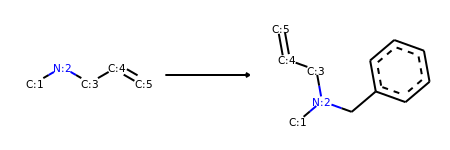

->No precursors could be generated!


--------------------------------------------------

Train index: 8248
RANK 75 PRECEDENT
REACTANT MATCH SCORE: 0.5614035087719298


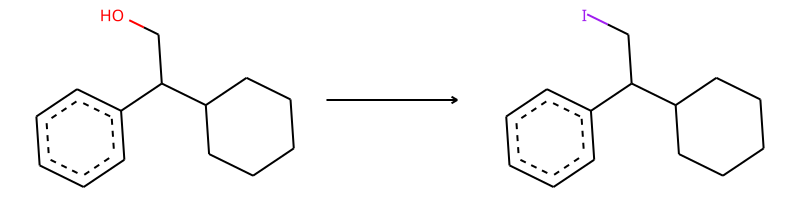

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>I-[CH2;D2;+0:1]-[C:2]


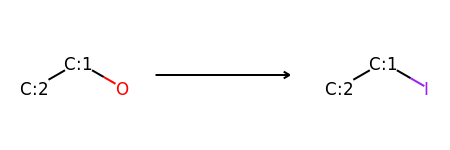

->No precursors could be generated!


--------------------------------------------------

Train index: 185661
RANK 76 PRECEDENT
REACTANT MATCH SCORE: 0.5614035087719298


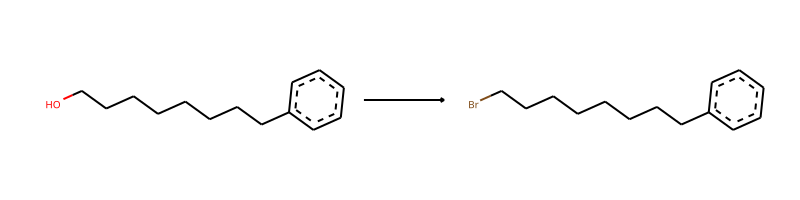

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Br-[CH2;D2;+0:1]-[C:2]


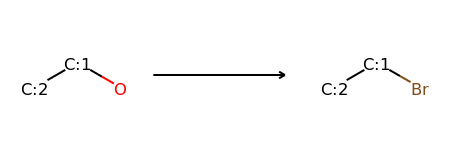

->No precursors could be generated!


--------------------------------------------------

Train index: 247025
RANK 77 PRECEDENT
REACTANT MATCH SCORE: 0.5614035087719298


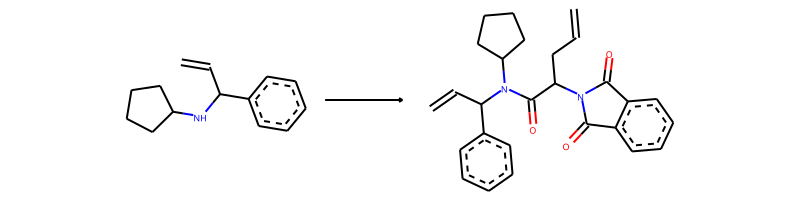

-> template: [C:2]-[NH;D2;+0:1]-[C:3]-[C:4]=[C;D1;H2:5]>>C=C-C-C(-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]-[C:4]=[C;D1;H2:5])-N1-C(=O)-c2:c:c:c:c:c:2-C-1=O


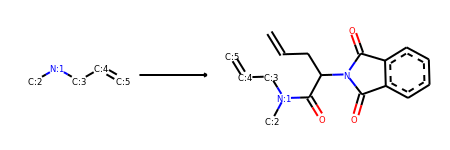

->No precursors could be generated!


--------------------------------------------------

Train index: 368951
RANK 78 PRECEDENT
REACTANT MATCH SCORE: 0.559322033898305


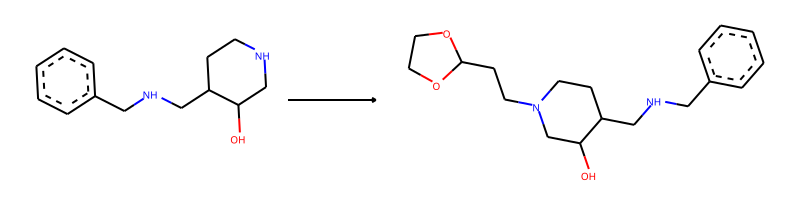

-> template: [C:1]-[NH;D2;+0:2]-[C:3]>>[C:1]-[N;H0;D3;+0:2](-[C:3])-C-C-C1-O-C-C-O-1


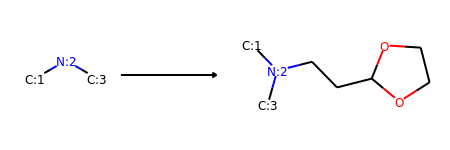

Product similarity 0.6144578313253012, overall 0.34367980396160913, smiles CC(O)CC1(N(CCC2OCCO2)Cc2ccccc2)CCC1


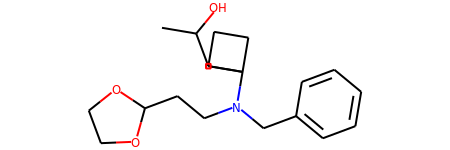

The proposed reaction is:


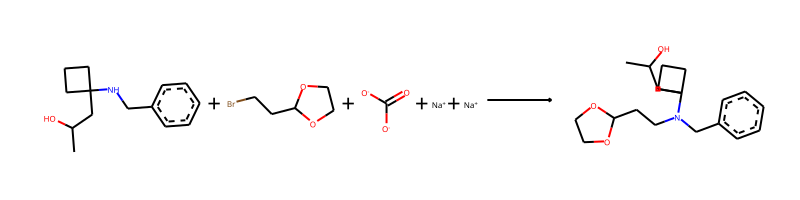

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.BrCCC1OCCO1.O=C([O-])[O-].[Na+].[Na+]>>CC(O)CC1(N(CCC2OCCO2)Cc2ccccc2)CCC1
The fast filter score is 0.565905213


--------------------------------------------------

Train index: 475949
RANK 79 PRECEDENT
REACTANT MATCH SCORE: 0.559322033898305


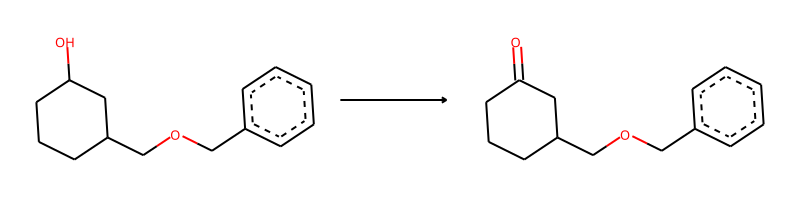

-> template: [C:1]-[CH;D3;+0:2](-[C:3])-[OH;D1;+0:4]>>[C:1]-[C;H0;D3;+0:2](-[C:3])=[O;H0;D1;+0:4]


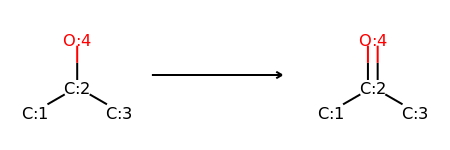

Product similarity 0.559322033898305, overall 0.3128411376041367, smiles CC(=O)CC1(NCc2ccccc2)CCC1


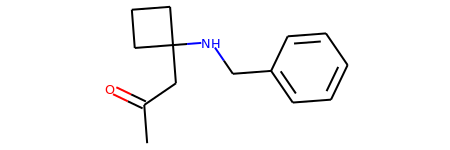

The proposed reaction is:


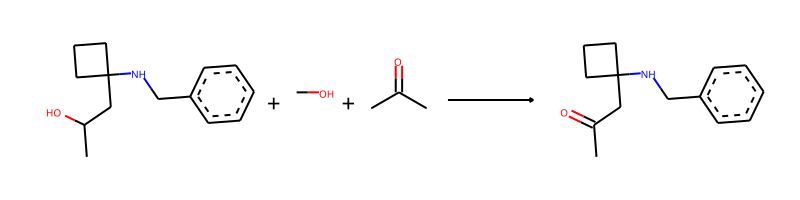

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CO.CC(C)=O>>CC(=O)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.455824435


--------------------------------------------------

Train index: 397762
RANK 80 PRECEDENT
REACTANT MATCH SCORE: 0.559322033898305


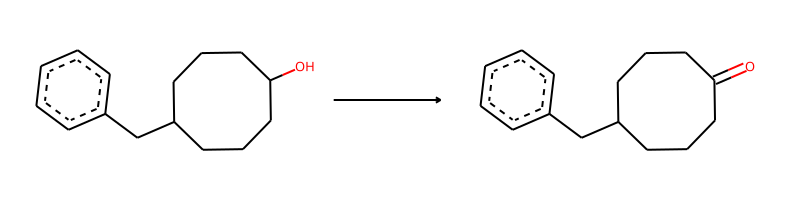

-> template: [C:1]-[CH;D3;+0:2](-[C:3])-[OH;D1;+0:4]>>[C:1]-[C;H0;D3;+0:2](-[C:3])=[O;H0;D1;+0:4]


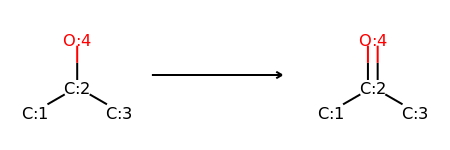

Product similarity 0.559322033898305, overall 0.3128411376041367, smiles CC(=O)CC1(NCc2ccccc2)CCC1


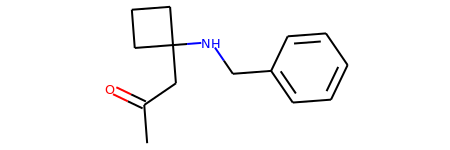

The proposed reaction is:


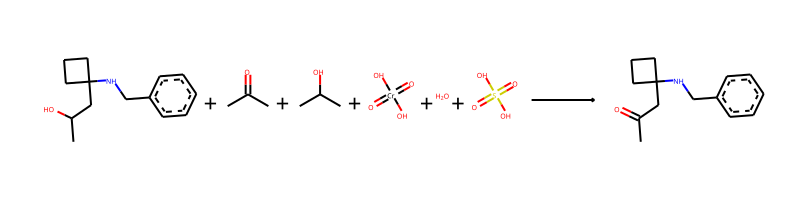

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CC(C)=O.CC(C)O.O=[Cr](=O)(O)O.O.O=S(=O)(O)O>>CC(=O)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.715943336


--------------------------------------------------

Train index: 409338
RANK 81 PRECEDENT
REACTANT MATCH SCORE: 0.5576923076923077


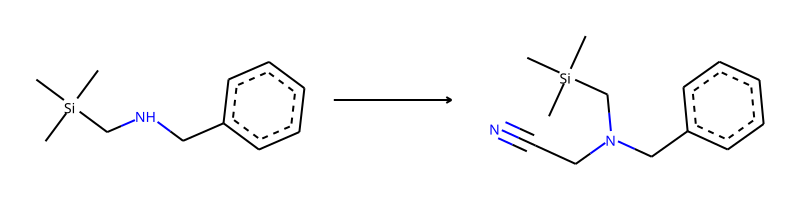

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>N#C-C-[N;H0;D3;+0:1](-[C:2])-[C:3]


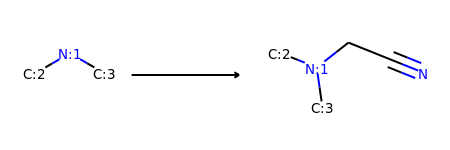

Product similarity 0.6166666666666667, overall 0.3439102564102564, smiles CC(O)CC1(N(CC#N)Cc2ccccc2)CCC1


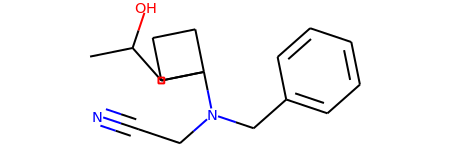

The proposed reaction is:


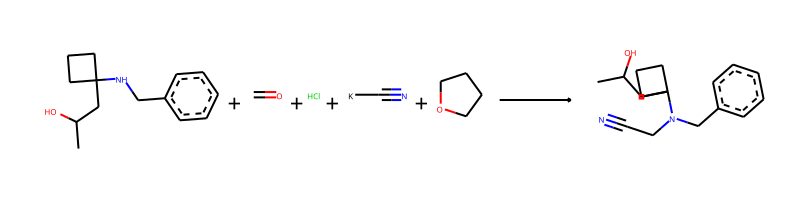

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C=O.Cl.N#C[K].C1CCOC1>>CC(O)CC1(N(CC#N)Cc2ccccc2)CCC1
The fast filter score is 0.19173798


--------------------------------------------------

Train index: 322623
RANK 82 PRECEDENT
REACTANT MATCH SCORE: 0.5573770491803278


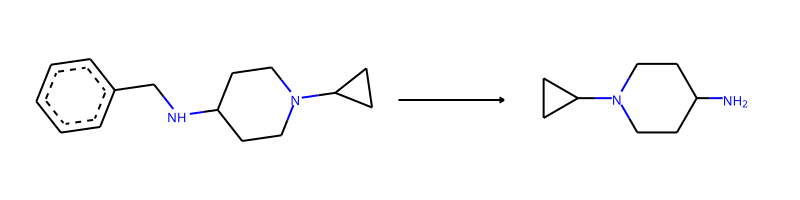

-> template: [C:1]-[NH;D2;+0:2]-[C;H2;D2;+0]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[C:1]-[NH2;D1;+0:2]


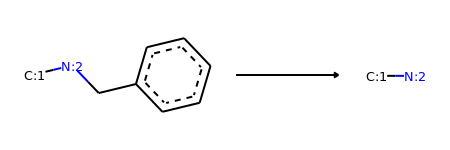

Product similarity 0.34210526315789475, overall 0.1906816220880069, smiles CC(O)CC1(N)CCC1


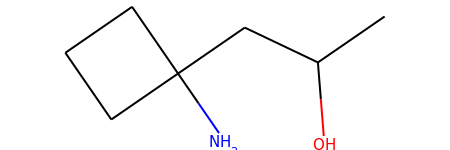

The proposed reaction is:


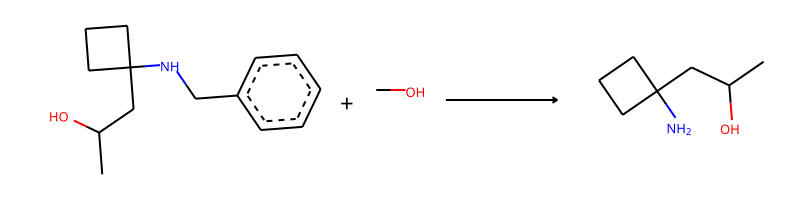

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CO>>CC(O)CC1(N)CCC1
The fast filter score is 0.802094221


--------------------------------------------------

Train index: 363197
RANK 83 PRECEDENT
REACTANT MATCH SCORE: 0.5573770491803278


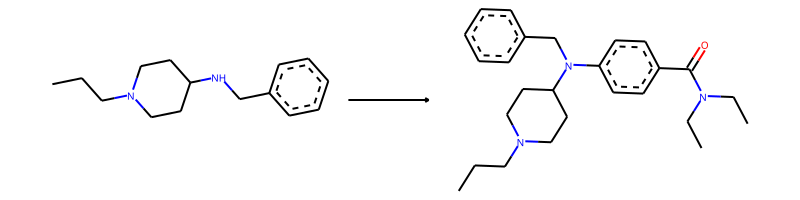

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>C-C-N(-C-C)-C(=O)-c1:c:c:c(-[N;H0;D3;+0:1](-[C:2])-[C:3]):c:c:1


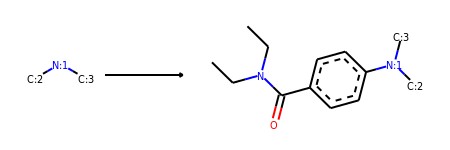

Product similarity 0.7216494845360825, overall 0.40223086023322624, smiles CCN(CC)C(=O)c1ccc(N(Cc2ccccc2)C2(CC(C)O)CCC2)cc1


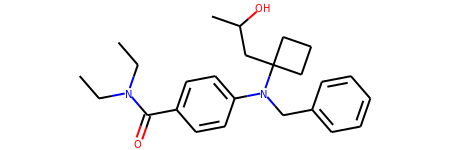

The proposed reaction is:


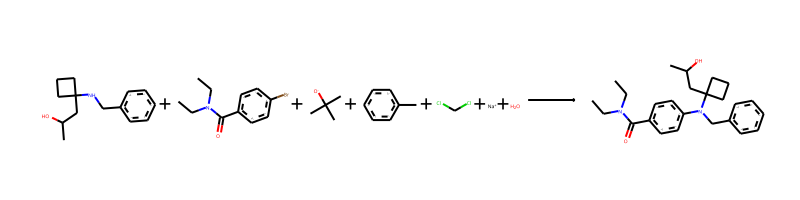

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCN(CC)C(=O)c1ccc(Br)cc1.CC(C)(C)[O-].Cc1ccccc1.ClCCl.[Na+].O>>CCN(CC)C(=O)c1ccc(N(Cc2ccccc2)C2(CC(C)O)CCC2)cc1
The fast filter score is 0.9947837


--------------------------------------------------

Train index: 310894
RANK 84 PRECEDENT
REACTANT MATCH SCORE: 0.5555555555555556


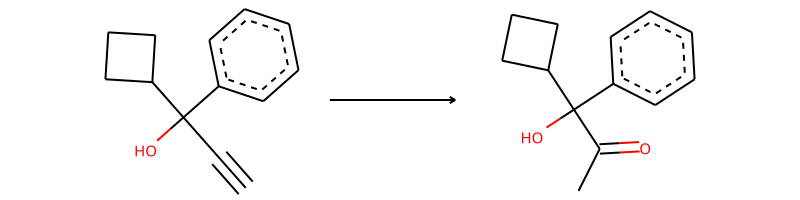

-> template: [C:2]-[C;H0;D2;+0:1]#[CH;D1;+0:3]>>O=[C;H0;D3;+0:1](-[C:2])-[CH3;D1;+0:3]


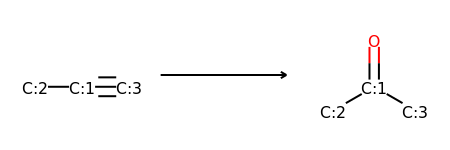

->No precursors could be generated!


--------------------------------------------------

Train index: 411153
RANK 85 PRECEDENT
REACTANT MATCH SCORE: 0.5555555555555556


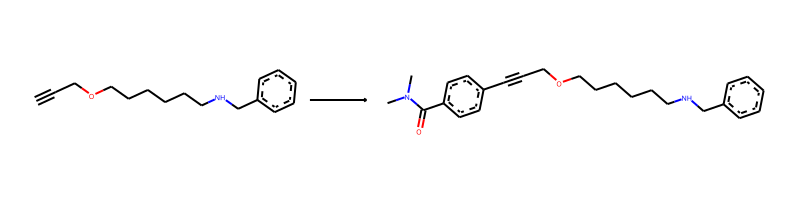

-> template: [C:2]#[CH;D1;+0:1]>>C-N(-C)-C(=O)-c1:c:c:c(-[C;H0;D2;+0:1]#[C:2]):c:c:1


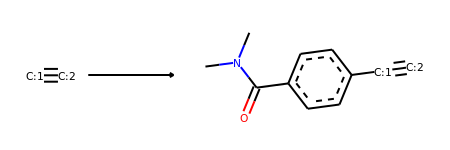

->No precursors could be generated!


--------------------------------------------------

Train index: 181594
RANK 86 PRECEDENT
REACTANT MATCH SCORE: 0.5555555555555556


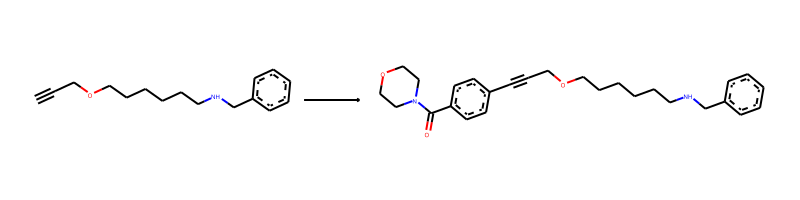

-> template: [C:2]#[CH;D1;+0:1]>>O=C(-N1-C-C-O-C-C-1)-c1:c:c:c(-[C;H0;D2;+0:1]#[C:2]):c:c:1


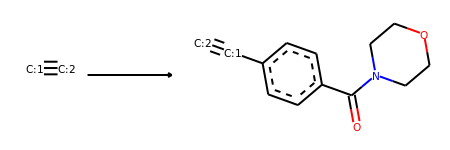

->No precursors could be generated!


--------------------------------------------------

Train index: 457910
RANK 87 PRECEDENT
REACTANT MATCH SCORE: 0.5555555555555556


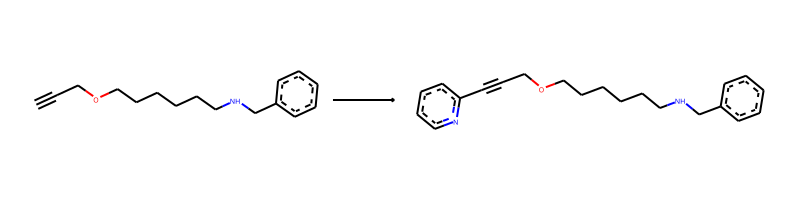

-> template: [C:1]#[CH;D1;+0:2]>>[C:1]#[C;H0;D2;+0:2]-c1:c:c:c:c:n:1


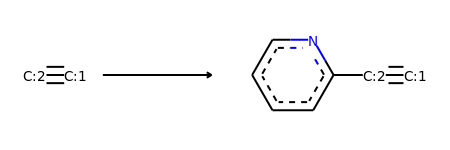

->No precursors could be generated!


--------------------------------------------------

Train index: 247692
RANK 88 PRECEDENT
REACTANT MATCH SCORE: 0.5538461538461539


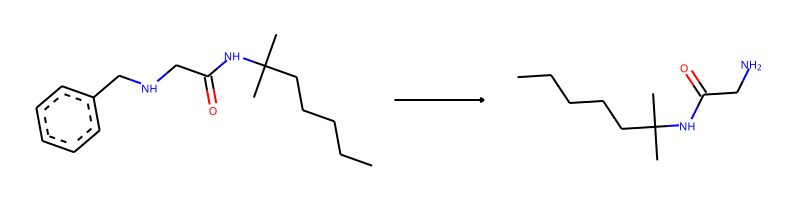

-> template: [#7:1]-[C:2](=[O;D1;H0:3])-[C:4]-[NH;D2;+0:5]-[C;H2;D2;+0]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[#7:1]-[C:2](=[O;D1;H0:3])-[C:4]-[NH2;D1;+0:5]


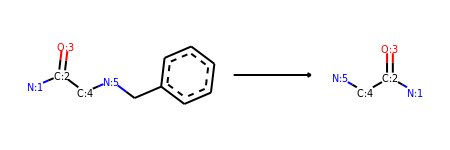

->No precursors could be generated!


--------------------------------------------------

Train index: 328108
RANK 89 PRECEDENT
REACTANT MATCH SCORE: 0.5535714285714286


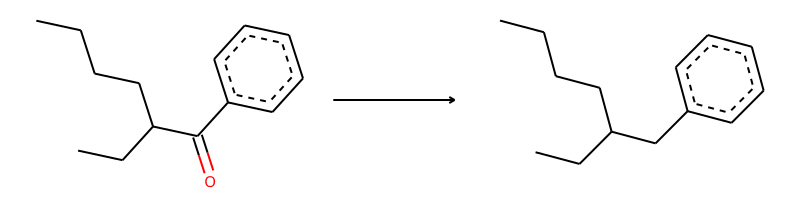

-> template: [C:1]-[C;H0;D3;+0:2](=[O;H0;D1;+0])-[c:3]>>[C:1]-[CH2;D2;+0:2]-[c:3]


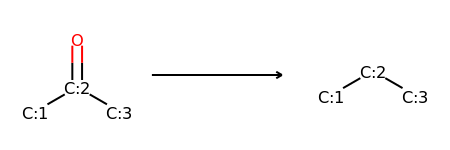

->No precursors could be generated!


--------------------------------------------------

Train index: 6608
RANK 90 PRECEDENT
REACTANT MATCH SCORE: 0.5535714285714286


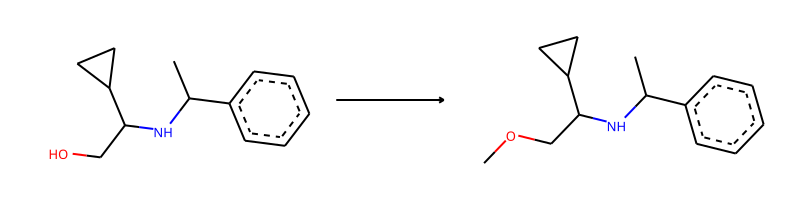

-> template: [C:2]-[OH;D1;+0:1]>>C-[O;H0;D2;+0:1]-[C:2]


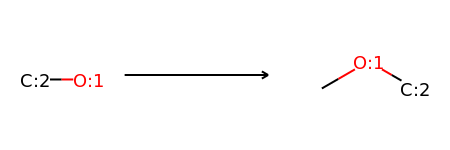

Product similarity 0.55, overall 0.30446428571428574, smiles COC(C)CC1(NCc2ccccc2)CCC1


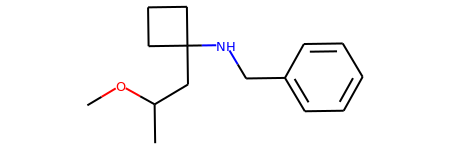

The proposed reaction is:


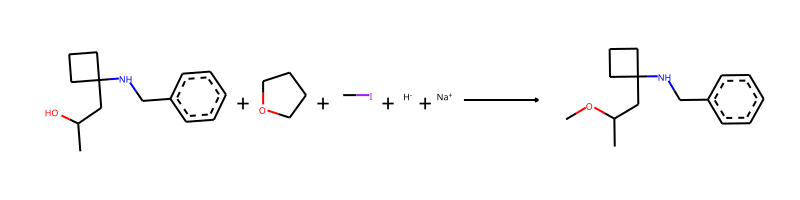

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.C1CCOC1.CI.[H-].[Na+]>>COC(C)CC1(NCc2ccccc2)CCC1
The fast filter score is 0.993847132


--------------------------------------------------

Train index: 16678
RANK 91 PRECEDENT
REACTANT MATCH SCORE: 0.5517241379310345


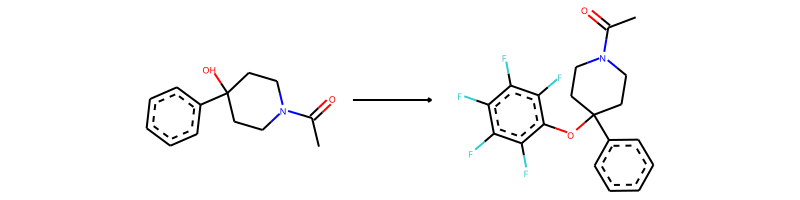

-> template: [C:2]-[OH;D1;+0:1]>>F-c1:c(-F):c(-F):c(-[O;H0;D2;+0:1]-[C:2]):c(-F):c:1-F


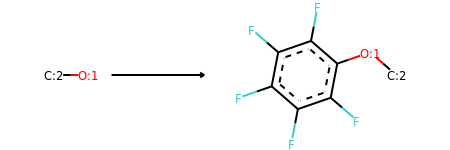

Product similarity 0.6818181818181818, overall 0.37617554858934166, smiles CC(CC1(NCc2ccccc2)CCC1)Oc1c(F)c(F)c(F)c(F)c1F


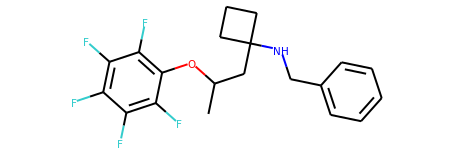

The proposed reaction is:


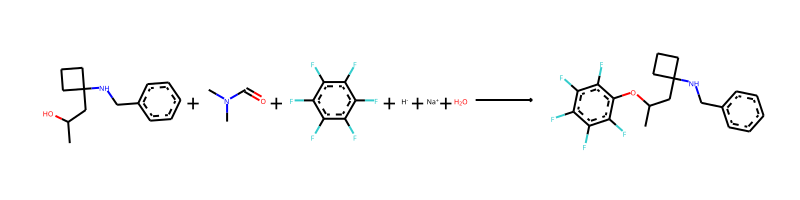

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CN(C)C=O.Fc1c(F)c(F)c(F)c(F)c1F.[H-].[Na+].O>>CC(CC1(NCc2ccccc2)CCC1)Oc1c(F)c(F)c(F)c(F)c1F
The fast filter score is 0.443971425


--------------------------------------------------

Train index: 268885
RANK 92 PRECEDENT
REACTANT MATCH SCORE: 0.5517241379310345


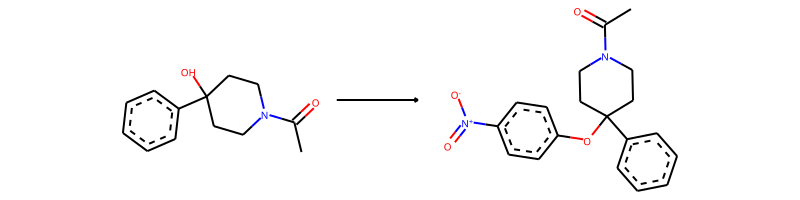

-> template: [C:2]-[OH;D1;+0:1]>>O=[N+](-[O-])-c1:c:c:c(-[O;H0;D2;+0:1]-[C:2]):c:c:1


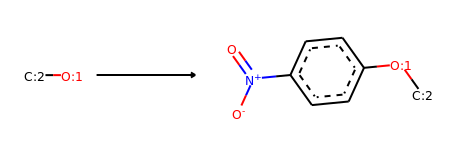

Product similarity 0.6705882352941176, overall 0.3699797160243407, smiles CC(CC1(NCc2ccccc2)CCC1)Oc1ccc([N+](=O)[O-])cc1


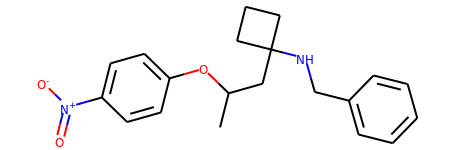

The proposed reaction is:


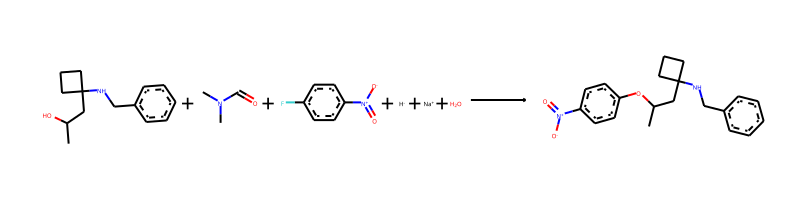

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CN(C)C=O.O=[N+]([O-])c1ccc(F)cc1.[H-].[Na+].O>>CC(CC1(NCc2ccccc2)CCC1)Oc1ccc([N+](=O)[O-])cc1
The fast filter score is 0.840759277


--------------------------------------------------

Train index: 243093
RANK 93 PRECEDENT
REACTANT MATCH SCORE: 0.5510204081632653


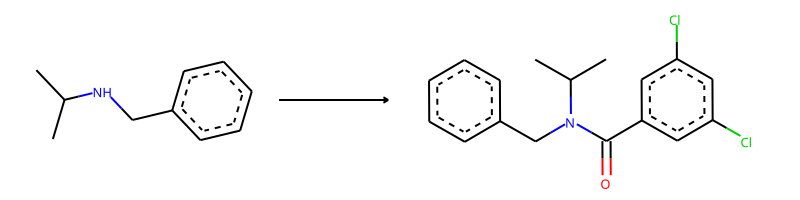

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>Cl-c1:c:c(-Cl):c:c(-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]):c:1


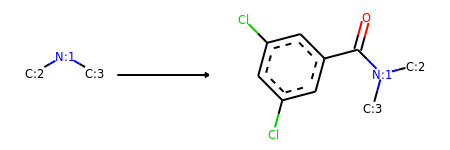

Product similarity 0.7105263157894737, overall 0.3915145005370569, smiles CC(O)CC1(N(Cc2ccccc2)C(=O)c2cc(Cl)cc(Cl)c2)CCC1


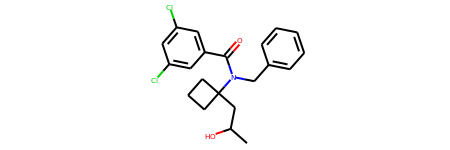

The proposed reaction is:


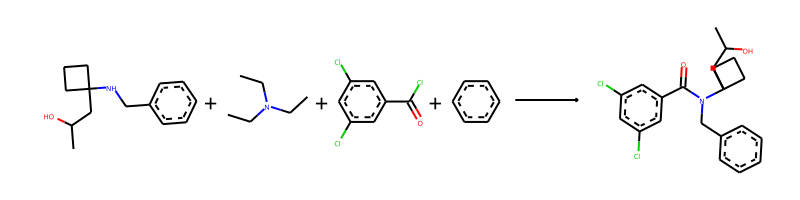

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCN(CC)CC.O=C(Cl)c1cc(Cl)cc(Cl)c1.c1ccccc1>>CC(O)CC1(N(Cc2ccccc2)C(=O)c2cc(Cl)cc(Cl)c2)CCC1
The fast filter score is 0.97097671


--------------------------------------------------

Train index: 240606
RANK 94 PRECEDENT
REACTANT MATCH SCORE: 0.5510204081632653


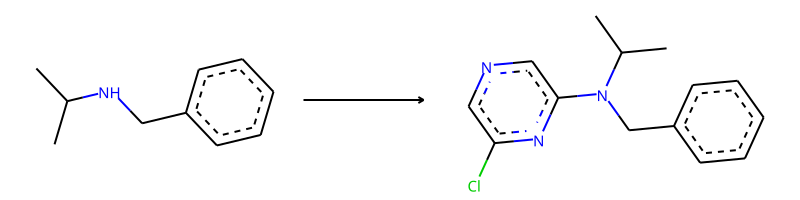

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>Cl-c1:c:n:c:c(-[N;H0;D3;+0:1](-[C:2])-[C:3]):n:1


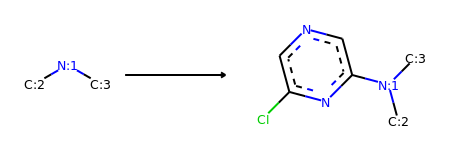

Product similarity 0.6811594202898551, overall 0.3753327417923691, smiles CC(O)CC1(N(Cc2ccccc2)c2cncc(Cl)n2)CCC1


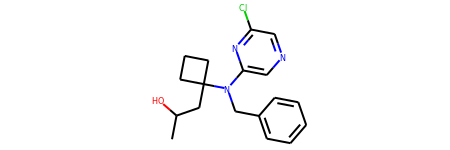

The proposed reaction is:


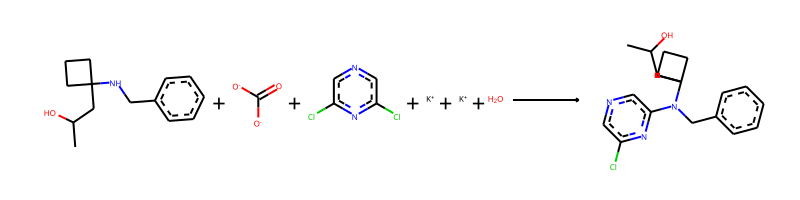

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=C([O-])[O-].Clc1cncc(Cl)n1.[K+].[K+].O>>CC(O)CC1(N(Cc2ccccc2)c2cncc(Cl)n2)CCC1
The fast filter score is 0.507206082


--------------------------------------------------

Train index: 183237
RANK 95 PRECEDENT
REACTANT MATCH SCORE: 0.5510204081632653


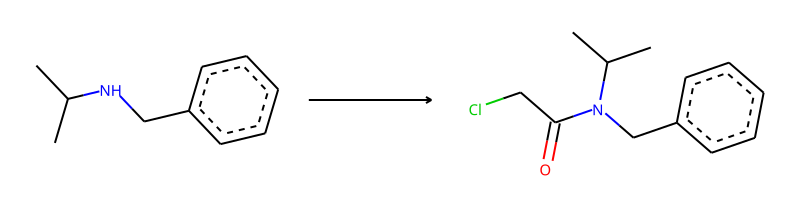

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>Cl-C-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]


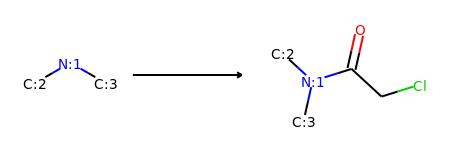

Product similarity 0.6271186440677966, overall 0.34555517122103074, smiles CC(O)CC1(N(Cc2ccccc2)C(=O)CCl)CCC1


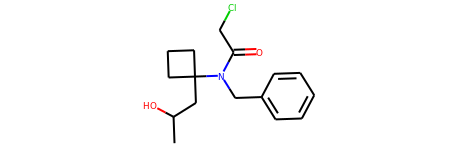

The proposed reaction is:


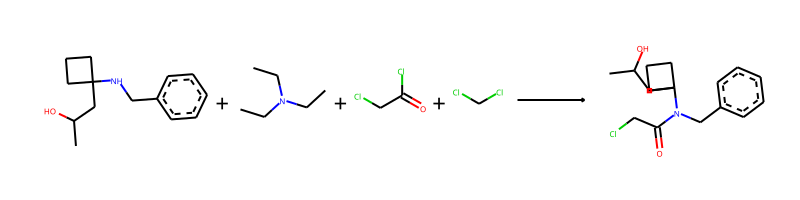

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CCN(CC)CC.O=C(Cl)CCl.ClCCl>>CC(O)CC1(N(Cc2ccccc2)C(=O)CCl)CCC1
The fast filter score is 0.936316729


--------------------------------------------------

Train index: 383719
RANK 96 PRECEDENT
REACTANT MATCH SCORE: 0.5510204081632653


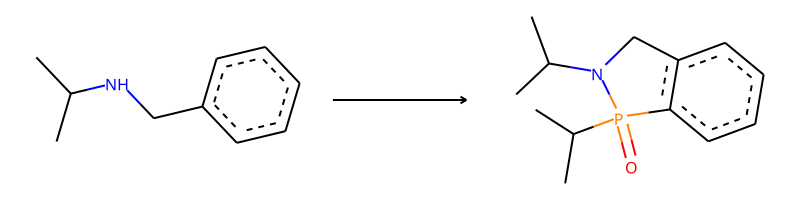

-> template: [C:2]-[NH;D2;+0:1]-[C:3]-[c:4]:[cH;D2;+0:5]:[c:6]>>C-C(-C)-P1(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]-[c:4]:[c;H0;D3;+0:5]-1:[c:6]


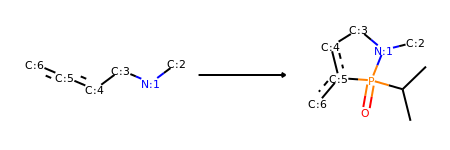

Product similarity 0.639344262295082, overall 0.3522917363666778, smiles CC(O)CC1(N2Cc3ccccc3P2(=O)C(C)C)CCC1


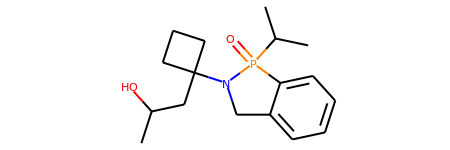

The proposed reaction is:


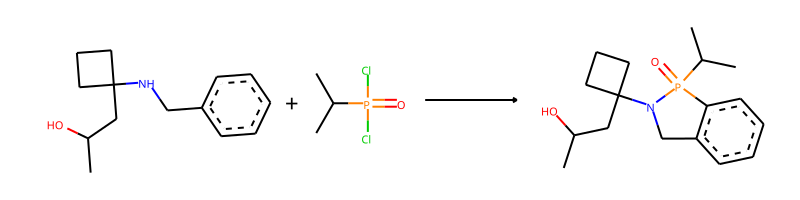

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CC(C)P(=O)(Cl)Cl>>CC(O)CC1(N2Cc3ccccc3P2(=O)C(C)C)CCC1
The fast filter score is 0.899341583


--------------------------------------------------

Train index: 144952
RANK 97 PRECEDENT
REACTANT MATCH SCORE: 0.5510204081632653


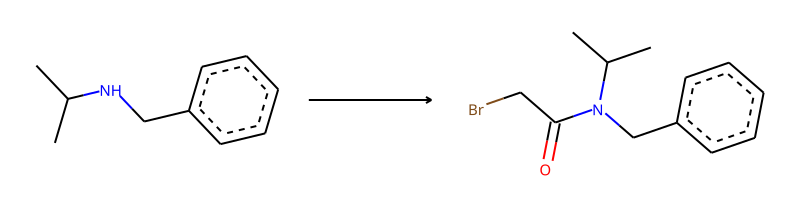

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>Br-C-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]


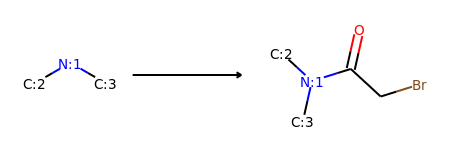

Product similarity 0.6271186440677966, overall 0.34555517122103074, smiles CC(O)CC1(N(Cc2ccccc2)C(=O)CBr)CCC1


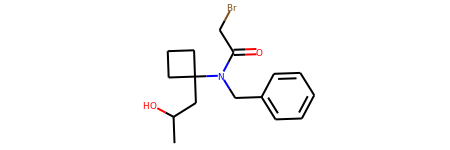

The proposed reaction is:


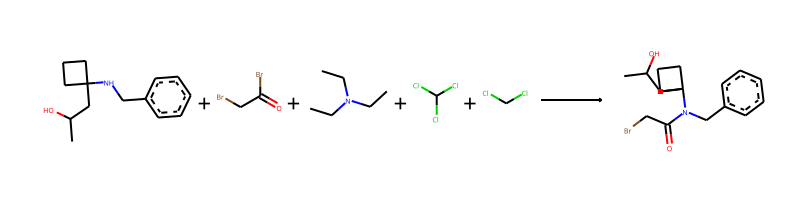

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.O=C(Br)CBr.CCN(CC)CC.ClC(Cl)Cl.ClCCl>>CC(O)CC1(N(Cc2ccccc2)C(=O)CBr)CCC1
The fast filter score is 0.974359095


--------------------------------------------------

Train index: 14763
RANK 98 PRECEDENT
REACTANT MATCH SCORE: 0.5490196078431373


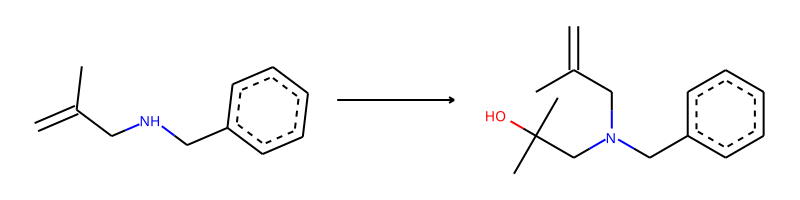

-> template: [C:2]-[NH;D2;+0:1]-[C:3]-[C:4]=[C;D1;H2:5]>>C-C(-C)(-O)-C-[N;H0;D3;+0:1](-[C:2])-[C:3]-[C:4]=[C;D1;H2:5]


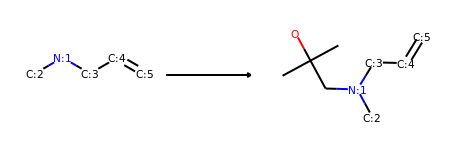

->No precursors could be generated!


--------------------------------------------------

Train index: 460175
RANK 99 PRECEDENT
REACTANT MATCH SCORE: 0.5483870967741935


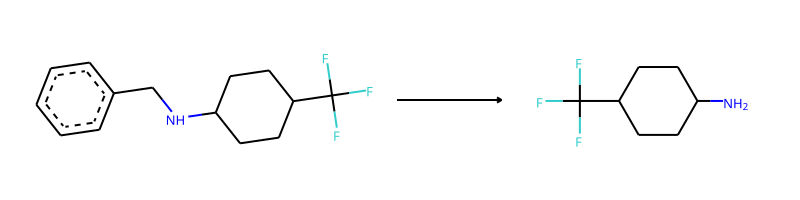

-> template: [C:1]-[NH;D2;+0:2]-[C;H2;D2;+0]-[c;H0;D3;+0]1:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:[c;H1;D2;+0]:1>>[C:1]-[NH2;D1;+0:2]


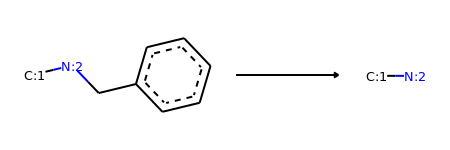

Product similarity 0.3333333333333333, overall 0.18279569892473116, smiles CC(O)CC1(N)CCC1


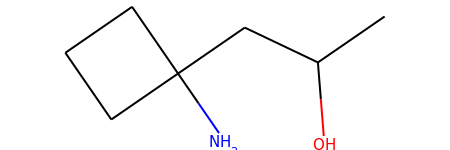

The proposed reaction is:


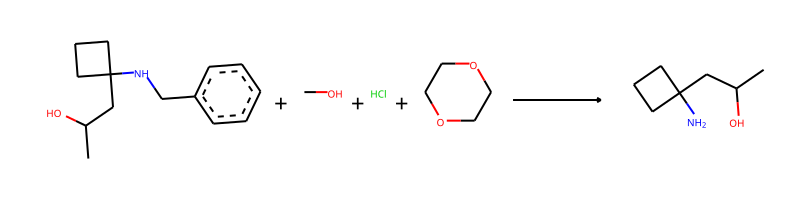

The reaction SMILES string is: CC(O)CC1(NCc2ccccc2)CCC1.CO.Cl.C1COCCO1>>CC(O)CC1(N)CCC1
The fast filter score is 0.670772076


--------------------------------------------------

Train index: 188365
RANK 100 PRECEDENT
REACTANT MATCH SCORE: 0.5483870967741935


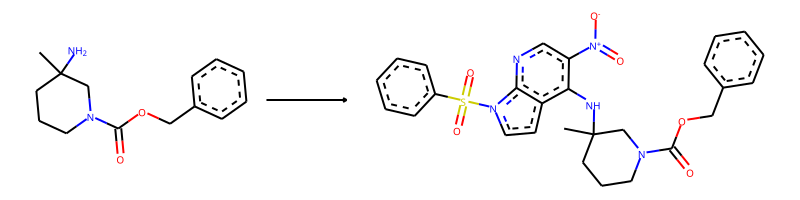

-> template: [C:2]-[NH2;D1;+0:1]>>O=[N+](-[O-])-c1:c:n:c2:c(:c:c:n:2-S(=O)(=O)-c2:c:c:c:c:c:2):c:1-[NH;D2;+0:1]-[C:2]


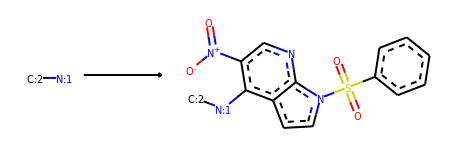

->No precursors could be generated!


(64,
 'CC(O)CC1(NCc2ccccc2)CCC1.CO.O=C[O-].[NH4+]>>CC(O)CC1(N)CCC1',
 1.0,
 0.44680851063829785)

In [19]:
do_one_v4 (28140)

Reactant input:


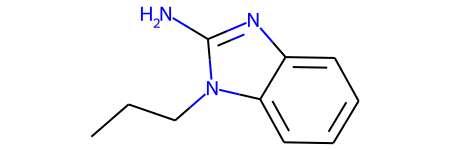



--------------------------------------------------

Train index: 144463
RANK 1 PRECEDENT
REACTANT MATCH SCORE: 0.7435897435897436


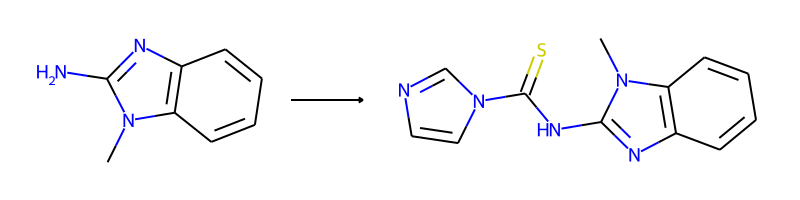

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[NH2;D1;+0:1]>>S=C(-[NH;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4])-n1:c:c:n:c:1


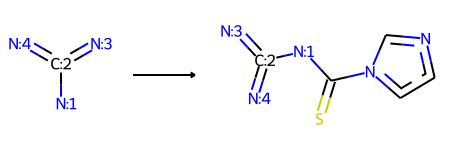

Product similarity 0.8333333333333334, overall 0.6196581196581197, smiles CCCn1c(NC(=S)n2ccnc2)nc2ccccc21


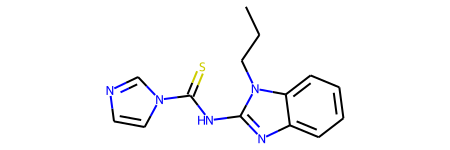

The proposed reaction is:


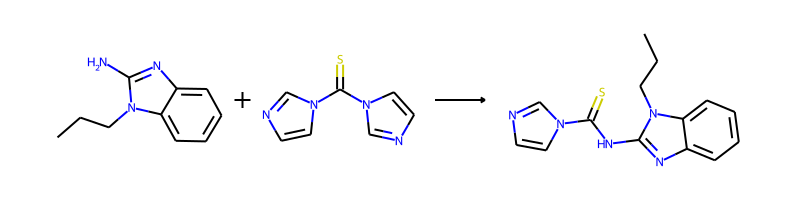

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.S=C(n1ccnc1)n1ccnc1>>CCCn1c(NC(=S)n2ccnc2)nc2ccccc21


--------------------------------------------------

Train index: 289778
RANK 2 PRECEDENT
REACTANT MATCH SCORE: 0.7435897435897436


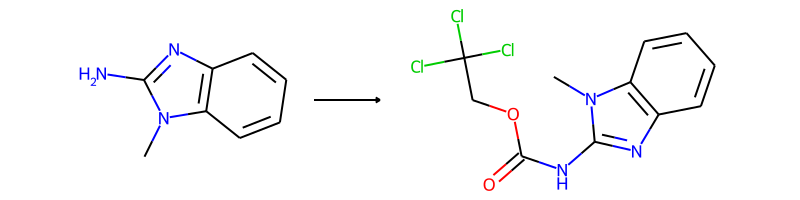

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[NH2;D1;+0:1]>>Cl-C(-Cl)(-Cl)-C-O-C(=O)-[NH;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


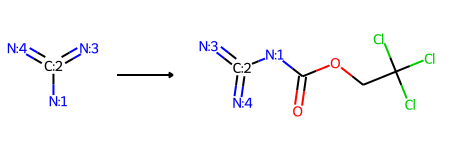

Product similarity 0.8333333333333334, overall 0.6196581196581197, smiles CCCn1c(NC(=O)OCC(Cl)(Cl)Cl)nc2ccccc21


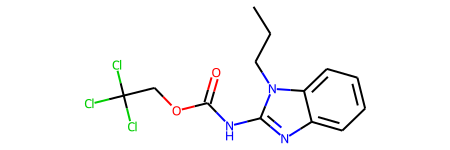

The proposed reaction is:


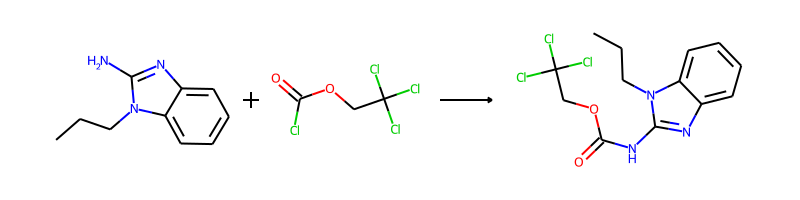

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=C(Cl)OCC(Cl)(Cl)Cl>>CCCn1c(NC(=O)OCC(Cl)(Cl)Cl)nc2ccccc21


--------------------------------------------------

Train index: 263179
RANK 3 PRECEDENT
REACTANT MATCH SCORE: 0.717391304347826


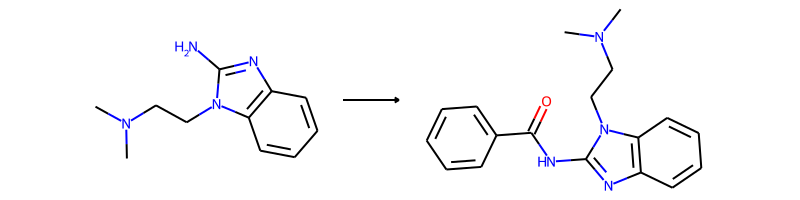

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[NH2;D1;+0:1]>>O=C(-[NH;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4])-c1:c:c:c:c:c:1


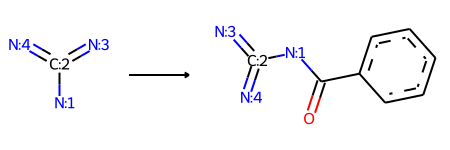

Product similarity 0.8142857142857143, overall 0.5841614906832298, smiles CCCn1c(NC(=O)c2ccccc2)nc2ccccc21


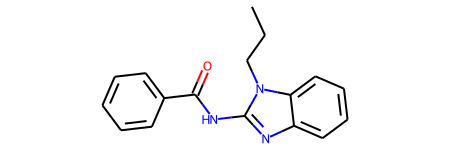

The proposed reaction is:


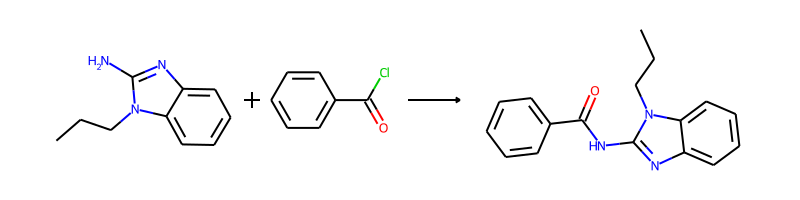

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=C(Cl)c1ccccc1>>CCCn1c(NC(=O)c2ccccc2)nc2ccccc21


--------------------------------------------------

Train index: 50114
RANK 4 PRECEDENT
REACTANT MATCH SCORE: 0.7045454545454546


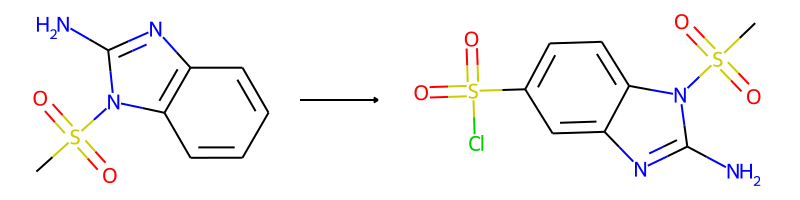

-> template: [#7;a:5]:[c:4]:[c:3]:[cH;D2;+0:1]:[c:2]>>Cl-S(=O)(=O)-[c;H0;D3;+0:1](:[c:2]):[c:3]:[c:4]:[#7;a:5]


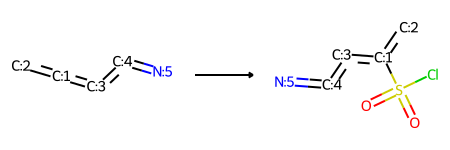

Product similarity 0.7547169811320755, overall 0.5317324185248714, smiles CCCn1c(N)nc2cc(S(=O)(=O)Cl)ccc21


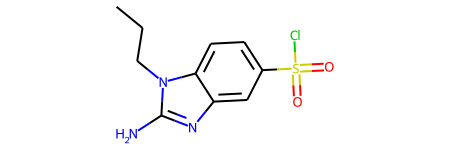

The proposed reaction is:


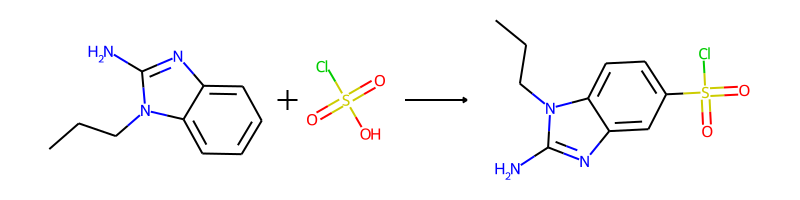

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=S(=O)(O)Cl>>CCCn1c(N)nc2cc(S(=O)(=O)Cl)ccc21
Product similarity 0.6607142857142857, overall 0.4655032467532468, smiles CCCn1c(N)nc2c(S(=O)(=O)Cl)cccc21


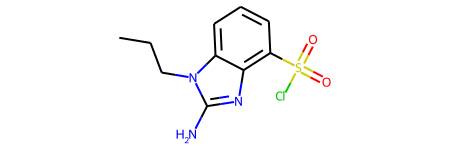

The proposed reaction is:


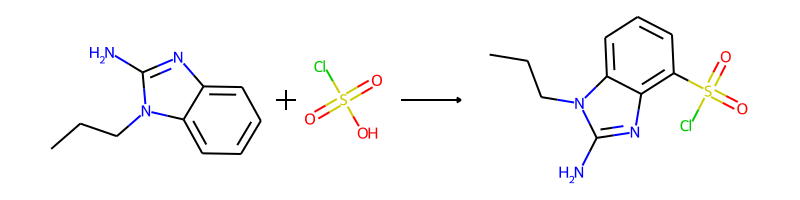

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=S(=O)(O)Cl>>CCCn1c(N)nc2c(S(=O)(=O)Cl)cccc21
Product similarity 0.6607142857142857, overall 0.4655032467532468, smiles CCCn1c(N)nc2cccc(S(=O)(=O)Cl)c21


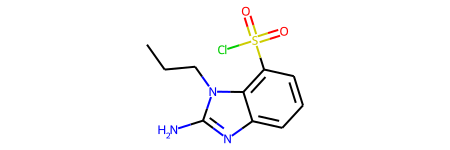

The proposed reaction is:


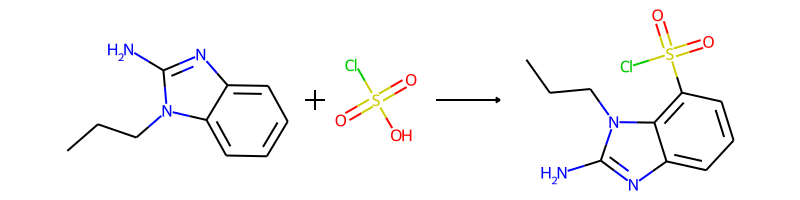

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=S(=O)(O)Cl>>CCCn1c(N)nc2cccc(S(=O)(=O)Cl)c21
Product similarity 0.7547169811320755, overall 0.5317324185248714, smiles CCCn1c(N)nc2ccc(S(=O)(=O)Cl)cc21


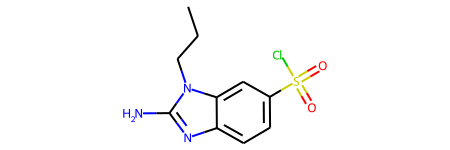

The proposed reaction is:


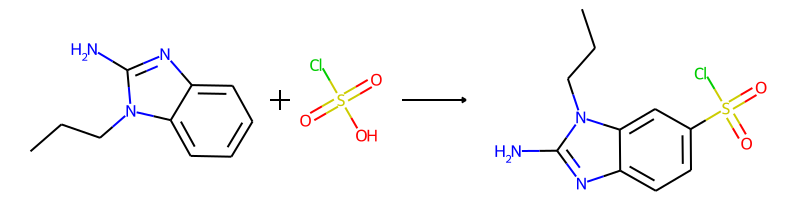

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=S(=O)(O)Cl>>CCCn1c(N)nc2ccc(S(=O)(=O)Cl)cc21


--------------------------------------------------

Train index: 265870
RANK 5 PRECEDENT
REACTANT MATCH SCORE: 0.6739130434782609


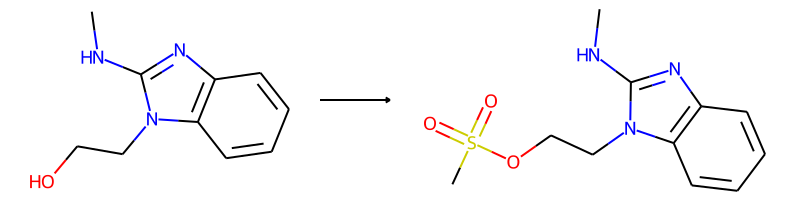

-> template: [C:2]-[OH;D1;+0:1]>>C-S(=O)(=O)-[O;H0;D2;+0:1]-[C:2]


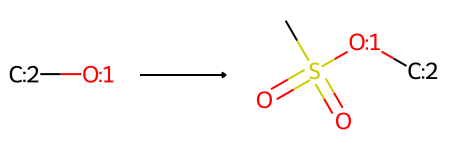

->No precursors could be generated!


--------------------------------------------------

Train index: 250877
RANK 6 PRECEDENT
REACTANT MATCH SCORE: 0.6739130434782609


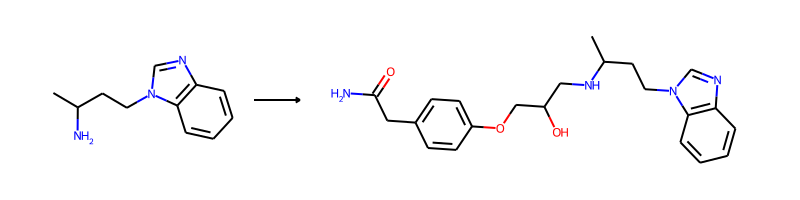

-> template: [C:2]-[NH2;D1;+0:1]>>N-C(=O)-C-c1:c:c:c(-O-C-C(-O)-C-[NH;D2;+0:1]-[C:2]):c:c:1


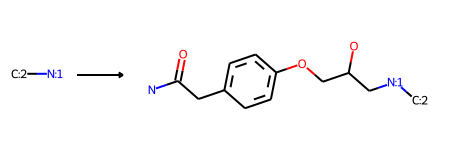

->No precursors could be generated!


--------------------------------------------------

Train index: 3552
RANK 7 PRECEDENT
REACTANT MATCH SCORE: 0.6666666666666666


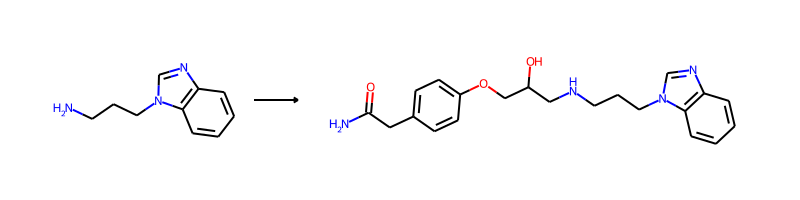

-> template: [C:2]-[NH2;D1;+0:1]>>N-C(=O)-C-c1:c:c:c(-O-C-C(-O)-C-[NH;D2;+0:1]-[C:2]):c:c:1


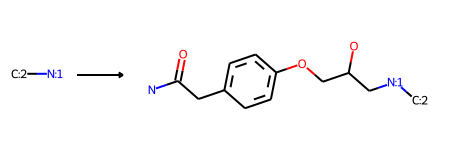

->No precursors could be generated!


--------------------------------------------------

Train index: 17759
RANK 8 PRECEDENT
REACTANT MATCH SCORE: 0.6666666666666666


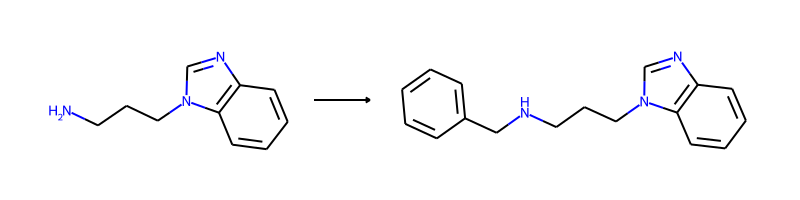

-> template: [C:1]-[NH2;D1;+0:2]>>[C:1]-[NH;D2;+0:2]-C-c1:c:c:c:c:c:1


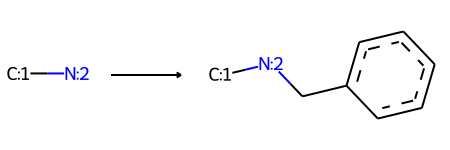

->No precursors could be generated!


--------------------------------------------------

Train index: 233293
RANK 9 PRECEDENT
REACTANT MATCH SCORE: 0.6511627906976745


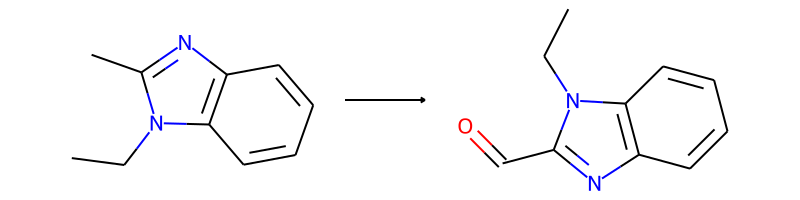

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH3;D1;+0:1]>>O=[CH;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


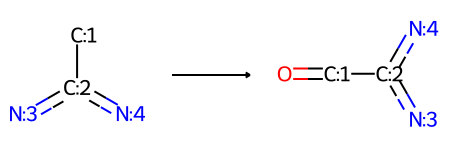

->No precursors could be generated!


--------------------------------------------------

Train index: 317726
RANK 10 PRECEDENT
REACTANT MATCH SCORE: 0.6444444444444445


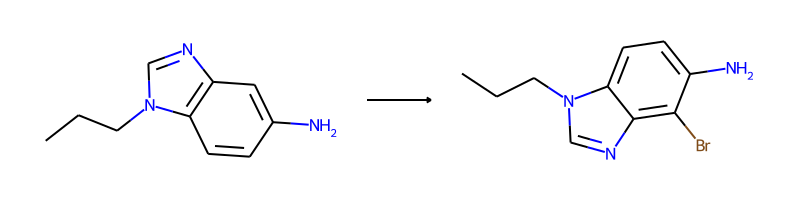

-> template: [#7;a:6]:[c:5]:[c:3](:[#7;a:4]):[cH;D2;+0:1]:[c:2]>>Br-[c;H0;D3;+0:1](:[c:2]):[c:3](:[#7;a:4]):[c:5]:[#7;a:6]


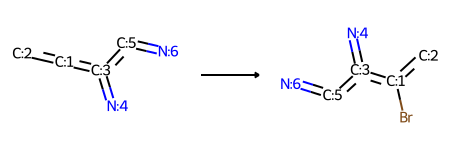

Product similarity 0.6595744680851063, overall 0.42505910165484634, smiles CCCn1c(N)nc2c(Br)cccc21


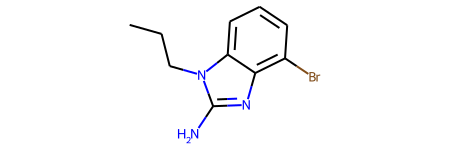

The proposed reaction is:


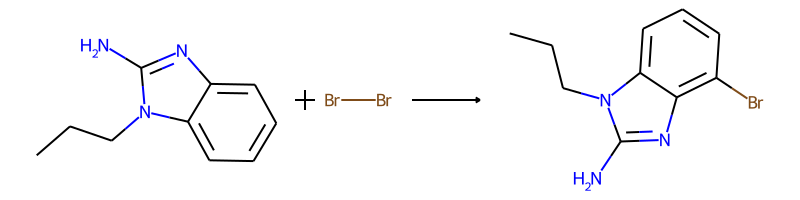

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2c(Br)cccc21
Product similarity 0.5918367346938775, overall 0.38140589569161, smiles CCCn1c(N)nc2cccc(Br)c21


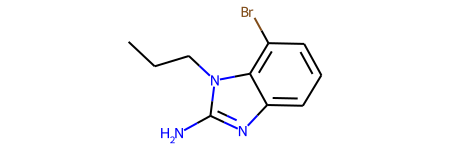

The proposed reaction is:


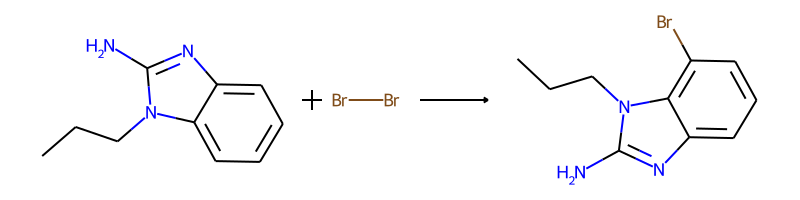

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2cccc(Br)c21


--------------------------------------------------

Train index: 114130
RANK 11 PRECEDENT
REACTANT MATCH SCORE: 0.6444444444444445


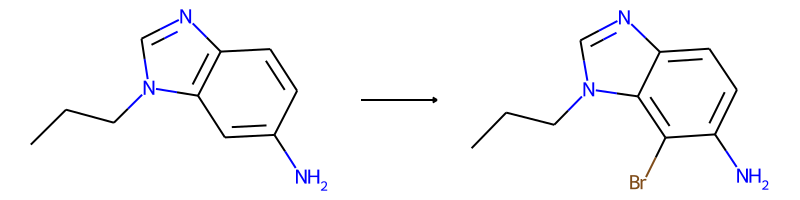

-> template: [#7;a:4]:[c:3](:[c:5]:[#7;a:6]):[cH;D2;+0:1]:[c:2]>>Br-[c;H0;D3;+0:1](:[c:2]):[c:3](:[#7;a:4]):[c:5]:[#7;a:6]


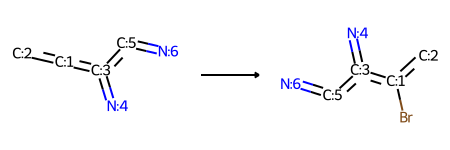

Product similarity 0.5918367346938775, overall 0.38140589569161, smiles CCCn1c(N)nc2c(Br)cccc21


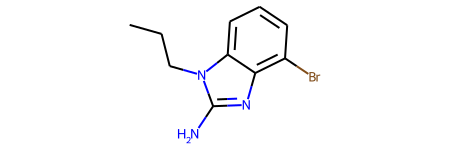

The proposed reaction is:


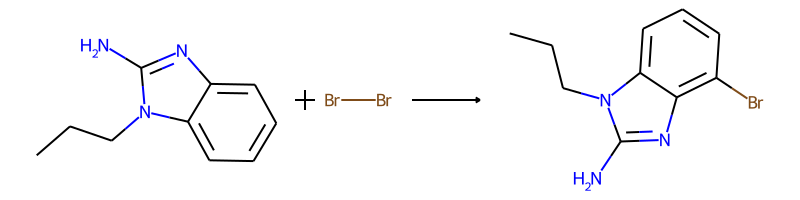

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2c(Br)cccc21
Product similarity 0.6595744680851063, overall 0.42505910165484634, smiles CCCn1c(N)nc2cccc(Br)c21


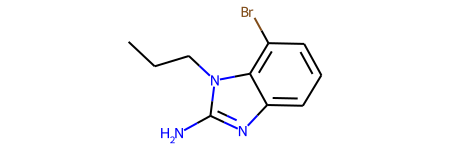

The proposed reaction is:


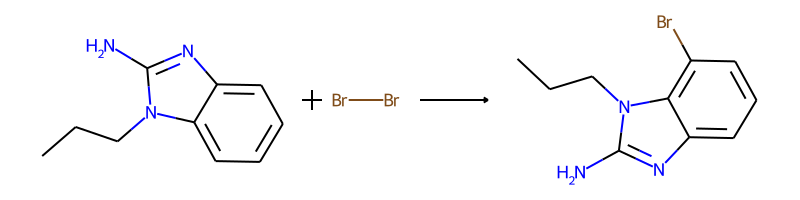

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2cccc(Br)c21


--------------------------------------------------

Train index: 443166
RANK 12 PRECEDENT
REACTANT MATCH SCORE: 0.6444444444444445


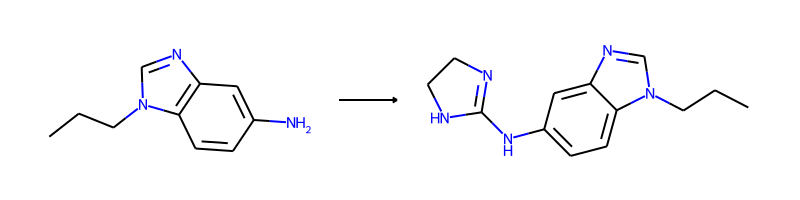

-> template: [NH2;D1;+0:2]-[c:1]>>[c:1]-[NH;D2;+0:2]-C1=N-C-C-N-1


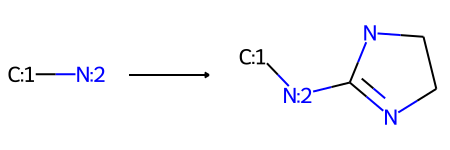

Product similarity 0.7096774193548387, overall 0.4573476702508961, smiles CCCn1c(NC2=NCCN2)nc2ccccc21


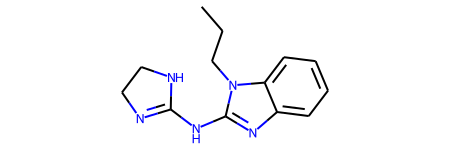

The proposed reaction is:


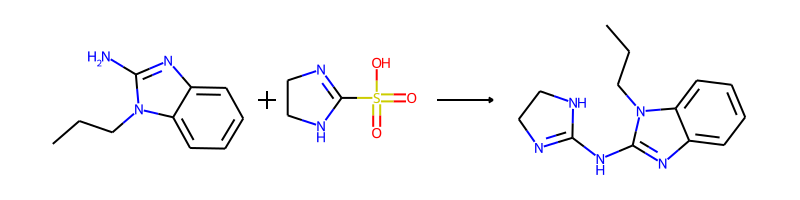

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=S(=O)(O)C1=NCCN1>>CCCn1c(NC2=NCCN2)nc2ccccc21


--------------------------------------------------

Train index: 62724
RANK 13 PRECEDENT
REACTANT MATCH SCORE: 0.6382978723404256


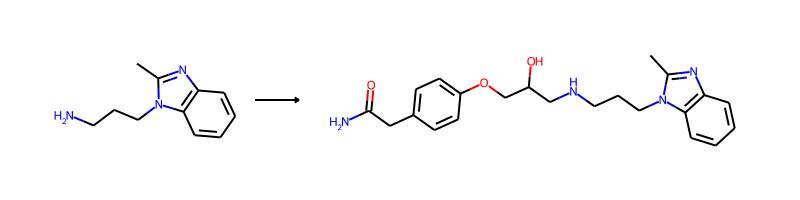

-> template: [C:2]-[NH2;D1;+0:1]>>N-C(=O)-C-c1:c:c:c(-O-C-C(-O)-C-[NH;D2;+0:1]-[C:2]):c:c:1


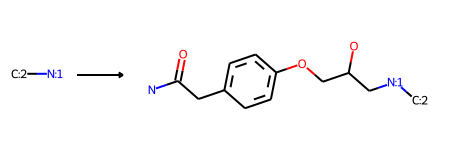

->No precursors could be generated!


--------------------------------------------------

Train index: 244030
RANK 14 PRECEDENT
REACTANT MATCH SCORE: 0.6304347826086957


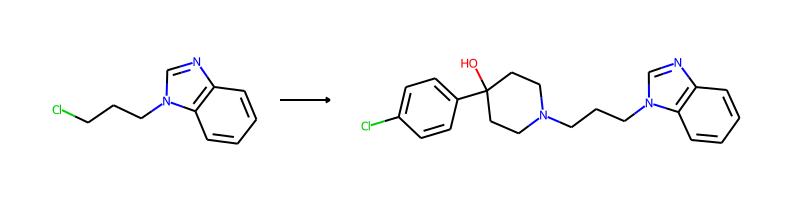

-> template: [C:2]-[CH2;D2;+0:1]-[Cl;H0;D1;+0]>>Cl-c1:c:c:c(-C2(-O)-C-C-N(-[CH2;D2;+0:1]-[C:2])-C-C-2):c:c:1


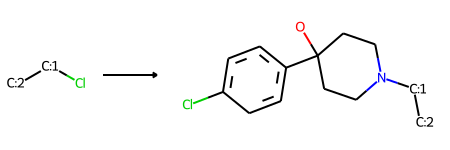

->No precursors could be generated!


--------------------------------------------------

Train index: 332462
RANK 15 PRECEDENT
REACTANT MATCH SCORE: 0.6304347826086957


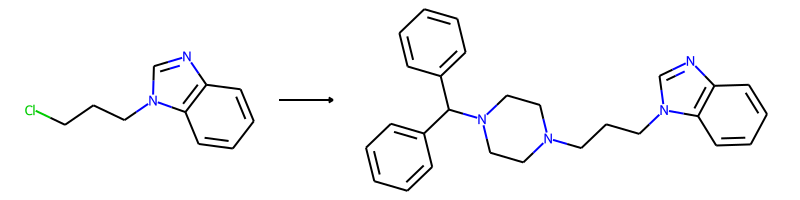

-> template: [C:1]-[CH2;D2;+0:2]-[Cl;H0;D1;+0]>>[C:1]-[CH2;D2;+0:2]-N1-C-C-N(-C(-c2:c:c:c:c:c:2)-c2:c:c:c:c:c:2)-C-C-1


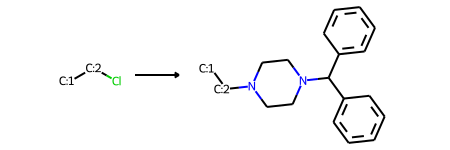

->No precursors could be generated!


--------------------------------------------------

Train index: 17457
RANK 16 PRECEDENT
REACTANT MATCH SCORE: 0.6304347826086957


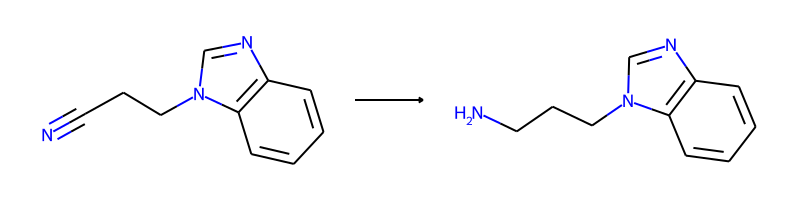

-> template: [C:1]-[C;H0;D2;+0:2]#[N;H0;D1;+0:3]>>[C:1]-[CH2;D2;+0:2]-[NH2;D1;+0:3]


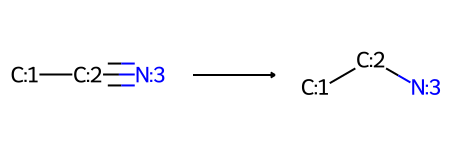

->No precursors could be generated!


--------------------------------------------------

Train index: 342097
RANK 17 PRECEDENT
REACTANT MATCH SCORE: 0.625


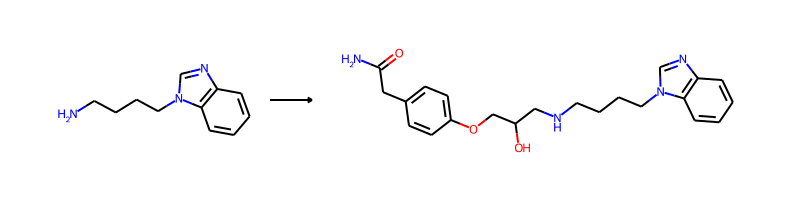

-> template: [C:2]-[NH2;D1;+0:1]>>N-C(=O)-C-c1:c:c:c(-O-C-C(-O)-C-[NH;D2;+0:1]-[C:2]):c:c:1


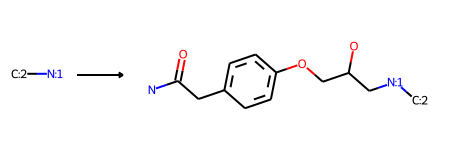

->No precursors could be generated!


--------------------------------------------------

Train index: 72690
RANK 18 PRECEDENT
REACTANT MATCH SCORE: 0.6086956521739131


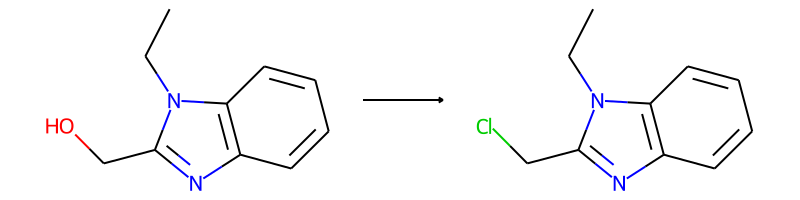

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Cl-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


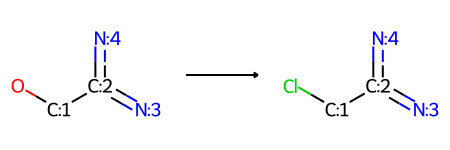

->No precursors could be generated!


--------------------------------------------------

Train index: 262725
RANK 19 PRECEDENT
REACTANT MATCH SCORE: 0.6071428571428571


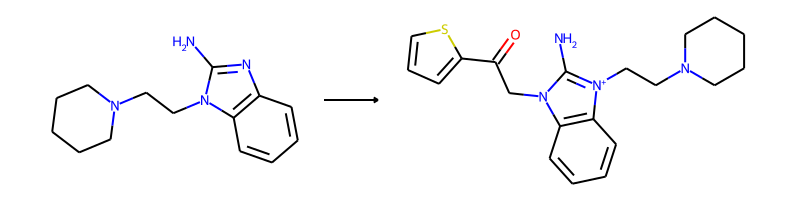

-> template: [C:4]-[n;H0;D3;+0:3]1:[c:2]:[n;H0;D2;+0:1]:[c:6]:[c:5]:1>>O=C(-C-[n;H0;D3;+0:1]1:[c:2]:[n+;H0;D3:3](-[C:4]):[c:5]:[c:6]:1)-c1:c:c:c:s:1


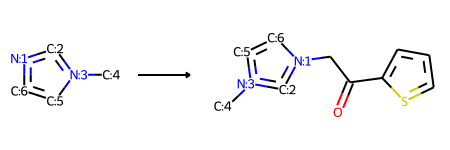

Product similarity 0.7215189873417721, overall 0.43806509945750444, smiles CCC[n+]1c(N)n(CC(=O)c2cccs2)c2ccccc21


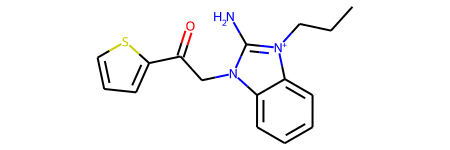

The proposed reaction is:


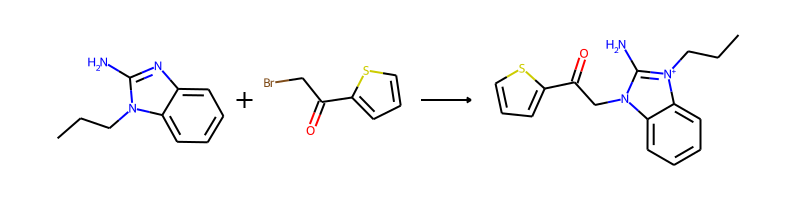

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=C(CBr)c1cccs1>>CCC[n+]1c(N)n(CC(=O)c2cccs2)c2ccccc21


--------------------------------------------------

Train index: 226868
RANK 20 PRECEDENT
REACTANT MATCH SCORE: 0.6041666666666666


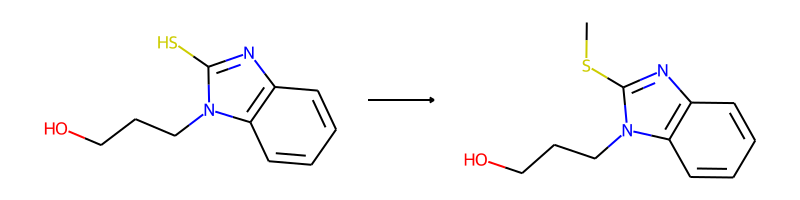

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[SH;D1;+0:1]>>C-[S;H0;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


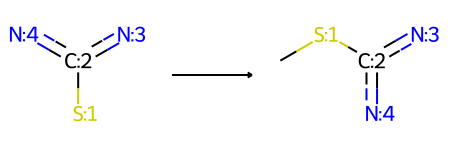

->No precursors could be generated!


--------------------------------------------------

Train index: 131279
RANK 21 PRECEDENT
REACTANT MATCH SCORE: 0.6


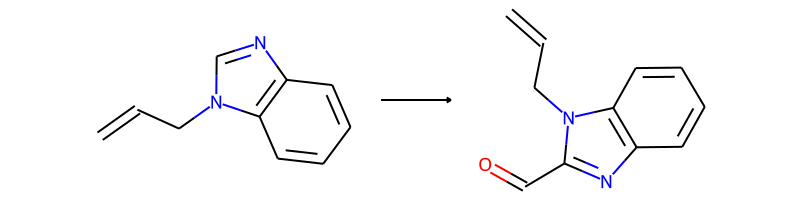

-> template: [#7;a:2]:[cH;D2;+0:1]:[#7;a:3]>>O=C-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


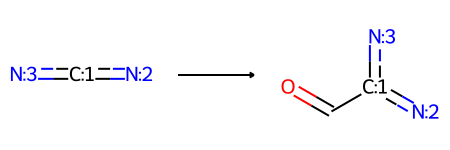

->No precursors could be generated!


--------------------------------------------------

Train index: 76137
RANK 22 PRECEDENT
REACTANT MATCH SCORE: 0.5918367346938775


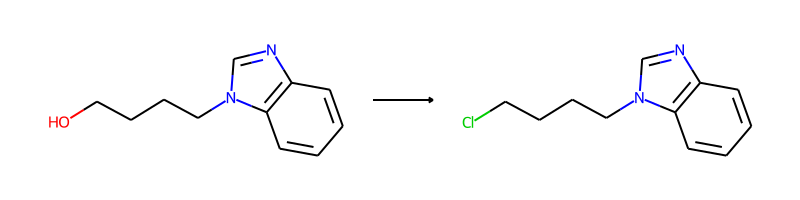

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Cl-[CH2;D2;+0:1]-[C:2]


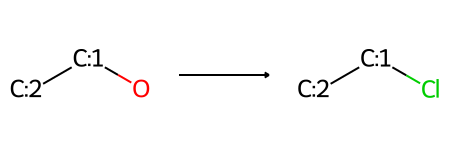

->No precursors could be generated!


--------------------------------------------------

Train index: 144611
RANK 23 PRECEDENT
REACTANT MATCH SCORE: 0.5918367346938775


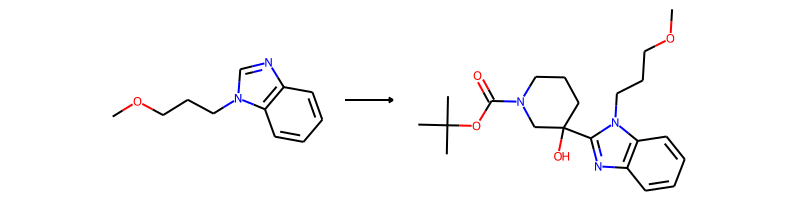

-> template: [#7;a:2]:[cH;D2;+0:1]:[#7;a:3]>>C-C(-C)(-C)-O-C(=O)-N1-C-C-C-C(-O)(-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3])-C-1


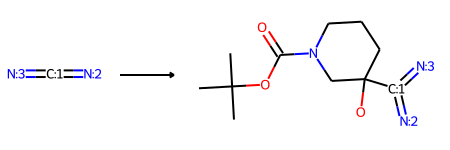

->No precursors could be generated!


--------------------------------------------------

Train index: 309029
RANK 24 PRECEDENT
REACTANT MATCH SCORE: 0.5882352941176471


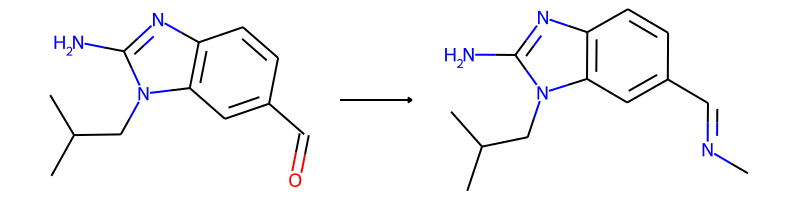

-> template: [O;H0;D1;+0]=[CH;D2;+0:1]-[c:2]>>C-N=[CH;D2;+0:1]-[c:2]


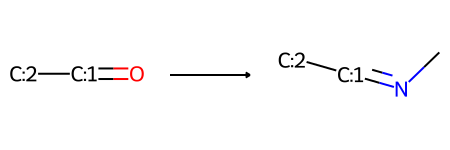

->No precursors could be generated!


--------------------------------------------------

Train index: 250926
RANK 25 PRECEDENT
REACTANT MATCH SCORE: 0.5882352941176471


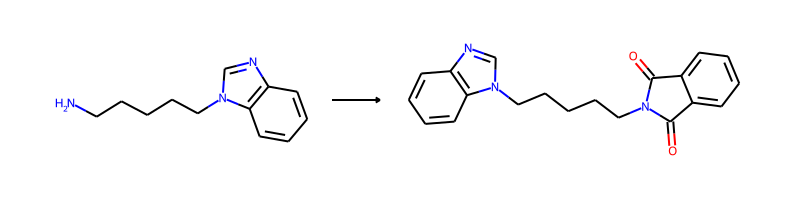

-> template: [C:2]-[NH2;D1;+0:1]>>O=C1-[N;H0;D3;+0:1](-[C:2])-C(=O)-c2:c:c:c:c:c:2-1


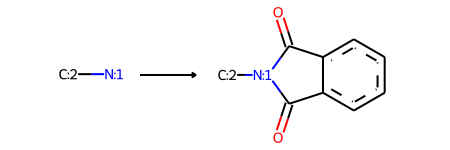

->No precursors could be generated!


--------------------------------------------------

Train index: 1001
RANK 26 PRECEDENT
REACTANT MATCH SCORE: 0.5869565217391305


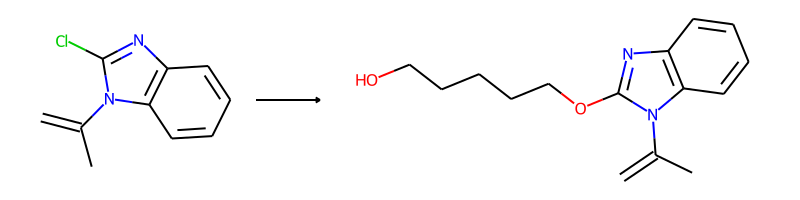

-> template: [#7;a:2]:[c;H0;D3;+0:1](-[Cl;H0;D1;+0]):[#7;a:3]-[C:4]=[C;D1;H2:5]>>O-C-C-C-C-C-O-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]-[C:4]=[C;D1;H2:5]


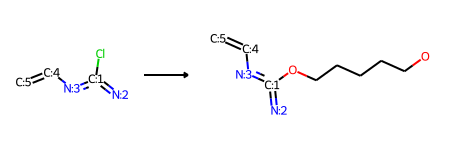

->No precursors could be generated!


--------------------------------------------------

Train index: 293245
RANK 27 PRECEDENT
REACTANT MATCH SCORE: 0.5833333333333334


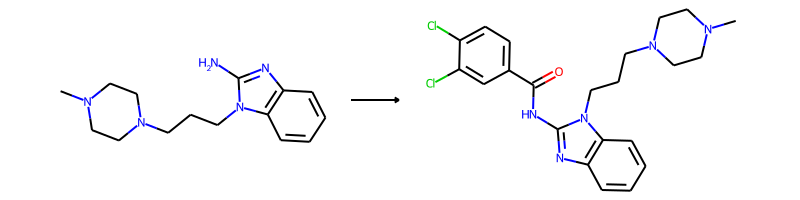

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[NH2;D1;+0:1]>>Cl-c1:c:c:c(-C(=O)-[NH;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]):c:c:1-Cl


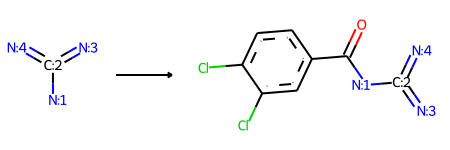

Product similarity 0.7159090909090909, overall 0.4176136363636364, smiles CCCn1c(NC(=O)c2ccc(Cl)c(Cl)c2)nc2ccccc21


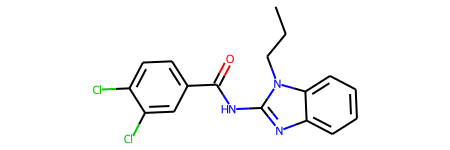

The proposed reaction is:


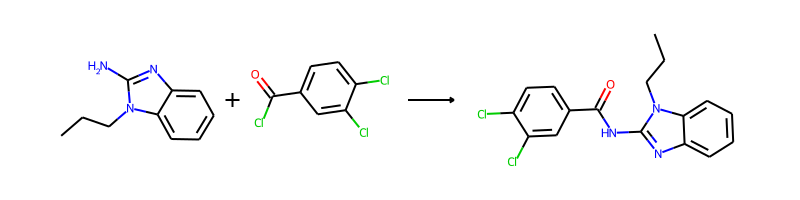

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=C(Cl)c1ccc(Cl)c(Cl)c1>>CCCn1c(NC(=O)c2ccc(Cl)c(Cl)c2)nc2ccccc21


--------------------------------------------------

Train index: 284381
RANK 28 PRECEDENT
REACTANT MATCH SCORE: 0.5833333333333334


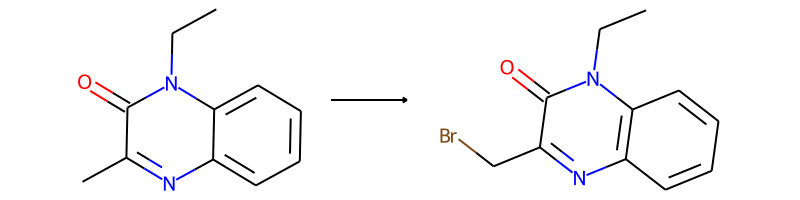

-> template: [#7;a:5]:[c:4]:[c:2](:[#7;a:3])-[CH3;D1;+0:1]>>Br-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[c:4]:[#7;a:5]


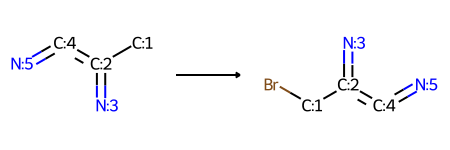

->No precursors could be generated!


--------------------------------------------------

Train index: 29740
RANK 29 PRECEDENT
REACTANT MATCH SCORE: 0.574468085106383


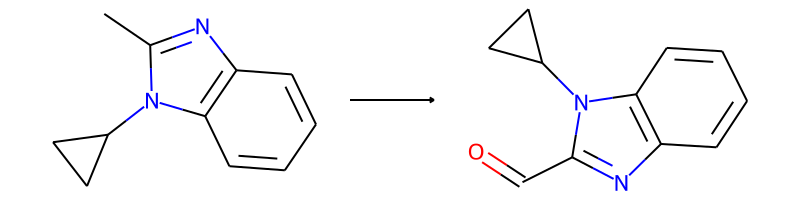

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH3;D1;+0:1]>>O=[CH;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


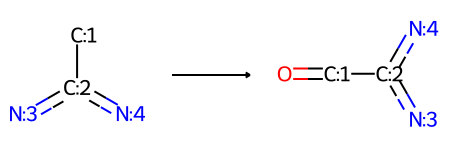

->No precursors could be generated!


--------------------------------------------------

Train index: 379987
RANK 30 PRECEDENT
REACTANT MATCH SCORE: 0.574468085106383


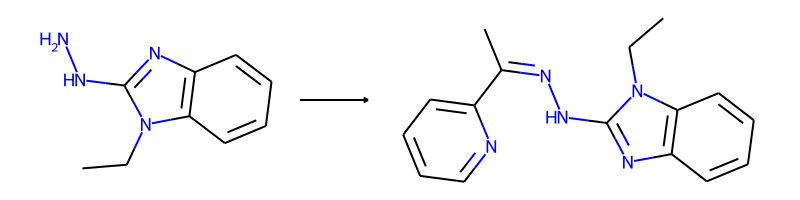

-> template: [#7:2]-[NH2;D1;+0:1]>>C-C(=[N;H0;D2;+0:1]-[#7:2])-c1:c:c:c:c:n:1


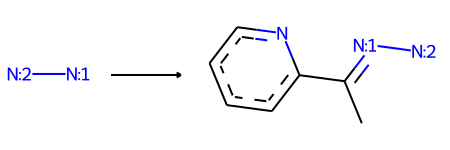

->No precursors could be generated!


--------------------------------------------------

Train index: 45776
RANK 31 PRECEDENT
REACTANT MATCH SCORE: 0.5714285714285714


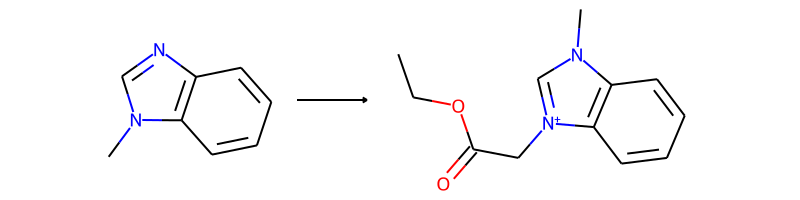

-> template: [#7;a:3]1:[c:2]:[n;H0;D2;+0:1]:[c:5]:[c:4]:1>>C-C-O-C(=O)-C-[n+;H0;D3:1]1:[c:2]:[#7;a:3]:[c:4]:[c:5]:1


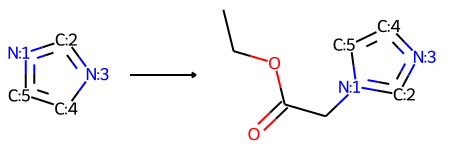

Product similarity 0.6896551724137931, overall 0.39408866995073893, smiles CCCn1c(N)[n+](CC(=O)OCC)c2ccccc21


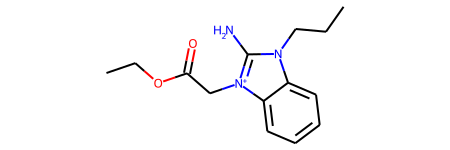

The proposed reaction is:


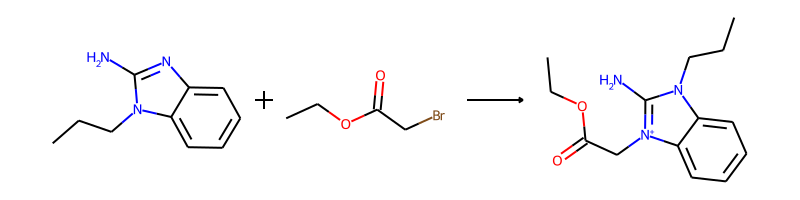

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.CCOC(=O)CBr>>CCCn1c(N)[n+](CC(=O)OCC)c2ccccc21


--------------------------------------------------

Train index: 107845
RANK 32 PRECEDENT
REACTANT MATCH SCORE: 0.5714285714285714


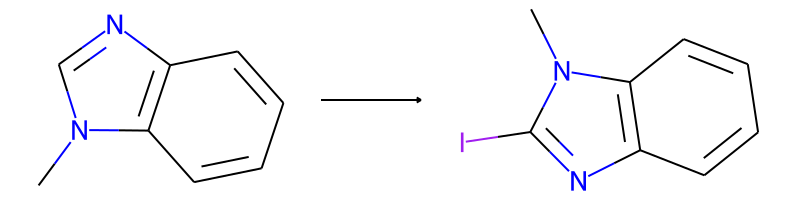

-> template: [#7;a:2]:[cH;D2;+0:1]:[#7;a:3]>>I-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


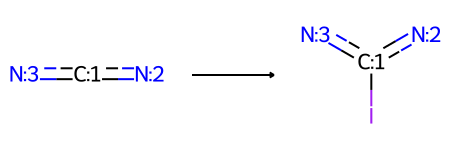

->No precursors could be generated!


--------------------------------------------------

Train index: 410564
RANK 33 PRECEDENT
REACTANT MATCH SCORE: 0.5714285714285714


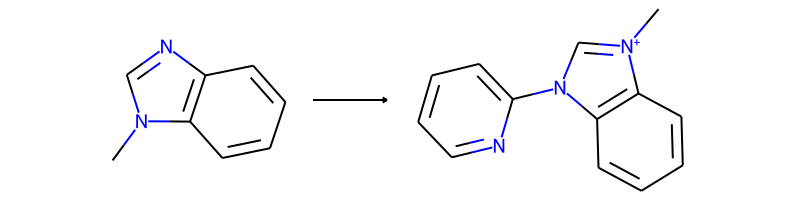

-> template: [C;D1;H3:1]-[n;H0;D3;+0:2]1:[c:3]:[n;H0;D2;+0:4]:[c:5]:[c:6]:1>>[C;D1;H3:1]-[n+;H0;D3:2]1:[c:3]:[n;H0;D3;+0:4](-c2:c:c:c:c:n:2):[c:5]:[c:6]:1


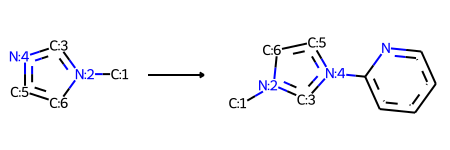

->No precursors could be generated!


--------------------------------------------------

Train index: 79384
RANK 34 PRECEDENT
REACTANT MATCH SCORE: 0.5714285714285714


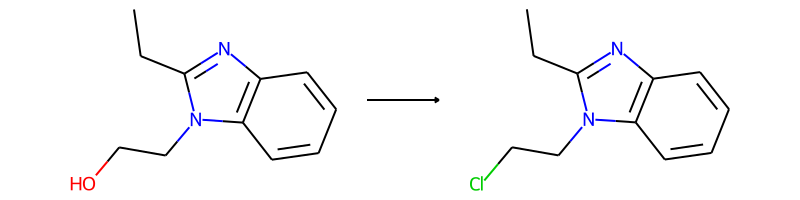

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Cl-[CH2;D2;+0:1]-[C:2]


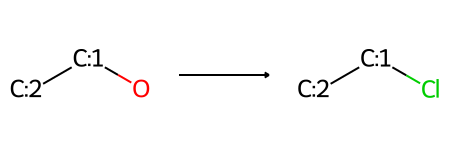

->No precursors could be generated!


--------------------------------------------------

Train index: 443005
RANK 35 PRECEDENT
REACTANT MATCH SCORE: 0.5714285714285714


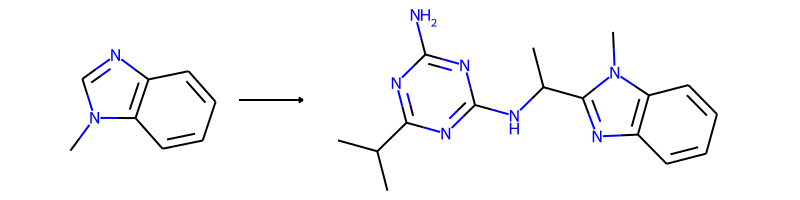

-> template: [#7;a:2]:[cH;D2;+0:1]:[#7;a:3]>>C-C(-N-c1:n:c(-N):n:c(-C(-C)-C):n:1)-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


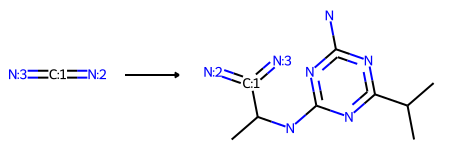

->No precursors could be generated!


--------------------------------------------------

Train index: 145092
RANK 36 PRECEDENT
REACTANT MATCH SCORE: 0.5714285714285714


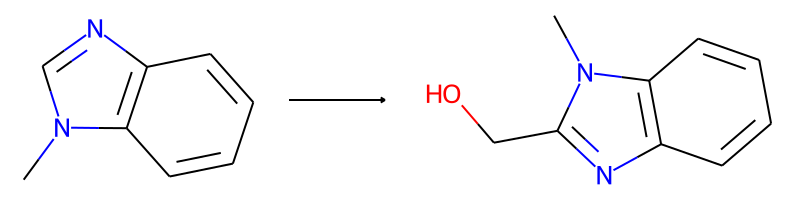

-> template: [#7;a:2]:[cH;D2;+0:1]:[#7;a:3]>>O-C-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


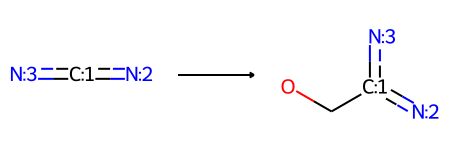

->No precursors could be generated!


--------------------------------------------------

Train index: 210818
RANK 37 PRECEDENT
REACTANT MATCH SCORE: 0.5686274509803921


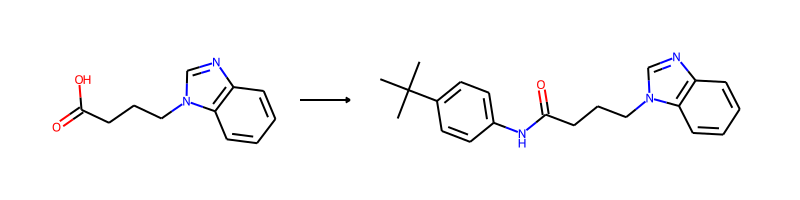

-> template: [C:2]-[C;H0;D3;+0:1](=[O;H0;D1;+0])-[OH;D1;+0:3]>>C-C(-C)(-C)-c1:c:c:c(-N-[C;H0;D3;+0:1](-[C:2])=[O;H0;D1;+0:3]):c:c:1


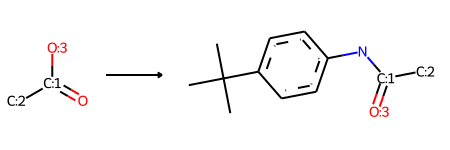

->No precursors could be generated!


--------------------------------------------------

Train index: 174762
RANK 38 PRECEDENT
REACTANT MATCH SCORE: 0.5686274509803921


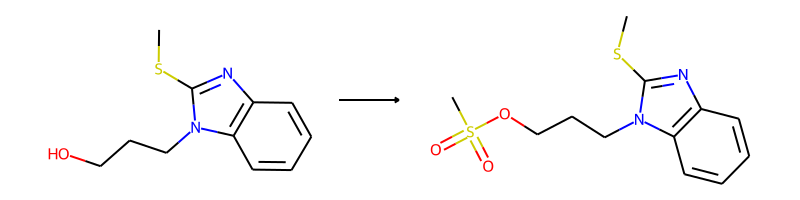

-> template: [C:2]-[OH;D1;+0:1]>>C-S(=O)(=O)-[O;H0;D2;+0:1]-[C:2]


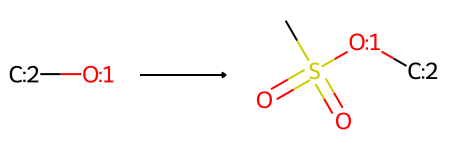

->No precursors could be generated!


--------------------------------------------------

Train index: 199477
RANK 39 PRECEDENT
REACTANT MATCH SCORE: 0.5681818181818182


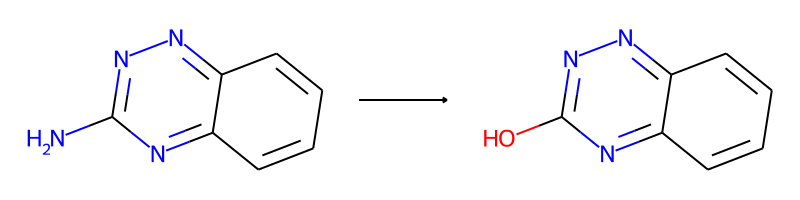

-> template: [#7;a:4]:[#7;a:3]:[c;H0;D3;+0:1](:[#7;a:2])-[N;H2;D1;+0]>>O-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]:[#7;a:4]


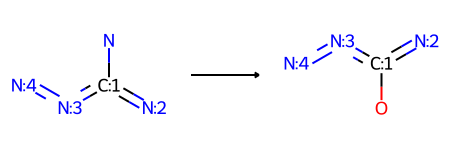

->No precursors could be generated!


--------------------------------------------------

Train index: 194955
RANK 40 PRECEDENT
REACTANT MATCH SCORE: 0.5652173913043478


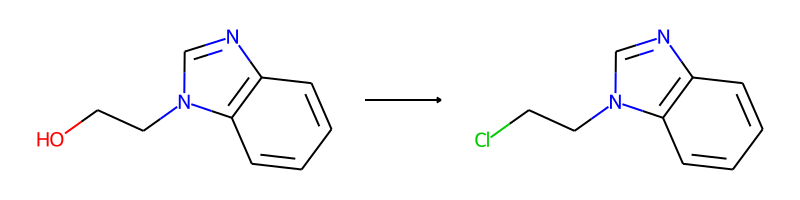

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Cl-[CH2;D2;+0:1]-[C:2]


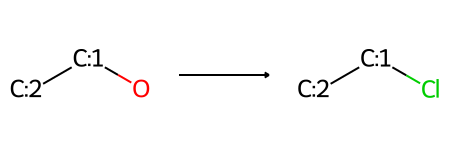

->No precursors could be generated!


--------------------------------------------------

Train index: 85179
RANK 41 PRECEDENT
REACTANT MATCH SCORE: 0.5652173913043478


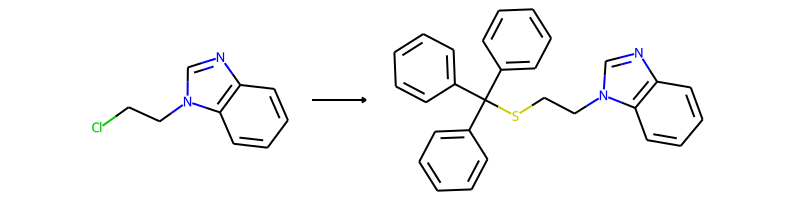

-> template: [C:1]-[CH2;D2;+0:2]-[Cl;H0;D1;+0]>>[C:1]-[CH2;D2;+0:2]-S-C(-c1:c:c:c:c:c:1)(-c1:c:c:c:c:c:1)-c1:c:c:c:c:c:1


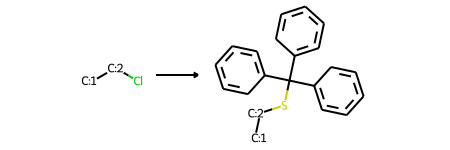

->No precursors could be generated!


--------------------------------------------------

Train index: 192510
RANK 42 PRECEDENT
REACTANT MATCH SCORE: 0.5652173913043478


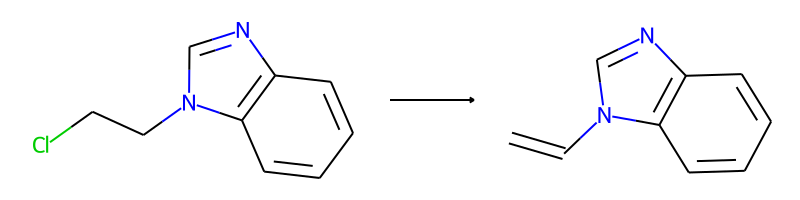

-> template: [#7;a:1]-[CH2;D2;+0:2]-[CH2;D2;+0:3]-[Cl;H0;D1;+0]>>[#7;a:1]-[CH;D2;+0:2]=[CH2;D1;+0:3]


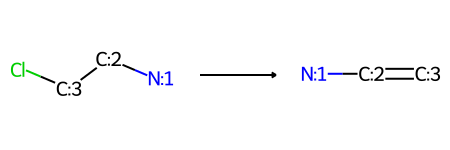

->No precursors could be generated!


--------------------------------------------------

Train index: 98351
RANK 43 PRECEDENT
REACTANT MATCH SCORE: 0.5625


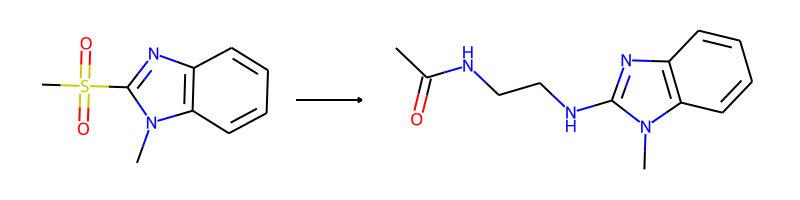

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[S;H0;D4;+0](-[C;H3;D1;+0])(=[O;H0;D1;+0])=[O;H0;D1;+0]>>C-C(=O)-N-C-C-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


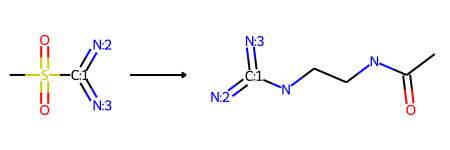

->No precursors could be generated!


--------------------------------------------------

Train index: 406835
RANK 44 PRECEDENT
REACTANT MATCH SCORE: 0.5625


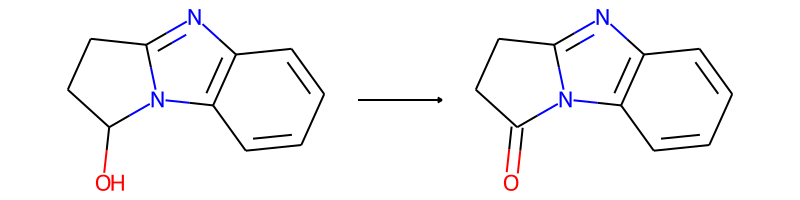

-> template: [#7;a:1]:[c:2]:[#7;a:3]-[CH;D3;+0:4](-[C:5])-[OH;D1;+0:6]>>[#7;a:1]:[c:2]:[#7;a:3]-[C;H0;D3;+0:4](-[C:5])=[O;H0;D1;+0:6]


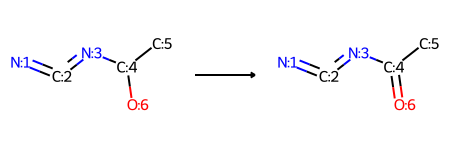

->No precursors could be generated!


--------------------------------------------------

Train index: 354183
RANK 45 PRECEDENT
REACTANT MATCH SCORE: 0.5510204081632653


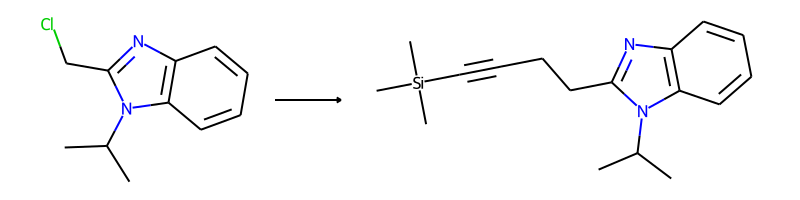

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH2;D2;+0:1]-[Cl;H0;D1;+0]>>C-[Si](-C)(-C)-C#C-C-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


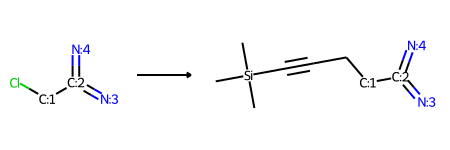

->No precursors could be generated!


--------------------------------------------------

Train index: 195421
RANK 46 PRECEDENT
REACTANT MATCH SCORE: 0.5510204081632653


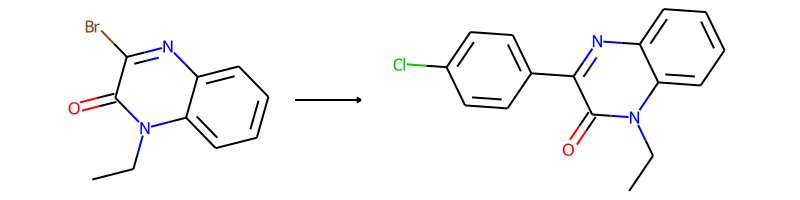

-> template: [#7;a:2]:[c;H0;D3;+0:1](-[Br;H0;D1;+0]):[c:3]:[#7;a:4]>>Cl-c1:c:c:c(-[c;H0;D3;+0:1](:[#7;a:2]):[c:3]:[#7;a:4]):c:c:1


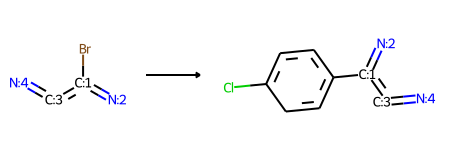

->No precursors could be generated!


--------------------------------------------------

Train index: 395561
RANK 47 PRECEDENT
REACTANT MATCH SCORE: 0.5454545454545454


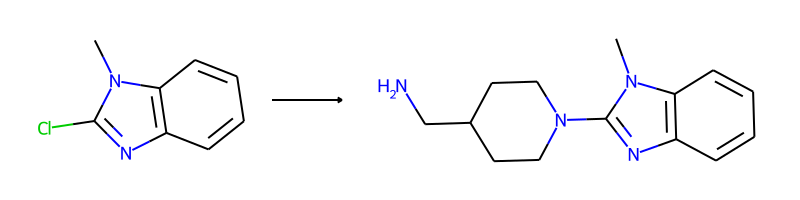

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>N-C-C1-C-C-N(-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3])-C-C-1


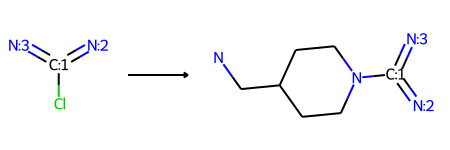

->No precursors could be generated!


--------------------------------------------------

Train index: 169127
RANK 48 PRECEDENT
REACTANT MATCH SCORE: 0.5454545454545454


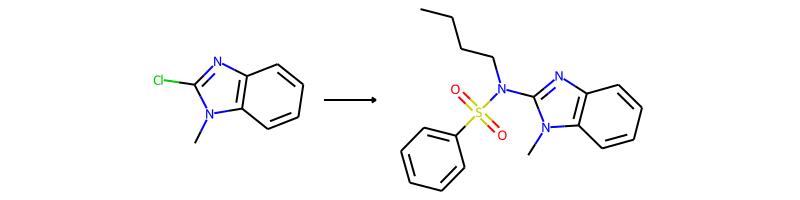

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>C-C-C-C-N(-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3])-S(=O)(=O)-c1:c:c:c:c:c:1


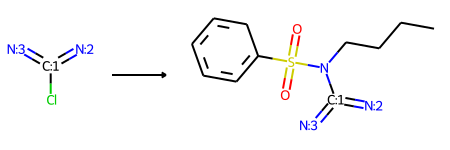

->No precursors could be generated!


--------------------------------------------------

Train index: 292807
RANK 49 PRECEDENT
REACTANT MATCH SCORE: 0.5454545454545454


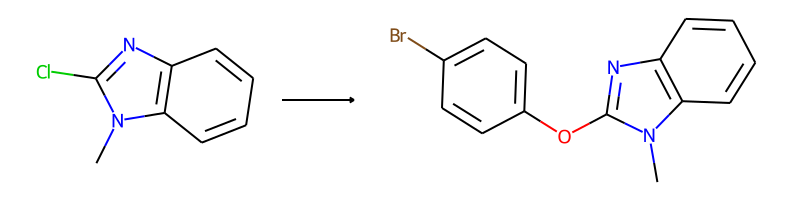

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>Br-c1:c:c:c(-O-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]):c:c:1


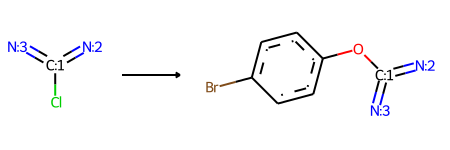

->No precursors could be generated!


--------------------------------------------------

Train index: 32141
RANK 50 PRECEDENT
REACTANT MATCH SCORE: 0.5454545454545454


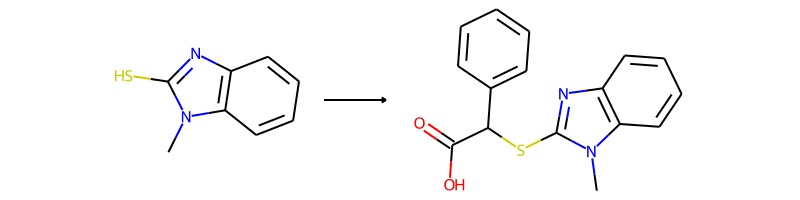

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[SH;D1;+0:1]>>O-C(=O)-C(-[S;H0;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4])-c1:c:c:c:c:c:1


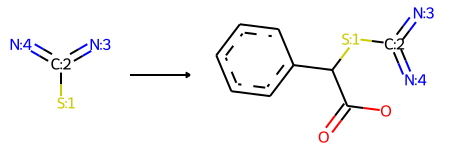

->No precursors could be generated!


--------------------------------------------------

Train index: 173609
RANK 51 PRECEDENT
REACTANT MATCH SCORE: 0.5454545454545454


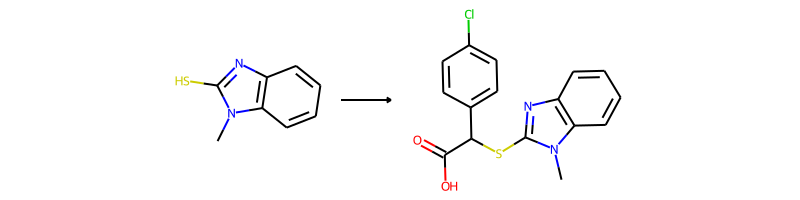

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[SH;D1;+0:1]>>Cl-c1:c:c:c(-C(-[S;H0;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4])-C(-O)=O):c:c:1


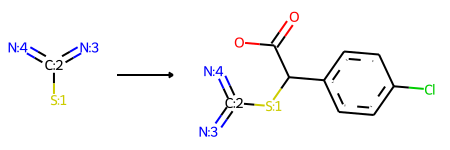

->No precursors could be generated!


--------------------------------------------------

Train index: 242740
RANK 52 PRECEDENT
REACTANT MATCH SCORE: 0.5454545454545454


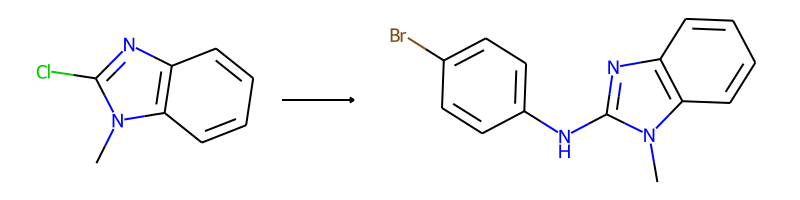

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>Br-c1:c:c:c(-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]):c:c:1


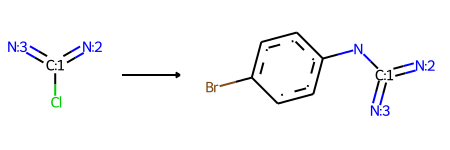

->No precursors could be generated!


--------------------------------------------------

Train index: 179087
RANK 53 PRECEDENT
REACTANT MATCH SCORE: 0.5454545454545454


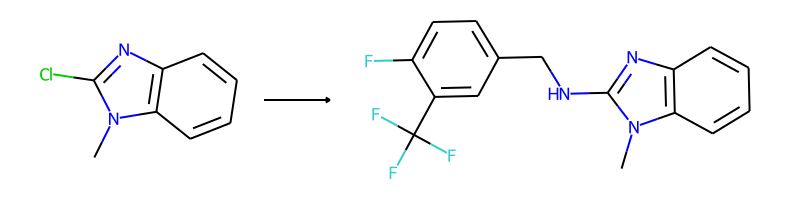

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>F-c1:c:c:c(-C-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]):c:c:1-C(-F)(-F)-F


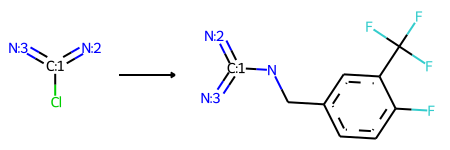

->No precursors could be generated!


--------------------------------------------------

Train index: 329006
RANK 54 PRECEDENT
REACTANT MATCH SCORE: 0.5434782608695652


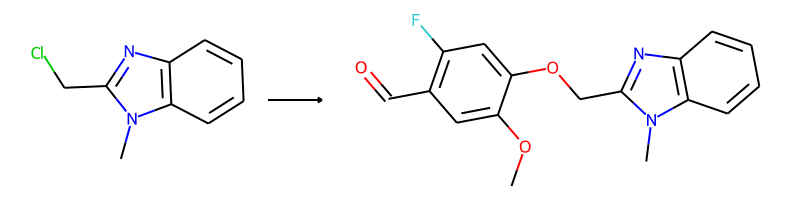

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH2;D2;+0:1]-[Cl;H0;D1;+0]>>C-O-c1:c:c(-C=O):c(-F):c:c:1-O-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


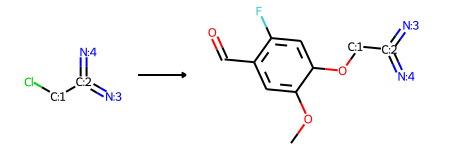

->No precursors could be generated!


--------------------------------------------------

Train index: 350213
RANK 55 PRECEDENT
REACTANT MATCH SCORE: 0.5434782608695652


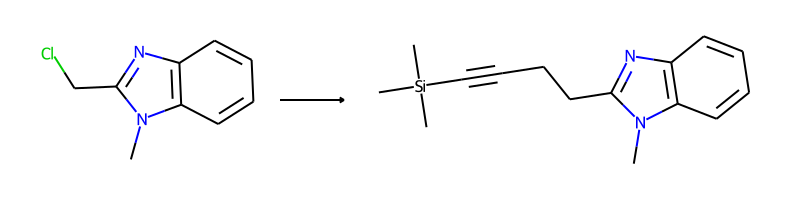

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH2;D2;+0:1]-[Cl;H0;D1;+0]>>C-[Si](-C)(-C)-C#C-C-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


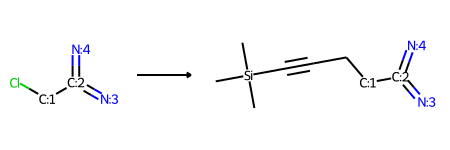

->No precursors could be generated!


--------------------------------------------------

Train index: 341144
RANK 56 PRECEDENT
REACTANT MATCH SCORE: 0.5434782608695652


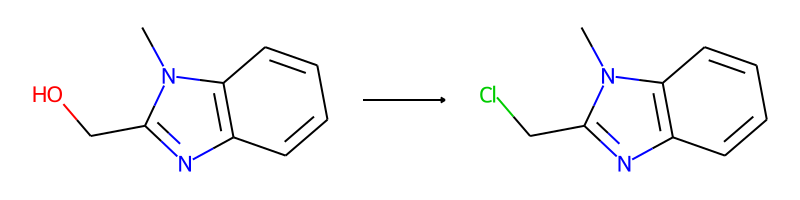

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Cl-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


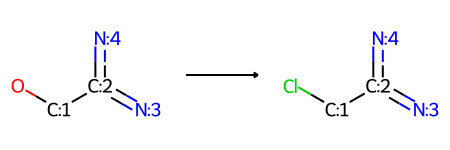

->No precursors could be generated!


--------------------------------------------------

Train index: 426975
RANK 57 PRECEDENT
REACTANT MATCH SCORE: 0.5434782608695652


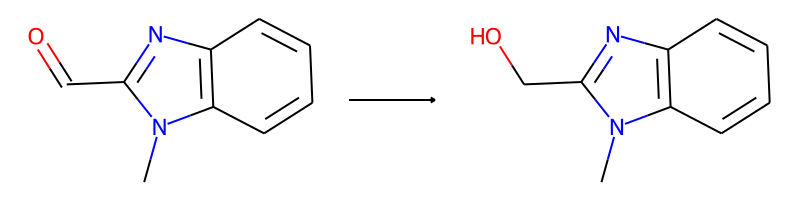

-> template: [#7;a:1]:[c:2](:[#7;a:3])-[CH;D2;+0:4]=[O;H0;D1;+0:5]>>[#7;a:1]:[c:2](:[#7;a:3])-[CH2;D2;+0:4]-[OH;D1;+0:5]


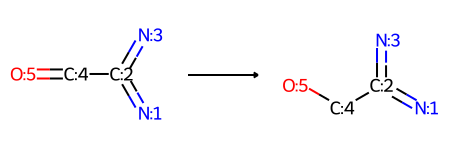

->No precursors could be generated!


--------------------------------------------------

Train index: 290011
RANK 58 PRECEDENT
REACTANT MATCH SCORE: 0.5434782608695652


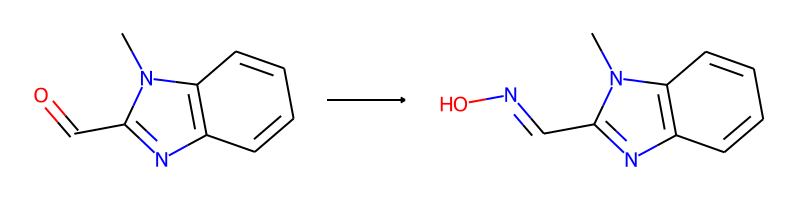

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH;D2;+0:1]=[O;H0;D1;+0]>>O-N=[CH;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


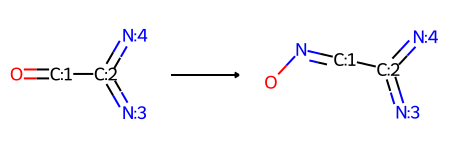

->No precursors could be generated!


--------------------------------------------------

Train index: 12797
RANK 59 PRECEDENT
REACTANT MATCH SCORE: 0.5434782608695652


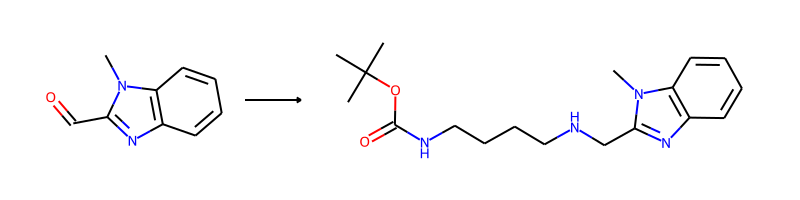

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH;D2;+0:1]=[O;H0;D1;+0]>>C-C(-C)(-C)-O-C(=O)-N-C-C-C-C-N-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


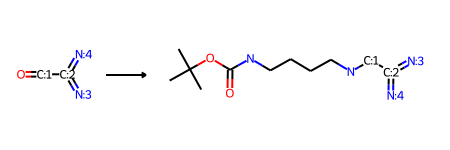

->No precursors could be generated!


--------------------------------------------------

Train index: 4253
RANK 60 PRECEDENT
REACTANT MATCH SCORE: 0.5423728813559322


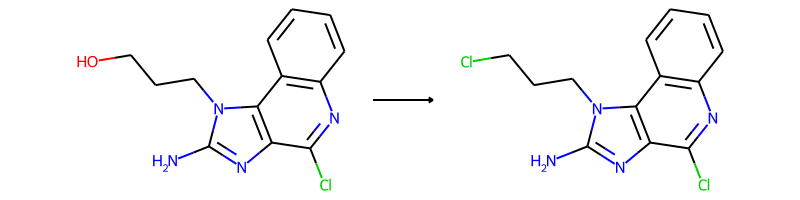

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Cl-[CH2;D2;+0:1]-[C:2]


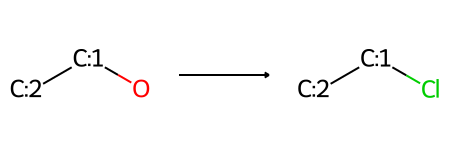

->No precursors could be generated!


--------------------------------------------------

Train index: 188763
RANK 61 PRECEDENT
REACTANT MATCH SCORE: 0.54


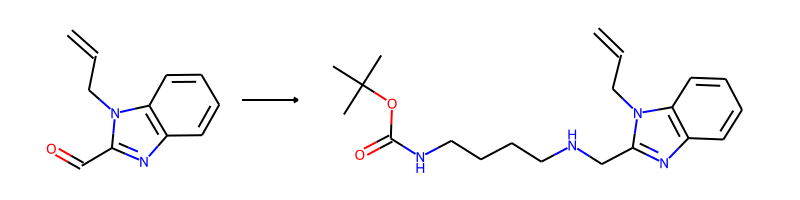

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH;D2;+0:1]=[O;H0;D1;+0]>>C-C(-C)(-C)-O-C(=O)-N-C-C-C-C-N-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


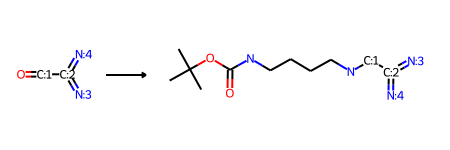

->No precursors could be generated!


--------------------------------------------------

Train index: 45137
RANK 62 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


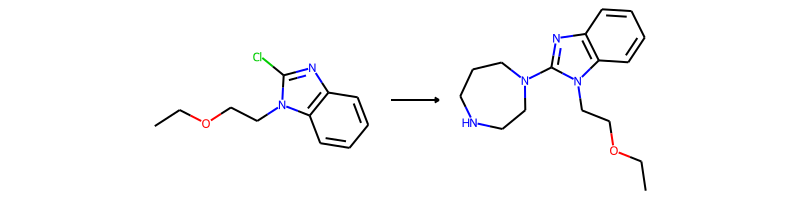

-> template: [#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-[Cl;H0;D1;+0]>>[#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-N1-C-C-C-N-C-C-1


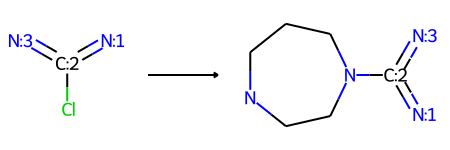

->No precursors could be generated!


--------------------------------------------------

Train index: 219004
RANK 63 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


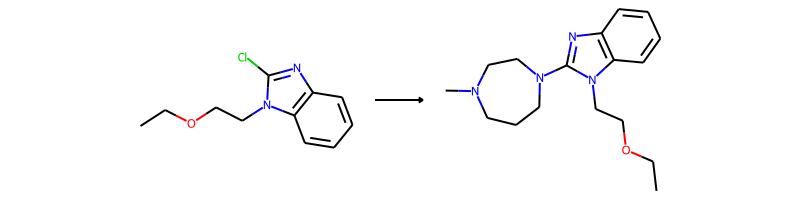

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>C-N1-C-C-C-N(-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3])-C-C-1


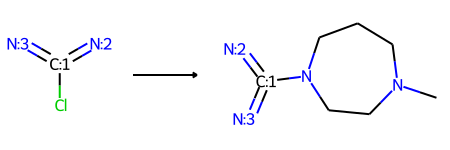

->No precursors could be generated!


--------------------------------------------------

Train index: 370553
RANK 64 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


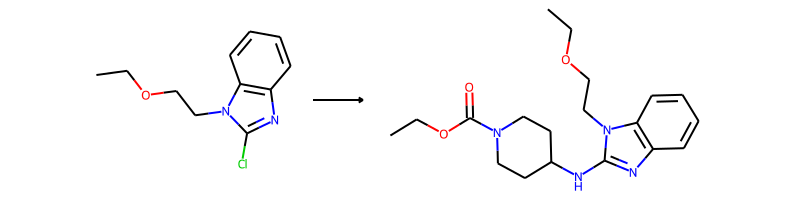

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>C-C-O-C(=O)-N1-C-C-C(-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3])-C-C-1


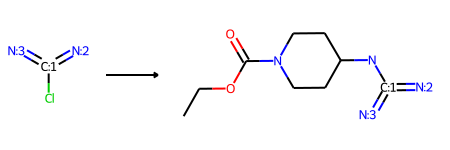

->No precursors could be generated!


--------------------------------------------------

Train index: 411914
RANK 65 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


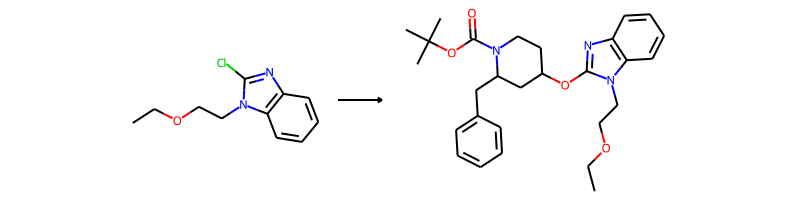

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>C-C(-C)(-C)-O-C(=O)-N1-C-C-C(-O-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3])-C-C-1-C-c1:c:c:c:c:c:1


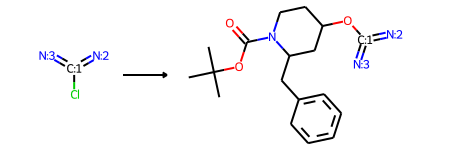

->No precursors could be generated!


--------------------------------------------------

Train index: 294074
RANK 66 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


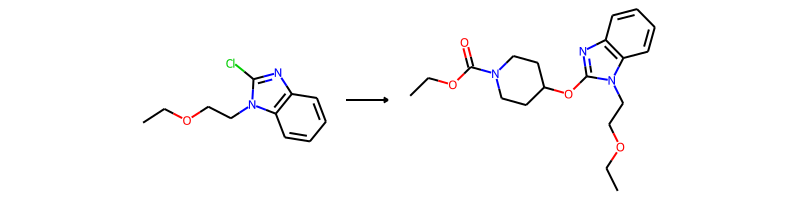

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>C-C-O-C(=O)-N1-C-C-C(-O-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3])-C-C-1


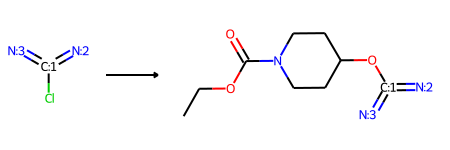

->No precursors could be generated!


--------------------------------------------------

Train index: 299286
RANK 67 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


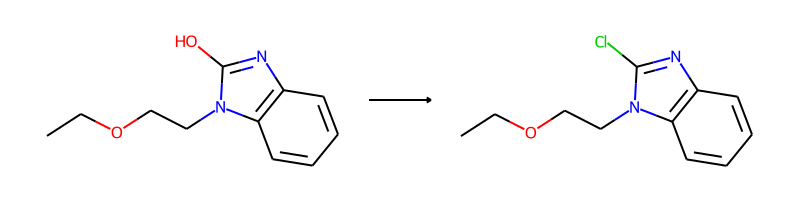

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[O;H1;D1;+0]>>Cl-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


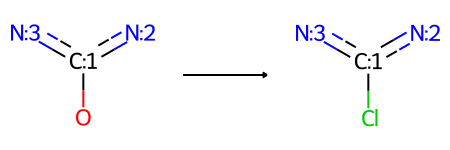

->No precursors could be generated!


--------------------------------------------------

Train index: 177668
RANK 68 PRECEDENT
REACTANT MATCH SCORE: 0.5370370370370371


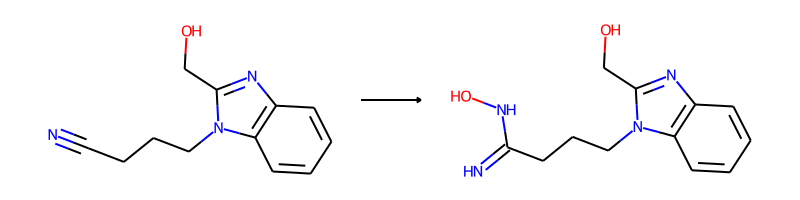

-> template: [C:2]-[C;H0;D2;+0:1]#[N;H0;D1;+0:3]>>O-N-[C;H0;D3;+0:1](-[C:2])=[NH;D1;+0:3]


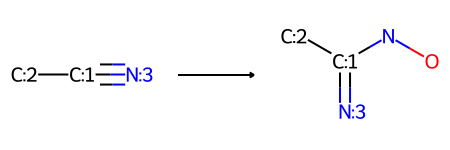

->No precursors could be generated!


--------------------------------------------------

Train index: 274626
RANK 69 PRECEDENT
REACTANT MATCH SCORE: 0.5370370370370371


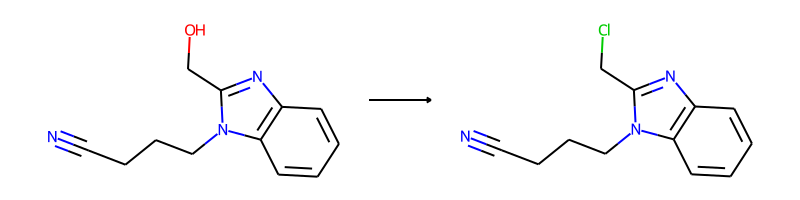

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Cl-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


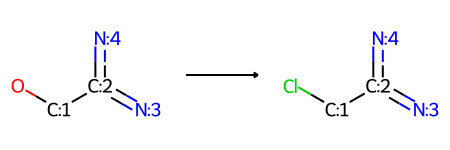

->No precursors could be generated!


--------------------------------------------------

Train index: 4108
RANK 70 PRECEDENT
REACTANT MATCH SCORE: 0.5333333333333333


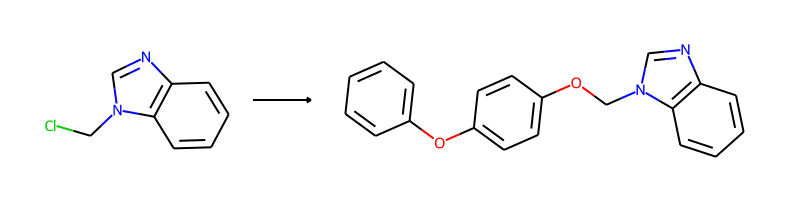

-> template: [#7;a:1]-[CH2;D2;+0:2]-[Cl;H0;D1;+0]>>[#7;a:1]-[CH2;D2;+0:2]-O-c1:c:c:c(-O-c2:c:c:c:c:c:2):c:c:1


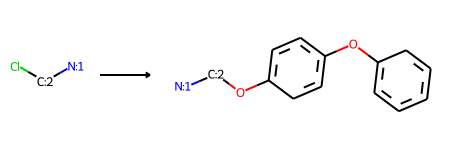

->No precursors could be generated!


--------------------------------------------------

Train index: 80138
RANK 71 PRECEDENT
REACTANT MATCH SCORE: 0.5294117647058824


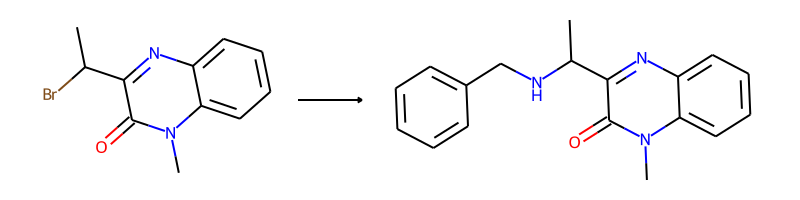

-> template: [#7;a:1]:[c:2](:[c:3]:[#7;a:4])-[CH;D3;+0:5](-[Br;H0;D1;+0])-[C;D1;H3:6]>>[#7;a:1]:[c:2](:[c:3]:[#7;a:4])-[CH;D3;+0:5](-[C;D1;H3:6])-N-C-c1:c:c:c:c:c:1


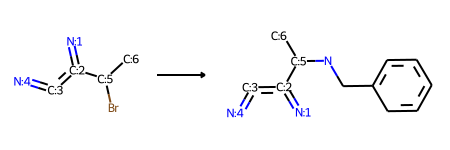

->No precursors could be generated!


--------------------------------------------------

Train index: 252296
RANK 72 PRECEDENT
REACTANT MATCH SCORE: 0.5294117647058824


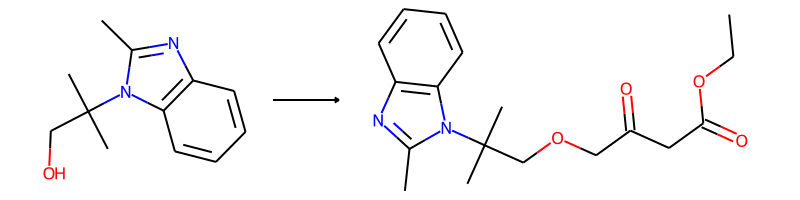

-> template: [C:2]-[OH;D1;+0:1]>>C-C-O-C(=O)-C-C(=O)-C-[O;H0;D2;+0:1]-[C:2]


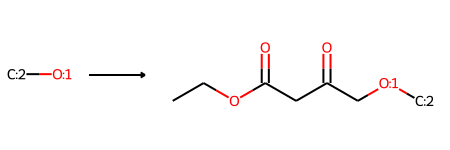

->No precursors could be generated!


--------------------------------------------------

Train index: 142714
RANK 73 PRECEDENT
REACTANT MATCH SCORE: 0.5294117647058824


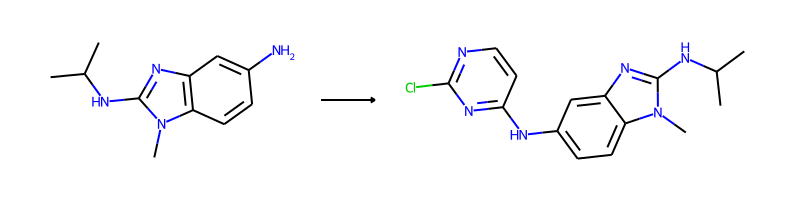

-> template: [NH2;D1;+0:1]-[c:2]>>Cl-c1:n:c:c:c(-[NH;D2;+0:1]-[c:2]):n:1


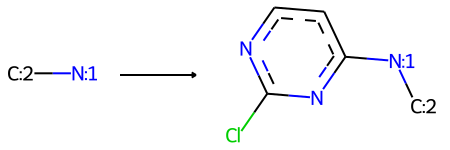

Product similarity 0.6438356164383562, overall 0.34085414987912976, smiles CCCn1c(Nc2ccnc(Cl)n2)nc2ccccc21


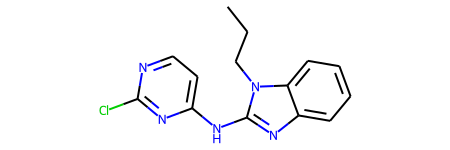

The proposed reaction is:


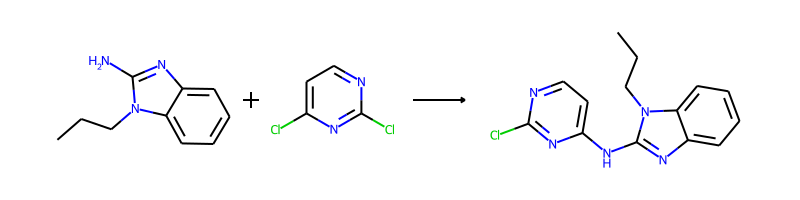

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.Clc1ccnc(Cl)n1>>CCCn1c(Nc2ccnc(Cl)n2)nc2ccccc21


--------------------------------------------------

Train index: 100314
RANK 74 PRECEDENT
REACTANT MATCH SCORE: 0.5208333333333334


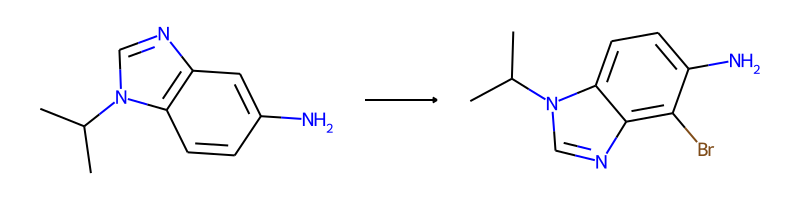

-> template: [#7;a:6]:[c:5]:[c:3](:[#7;a:4]):[cH;D2;+0:1]:[c:2]>>Br-[c;H0;D3;+0:1](:[c:2]):[c:3](:[#7;a:4]):[c:5]:[#7;a:6]


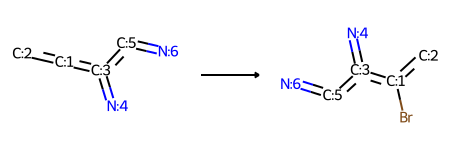

Product similarity 0.54, overall 0.28125000000000006, smiles CCCn1c(N)nc2c(Br)cccc21


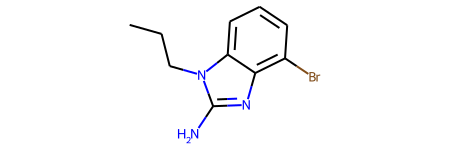

The proposed reaction is:


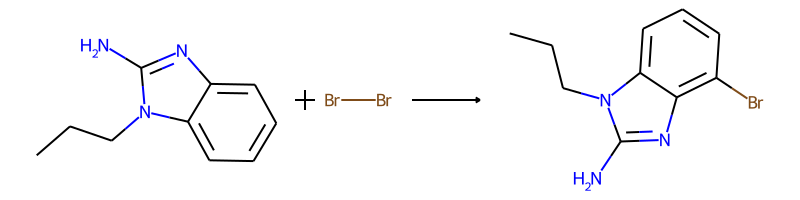

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2c(Br)cccc21
Product similarity 0.4807692307692308, overall 0.250400641025641, smiles CCCn1c(N)nc2cccc(Br)c21


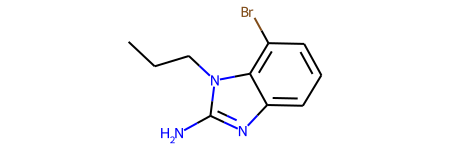

The proposed reaction is:


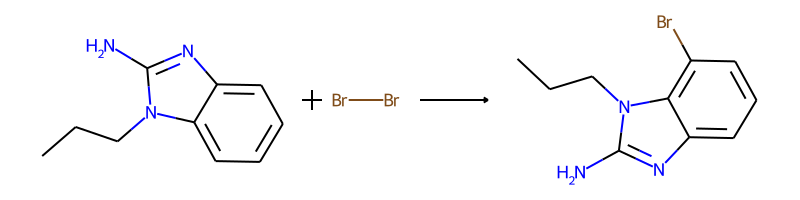

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2cccc(Br)c21


--------------------------------------------------

Train index: 128300
RANK 75 PRECEDENT
REACTANT MATCH SCORE: 0.5208333333333334


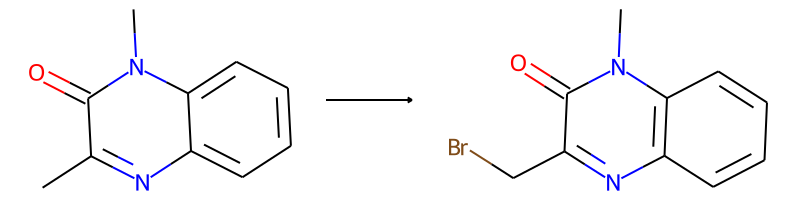

-> template: [#7;a:5]:[c:4]:[c:2](:[#7;a:3])-[CH3;D1;+0:1]>>Br-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[c:4]:[#7;a:5]


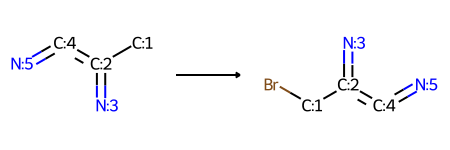

->No precursors could be generated!


--------------------------------------------------

Train index: 58027
RANK 76 PRECEDENT
REACTANT MATCH SCORE: 0.5208333333333334


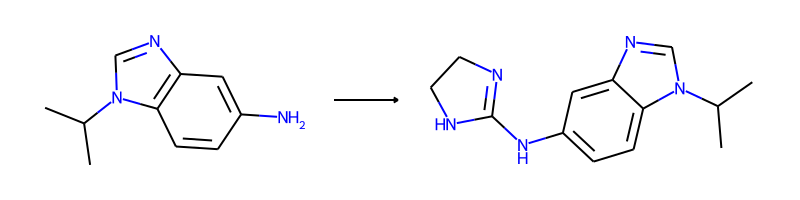

-> template: [NH2;D1;+0:2]-[c:1]>>[c:1]-[NH;D2;+0:2]-C1=N-C-C-N-1


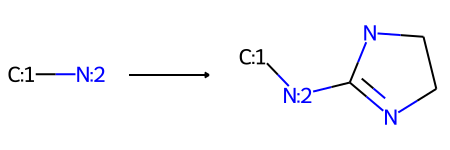

Product similarity 0.6153846153846154, overall 0.32051282051282054, smiles CCCn1c(NC2=NCCN2)nc2ccccc21


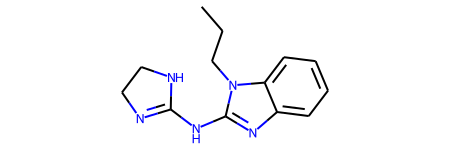

The proposed reaction is:


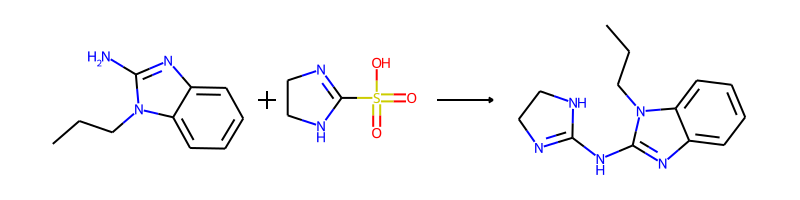

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=S(=O)(O)C1=NCCN1>>CCCn1c(NC2=NCCN2)nc2ccccc21


--------------------------------------------------

Train index: 77609
RANK 77 PRECEDENT
REACTANT MATCH SCORE: 0.5208333333333334


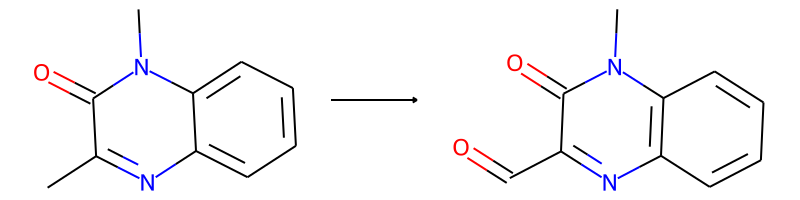

-> template: [#7;a:5]:[c:4]:[c:2](:[#7;a:3])-[CH3;D1;+0:1]>>O=[CH;D2;+0:1]-[c:2](:[#7;a:3]):[c:4]:[#7;a:5]


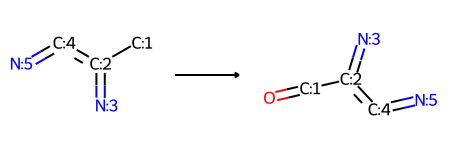

->No precursors could be generated!


--------------------------------------------------

Train index: 137096
RANK 78 PRECEDENT
REACTANT MATCH SCORE: 0.52


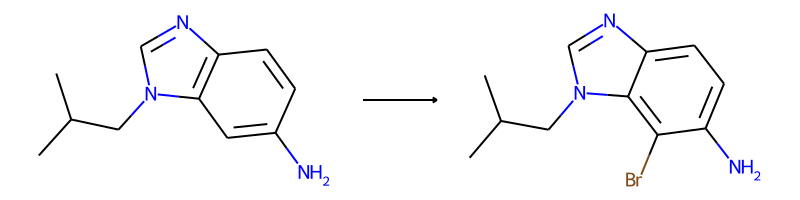

-> template: [#7;a:4]:[c:3](:[c:5]:[#7;a:6]):[cH;D2;+0:1]:[c:2]>>Br-[c;H0;D3;+0:1](:[c:2]):[c:3](:[#7;a:4]):[c:5]:[#7;a:6]


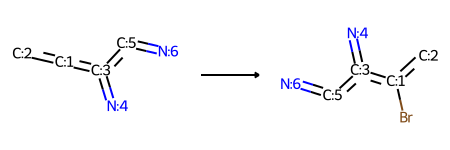

Product similarity 0.48148148148148145, overall 0.25037037037037035, smiles CCCn1c(N)nc2c(Br)cccc21


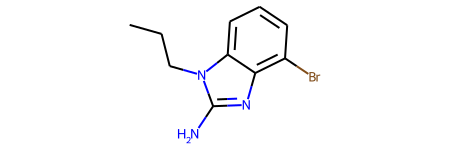

The proposed reaction is:


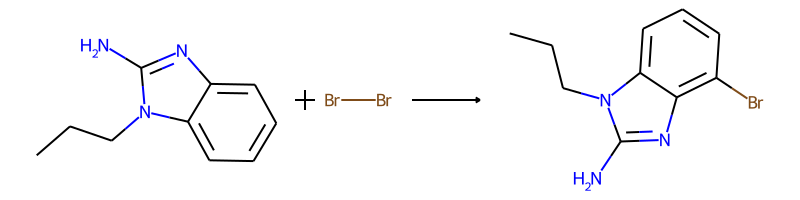

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2c(Br)cccc21
Product similarity 0.5384615384615384, overall 0.27999999999999997, smiles CCCn1c(N)nc2cccc(Br)c21


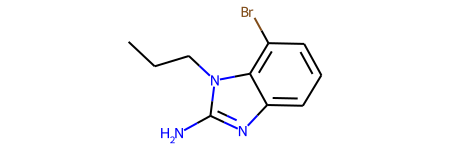

The proposed reaction is:


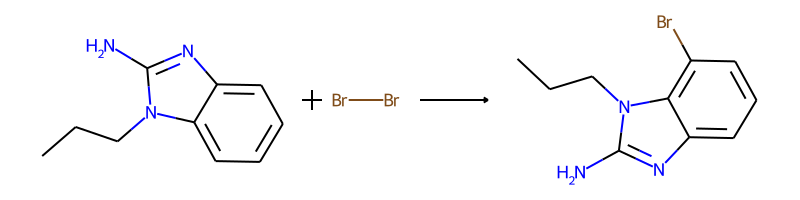

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2cccc(Br)c21


--------------------------------------------------

Train index: 52762
RANK 79 PRECEDENT
REACTANT MATCH SCORE: 0.52


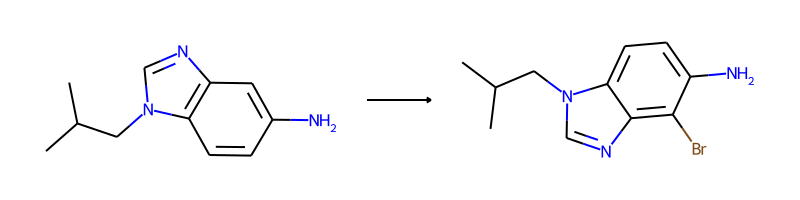

-> template: [#7;a:6]:[c:5]:[c:3](:[#7;a:4]):[cH;D2;+0:1]:[c:2]>>Br-[c;H0;D3;+0:1](:[c:2]):[c:3](:[#7;a:4]):[c:5]:[#7;a:6]


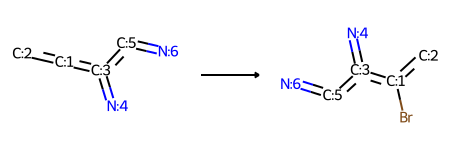

Product similarity 0.5384615384615384, overall 0.27999999999999997, smiles CCCn1c(N)nc2c(Br)cccc21


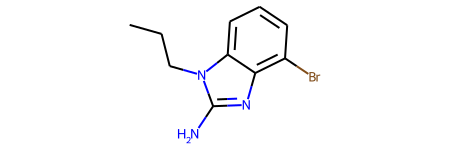

The proposed reaction is:


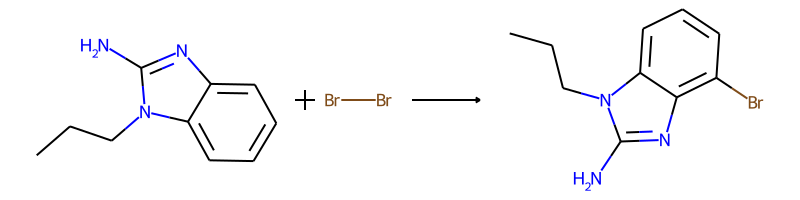

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2c(Br)cccc21
Product similarity 0.48148148148148145, overall 0.25037037037037035, smiles CCCn1c(N)nc2cccc(Br)c21


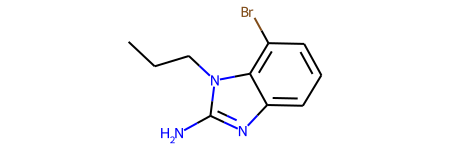

The proposed reaction is:


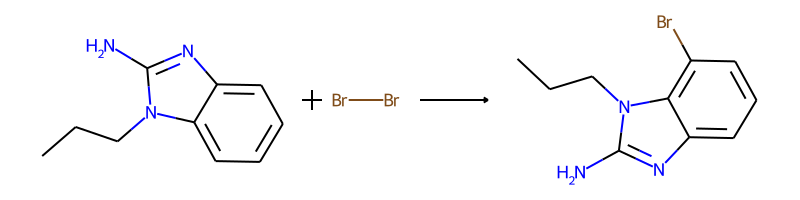

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.BrBr>>CCCn1c(N)nc2cccc(Br)c21


--------------------------------------------------

Train index: 378657
RANK 80 PRECEDENT
REACTANT MATCH SCORE: 0.52


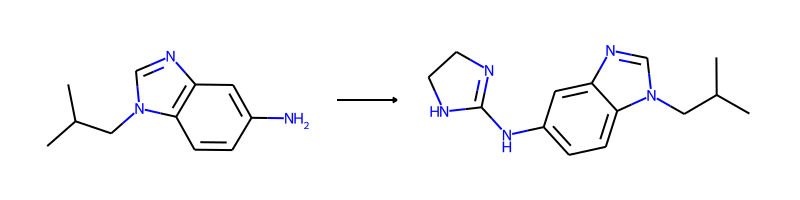

-> template: [NH2;D1;+0:2]-[c:1]>>[c:1]-[NH;D2;+0:2]-C1=N-C-C-N-1


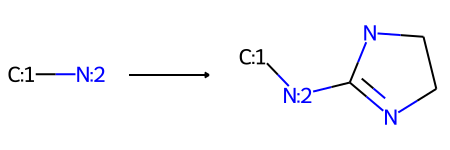

Product similarity 0.6119402985074627, overall 0.3182089552238806, smiles CCCn1c(NC2=NCCN2)nc2ccccc21


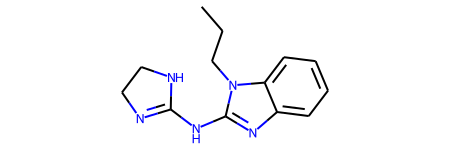

The proposed reaction is:


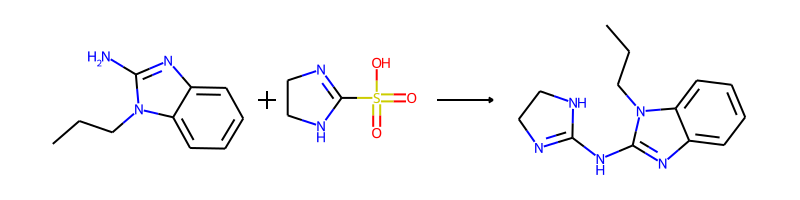

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.O=S(=O)(O)C1=NCCN1>>CCCn1c(NC2=NCCN2)nc2ccccc21


--------------------------------------------------

Train index: 295330
RANK 81 PRECEDENT
REACTANT MATCH SCORE: 0.5192307692307693


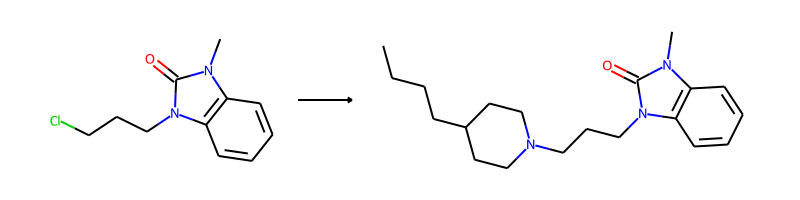

-> template: [C:2]-[CH2;D2;+0:1]-[Cl;H0;D1;+0]>>C-C-C-C-C1-C-C-N(-[CH2;D2;+0:1]-[C:2])-C-C-1


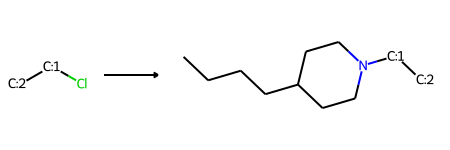

->No precursors could be generated!


--------------------------------------------------

Train index: 135004
RANK 82 PRECEDENT
REACTANT MATCH SCORE: 0.5185185185185185


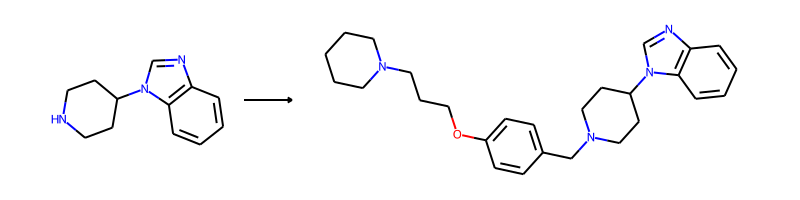

-> template: [C:1]-[NH;D2;+0:2]-[C:3]>>[C:1]-[N;H0;D3;+0:2](-[C:3])-C-c1:c:c:c(-O-C-C-C-N2-C-C-C-C-C-2):c:c:1


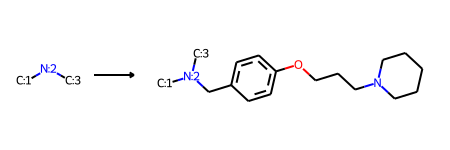

->No precursors could be generated!


--------------------------------------------------

Train index: 235173
RANK 83 PRECEDENT
REACTANT MATCH SCORE: 0.5185185185185185


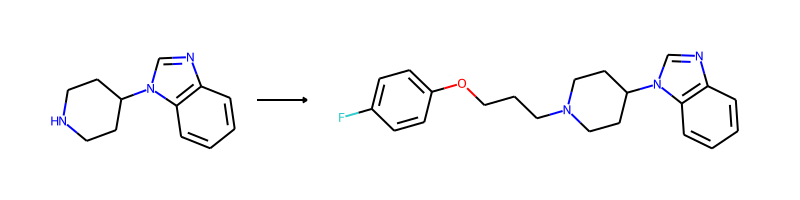

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>F-c1:c:c:c(-O-C-C-C-[N;H0;D3;+0:1](-[C:2])-[C:3]):c:c:1


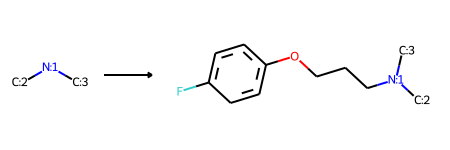

->No precursors could be generated!


--------------------------------------------------

Train index: 325185
RANK 84 PRECEDENT
REACTANT MATCH SCORE: 0.5185185185185185


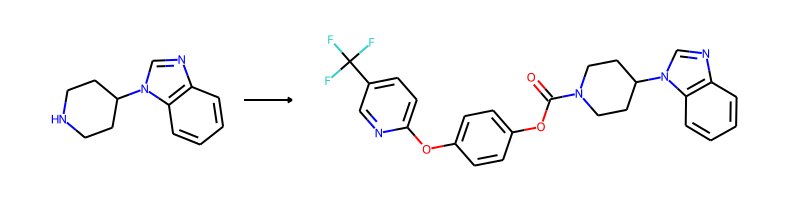

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>F-C(-F)(-F)-c1:c:c:c(-O-c2:c:c:c(-O-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3]):c:c:2):n:c:1


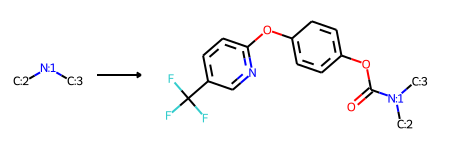

->No precursors could be generated!


--------------------------------------------------

Train index: 101825
RANK 85 PRECEDENT
REACTANT MATCH SCORE: 0.5185185185185185


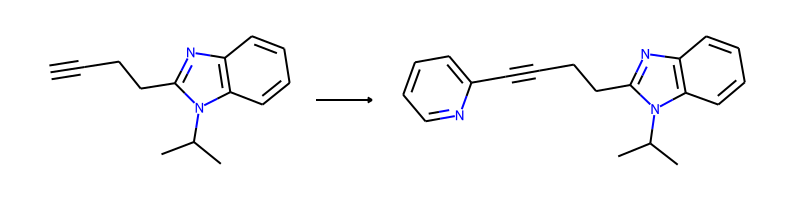

-> template: [C:1]#[CH;D1;+0:2]>>[C:1]#[C;H0;D2;+0:2]-c1:c:c:c:c:n:1


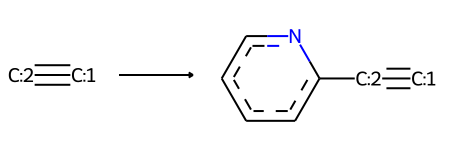

->No precursors could be generated!


--------------------------------------------------

Train index: 361082
RANK 86 PRECEDENT
REACTANT MATCH SCORE: 0.5172413793103449


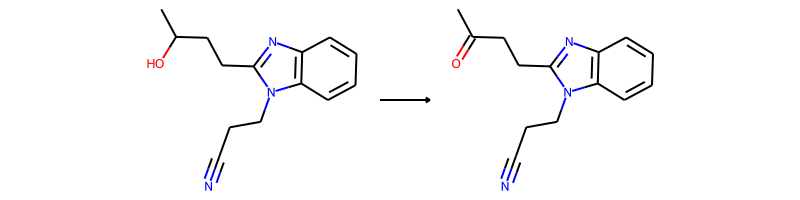

-> template: [C:1]-[CH;D3;+0:2](-[C;D1;H3:3])-[OH;D1;+0:4]>>[C:1]-[C;H0;D3;+0:2](-[C;D1;H3:3])=[O;H0;D1;+0:4]


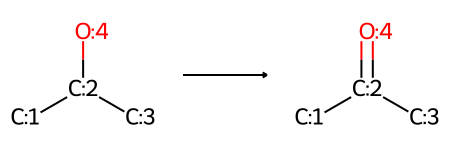

->No precursors could be generated!


--------------------------------------------------

Train index: 296655
RANK 87 PRECEDENT
REACTANT MATCH SCORE: 0.5172413793103449


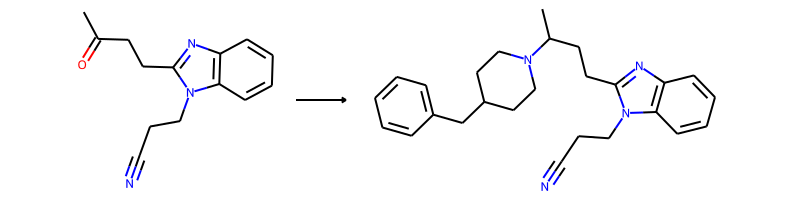

-> template: [C:1]-[C;H0;D3;+0:2](-[C;D1;H3:3])=[O;H0;D1;+0]>>[C:1]-[CH;D3;+0:2](-[C;D1;H3:3])-N1-C-C-C(-C-c2:c:c:c:c:c:2)-C-C-1


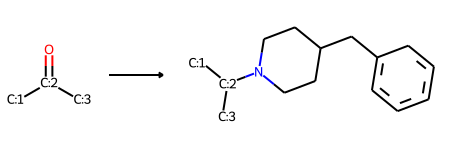

->No precursors could be generated!


--------------------------------------------------

Train index: 285078
RANK 88 PRECEDENT
REACTANT MATCH SCORE: 0.5172413793103449


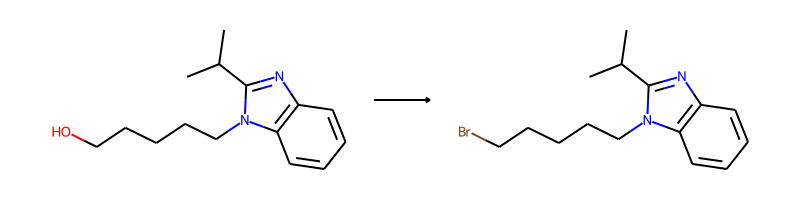

-> template: [C:2]-[CH2;D2;+0:1]-[O;H1;D1;+0]>>Br-[CH2;D2;+0:1]-[C:2]


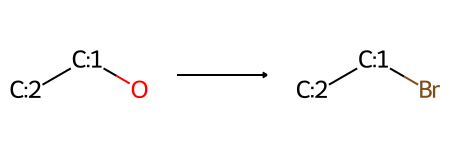

->No precursors could be generated!


--------------------------------------------------

Train index: 366137
RANK 89 PRECEDENT
REACTANT MATCH SCORE: 0.5106382978723404


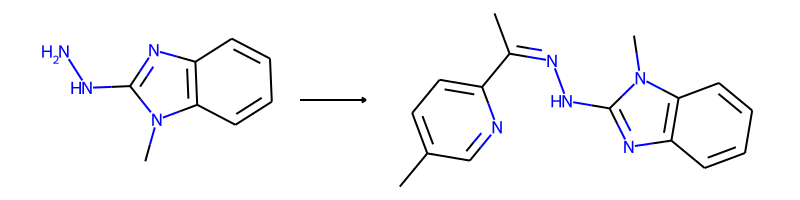

-> template: [#7:2]-[NH2;D1;+0:1]>>C-C(=[N;H0;D2;+0:1]-[#7:2])-c1:c:c:c(-C):c:n:1


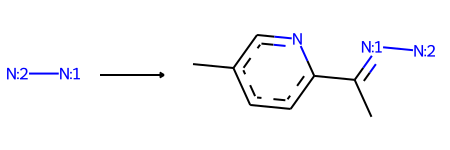

->No precursors could be generated!


--------------------------------------------------

Train index: 426586
RANK 90 PRECEDENT
REACTANT MATCH SCORE: 0.5106382978723404


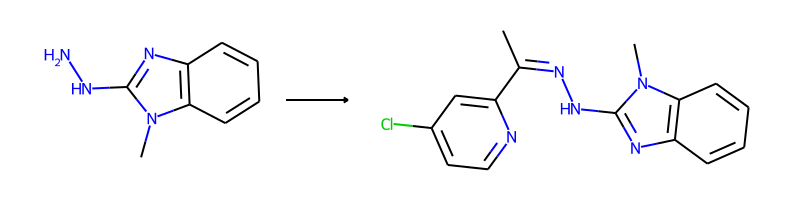

-> template: [#7:2]-[NH2;D1;+0:1]>>C-C(=[N;H0;D2;+0:1]-[#7:2])-c1:c:c(-Cl):c:c:n:1


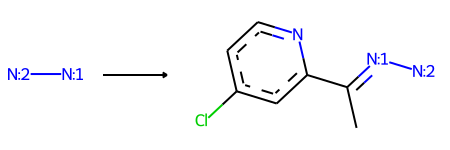

->No precursors could be generated!


--------------------------------------------------

Train index: 262688
RANK 91 PRECEDENT
REACTANT MATCH SCORE: 0.5106382978723404


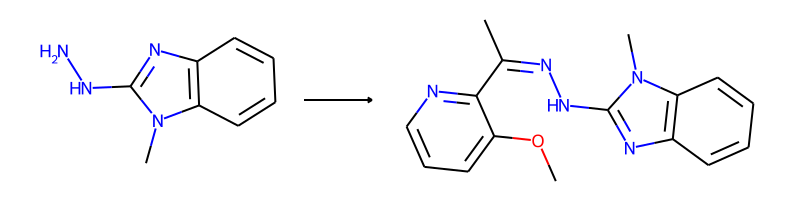

-> template: [#7:2]-[NH2;D1;+0:1]>>C-O-c1:c:c:c:n:c:1-C(-C)=[N;H0;D2;+0:1]-[#7:2]


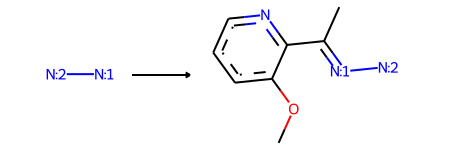

->No precursors could be generated!


--------------------------------------------------

Train index: 170779
RANK 92 PRECEDENT
REACTANT MATCH SCORE: 0.5106382978723404


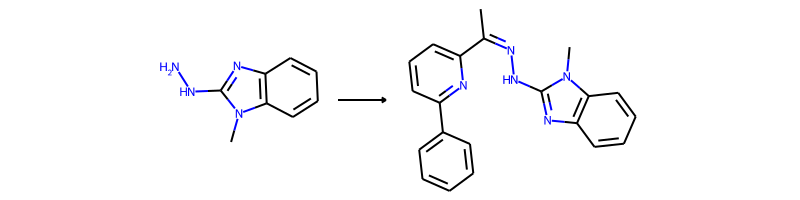

-> template: [#7:2]-[NH2;D1;+0:1]>>C-C(=[N;H0;D2;+0:1]-[#7:2])-c1:c:c:c:c(-c2:c:c:c:c:c:2):n:1


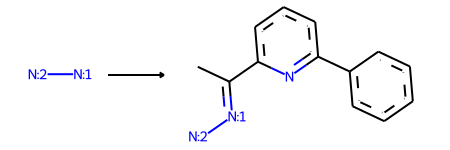

->No precursors could be generated!


--------------------------------------------------

Train index: 283800
RANK 93 PRECEDENT
REACTANT MATCH SCORE: 0.5106382978723404


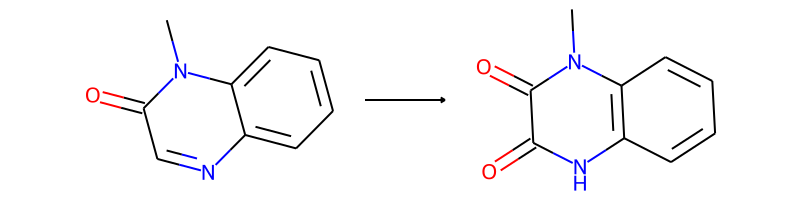

-> template: [#7;a:3]1:[c:4]:[c:5]:[n;H0;D2;+0:6]:[cH;D2;+0:1]:[c:2]:1>>O=[c;H0;D3;+0:1]1:[c:2]:[#7;a:3]:[c:4]:[c:5]:[nH;D2;+0:6]:1


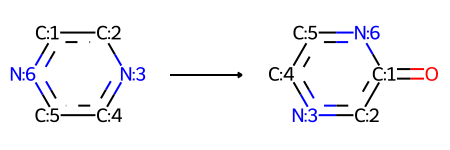

->No precursors could be generated!


--------------------------------------------------

Train index: 408427
RANK 94 PRECEDENT
REACTANT MATCH SCORE: 0.5098039215686274


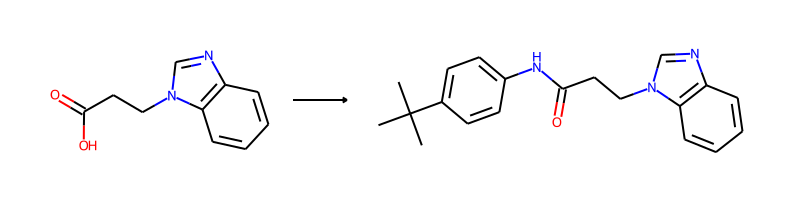

-> template: [C:2]-[C;H0;D3;+0:1](=[O;H0;D1;+0])-[OH;D1;+0:3]>>C-C(-C)(-C)-c1:c:c:c(-N-[C;H0;D3;+0:1](-[C:2])=[O;H0;D1;+0:3]):c:c:1


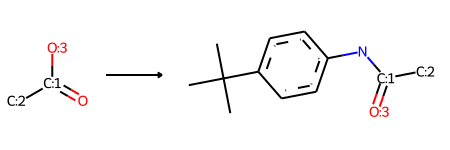

->No precursors could be generated!


--------------------------------------------------

Train index: 109557
RANK 95 PRECEDENT
REACTANT MATCH SCORE: 0.5094339622641509


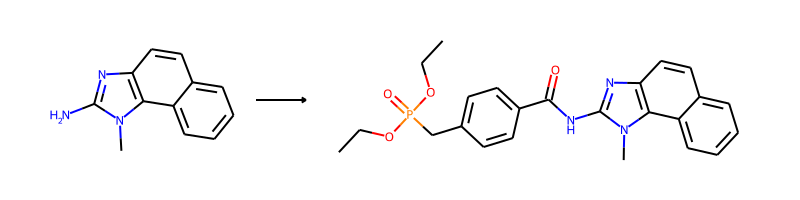

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[NH2;D1;+0:1]>>C-C-O-P(=O)(-C-c1:c:c:c(-C(=O)-[NH;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]):c:c:1)-O-C-C


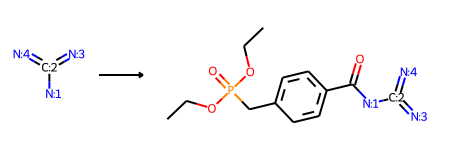

Product similarity 0.7425742574257426, overall 0.37829254623575564, smiles CCCn1c(NC(=O)c2ccc(CP(=O)(OCC)OCC)cc2)nc2ccccc21


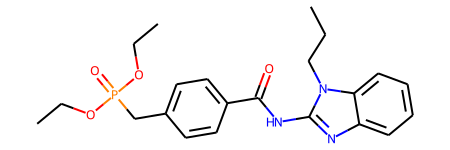

The proposed reaction is:


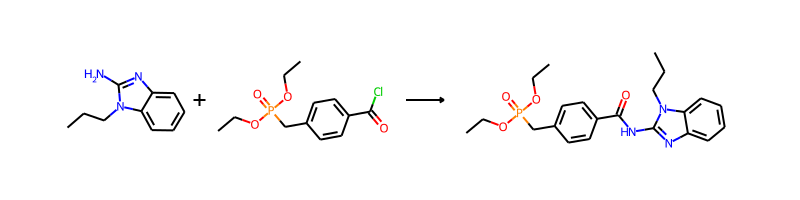

The reaction SMILES string is: CCCN1C2=CC=CC=C2N=C1N.CCOP(=O)(Cc1ccc(C(=O)Cl)cc1)OCC>>CCCn1c(NC(=O)c2ccc(CP(=O)(OCC)OCC)cc2)nc2ccccc21


--------------------------------------------------

Train index: 284138
RANK 96 PRECEDENT
REACTANT MATCH SCORE: 0.509090909090909


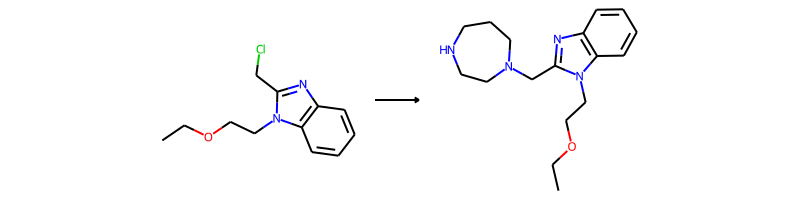

-> template: [#7;a:1]:[c:2](:[#7;a:3])-[CH2;D2;+0:4]-[Cl;H0;D1;+0]>>[#7;a:1]:[c:2](:[#7;a:3])-[CH2;D2;+0:4]-N1-C-C-C-N-C-C-1


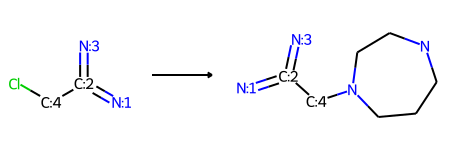

->No precursors could be generated!


--------------------------------------------------

Train index: 250661
RANK 97 PRECEDENT
REACTANT MATCH SCORE: 0.509090909090909


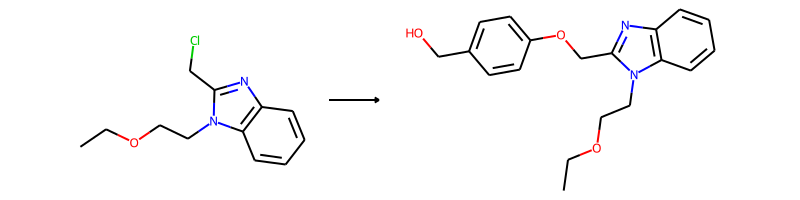

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[CH2;D2;+0:1]-[Cl;H0;D1;+0]>>O-C-c1:c:c:c(-O-[CH2;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]):c:c:1


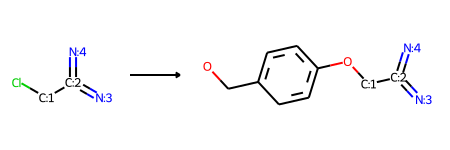

->No precursors could be generated!


--------------------------------------------------

Train index: 109091
RANK 98 PRECEDENT
REACTANT MATCH SCORE: 0.5087719298245614


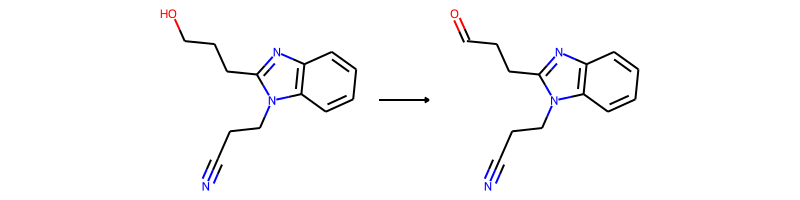

-> template: [C:1]-[CH2;D2;+0:2]-[OH;D1;+0:3]>>[C:1]-[CH;D2;+0:2]=[O;H0;D1;+0:3]


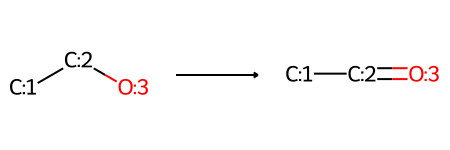

->No precursors could be generated!


--------------------------------------------------

Train index: 155345
RANK 99 PRECEDENT
REACTANT MATCH SCORE: 0.5081967213114754


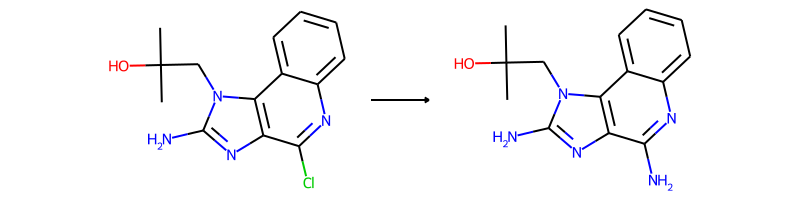

-> template: [#7;a:4]:[c:3](:[c:5]:[#7;a:6]):[c;H0;D3;+0:1](:[#7;a:2])-[Cl;H0;D1;+0]>>N-[c;H0;D3;+0:1](:[#7;a:2]):[c:3](:[#7;a:4]):[c:5]:[#7;a:6]


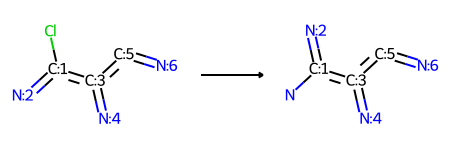

->No precursors could be generated!


--------------------------------------------------

Train index: 205858
RANK 100 PRECEDENT
REACTANT MATCH SCORE: 0.5


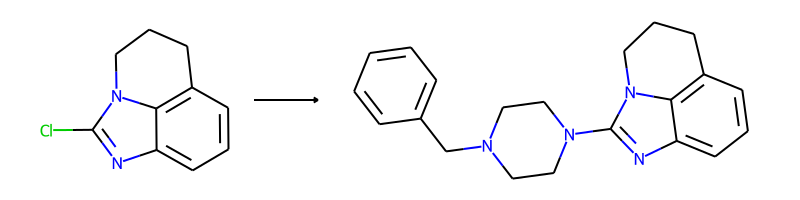

-> template: [#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-[Cl;H0;D1;+0]>>[#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-N1-C-C-N(-C-c2:c:c:c:c:c:2)-C-C-1


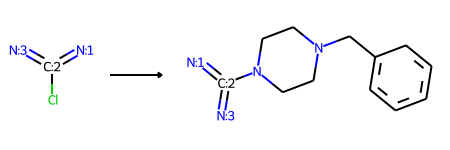

->No precursors could be generated!


In [26]:
do_one_v4_SMILES ('CCCN1C2=CC=CC=C2N=C1N')

In [42]:
datasub_val5 = datasub_val.sample (n = 5)

In [43]:
datasub_val5

,Reaction SMILES,reactionID,react_smiles,rxn_smiles,template,Template Verification (True/False),canonical_rxn_smiles,dataset,Reaction Partner (s),react_fp
411636,[Cl:31][c:32]1[cH:33][n:34][c:35]([S:38]([CH3:...,438483,Cc1ccc(-c2c(OCCO)nn(C)c2NS(=O)(=O)c2ccc(C)cn2)cc1,[OH:1][CH2:2][CH2:3][O:4][c:5]1[n:6][n:7]([CH3...,[C:2]-[OH;D1;+0:1]>>Cl-c1:c:n:c(-[O;H0;D2;+0:1...,True,Cc1ccc(-c2c(OCCO)nn(C)c2NS(=O)(=O)c2ccc(C)cn2)...,test,[CS(=O)(=O)c1ncc(Cl)cn1],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...
81676,[C:1]([CH3:2])([CH3:3])([CH3:4])[O:5][C:6](=[O...,83120,CC(C)(C)OC(=O)N(Cc1ccc2c(c1)OCCO2)C1CCN(CCn2c(...,O[C:27]([c:20]1[cH:19][c:18](=[O:30])[n:17]([C...,[O;D1;H0:2]=[C;H0;D3;+0:1](-[O;H1;D1;+0])-[c:3...,True,CC(C)(C)OC(=O)N(Cc1ccc2c(c1)OCCO2)C1CCN(CCn2c(...,test,[CS(N)(=O)=O],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...
163994,[CH2:1]([CH3:2])[c:3]1[cH:4][c:5](-[c:11]2[cH:...,169052,CCc1cc(-c2ccc(S(=O)(=O)Cl)s2)c(C)[nH]c1=O,Cl[S:16]([c:14]1[cH:13][cH:12][c:11](-[c:5]2[c...,[#16;a:5]:[c:4]-[S;H0;D4;+0:1](-[Cl;H0;D1;+0])...,True,CCc1cc(-c2ccc(S(=O)(=O)Cl)s2)c(C)[nH]c1=O>>CCc...,test,[NCCN1CCCC1C(=O)O],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...
208547,[CH3:13][O:14][CH:15]([N:16]([CH3:17])[CH3:18]...,216278,CCSc1ncc(C#N)c(N)n1,[NH2:1][c:2]1[n:3][c:4]([S:10][CH2:11][CH3:12]...,[#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-N(-C)-C=[N;H0;...,True,CCSc1ncc(C#N)c(N)n1>>CCSc1ncc(C#N)c(N=CN(C)C)n1,test,[COC(OC)N(C)C],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...
167437,[CH3:1][O:2][c:3]1[n:4][c:5]([O:11][c:12]2[c:1...,172686,COc1cc(OC)nc(Oc2ccccc2C=O)n1,O=[CH:14][c:13]1[c:12]([O:11][c:5]2[n:4][c:3](...,[O;H0;D1;+0]=[CH;D2;+0:1]-[c:2]>>Cl-c1:c:c:c(-...,True,COc1cc(OC)nc(Oc2ccccc2C=O)n1>>COc1cc(OC)nc(Oc2...,test,[NOCc1ccc(Cl)cc1Cl],<rdkit.DataStructs.cDataStructs.UIntSparseIntV...


Mol 208547, reactant input:


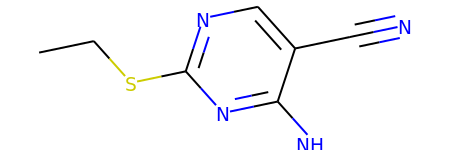

SMILES: CCSc1ncc(C#N)c(N)n1
Desired Reaction:


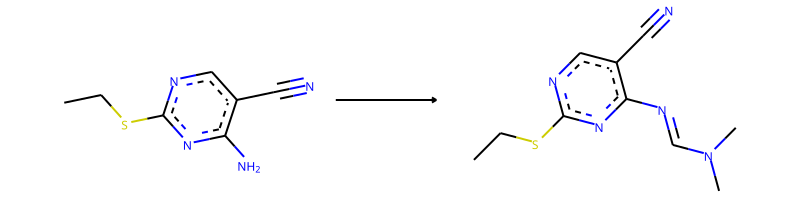

Reaction SMILES: [NH2:1][c:2]1[n:3][c:4]([S:10][CH2:11][CH3:12])[n:5][cH:6][c:7]1[C:8]#[N:9]>>CN(C)C=[N:1][c:2]1[n:3][c:4]([S:10][CH2:11][CH3:12])[n:5][cH:6][c:7]1[C:8]#[N:9]
Desired Product:


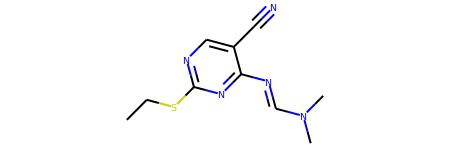

SMILES: CCSc1ncc(C#N)c(N=CN(C)C)n1


--------------------------------------------------

Train index: 28571
RANK 1 PRECEDENT
REACTANT MATCH SCORE: 0.8
Reaction SMILES (Precedent): [NH2:2][c:3]1[n:4][c:5]([S:11][CH3:12])[n:6][cH:7][c:8]1[C:9]#[N:10]>>S=[C:9]([c:8]1[c:3]([NH2:2])[n:4][c:5]([S:11][CH3:12])[n:6][cH:7]1)[NH2:10]


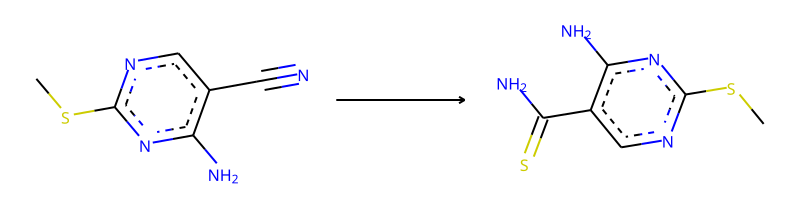

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>S=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


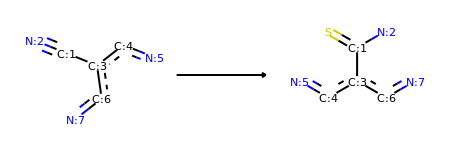

Product similarity 0.8108108108108109, overall 0.6486486486486487, smiles CCSc1ncc(C(N)=S)c(N)n1


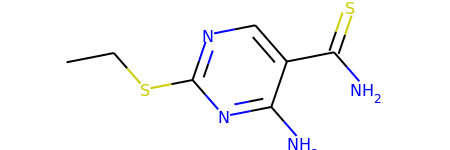

The proposed reaction is:


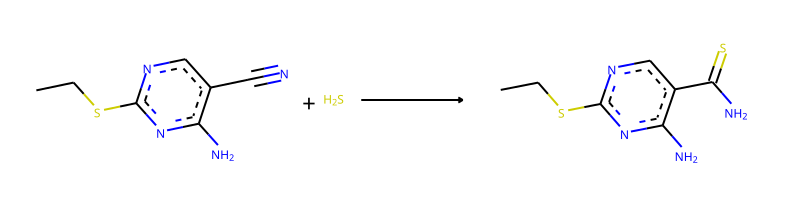

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.S>>CCSc1ncc(C(N)=S)c(N)n1


--------------------------------------------------

Train index: 183532
RANK 2 PRECEDENT
REACTANT MATCH SCORE: 0.8
Reaction SMILES (Precedent): [NH2:1][c:2]1[n:3][c:4]([S:10][CH3:11])[n:5][cH:6][c:7]1[C:8]#[N:9]>>COC(=O)c1ccc(C[NH:1][c:2]2[n:3][c:4]([S:10][CH3:11])[n:5][cH:6][c:7]2[C:8]#[N:9])cc1


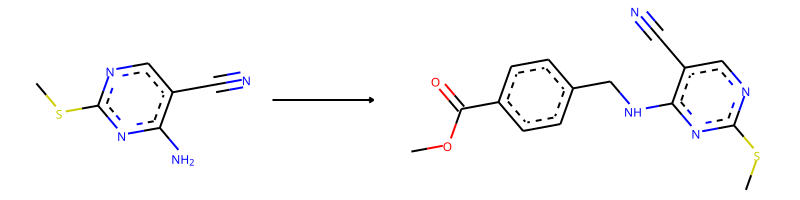

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-O-C(=O)-c1:c:c:c(-C-[NH;D2;+0:1]-[c:2]:[#7;a:3]):c:c:1


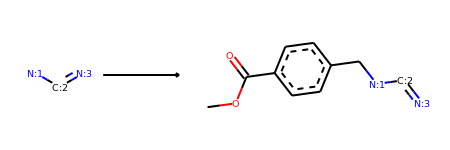

Product similarity 0.8955223880597015, overall 0.7164179104477613, smiles CCSc1ncc(C#N)c(NCc2ccc(C(=O)OC)cc2)n1


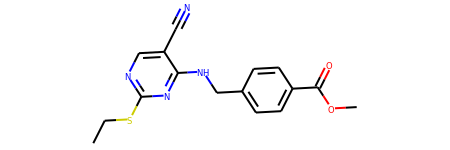

The proposed reaction is:


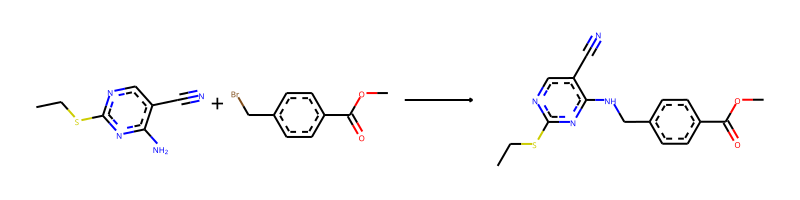

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COC(=O)c1ccc(CBr)cc1>>CCSc1ncc(C#N)c(NCc2ccc(C(=O)OC)cc2)n1


--------------------------------------------------

Train index: 25196
RANK 3 PRECEDENT
REACTANT MATCH SCORE: 0.8
Reaction SMILES (Precedent): N#[C:8][c:7]1[c:2]([NH2:1])[n:3][c:4]([S:10][CH3:11])[n:5][cH:6]1>>O=[CH:8][c:7]1[c:2]([NH2:1])[n:3][c:4]([S:10][CH3:11])[n:5][cH:6]1


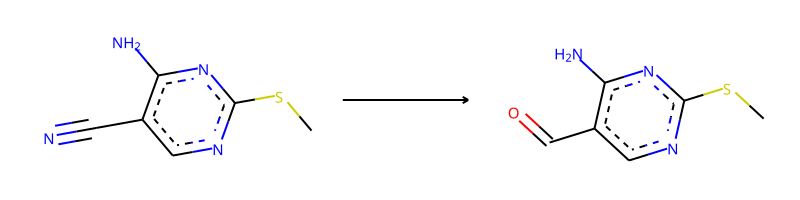

-> template: [#7;a:4]:[c:3]:[c:2](-[C;H0;D2;+0:1]#[N;H0;D1;+0]):[c:5]:[#7;a:6]>>O=[CH;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]


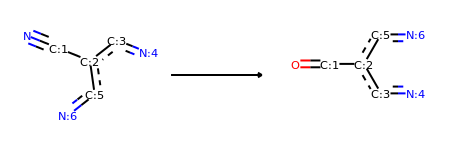

Product similarity 0.8, overall 0.6400000000000001, smiles CCSc1ncc(C=O)c(N)n1


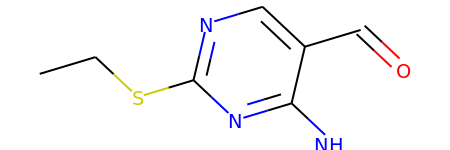

The proposed reaction is:


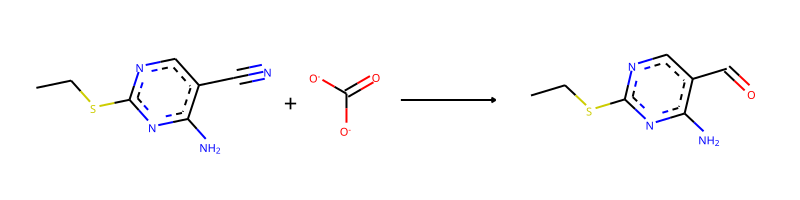

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.O=C([O-])[O-]>>CCSc1ncc(C=O)c(N)n1


--------------------------------------------------

Train index: 226914
RANK 4 PRECEDENT
REACTANT MATCH SCORE: 0.8
Reaction SMILES (Precedent): [NH2:12][c:13]1[n:14][c:15]([S:21][CH3:22])[n:16][cH:17][c:18]1[C:19]#[N:20]>>ON=[C:19]([c:18]1[c:13]([NH2:12])[n:14][c:15]([S:21][CH3:22])[n:16][cH:17]1)[NH2:20]


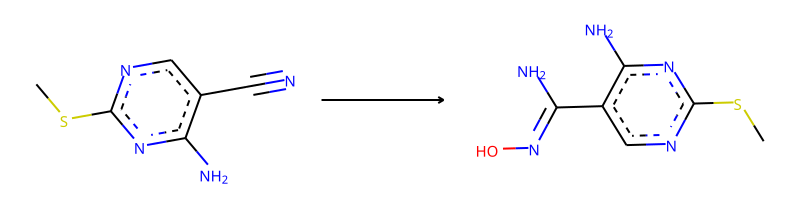

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>O-N=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


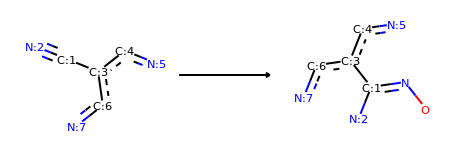

Product similarity 0.825, overall 0.66, smiles CCSc1ncc(C(N)=NO)c(N)n1


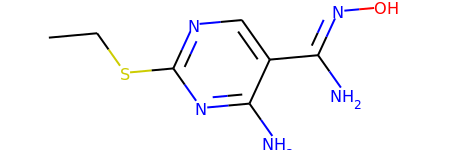

The proposed reaction is:


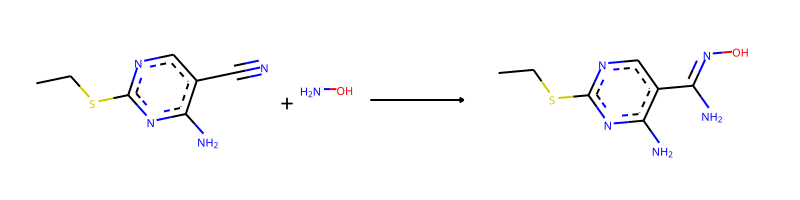

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.NO>>CCSc1ncc(C(N)=NO)c(N)n1


--------------------------------------------------

Train index: 234078
RANK 5 PRECEDENT
REACTANT MATCH SCORE: 0.8
Reaction SMILES (Precedent): [NH2:1][c:2]1[n:3][c:4]([S:10][CH3:11])[n:5][cH:6][c:7]1[C:8]#[N:9]>>CC(=O)[NH:1][c:2]1[n:3][c:4]([S:10][CH3:11])[n:5][cH:6][c:7]1[C:8]#[N:9]


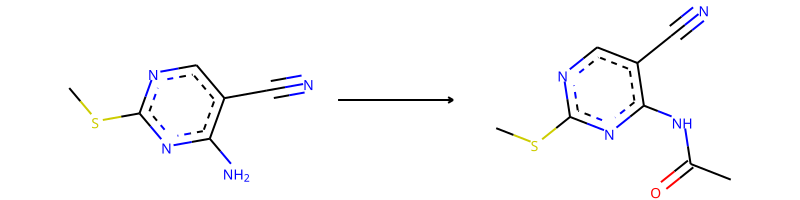

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-C(=O)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


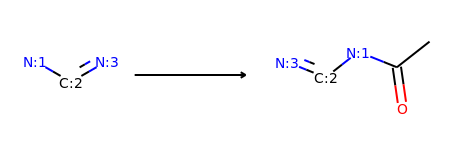

Product similarity 0.8372093023255814, overall 0.6697674418604652, smiles CCSc1ncc(C#N)c(NC(C)=O)n1


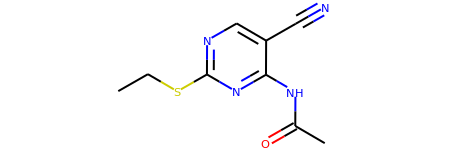

The proposed reaction is:


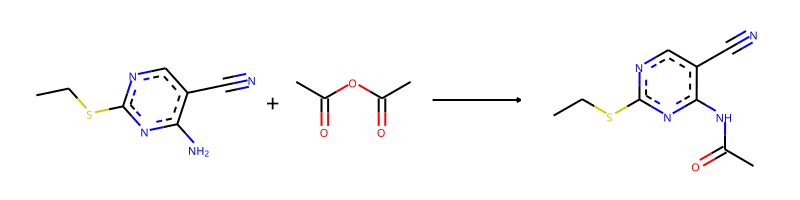

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.CC(=O)OC(C)=O>>CCSc1ncc(C#N)c(NC(C)=O)n1


--------------------------------------------------

Train index: 144627
RANK 6 PRECEDENT
REACTANT MATCH SCORE: 0.6923076923076923
Reaction SMILES (Precedent): [CH3:7][NH:8][c:9]1[n:10][c:11]([S:17][CH3:18])[n:12][cH:13][c:14]1[C:15]#[N:16]>>[CH3:7][NH:8][c:9]1[n:10][c:11]([S:17][CH3:18])[n:12][cH:13][c:14]1[CH2:15][NH2:16]


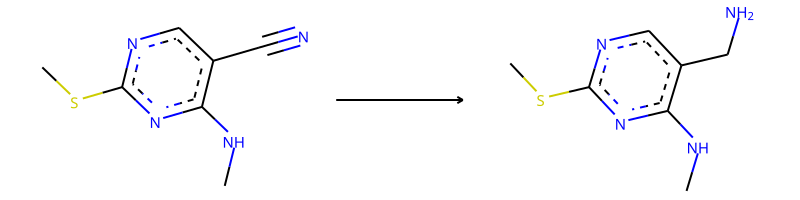

-> template: [#7;a:1]:[c:2]:[c:3](-[C;H0;D2;+0:4]#[N;H0;D1;+0:5]):[c:6]:[#7;a:7]>>[#7;a:1]:[c:2]:[c:3](-[CH2;D2;+0:4]-[NH2;D1;+0:5]):[c:6]:[#7;a:7]


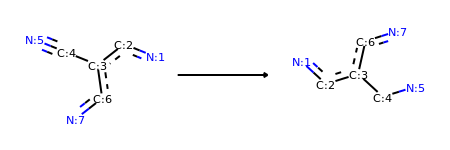

Product similarity 0.6923076923076923, overall 0.4792899408284023, smiles CCSc1ncc(CN)c(N)n1


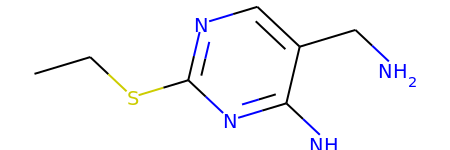

The proposed reaction is:


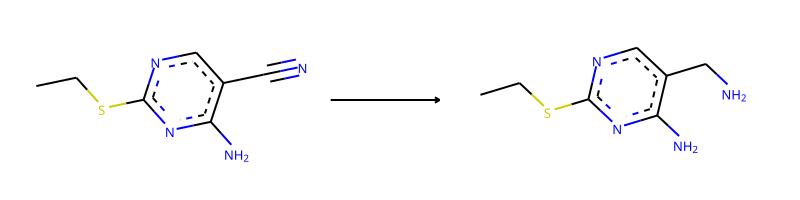

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1>>CCSc1ncc(CN)c(N)n1


--------------------------------------------------

Train index: 73362
RANK 7 PRECEDENT
REACTANT MATCH SCORE: 0.6923076923076923
Reaction SMILES (Precedent): N#[C:1][c:3]1[c:4]([NH:11][CH3:12])[n:5][c:6]([S:9][CH3:10])[n:7][cH:8]1>>O=[CH:1][c:3]1[c:4]([NH:11][CH3:12])[n:5][c:6]([S:9][CH3:10])[n:7][cH:8]1


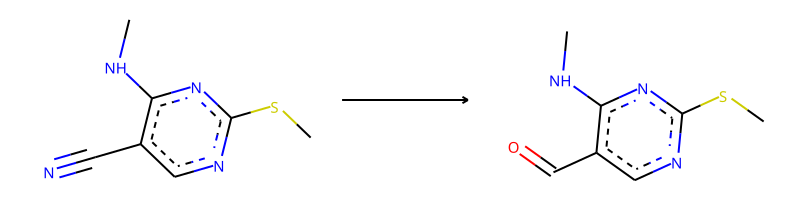

-> template: [#7;a:4]:[c:3]:[c:2](-[C;H0;D2;+0:1]#[N;H0;D1;+0]):[c:5]:[#7;a:6]>>O=[CH;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]


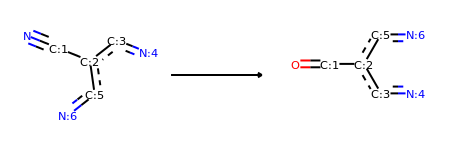

Product similarity 0.6923076923076923, overall 0.4792899408284023, smiles CCSc1ncc(C=O)c(N)n1


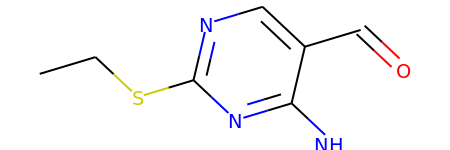

The proposed reaction is:


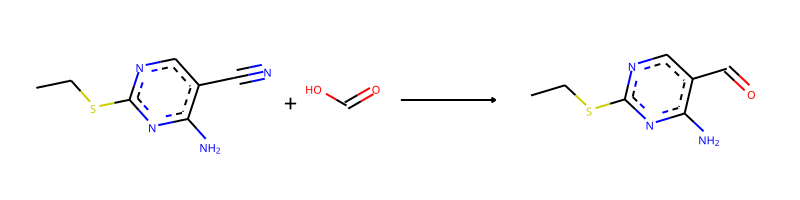

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.O=CO>>CCSc1ncc(C=O)c(N)n1


--------------------------------------------------

Train index: 146365
RANK 8 PRECEDENT
REACTANT MATCH SCORE: 0.6923076923076923
Reaction SMILES (Precedent): CS[c:6]1[n:5][c:4]([NH:11][CH3:12])[c:3]([C:1]#[N:2])[cH:8][n:7]1>>NN[c:6]1[n:5][c:4]([NH:11][CH3:12])[c:3]([C:1]#[N:2])[cH:8][n:7]1


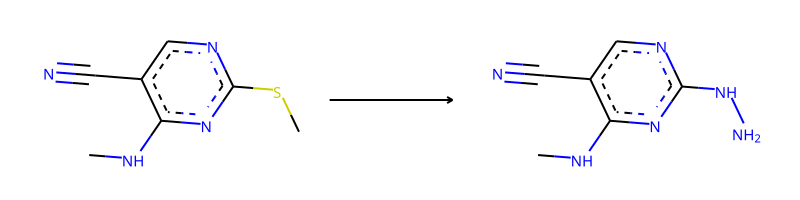

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[S;H0;D2;+0]-[C;H3;D1;+0]>>N-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


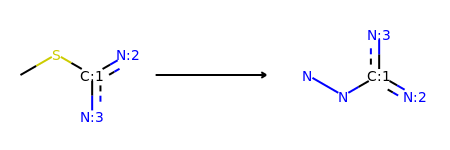

->No precursors could be generated!


(2,
 'CCSc1ncc(C#N)c(N)n1.CC(=O)OC(C)=O>>CCSc1ncc(C#N)c(NC(C)=O)n1',
 0.5454545454545454,
 0.54)

In [47]:
do_one_v4_woFastFilter (208547)

Mol 208547, reactant input:


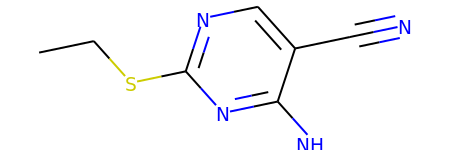

Desired Reaction:


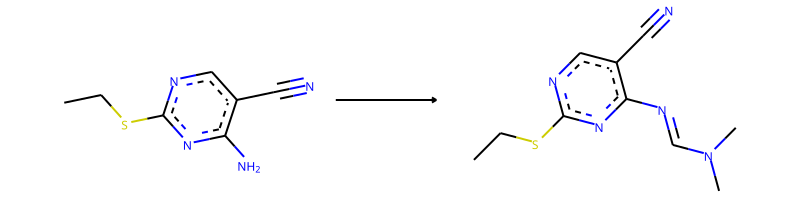

Desired Product:


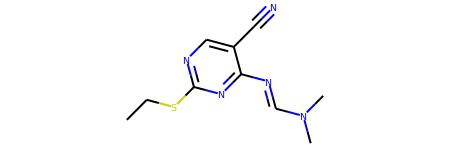



--------------------------------------------------

Train index: 28571
RANK 1 PRECEDENT
REACTANT MATCH SCORE: 0.8


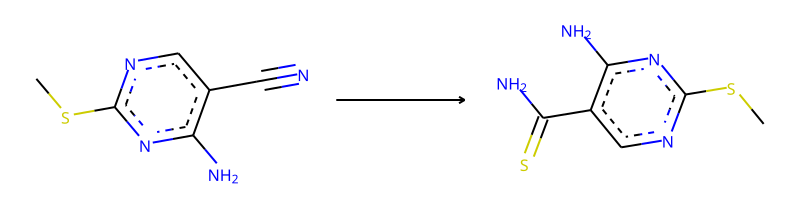

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>S=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


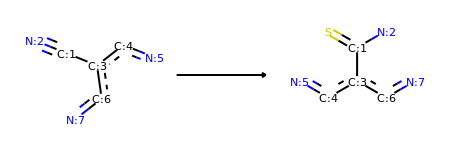

Product similarity 0.8108108108108109, overall 0.6486486486486487, smiles CCSc1ncc(C(N)=S)c(N)n1


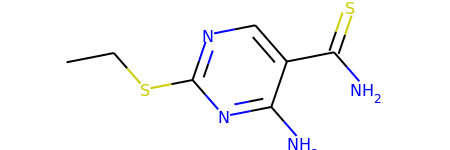

The proposed reaction is:


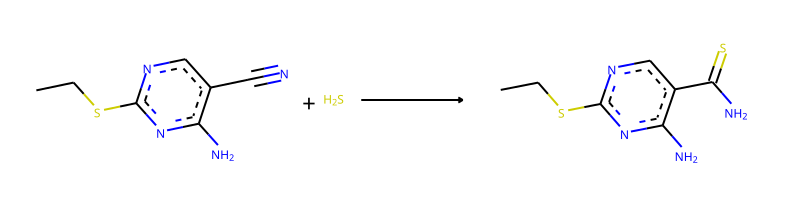

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.S>>CCSc1ncc(C(N)=S)c(N)n1
The fast filter score is 0.845497131


--------------------------------------------------

Train index: 183532
RANK 2 PRECEDENT
REACTANT MATCH SCORE: 0.8


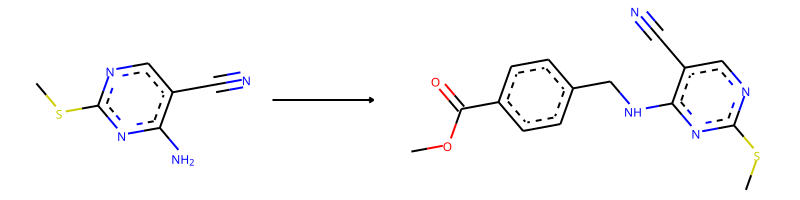

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-O-C(=O)-c1:c:c:c(-C-[NH;D2;+0:1]-[c:2]:[#7;a:3]):c:c:1


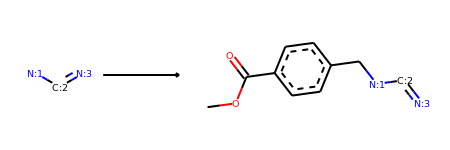

Product similarity 0.8955223880597015, overall 0.7164179104477613, smiles CCSc1ncc(C#N)c(NCc2ccc(C(=O)OC)cc2)n1


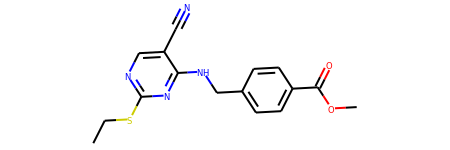

The proposed reaction is:


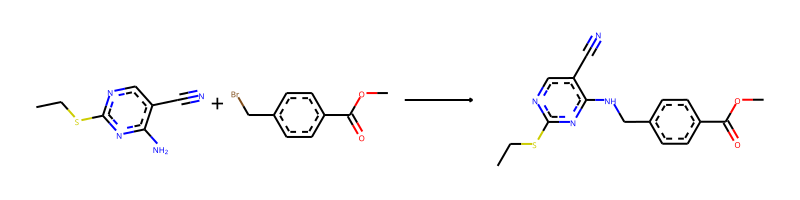

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COC(=O)c1ccc(CBr)cc1>>CCSc1ncc(C#N)c(NCc2ccc(C(=O)OC)cc2)n1
The fast filter score is 0.988327622


--------------------------------------------------

Train index: 25196
RANK 3 PRECEDENT
REACTANT MATCH SCORE: 0.8


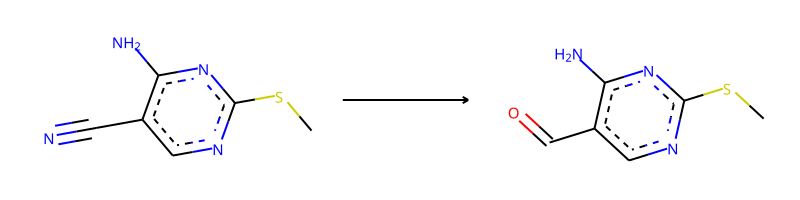

-> template: [#7;a:4]:[c:3]:[c:2](-[C;H0;D2;+0:1]#[N;H0;D1;+0]):[c:5]:[#7;a:6]>>O=[CH;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]


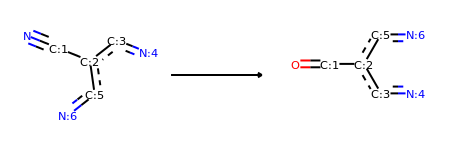

Product similarity 0.8, overall 0.6400000000000001, smiles CCSc1ncc(C=O)c(N)n1


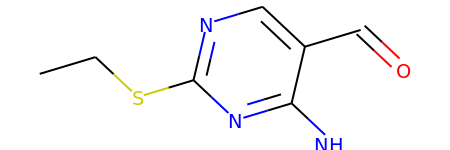

The proposed reaction is:


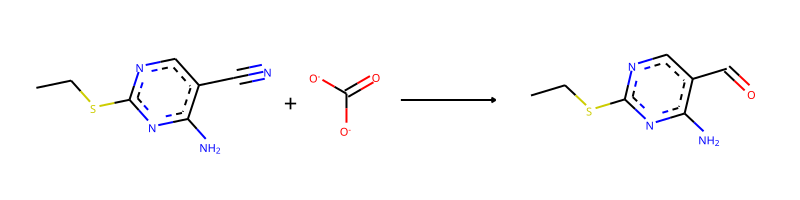

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.O=C([O-])[O-]>>CCSc1ncc(C=O)c(N)n1
The fast filter score is 0.722536683


--------------------------------------------------

Train index: 226914
RANK 4 PRECEDENT
REACTANT MATCH SCORE: 0.8


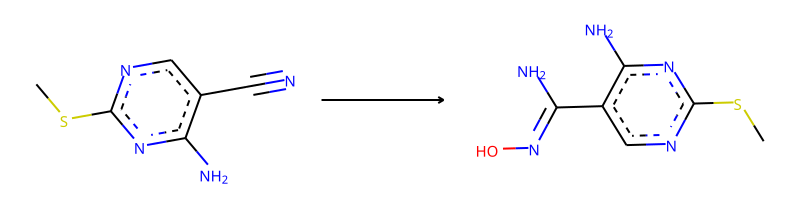

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>O-N=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


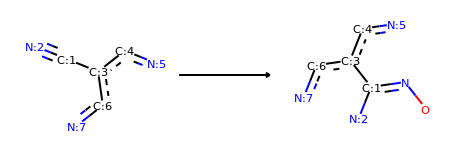

Product similarity 0.825, overall 0.66, smiles CCSc1ncc(C(N)=NO)c(N)n1


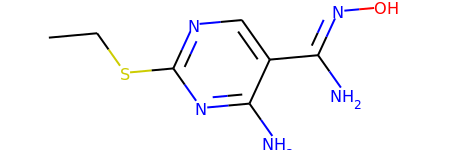

The proposed reaction is:


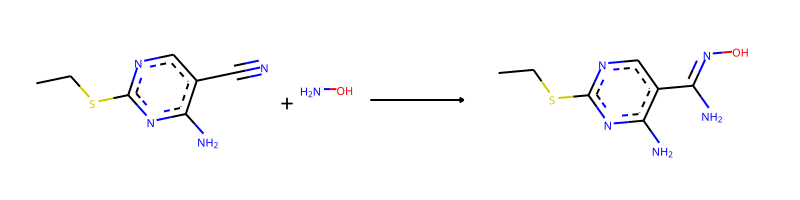

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.NO>>CCSc1ncc(C(N)=NO)c(N)n1
The fast filter score is 0.917299449


--------------------------------------------------

Train index: 234078
RANK 5 PRECEDENT
REACTANT MATCH SCORE: 0.8


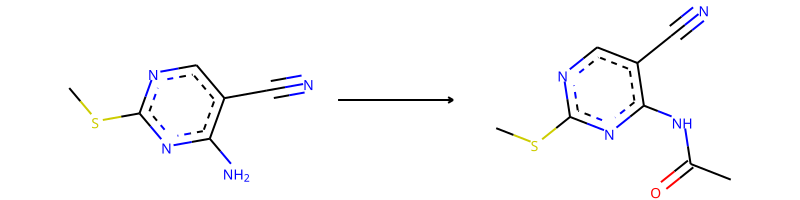

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-C(=O)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


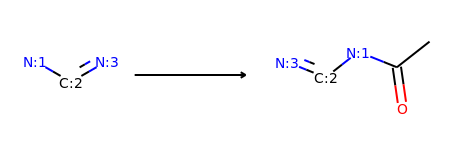

Product similarity 0.8372093023255814, overall 0.6697674418604652, smiles CCSc1ncc(C#N)c(NC(C)=O)n1


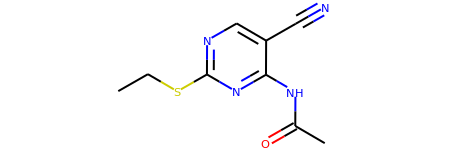

The proposed reaction is:


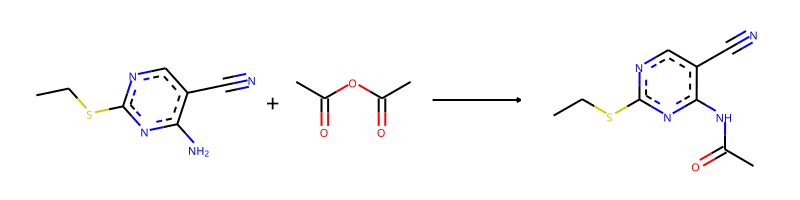

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.CC(=O)OC(C)=O>>CCSc1ncc(C#N)c(NC(C)=O)n1
The fast filter score is 0.999187708


--------------------------------------------------

Train index: 144627
RANK 6 PRECEDENT
REACTANT MATCH SCORE: 0.6923076923076923


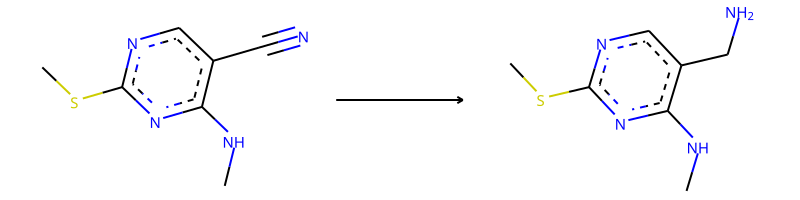

-> template: [#7;a:1]:[c:2]:[c:3](-[C;H0;D2;+0:4]#[N;H0;D1;+0:5]):[c:6]:[#7;a:7]>>[#7;a:1]:[c:2]:[c:3](-[CH2;D2;+0:4]-[NH2;D1;+0:5]):[c:6]:[#7;a:7]


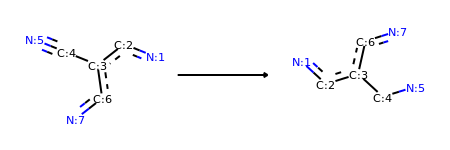

Product similarity 0.6923076923076923, overall 0.4792899408284023, smiles CCSc1ncc(CN)c(N)n1


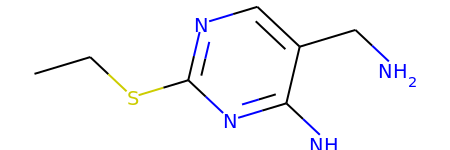

The proposed reaction is:


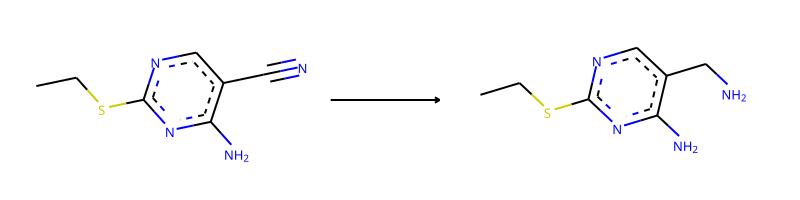

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1>>CCSc1ncc(CN)c(N)n1
The fast filter score is 0.818362713


--------------------------------------------------

Train index: 73362
RANK 7 PRECEDENT
REACTANT MATCH SCORE: 0.6923076923076923


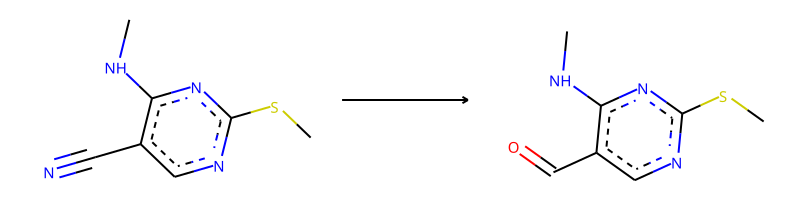

-> template: [#7;a:4]:[c:3]:[c:2](-[C;H0;D2;+0:1]#[N;H0;D1;+0]):[c:5]:[#7;a:6]>>O=[CH;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]


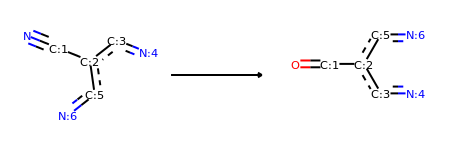

Product similarity 0.6923076923076923, overall 0.4792899408284023, smiles CCSc1ncc(C=O)c(N)n1


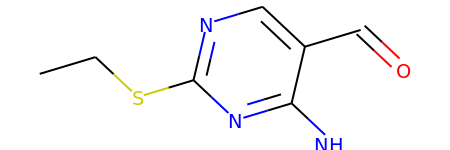

The proposed reaction is:


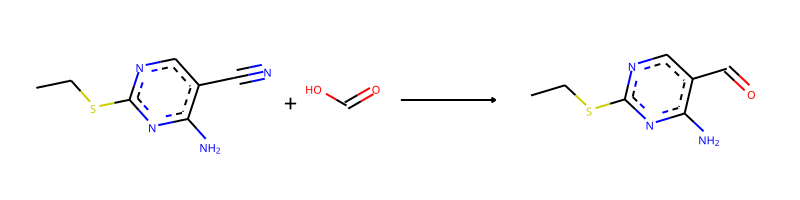

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.O=CO>>CCSc1ncc(C=O)c(N)n1
The fast filter score is 0.423607826


--------------------------------------------------

Train index: 146365
RANK 8 PRECEDENT
REACTANT MATCH SCORE: 0.6923076923076923


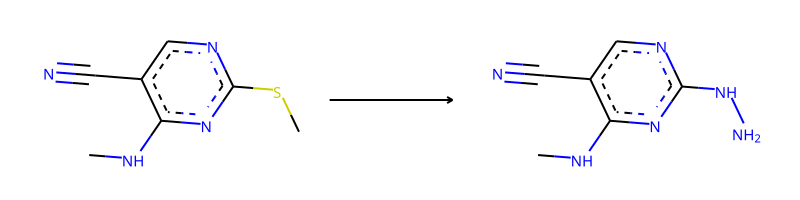

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[S;H0;D2;+0]-[C;H3;D1;+0]>>N-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


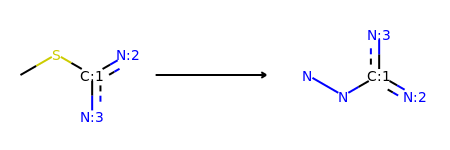

->No precursors could be generated!


--------------------------------------------------

Train index: 416669
RANK 9 PRECEDENT
REACTANT MATCH SCORE: 0.6923076923076923


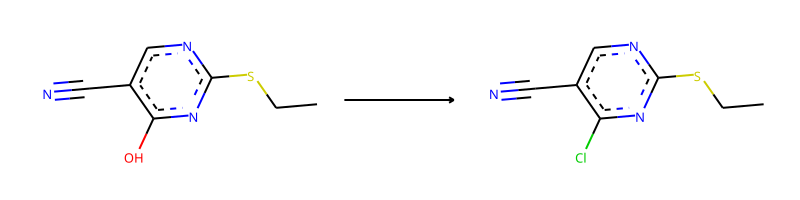

-> template: [O;H1;D1;+0]-[c;H0;D3;+0:1]1:[#7;a:2]:[c:3]:[#7;a:4]:[c:5]:[c:6]:1>>Cl-[c;H0;D3;+0:1]1:[#7;a:2]:[c:3]:[#7;a:4]:[c:5]:[c:6]:1


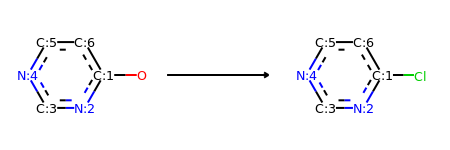

->No precursors could be generated!


--------------------------------------------------

Train index: 19166
RANK 10 PRECEDENT
REACTANT MATCH SCORE: 0.6904761904761905


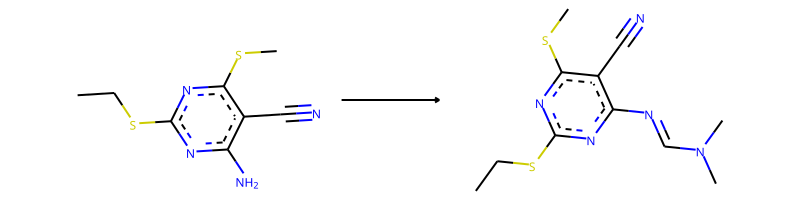

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-N(-C)-C=[N;H0;D2;+0:1]-[c:2]:[#7;a:3]


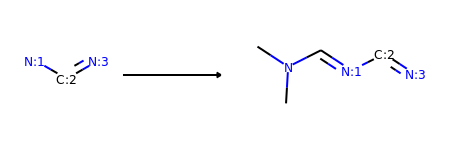

Product similarity 0.7547169811320755, overall 0.5211141060197664, smiles CCSc1ncc(C#N)c(N=CN(C)C)n1


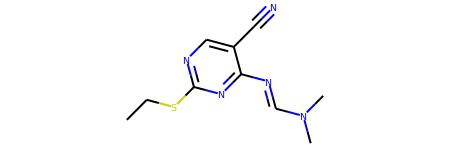

The proposed reaction is:


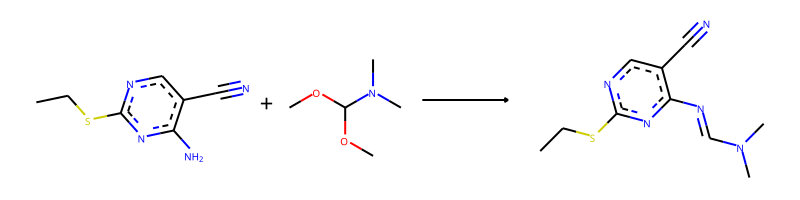

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COC(OC)N(C)C>>CCSc1ncc(C#N)c(N=CN(C)C)n1
The fast filter score is 0.999465585


--------------------------------------------------

Train index: 158909
RANK 11 PRECEDENT
REACTANT MATCH SCORE: 0.6511627906976745


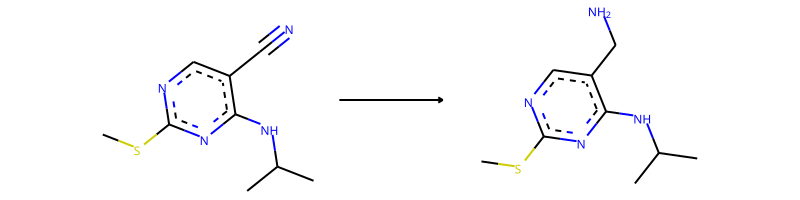

-> template: [#7;a:1]:[c:2]:[c:3](-[C;H0;D2;+0:4]#[N;H0;D1;+0:5]):[c:6]:[#7;a:7]>>[#7;a:1]:[c:2]:[c:3](-[CH2;D2;+0:4]-[NH2;D1;+0:5]):[c:6]:[#7;a:7]


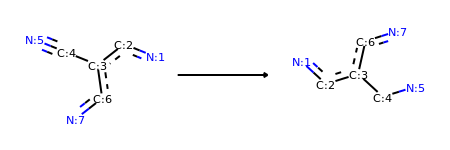

Product similarity 0.6511627906976745, overall 0.4240129799891834, smiles CCSc1ncc(CN)c(N)n1


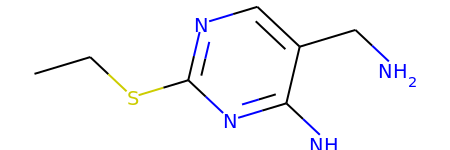

The proposed reaction is:


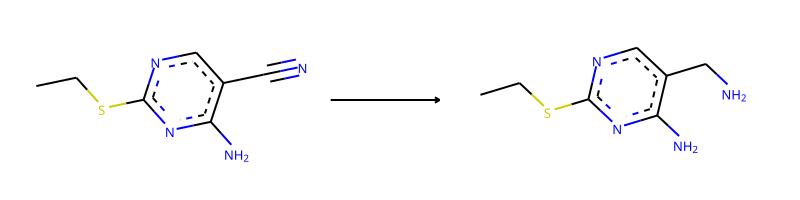

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1>>CCSc1ncc(CN)c(N)n1
The fast filter score is 0.818362713


--------------------------------------------------

Train index: 286355
RANK 12 PRECEDENT
REACTANT MATCH SCORE: 0.6363636363636364


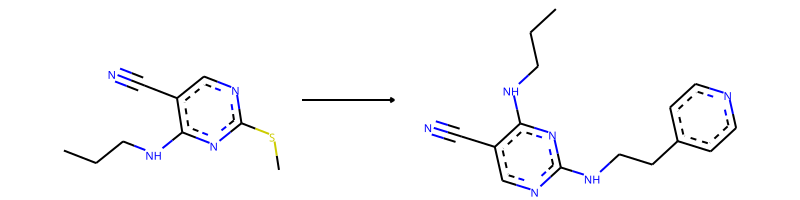

-> template: [#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-[S;H0;D2;+0]-[C;H3;D1;+0]>>[#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-N-C-C-c1:c:c:n:c:c:1


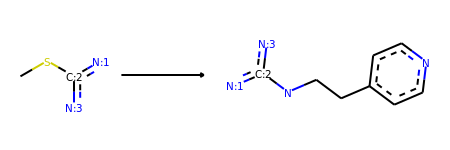

->No precursors could be generated!


--------------------------------------------------

Train index: 406865
RANK 13 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


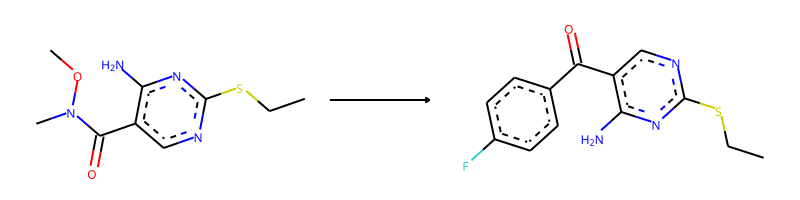

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>F-c1:c:c:c(-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c:c:1


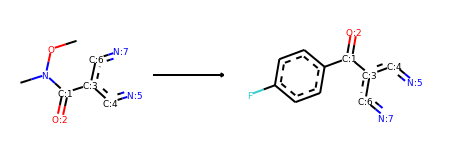

->No precursors could be generated!


--------------------------------------------------

Train index: 562
RANK 14 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


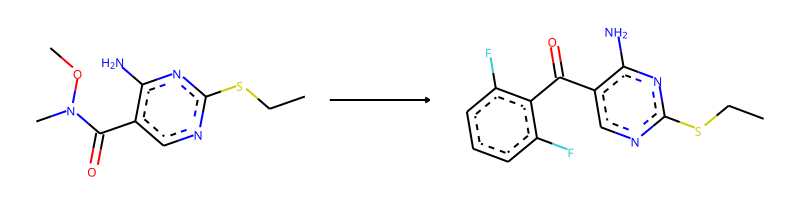

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>F-c1:c:c:c:c(-F):c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


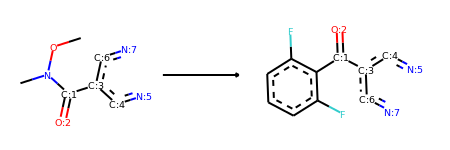

->No precursors could be generated!


--------------------------------------------------

Train index: 439810
RANK 15 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


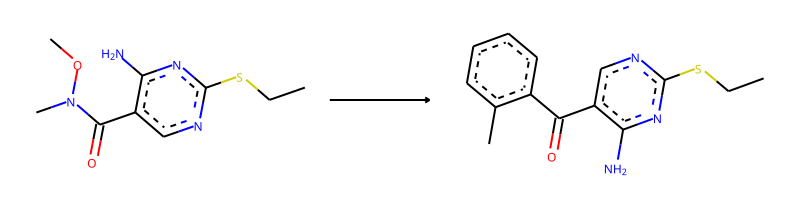

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-c1:c:c:c:c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


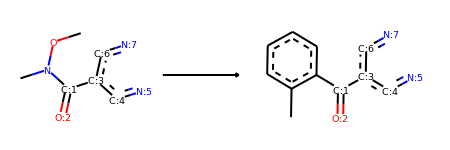

->No precursors could be generated!


--------------------------------------------------

Train index: 94347
RANK 16 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


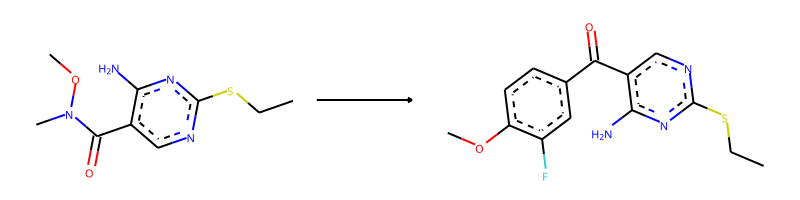

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c:c(-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c:c:1-F


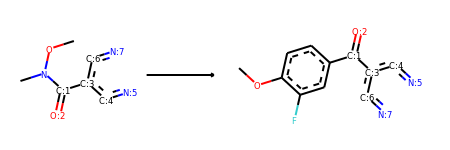

->No precursors could be generated!


--------------------------------------------------

Train index: 240762
RANK 17 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


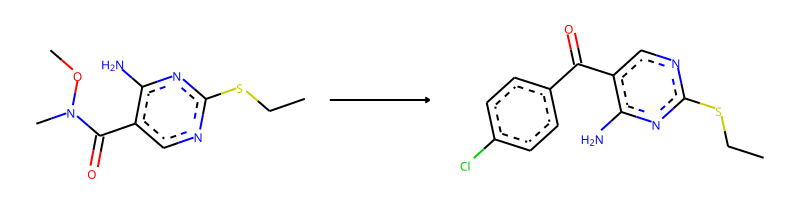

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>Cl-c1:c:c:c(-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c:c:1


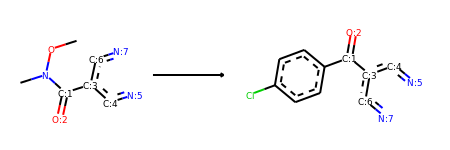

->No precursors could be generated!


--------------------------------------------------

Train index: 105169
RANK 18 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


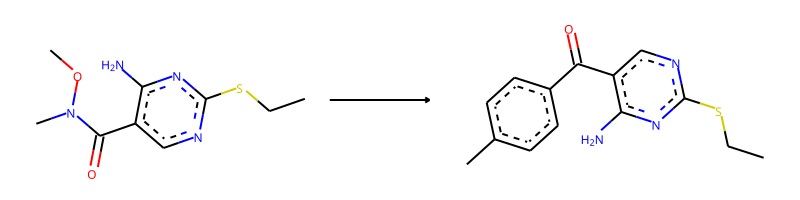

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-c1:c:c:c(-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c:c:1


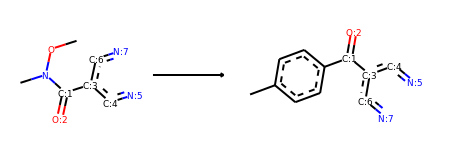

->No precursors could be generated!


--------------------------------------------------

Train index: 443484
RANK 19 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


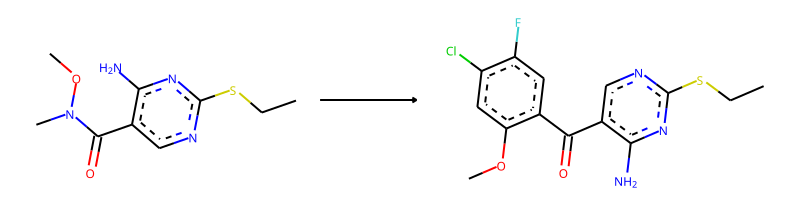

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c(-Cl):c(-F):c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


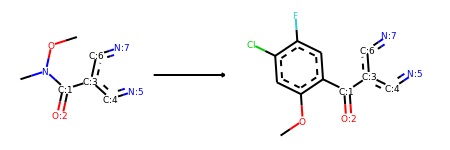

->No precursors could be generated!


--------------------------------------------------

Train index: 248086
RANK 20 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


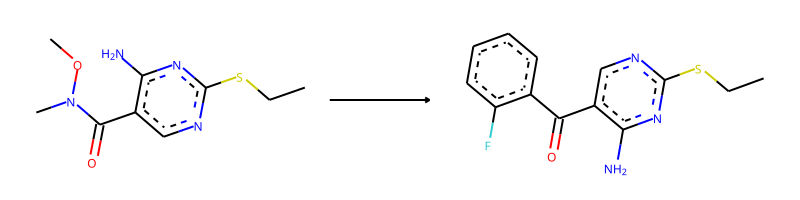

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>F-c1:c:c:c:c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


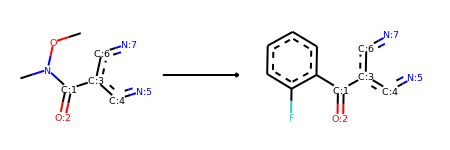

->No precursors could be generated!


--------------------------------------------------

Train index: 175819
RANK 21 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


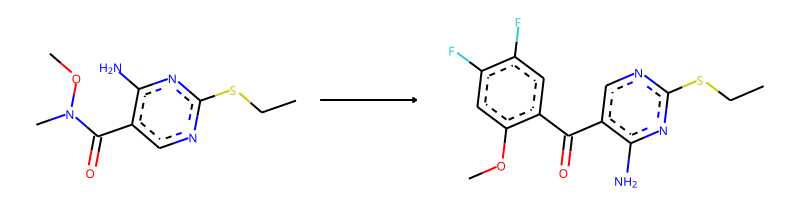

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c(-F):c(-F):c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


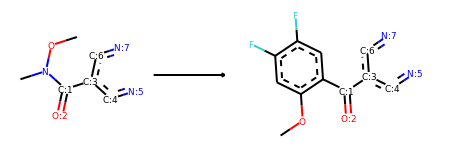

->No precursors could be generated!


--------------------------------------------------

Train index: 239858
RANK 22 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


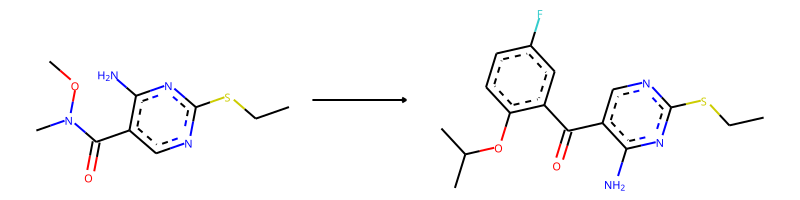

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-C(-C)-O-c1:c:c:c(-F):c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


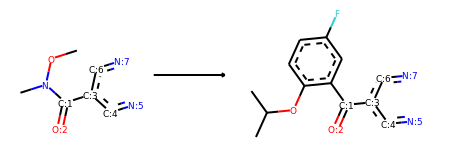

->No precursors could be generated!


--------------------------------------------------

Train index: 240024
RANK 23 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


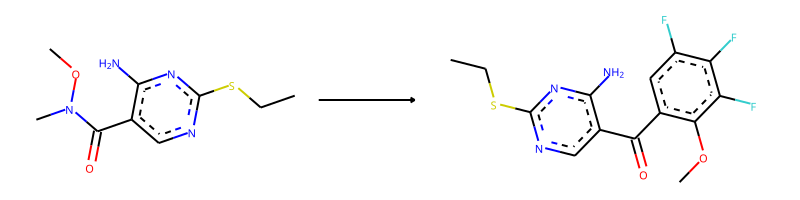

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c(-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c:c(-F):c(-F):c:1-F


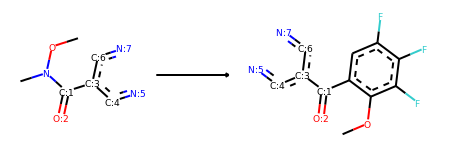

->No precursors could be generated!


--------------------------------------------------

Train index: 62445
RANK 24 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


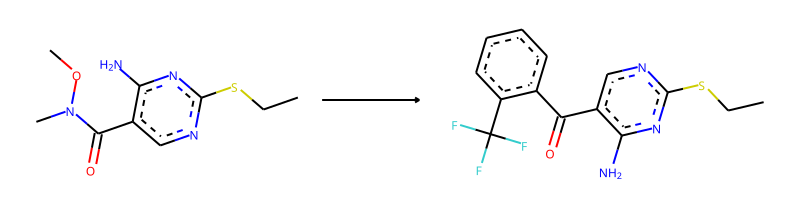

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>F-C(-F)(-F)-c1:c:c:c:c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


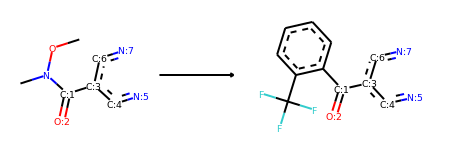

->No precursors could be generated!


--------------------------------------------------

Train index: 293963
RANK 25 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


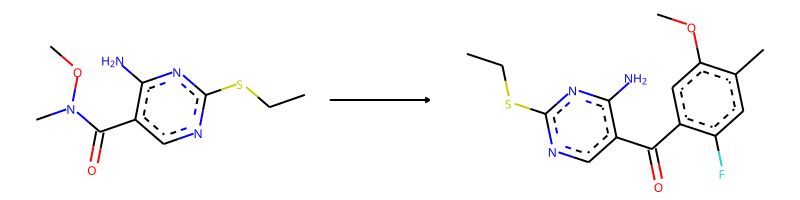

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c(-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c(-F):c:c:1-C


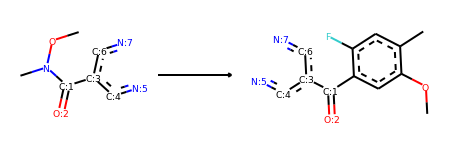

->No precursors could be generated!


--------------------------------------------------

Train index: 117389
RANK 26 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


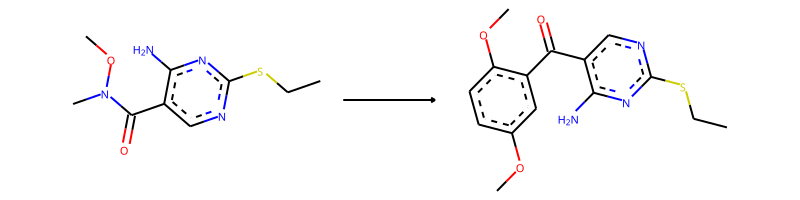

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c:c(-O-C):c(-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c:1


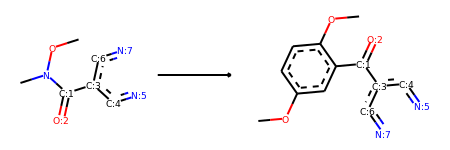

->No precursors could be generated!


--------------------------------------------------

Train index: 21721
RANK 27 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


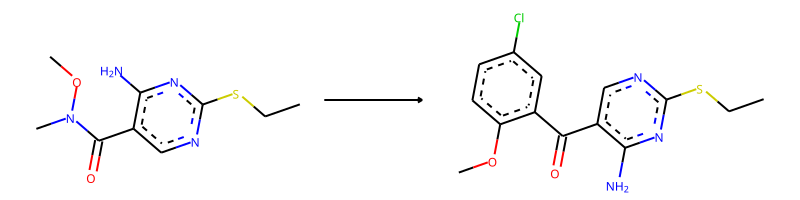

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c:c(-Cl):c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


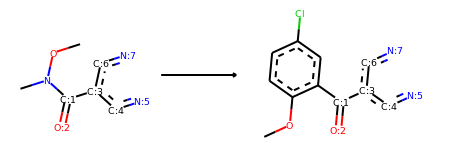

->No precursors could be generated!


--------------------------------------------------

Train index: 26399
RANK 28 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


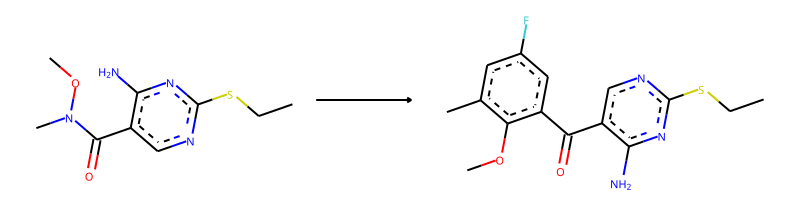

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c(-C):c:c(-F):c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


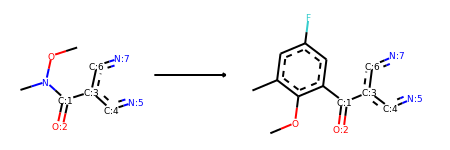

->No precursors could be generated!


--------------------------------------------------

Train index: 327705
RANK 29 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


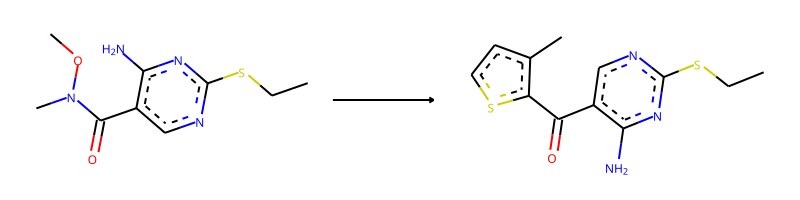

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-c1:c:c:s:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


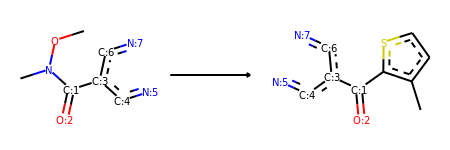

->No precursors could be generated!


--------------------------------------------------

Train index: 202255
RANK 30 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


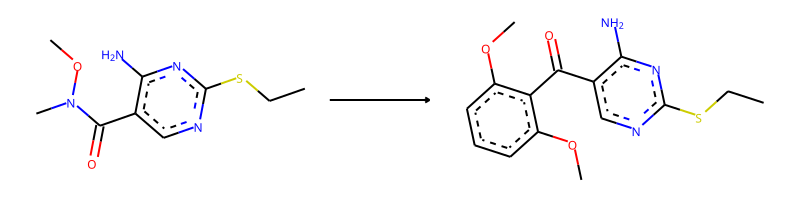

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c:c:c(-O-C):c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


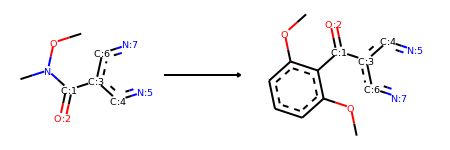

->No precursors could be generated!


--------------------------------------------------

Train index: 304544
RANK 31 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


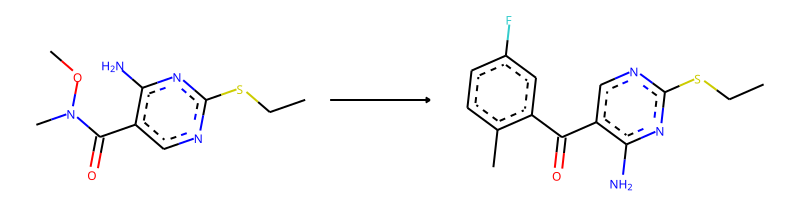

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-c1:c:c:c(-F):c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


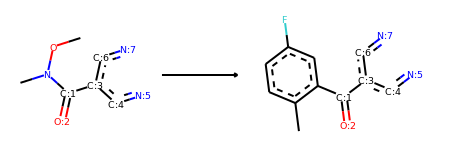

->No precursors could be generated!


--------------------------------------------------

Train index: 316166
RANK 32 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


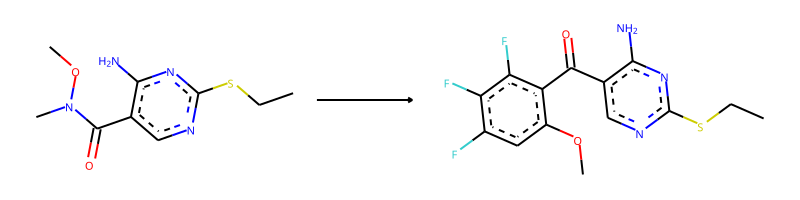

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c(-F):c(-F):c(-F):c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


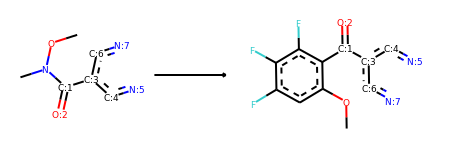

->No precursors could be generated!


--------------------------------------------------

Train index: 403888
RANK 33 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


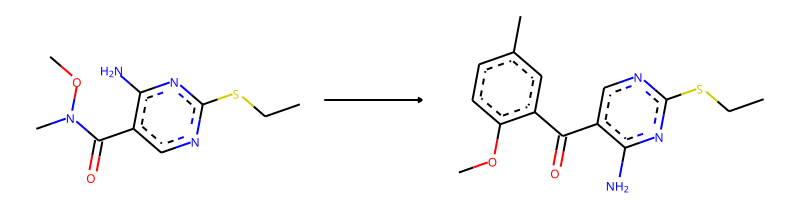

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c:c(-C):c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


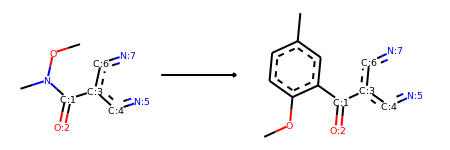

->No precursors could be generated!


--------------------------------------------------

Train index: 425211
RANK 34 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


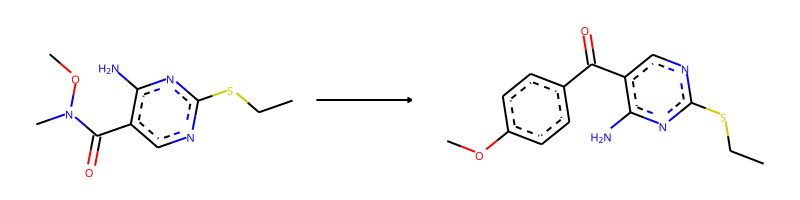

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c:c(-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c:c:1


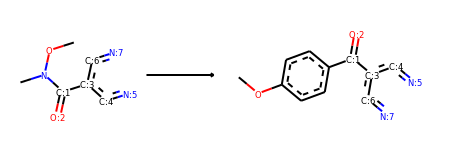

->No precursors could be generated!


--------------------------------------------------

Train index: 346681
RANK 35 PRECEDENT
REACTANT MATCH SCORE: 0.6170212765957447


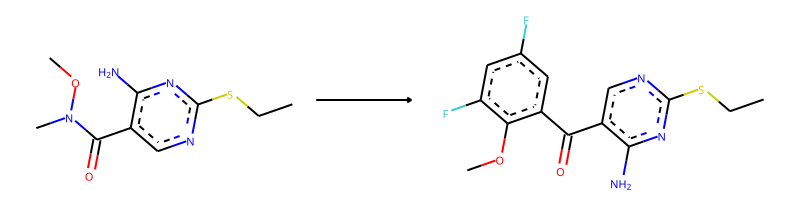

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;D1;H0:2])-[N;H0;D3;+0](-[C;H3;D1;+0])-[O;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c(-F):c:c(-F):c:c:1-[C;H0;D3;+0:1](=[O;D1;H0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


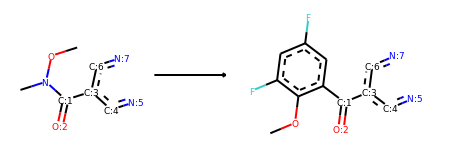

->No precursors could be generated!


--------------------------------------------------

Train index: 350129
RANK 36 PRECEDENT
REACTANT MATCH SCORE: 0.6153846153846154


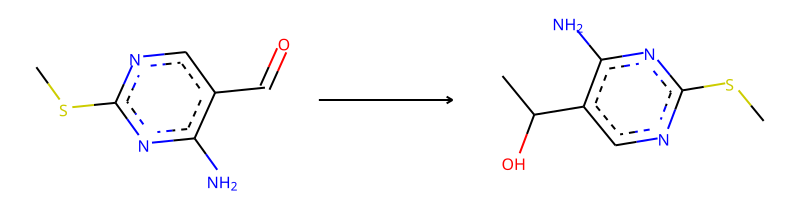

-> template: [#7;a:5]:[c:4]:[c:3](-[CH;D2;+0:1]=[O;H0;D1;+0:2]):[c:6]:[#7;a:7]>>C-[CH;D3;+0:1](-[OH;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


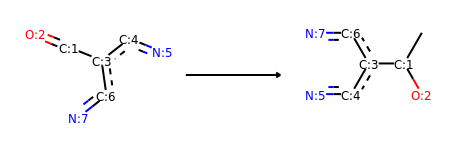

->No precursors could be generated!


--------------------------------------------------

Train index: 440166
RANK 37 PRECEDENT
REACTANT MATCH SCORE: 0.6153846153846154


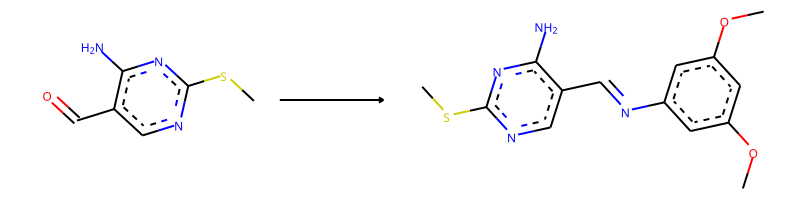

-> template: [#7;a:4]:[c:3]:[c:2](-[CH;D2;+0:1]=[O;H0;D1;+0]):[c:5]:[#7;a:6]>>C-O-c1:c:c(-N=[CH;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]):c:c(-O-C):c:1


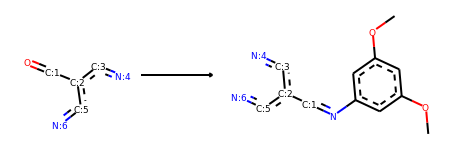

->No precursors could be generated!


--------------------------------------------------

Train index: 218481
RANK 38 PRECEDENT
REACTANT MATCH SCORE: 0.6136363636363636


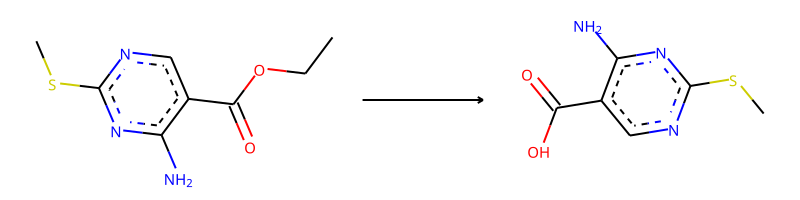

-> template: [#7;a:1]:[c:2]:[c:3](:[c:4]:[#7;a:5])-[C;H0;D3;+0:6](=[O;H0;D1;+0:8])-[O;H0;D2;+0:7]-[C;H2;D2;+0]-[C;H3;D1;+0]>>[#7;a:1]:[c:2]:[c:3](:[c:4]:[#7;a:5])-[C;H0;D3;+0:6](=[O;H0;D1;+0:7])-[OH;D1;+0:8]


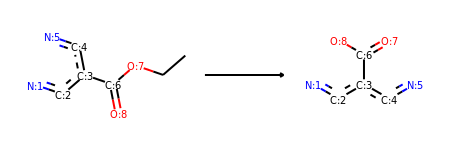

->No precursors could be generated!


--------------------------------------------------

Train index: 409423
RANK 39 PRECEDENT
REACTANT MATCH SCORE: 0.5853658536585366


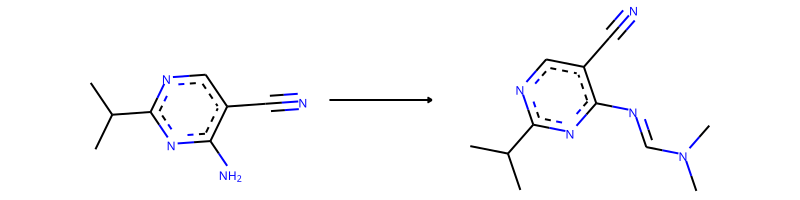

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-N(-C)-C=[N;H0;D2;+0:1]-[c:2]:[#7;a:3]


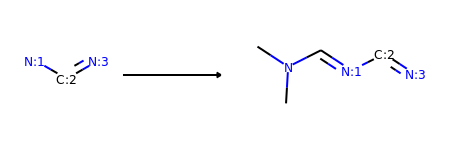

Product similarity 0.6730769230769231, overall 0.39399624765478425, smiles CCSc1ncc(C#N)c(N=CN(C)C)n1


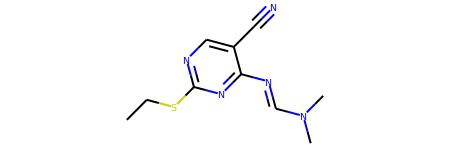

The proposed reaction is:


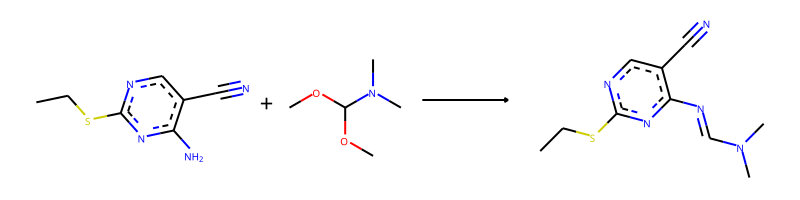

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COC(OC)N(C)C>>CCSc1ncc(C#N)c(N=CN(C)C)n1
The fast filter score is 0.999465585


--------------------------------------------------

Train index: 257669
RANK 40 PRECEDENT
REACTANT MATCH SCORE: 0.5813953488372093


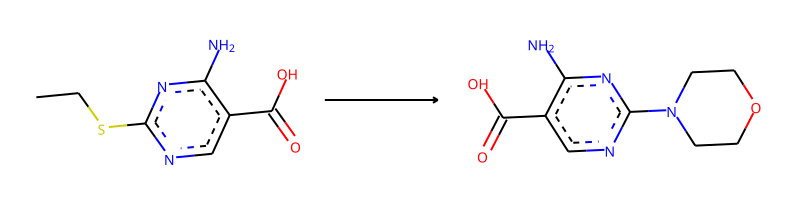

-> template: [#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-[S;H0;D2;+0]-[C;H2;D2;+0]-[C;H3;D1;+0]>>[#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-N1-C-C-O-C-C-1


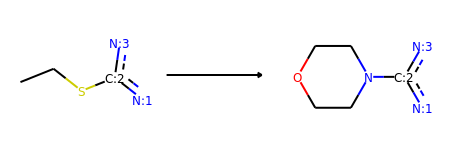

Product similarity 0.660377358490566, overall 0.38394032470381745, smiles N#Cc1cnc(N2CCOCC2)nc1N


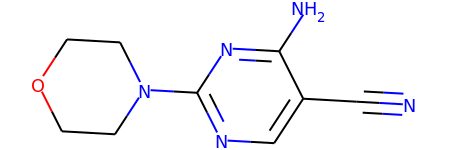

The proposed reaction is:


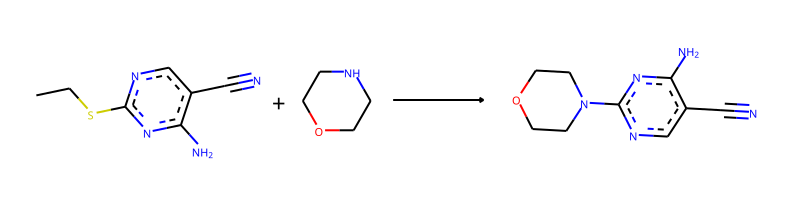

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.C1COCCN1>>N#Cc1cnc(N2CCOCC2)nc1N
The fast filter score is 0.999314904


--------------------------------------------------

Train index: 310998
RANK 41 PRECEDENT
REACTANT MATCH SCORE: 0.5789473684210527


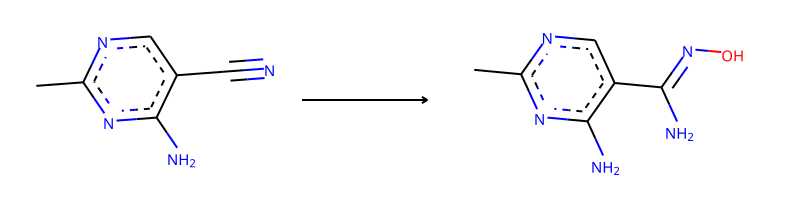

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>O-N=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


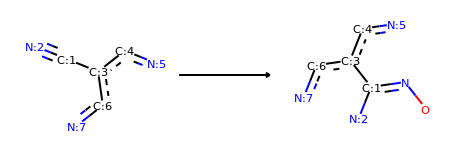

Product similarity 0.627906976744186, overall 0.3635250917992656, smiles CCSc1ncc(C(N)=NO)c(N)n1


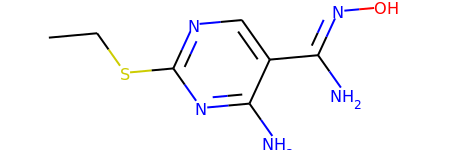

The proposed reaction is:


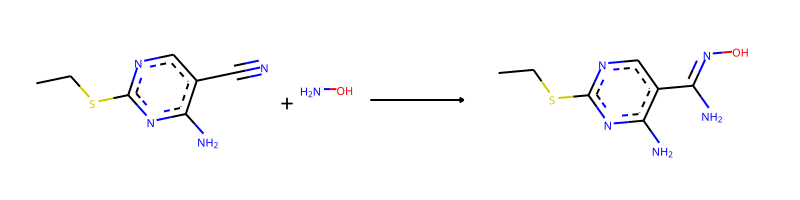

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.NO>>CCSc1ncc(C(N)=NO)c(N)n1
The fast filter score is 0.917299449


--------------------------------------------------

Train index: 391022
RANK 42 PRECEDENT
REACTANT MATCH SCORE: 0.5789473684210527


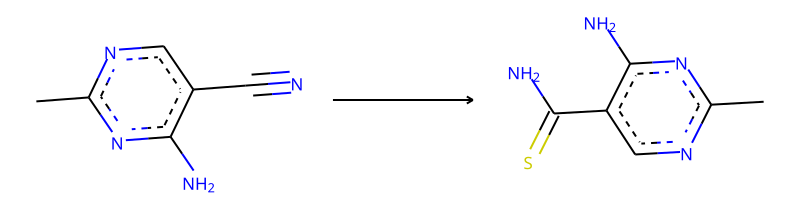

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>S=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


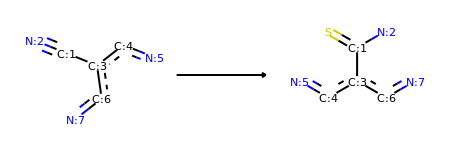

Product similarity 0.6, overall 0.3473684210526316, smiles CCSc1ncc(C(N)=S)c(N)n1


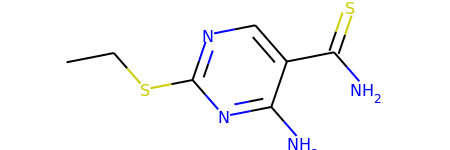

The proposed reaction is:


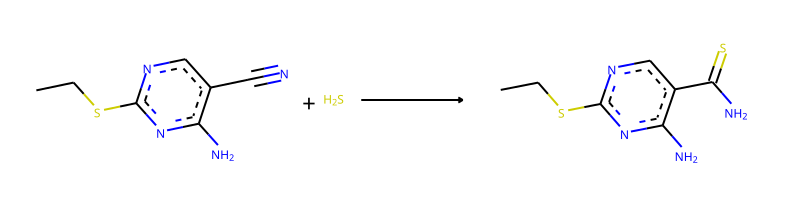

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.S>>CCSc1ncc(C(N)=S)c(N)n1
The fast filter score is 0.845497131


--------------------------------------------------

Train index: 18443
RANK 43 PRECEDENT
REACTANT MATCH SCORE: 0.5789473684210527


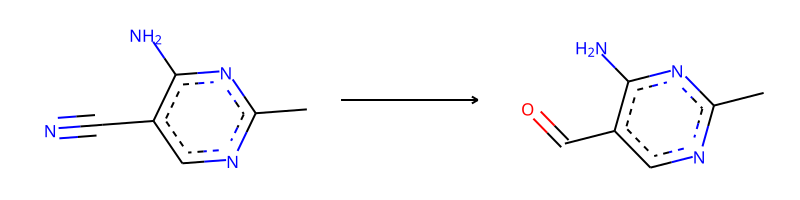

-> template: [#7;a:4]:[c:3]:[c:2](-[C;H0;D2;+0:1]#[N;H0;D1;+0]):[c:5]:[#7;a:6]>>O=[CH;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]


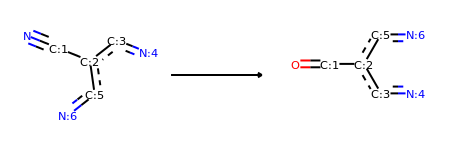

Product similarity 0.5789473684210527, overall 0.33518005540166207, smiles CCSc1ncc(C=O)c(N)n1


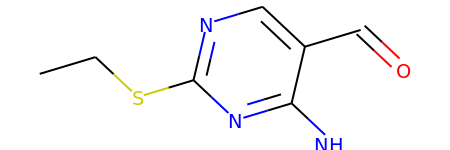

The proposed reaction is:


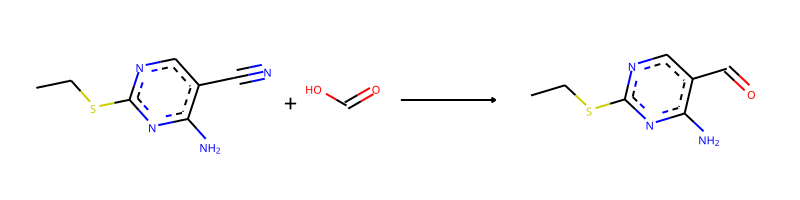

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.O=CO>>CCSc1ncc(C=O)c(N)n1
The fast filter score is 0.423607826


--------------------------------------------------

Train index: 339784
RANK 44 PRECEDENT
REACTANT MATCH SCORE: 0.575


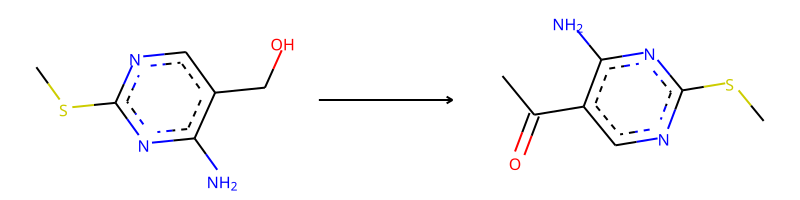

-> template: [#7;a:5]:[c:4]:[c:3](-[CH2;D2;+0:1]-[OH;D1;+0:2]):[c:6]:[#7;a:7]>>C-[C;H0;D3;+0:1](=[O;H0;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


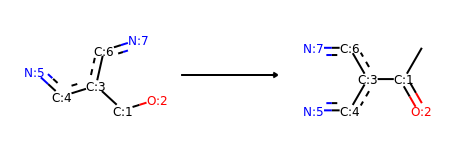

->No precursors could be generated!


--------------------------------------------------

Train index: 132641
RANK 45 PRECEDENT
REACTANT MATCH SCORE: 0.575


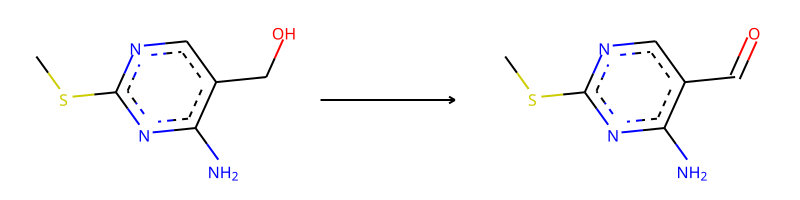

-> template: [#7;a:1]:[c:2]:[c:3](-[CH2;D2;+0:4]-[OH;D1;+0:5]):[c:6]:[#7;a:7]>>[#7;a:1]:[c:2]:[c:3](-[CH;D2;+0:4]=[O;H0;D1;+0:5]):[c:6]:[#7;a:7]


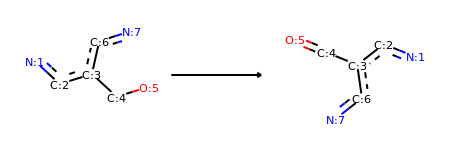

->No precursors could be generated!


--------------------------------------------------

Train index: 382006
RANK 46 PRECEDENT
REACTANT MATCH SCORE: 0.5675675675675675


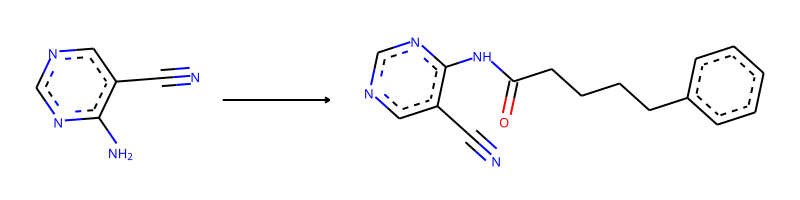

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>O=C(-C-C-C-C-c1:c:c:c:c:c:1)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


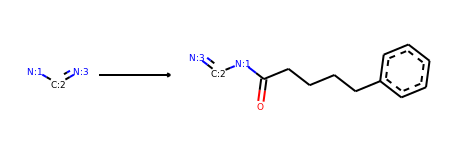

Product similarity 0.7808219178082192, overall 0.4431691965938541, smiles CCSc1ncc(C#N)c(NC(=O)CCCCc2ccccc2)n1


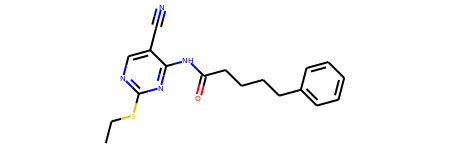

The proposed reaction is:


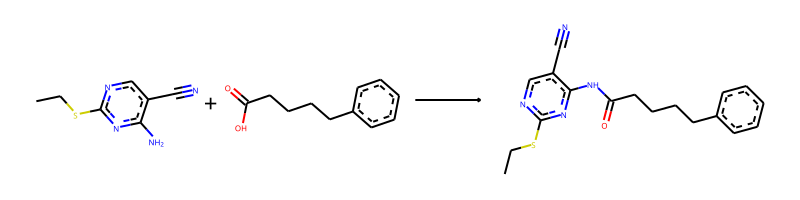

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.O=C(O)CCCCc1ccccc1>>CCSc1ncc(C#N)c(NC(=O)CCCCc2ccccc2)n1
The fast filter score is 0.998889923


--------------------------------------------------

Train index: 162639
RANK 47 PRECEDENT
REACTANT MATCH SCORE: 0.5675675675675675


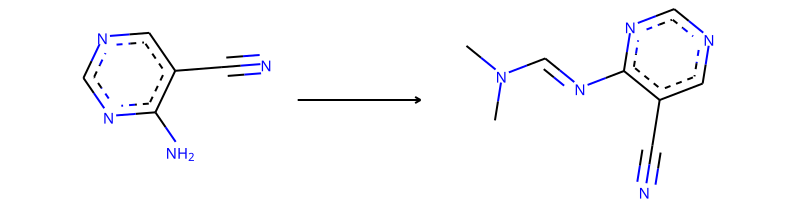

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-N(-C)-C=[N;H0;D2;+0:1]-[c:2]:[#7;a:3]


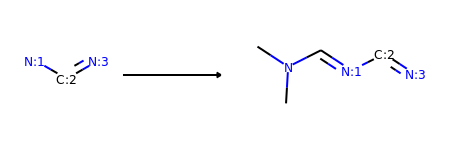

Product similarity 0.6666666666666666, overall 0.37837837837837834, smiles CCSc1ncc(C#N)c(N=CN(C)C)n1


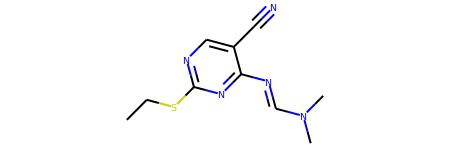

The proposed reaction is:


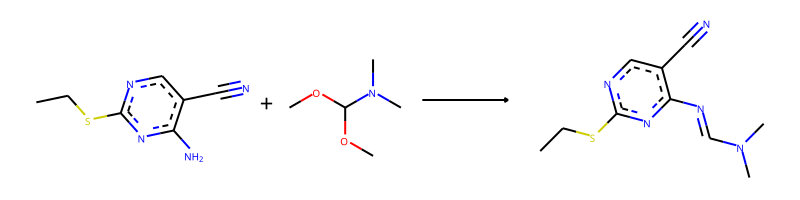

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COC(OC)N(C)C>>CCSc1ncc(C#N)c(N=CN(C)C)n1
The fast filter score is 0.999465585


--------------------------------------------------

Train index: 405831
RANK 48 PRECEDENT
REACTANT MATCH SCORE: 0.5675675675675675


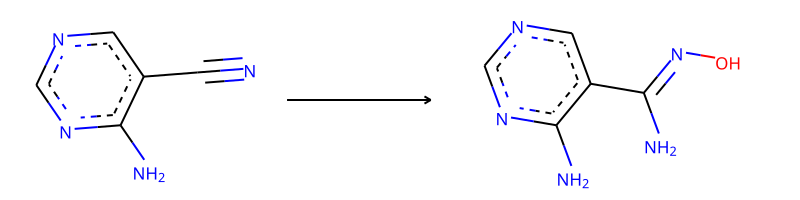

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>O-N=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


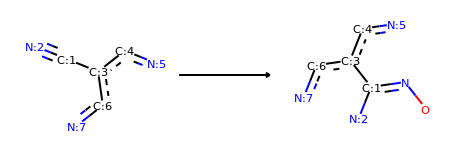

Product similarity 0.6190476190476191, overall 0.35135135135135137, smiles CCSc1ncc(C(N)=NO)c(N)n1


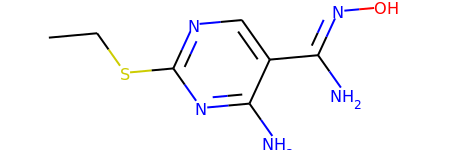

The proposed reaction is:


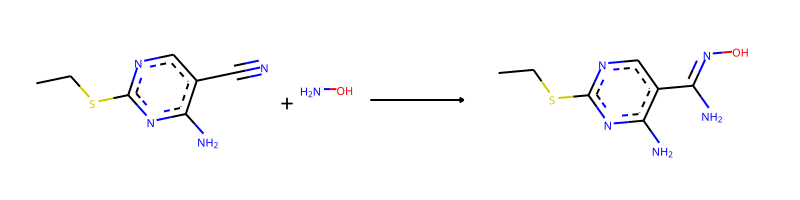

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.NO>>CCSc1ncc(C(N)=NO)c(N)n1
The fast filter score is 0.917299449


--------------------------------------------------

Train index: 362168
RANK 49 PRECEDENT
REACTANT MATCH SCORE: 0.5555555555555556


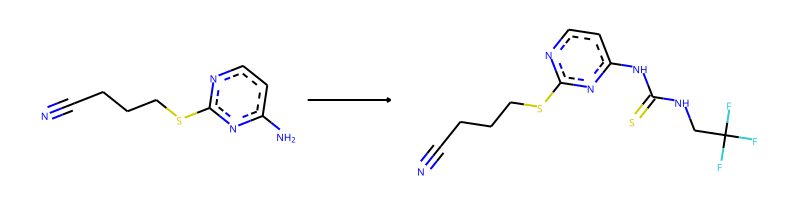

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>F-C(-F)(-F)-C-N-C(=S)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


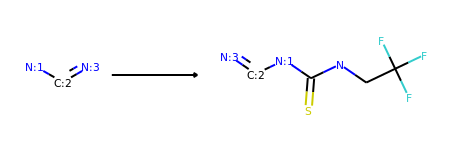

Product similarity 0.696969696969697, overall 0.3872053872053873, smiles CCSc1ncc(C#N)c(NC(=S)NCC(F)(F)F)n1


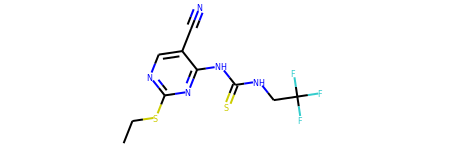

The proposed reaction is:


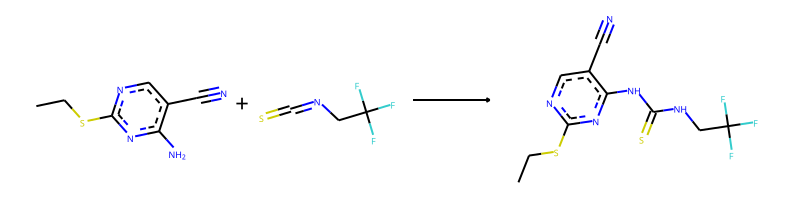

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.FC(F)(F)CN=C=S>>CCSc1ncc(C#N)c(NC(=S)NCC(F)(F)F)n1
The fast filter score is 0.999964833


--------------------------------------------------

Train index: 397553
RANK 50 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


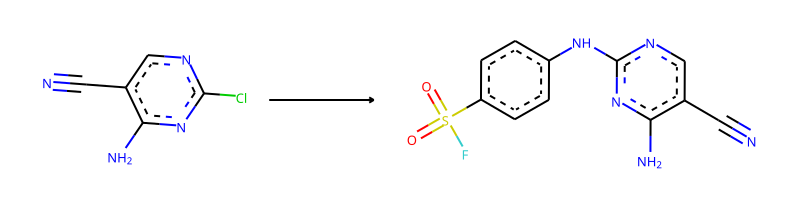

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>F-S(=O)(=O)-c1:c:c:c(-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]):c:c:1


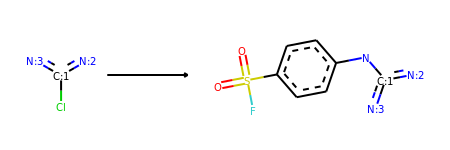

->No precursors could be generated!


--------------------------------------------------

Train index: 231414
RANK 51 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


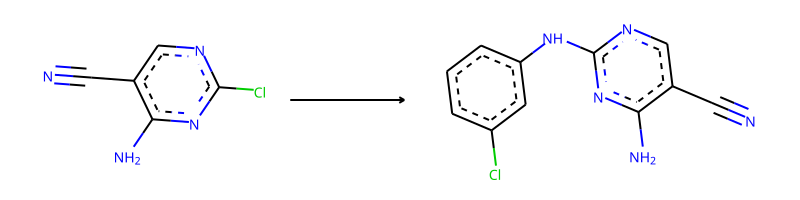

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>Cl-c1:c:c:c:c(-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]):c:1


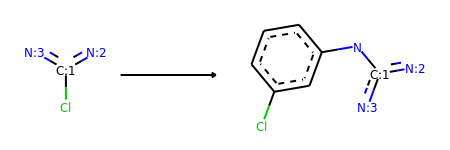

->No precursors could be generated!


--------------------------------------------------

Train index: 117968
RANK 52 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


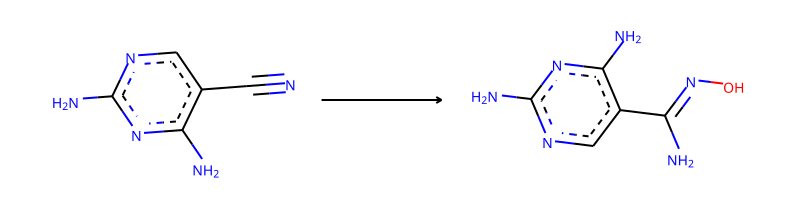

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>O-N=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


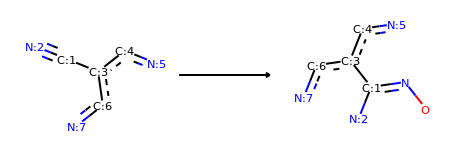

Product similarity 0.5909090909090909, overall 0.3181818181818182, smiles CCSc1ncc(C(N)=NO)c(N)n1


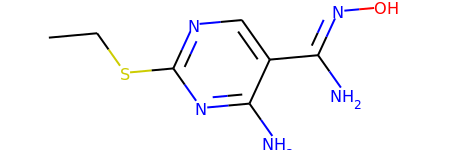

The proposed reaction is:


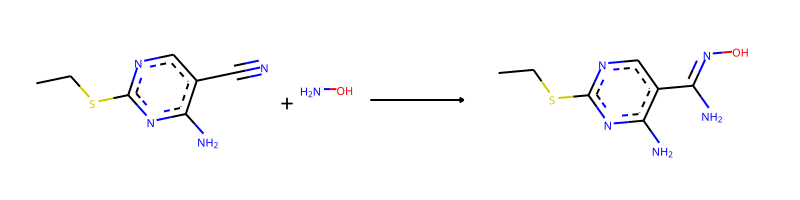

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.NO>>CCSc1ncc(C(N)=NO)c(N)n1
The fast filter score is 0.917299449


--------------------------------------------------

Train index: 353079
RANK 53 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


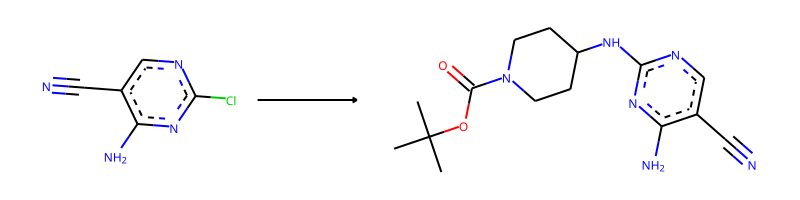

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[Cl;H0;D1;+0]>>C-C(-C)(-C)-O-C(=O)-N1-C-C-C(-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3])-C-C-1


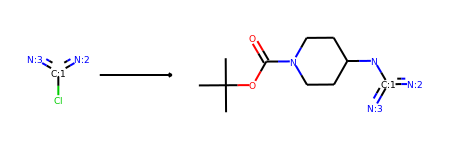

->No precursors could be generated!


--------------------------------------------------

Train index: 127526
RANK 54 PRECEDENT
REACTANT MATCH SCORE: 0.5384615384615384


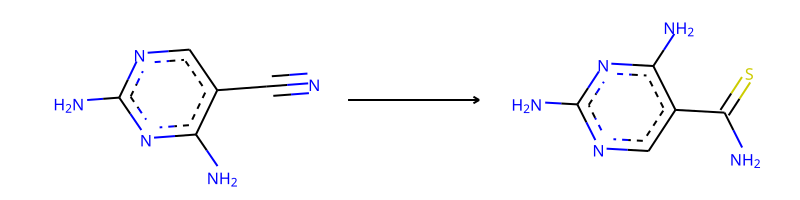

-> template: [#7;a:5]:[c:4]:[c:3](-[C;H0;D2;+0:1]#[N;H0;D1;+0:2]):[c:6]:[#7;a:7]>>S=[C;H0;D3;+0:1](-[NH2;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


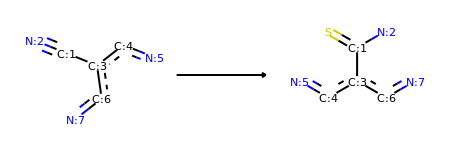

Product similarity 0.5609756097560976, overall 0.30206378986866794, smiles CCSc1ncc(C(N)=S)c(N)n1


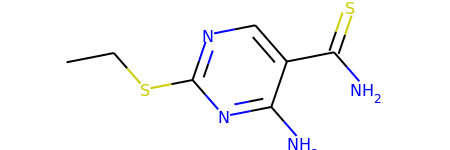

The proposed reaction is:


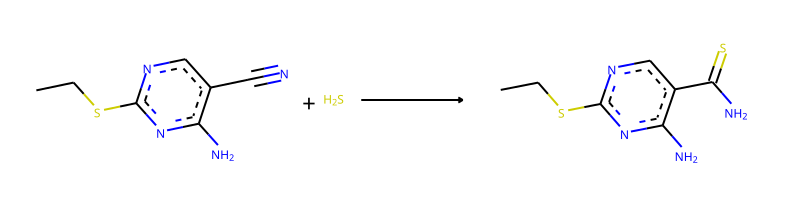

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.S>>CCSc1ncc(C(N)=S)c(N)n1
The fast filter score is 0.845497131


--------------------------------------------------

Train index: 219949
RANK 55 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


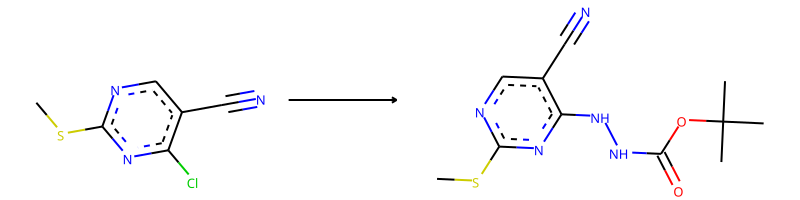

-> template: [#7;a:2]:[c;H0;D3;+0:1](-[Cl;H0;D1;+0]):[c:3]:[c:4]:[#7;a:5]>>C-C(-C)(-C)-O-C(=O)-N-N-[c;H0;D3;+0:1](:[#7;a:2]):[c:3]:[c:4]:[#7;a:5]


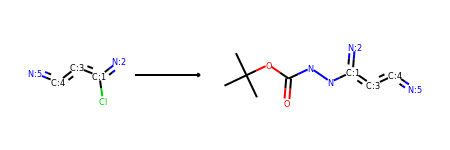

->No precursors could be generated!


--------------------------------------------------

Train index: 147481
RANK 56 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


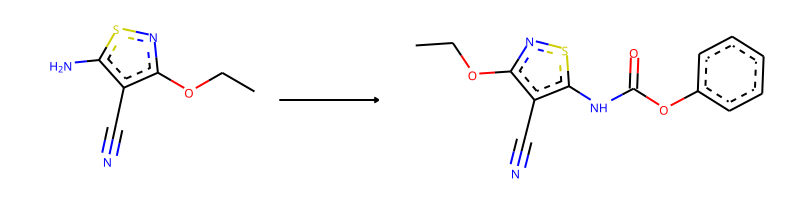

-> template: [#7;a:4]:[#16;a:3]:[c:2]-[NH2;D1;+0:1]>>O=C(-O-c1:c:c:c:c:c:1)-[NH;D2;+0:1]-[c:2]:[#16;a:3]:[#7;a:4]


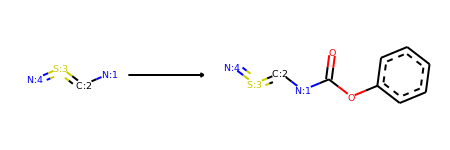

->No precursors could be generated!


--------------------------------------------------

Train index: 233003
RANK 57 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


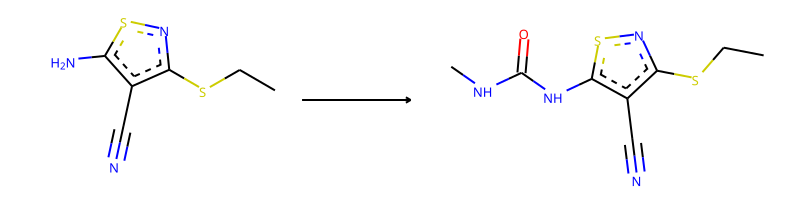

-> template: [#7;a:4]:[#16;a:3]:[c:2]-[NH2;D1;+0:1]>>C-N-C(=O)-[NH;D2;+0:1]-[c:2]:[#16;a:3]:[#7;a:4]


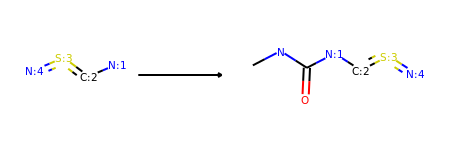

->No precursors could be generated!


--------------------------------------------------

Train index: 386532
RANK 58 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


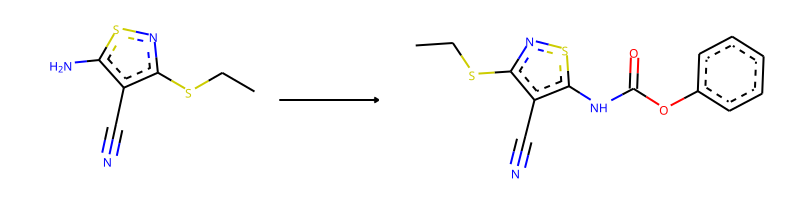

-> template: [#7;a:4]:[#16;a:3]:[c:2]-[NH2;D1;+0:1]>>O=C(-O-c1:c:c:c:c:c:1)-[NH;D2;+0:1]-[c:2]:[#16;a:3]:[#7;a:4]


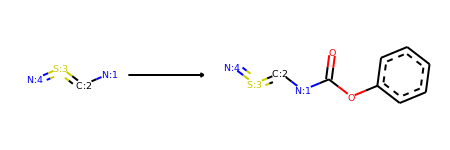

->No precursors could be generated!


--------------------------------------------------

Train index: 263601
RANK 59 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


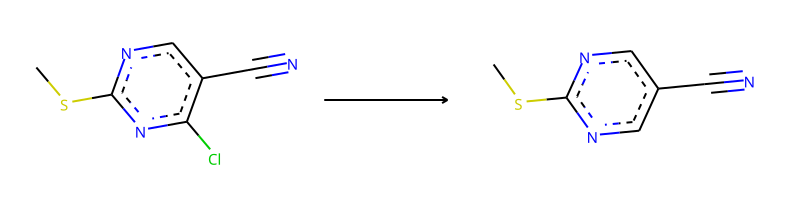

-> template: [#7;a:1]:[c;H0;D3;+0:2](-[Cl;H0;D1;+0]):[c:3]:[c:4]:[#7;a:5]>>[#7;a:1]:[cH;D2;+0:2]:[c:3]:[c:4]:[#7;a:5]


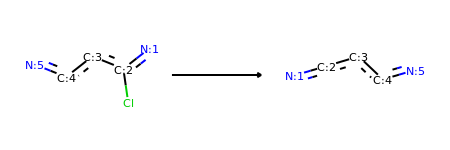

->No precursors could be generated!


--------------------------------------------------

Train index: 304945
RANK 60 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


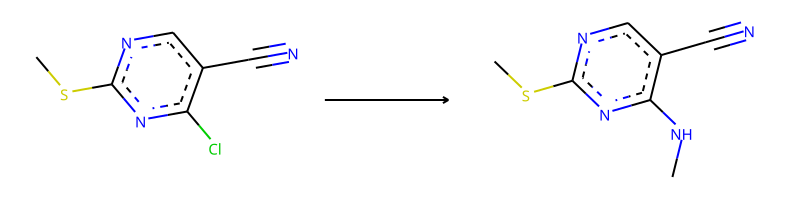

-> template: [#7;a:2]:[c;H0;D3;+0:1](-[Cl;H0;D1;+0]):[c:3]:[c:4]:[#7;a:5]>>C-N-[c;H0;D3;+0:1](:[#7;a:2]):[c:3]:[c:4]:[#7;a:5]


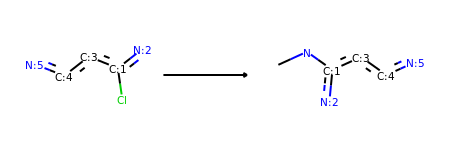

->No precursors could be generated!


--------------------------------------------------

Train index: 247129
RANK 61 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


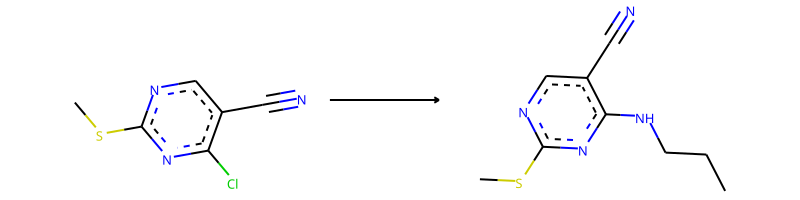

-> template: [#7;a:5]:[c:4]:[c:3]:[c;H0;D3;+0:1](:[#7;a:2])-[Cl;H0;D1;+0]>>C-C-C-N-[c;H0;D3;+0:1](:[#7;a:2]):[c:3]:[c:4]:[#7;a:5]


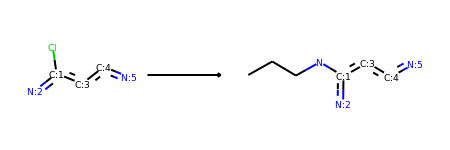

->No precursors could be generated!


--------------------------------------------------

Train index: 141460
RANK 62 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


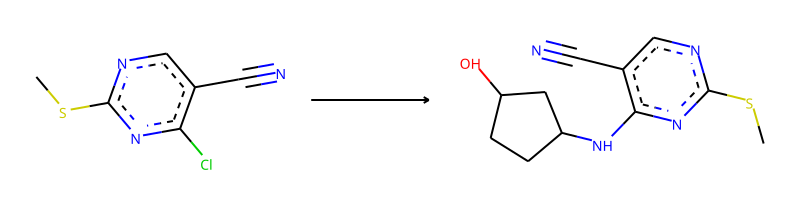

-> template: [#7;a:2]:[c;H0;D3;+0:1](-[Cl;H0;D1;+0]):[c:3]:[c:4]:[#7;a:5]>>O-C1-C-C-C(-N-[c;H0;D3;+0:1](:[#7;a:2]):[c:3]:[c:4]:[#7;a:5])-C-1


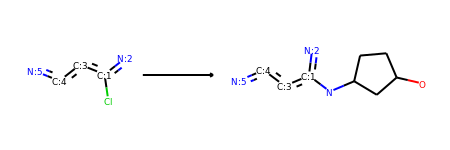

->No precursors could be generated!


--------------------------------------------------

Train index: 165606
RANK 63 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


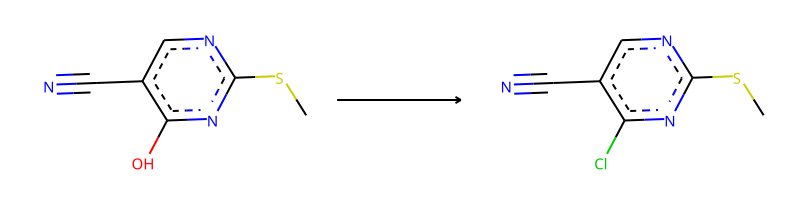

-> template: [O;H1;D1;+0]-[c;H0;D3;+0:1]1:[#7;a:2]:[c:3]:[#7;a:4]:[c:5]:[c:6]:1>>Cl-[c;H0;D3;+0:1]1:[#7;a:2]:[c:3]:[#7;a:4]:[c:5]:[c:6]:1


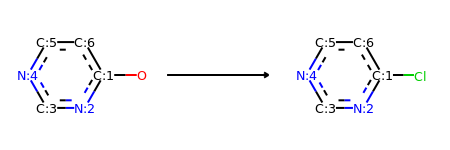

->No precursors could be generated!


--------------------------------------------------

Train index: 216689
RANK 64 PRECEDENT
REACTANT MATCH SCORE: 0.5365853658536586


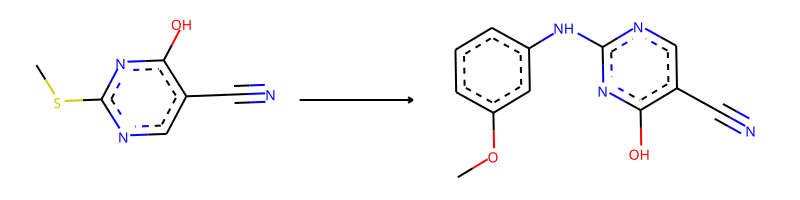

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[S;H0;D2;+0]-[C;H3;D1;+0]>>C-O-c1:c:c:c:c(-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]):c:1


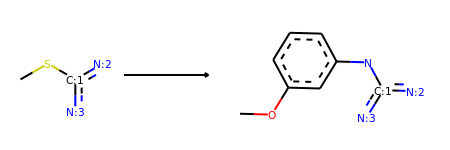

->No precursors could be generated!


--------------------------------------------------

Train index: 314758
RANK 65 PRECEDENT
REACTANT MATCH SCORE: 0.5348837209302325


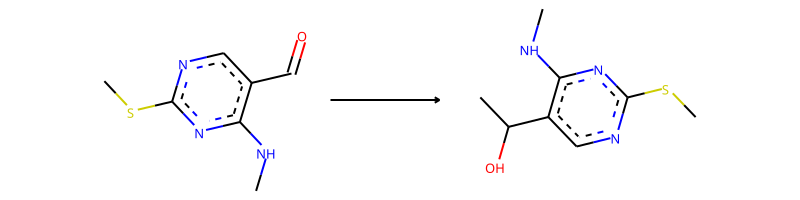

-> template: [#7;a:5]:[c:4]:[c:3](-[CH;D2;+0:1]=[O;H0;D1;+0:2]):[c:6]:[#7;a:7]>>C-[CH;D3;+0:1](-[OH;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


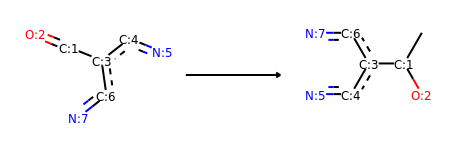

->No precursors could be generated!


--------------------------------------------------

Train index: 215769
RANK 66 PRECEDENT
REACTANT MATCH SCORE: 0.5192307692307693


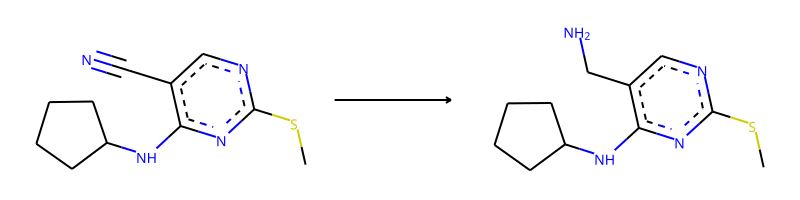

-> template: [#7;a:1]:[c:2]:[c:3](-[C;H0;D2;+0:4]#[N;H0;D1;+0:5]):[c:6]:[#7;a:7]>>[#7;a:1]:[c:2]:[c:3](-[CH2;D2;+0:4]-[NH2;D1;+0:5]):[c:6]:[#7;a:7]


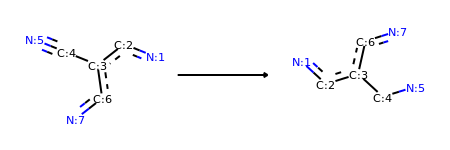

Product similarity 0.5192307692307693, overall 0.2696005917159764, smiles CCSc1ncc(CN)c(N)n1


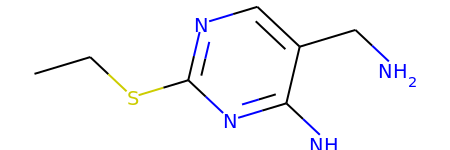

The proposed reaction is:


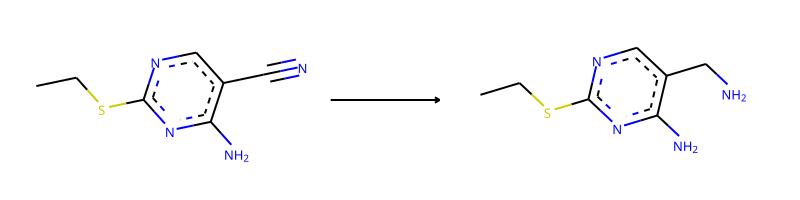

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1>>CCSc1ncc(CN)c(N)n1
The fast filter score is 0.818362713


--------------------------------------------------

Train index: 138867
RANK 67 PRECEDENT
REACTANT MATCH SCORE: 0.5185185185185185


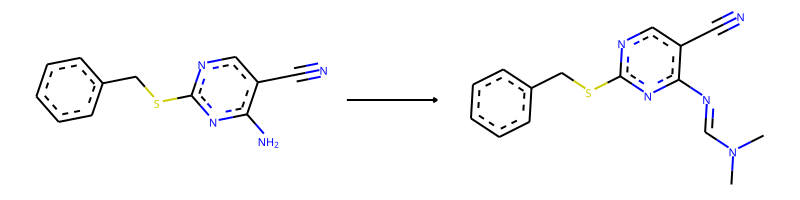

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-N(-C)-C=[N;H0;D2;+0:1]-[c:2]:[#7;a:3]


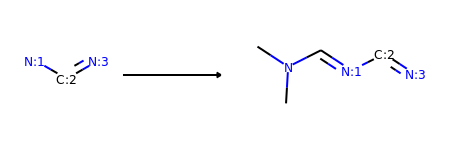

Product similarity 0.6, overall 0.31111111111111106, smiles CCSc1ncc(C#N)c(N=CN(C)C)n1


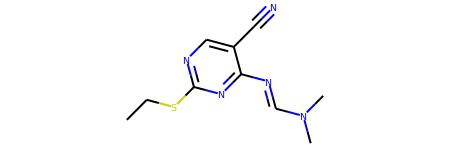

The proposed reaction is:


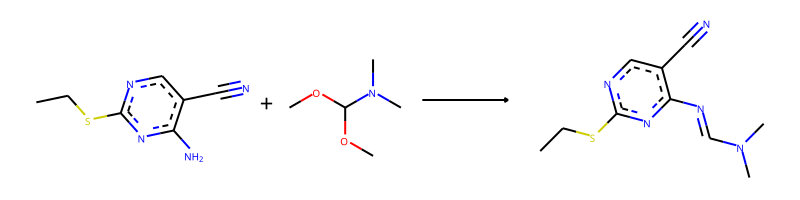

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COC(OC)N(C)C>>CCSc1ncc(C#N)c(N=CN(C)C)n1
The fast filter score is 0.999465585


--------------------------------------------------

Train index: 110554
RANK 68 PRECEDENT
REACTANT MATCH SCORE: 0.5111111111111111


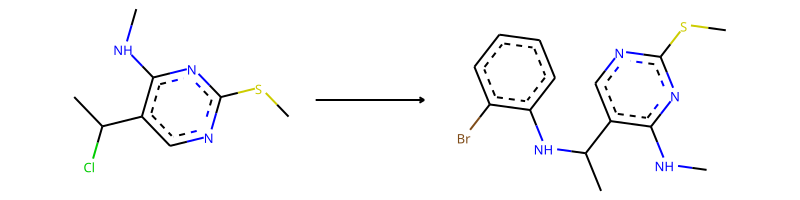

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[CH;D3;+0:1](-[C;D1;H3:2])-[Cl;H0;D1;+0]>>Br-c1:c:c:c:c:c:1-N-[CH;D3;+0:1](-[C;D1;H3:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]


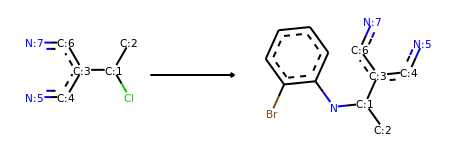

->No precursors could be generated!


--------------------------------------------------

Train index: 1588
RANK 69 PRECEDENT
REACTANT MATCH SCORE: 0.5106382978723404


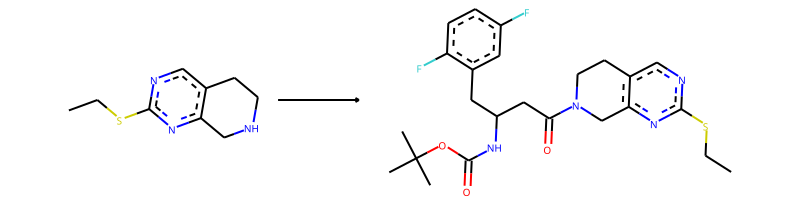

-> template: [C:2]-[NH;D2;+0:1]-[C:3]>>C-C(-C)(-C)-O-C(=O)-N-C(-C-C(=O)-[N;H0;D3;+0:1](-[C:2])-[C:3])-C-c1:c:c(-F):c:c:c:1-F


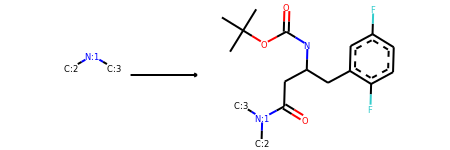

->No precursors could be generated!


--------------------------------------------------

Train index: 124829
RANK 70 PRECEDENT
REACTANT MATCH SCORE: 0.5102040816326531


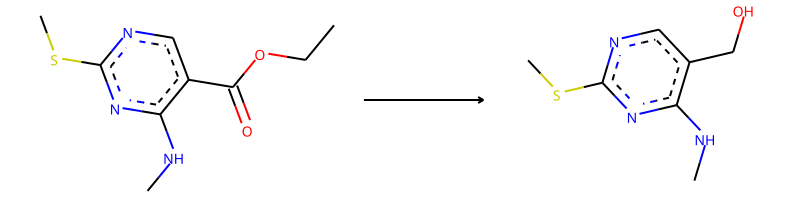

-> template: [#7;a:1]:[c:2]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:4](=[O;H0;D1;+0:5])-[O;H0;D2;+0]-[C;H2;D2;+0]-[C;H3;D1;+0]>>[#7;a:1]:[c:2]:[c:3](-[CH2;D2;+0:4]-[OH;D1;+0:5]):[c:6]:[#7;a:7]


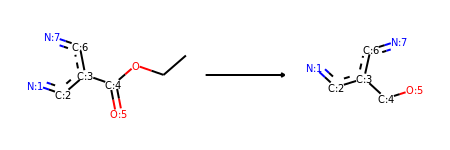

->No precursors could be generated!


--------------------------------------------------

Train index: 55682
RANK 71 PRECEDENT
REACTANT MATCH SCORE: 0.5


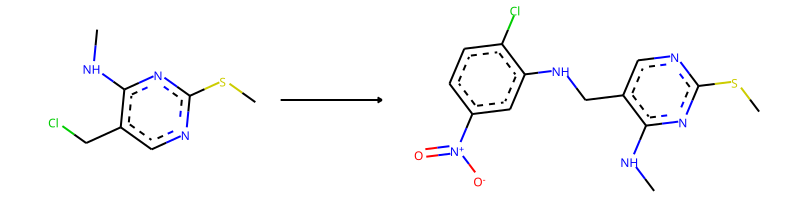

-> template: [#7;a:4]:[c:3]:[c:2](-[CH2;D2;+0:1]-[Cl;H0;D1;+0]):[c:5]:[#7;a:6]>>Cl-c1:c:c:c(-[N+](=O)-[O-]):c:c:1-N-[CH2;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]


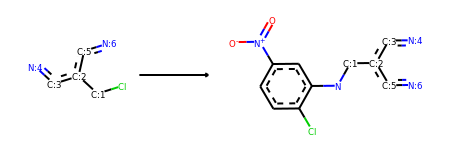

->No precursors could be generated!


--------------------------------------------------

Train index: 140145
RANK 72 PRECEDENT
REACTANT MATCH SCORE: 0.5


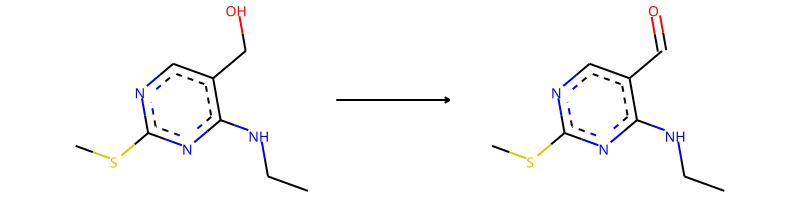

-> template: [#7;a:1]:[c:2]:[c:3](-[CH2;D2;+0:4]-[OH;D1;+0:5]):[c:6]:[#7;a:7]>>[#7;a:1]:[c:2]:[c:3](-[CH;D2;+0:4]=[O;H0;D1;+0:5]):[c:6]:[#7;a:7]


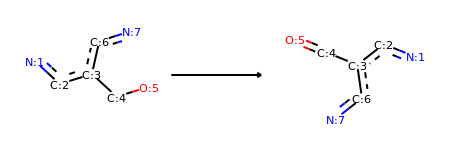

->No precursors could be generated!


--------------------------------------------------

Train index: 20007
RANK 73 PRECEDENT
REACTANT MATCH SCORE: 0.5


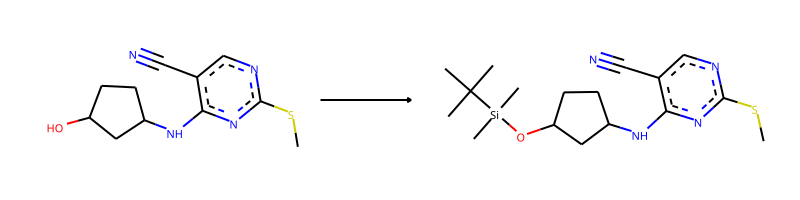

-> template: [C:2]-[OH;D1;+0:1]>>C-C(-C)(-C)-[Si](-C)(-C)-[O;H0;D2;+0:1]-[C:2]


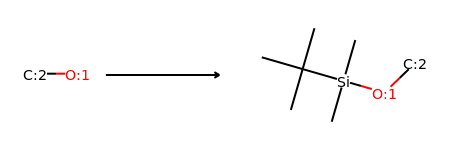

->No precursors could be generated!


--------------------------------------------------

Train index: 120391
RANK 74 PRECEDENT
REACTANT MATCH SCORE: 0.5


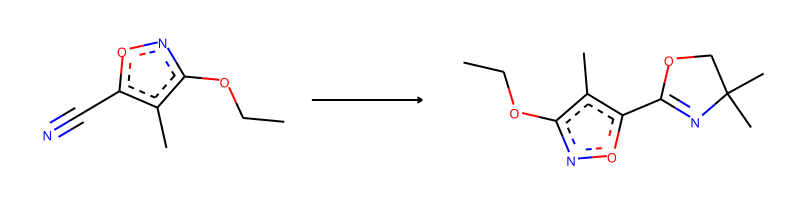

-> template: [#7;a:4]:[#8;a:3]:[c:2]-[C;H0;D2;+0:1]#[N;H0;D1;+0:5]>>C-C1(-C)-C-O-[C;H0;D3;+0:1](-[c:2]:[#8;a:3]:[#7;a:4])=[N;H0;D2;+0:5]-1


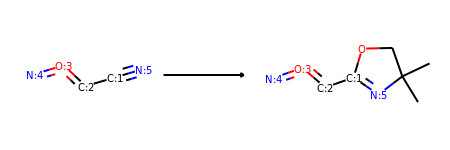

->No precursors could be generated!


--------------------------------------------------

Train index: 425976
RANK 75 PRECEDENT
REACTANT MATCH SCORE: 0.4883720930232558


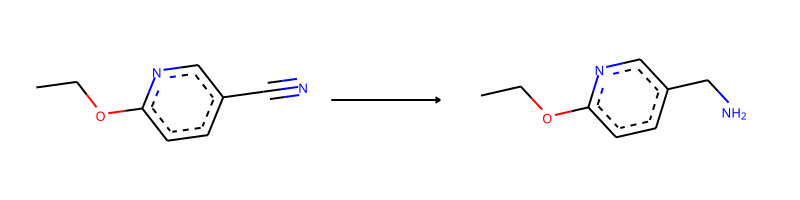

-> template: [#7;a:1]:[c:2]:[c:3]-[C;H0;D2;+0:4]#[N;H0;D1;+0:5]>>[#7;a:1]:[c:2]:[c:3]-[CH2;D2;+0:4]-[NH2;D1;+0:5]


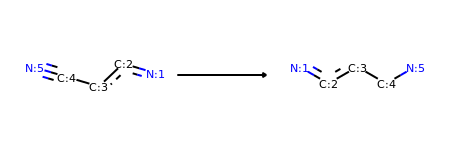

Product similarity 0.4883720930232558, overall 0.23850730124391561, smiles CCSc1ncc(CN)c(N)n1


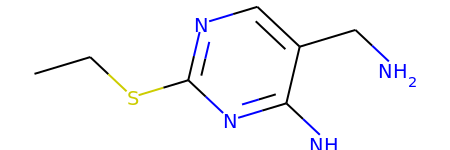

The proposed reaction is:


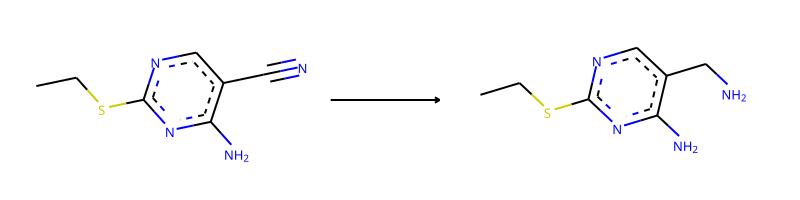

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1>>CCSc1ncc(CN)c(N)n1
The fast filter score is 0.818362713


--------------------------------------------------

Train index: 191759
RANK 76 PRECEDENT
REACTANT MATCH SCORE: 0.4883720930232558


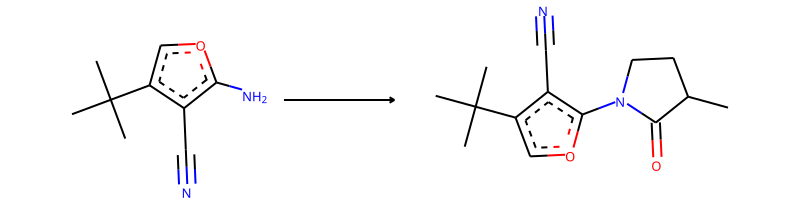

-> template: [#8;a:3]:[c:2]-[NH2;D1;+0:1]>>C-C1-C-C-[N;H0;D3;+0:1](-[c:2]:[#8;a:3])-C-1=O


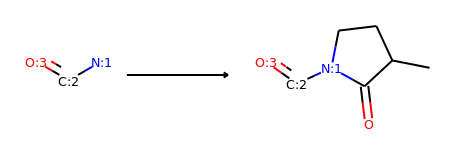

->No precursors could be generated!


--------------------------------------------------

Train index: 420769
RANK 77 PRECEDENT
REACTANT MATCH SCORE: 0.48717948717948717


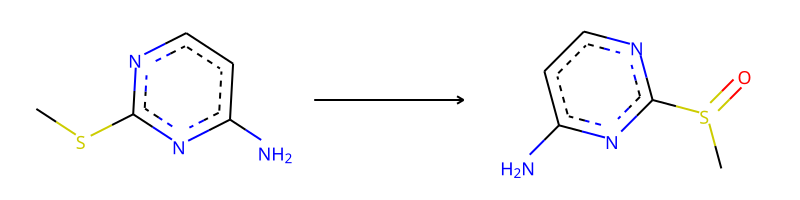

-> template: [#7;a:4]:[c:3](:[#7;a:5])-[S;H0;D2;+0:1]-[C;D1;H3:2]>>O=[S;H0;D3;+0:1](-[C;D1;H3:2])-[c:3](:[#7;a:4]):[#7;a:5]


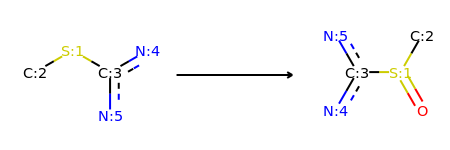

->No precursors could be generated!


--------------------------------------------------

Train index: 415028
RANK 78 PRECEDENT
REACTANT MATCH SCORE: 0.4864864864864865


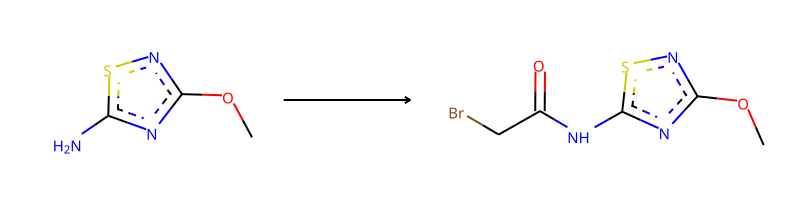

-> template: [#7;a:3]:[c:2](-[NH2;D1;+0:1]):[#16;a:4]:[#7;a:5]>>Br-C-C(=O)-[NH;D2;+0:1]-[c:2](:[#7;a:3]):[#16;a:4]:[#7;a:5]


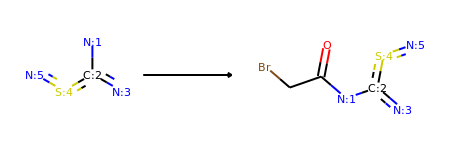

->No precursors could be generated!


--------------------------------------------------

Train index: 369556
RANK 79 PRECEDENT
REACTANT MATCH SCORE: 0.4864864864864865


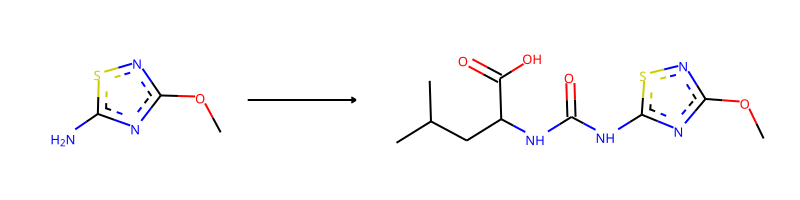

-> template: [#7;a:3]:[c:2](-[NH2;D1;+0:1]):[#16;a:4]:[#7;a:5]>>C-C(-C)-C-C(-N-C(=O)-[NH;D2;+0:1]-[c:2](:[#7;a:3]):[#16;a:4]:[#7;a:5])-C(-O)=O


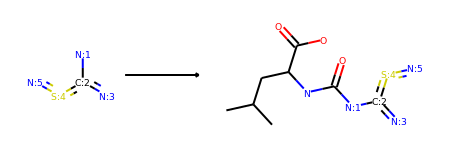

->No precursors could be generated!


--------------------------------------------------

Train index: 392637
RANK 80 PRECEDENT
REACTANT MATCH SCORE: 0.4807692307692308


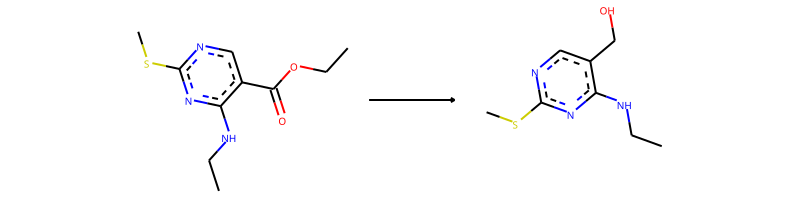

-> template: [#7;a:1]:[c:2]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:4](=[O;H0;D1;+0:5])-[O;H0;D2;+0]-[C;H2;D2;+0]-[C;H3;D1;+0]>>[#7;a:1]:[c:2]:[c:3](-[CH2;D2;+0:4]-[OH;D1;+0:5]):[c:6]:[#7;a:7]


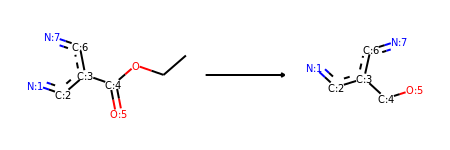

->No precursors could be generated!


--------------------------------------------------

Train index: 229021
RANK 81 PRECEDENT
REACTANT MATCH SCORE: 0.4791666666666667


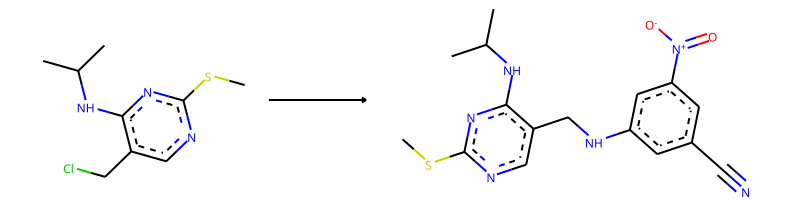

-> template: [#7;a:4]:[c:3]:[c:2](-[CH2;D2;+0:1]-[Cl;H0;D1;+0]):[c:5]:[#7;a:6]>>N#C-c1:c:c(-N-[CH2;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]):c:c(-[N+](=O)-[O-]):c:1


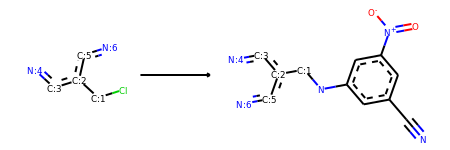

->No precursors could be generated!


--------------------------------------------------

Train index: 236196
RANK 82 PRECEDENT
REACTANT MATCH SCORE: 0.4782608695652174


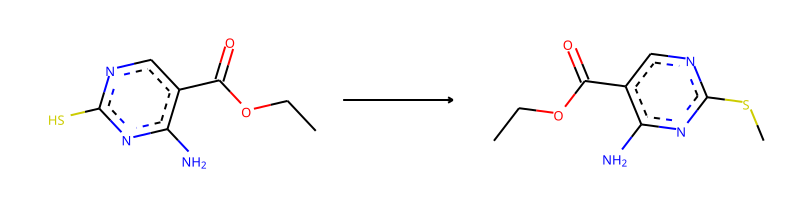

-> template: [#7;a:3]:[c:2](:[#7;a:4])-[SH;D1;+0:1]>>C-[S;H0;D2;+0:1]-[c:2](:[#7;a:3]):[#7;a:4]


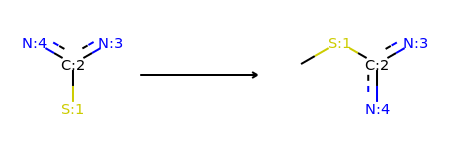

->No precursors could be generated!


--------------------------------------------------

Train index: 156893
RANK 83 PRECEDENT
REACTANT MATCH SCORE: 0.4782608695652174


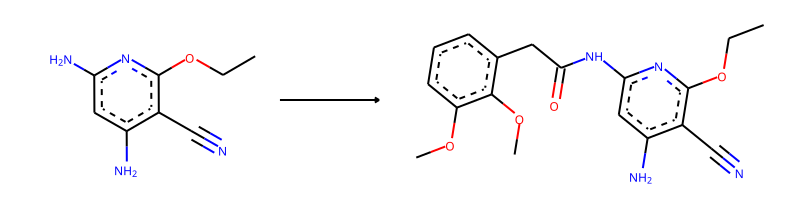

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-O-c1:c:c:c:c(-C-C(=O)-[NH;D2;+0:1]-[c:2]:[#7;a:3]):c:1-O-C


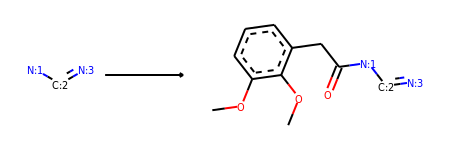

Product similarity 0.7108433734939759, overall 0.3399685699319015, smiles CCSc1ncc(C#N)c(NC(=O)Cc2cccc(OC)c2OC)n1


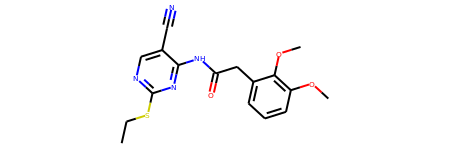

The proposed reaction is:


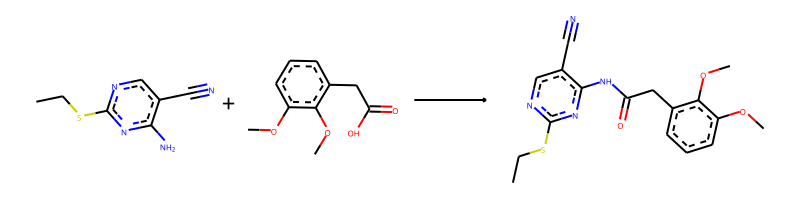

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COc1cccc(CC(=O)O)c1OC>>CCSc1ncc(C#N)c(NC(=O)Cc2cccc(OC)c2OC)n1
The fast filter score is 0.999978781


--------------------------------------------------

Train index: 27113
RANK 84 PRECEDENT
REACTANT MATCH SCORE: 0.4782608695652174


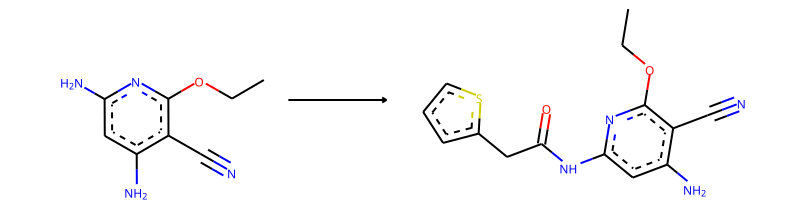

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>O=C(-C-c1:c:c:c:s:1)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


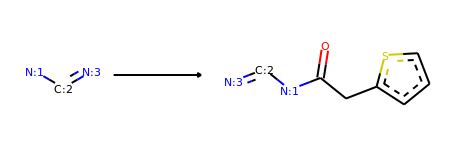

Product similarity 0.6571428571428571, overall 0.3142857142857143, smiles CCSc1ncc(C#N)c(NC(=O)Cc2cccs2)n1


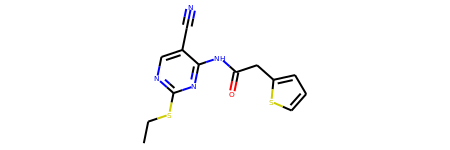

The proposed reaction is:


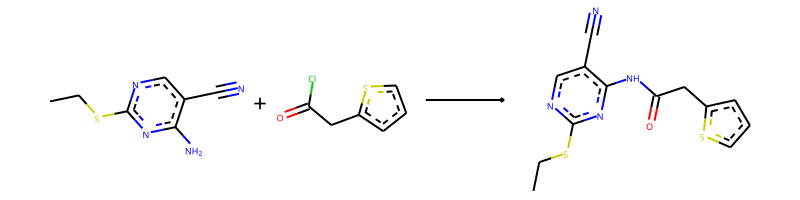

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.O=C(Cl)Cc1cccs1>>CCSc1ncc(C#N)c(NC(=O)Cc2cccs2)n1
The fast filter score is 0.99996984


--------------------------------------------------

Train index: 46858
RANK 85 PRECEDENT
REACTANT MATCH SCORE: 0.4782608695652174


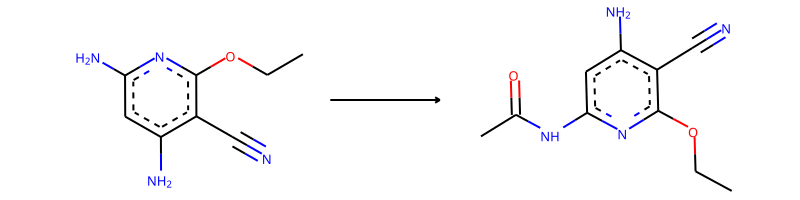

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-C(=O)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


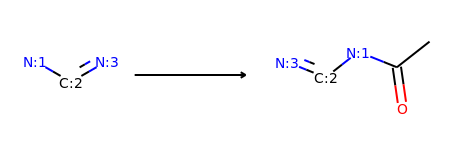

Product similarity 0.5555555555555556, overall 0.26570048309178745, smiles CCSc1ncc(C#N)c(NC(C)=O)n1


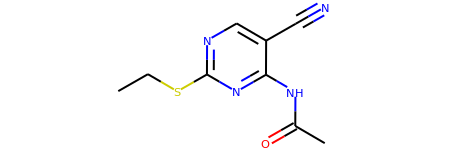

The proposed reaction is:


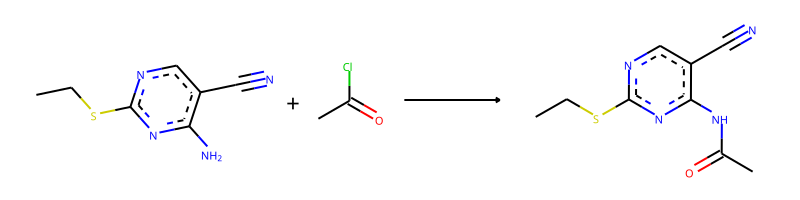

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.CC(=O)Cl>>CCSc1ncc(C#N)c(NC(C)=O)n1
The fast filter score is 0.999417067


--------------------------------------------------

Train index: 349667
RANK 86 PRECEDENT
REACTANT MATCH SCORE: 0.4782608695652174


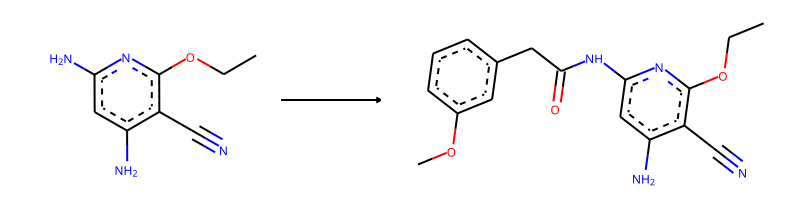

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-O-c1:c:c:c:c(-C-C(=O)-[NH;D2;+0:1]-[c:2]:[#7;a:3]):c:1


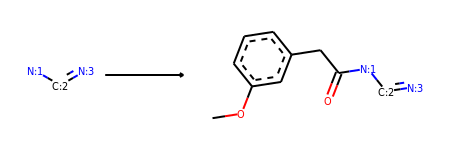

Product similarity 0.6923076923076923, overall 0.3311036789297659, smiles CCSc1ncc(C#N)c(NC(=O)Cc2cccc(OC)c2)n1


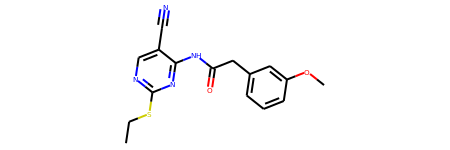

The proposed reaction is:


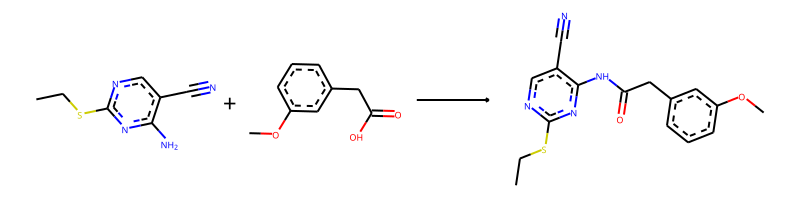

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COc1cccc(CC(=O)O)c1>>CCSc1ncc(C#N)c(NC(=O)Cc2cccc(OC)c2)n1
The fast filter score is 0.999982119


--------------------------------------------------

Train index: 80186
RANK 87 PRECEDENT
REACTANT MATCH SCORE: 0.4782608695652174


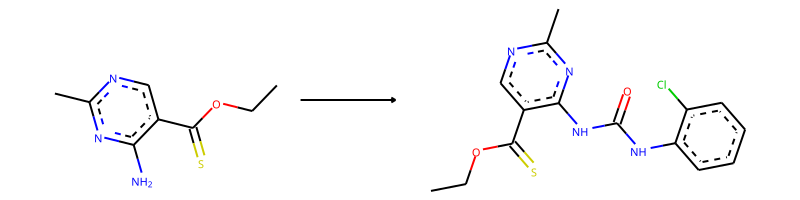

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>Cl-c1:c:c:c:c:c:1-N-C(=O)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


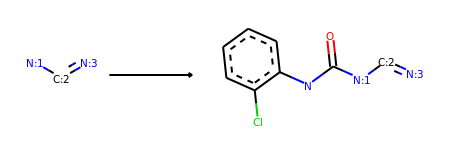

Product similarity 0.68, overall 0.32521739130434785, smiles CCSc1ncc(C#N)c(NC(=O)Nc2ccccc2Cl)n1


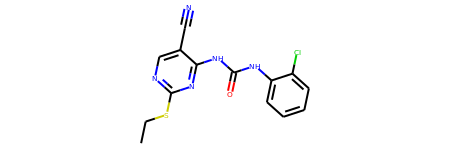

The proposed reaction is:


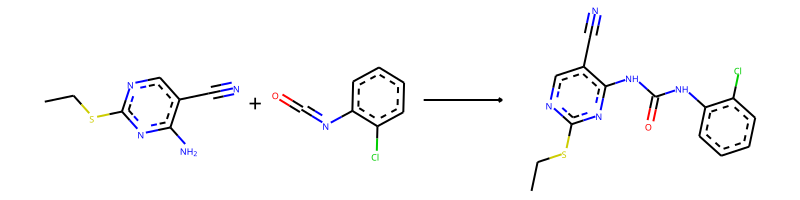

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.O=C=Nc1ccccc1Cl>>CCSc1ncc(C#N)c(NC(=O)Nc2ccccc2Cl)n1
The fast filter score is 0.999488413


--------------------------------------------------

Train index: 313016
RANK 88 PRECEDENT
REACTANT MATCH SCORE: 0.4782608695652174


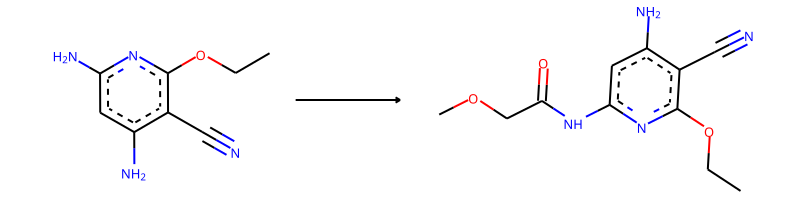

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-O-C-C(=O)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


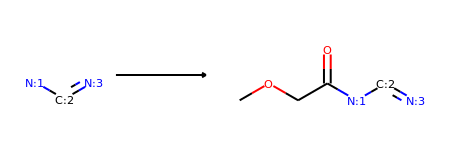

Product similarity 0.6, overall 0.28695652173913044, smiles CCSc1ncc(C#N)c(NC(=O)COC)n1


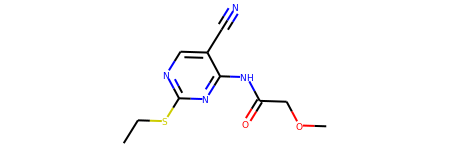

The proposed reaction is:


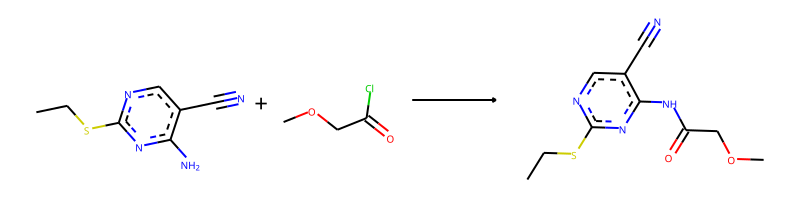

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.COCC(=O)Cl>>CCSc1ncc(C#N)c(NC(=O)COC)n1
The fast filter score is 0.999954343


--------------------------------------------------

Train index: 174943
RANK 89 PRECEDENT
REACTANT MATCH SCORE: 0.4782608695652174


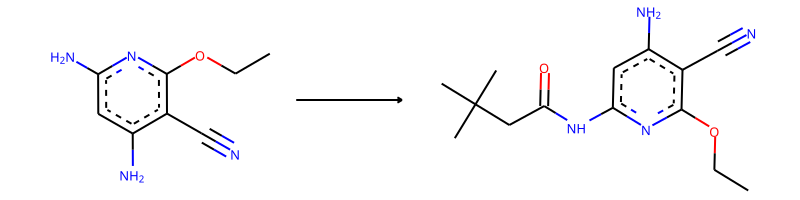

-> template: [#7;a:3]:[c:2]-[NH2;D1;+0:1]>>C-C(-C)(-C)-C-C(=O)-[NH;D2;+0:1]-[c:2]:[#7;a:3]


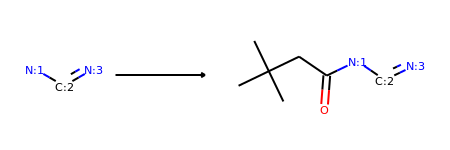

Product similarity 0.625, overall 0.29891304347826086, smiles CCSc1ncc(C#N)c(NC(=O)CC(C)(C)C)n1


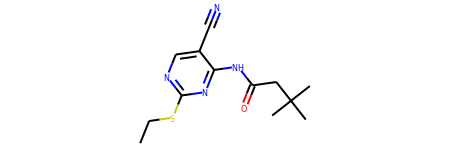

The proposed reaction is:


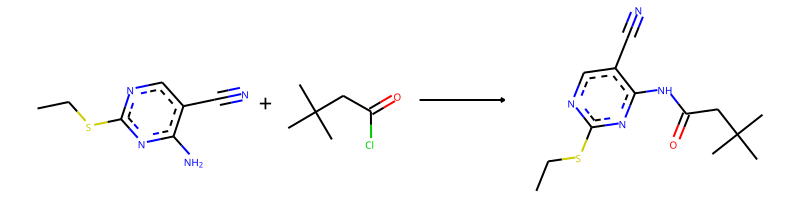

The reaction SMILES string is: CCSc1ncc(C#N)c(N)n1.CC(C)(C)CC(=O)Cl>>CCSc1ncc(C#N)c(NC(=O)CC(C)(C)C)n1
The fast filter score is 0.999798596


--------------------------------------------------

Train index: 243834
RANK 90 PRECEDENT
REACTANT MATCH SCORE: 0.4772727272727273


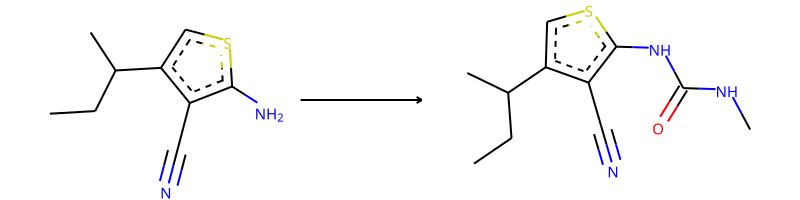

-> template: [#16;a:3]:[c:2]-[NH2;D1;+0:1]>>C-N-C(=O)-[NH;D2;+0:1]-[c:2]:[#16;a:3]


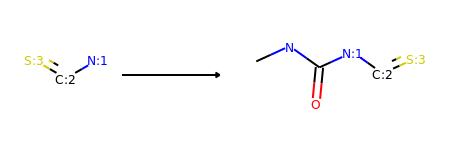

->No precursors could be generated!


--------------------------------------------------

Train index: 367213
RANK 91 PRECEDENT
REACTANT MATCH SCORE: 0.4772727272727273


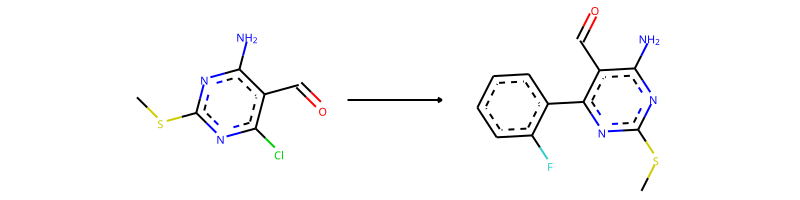

-> template: [#7;a:7]:[c:6]:[c:3](-[C:4]=[O;D1;H0:5]):[c;H0;D3;+0:1](:[#7;a:2])-[Cl;H0;D1;+0]>>F-c1:c:c:c:c:c:1-[c;H0;D3;+0:1](:[#7;a:2]):[c:3](-[C:4]=[O;D1;H0:5]):[c:6]:[#7;a:7]


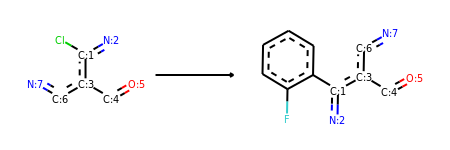

->No precursors could be generated!


--------------------------------------------------

Train index: 432390
RANK 92 PRECEDENT
REACTANT MATCH SCORE: 0.47619047619047616


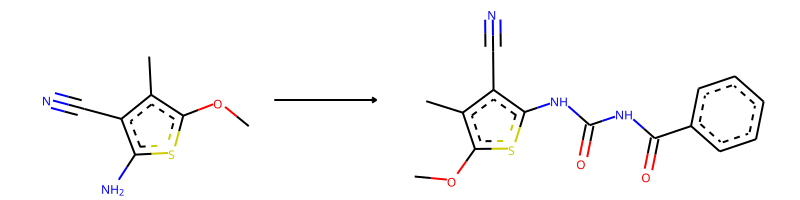

-> template: [#16;a:3]:[c:2]-[NH2;D1;+0:1]>>O=C(-N-C(=O)-c1:c:c:c:c:c:1)-[NH;D2;+0:1]-[c:2]:[#16;a:3]


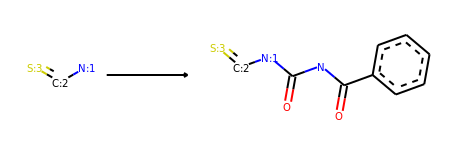

->No precursors could be generated!


--------------------------------------------------

Train index: 269846
RANK 93 PRECEDENT
REACTANT MATCH SCORE: 0.46938775510204084


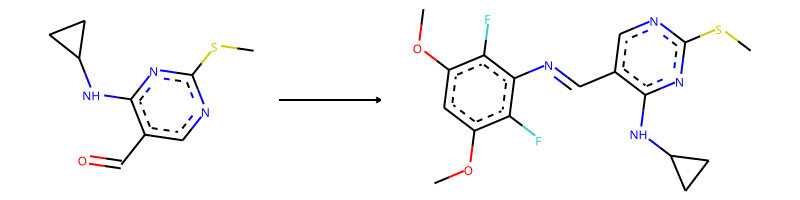

-> template: [#7;a:4]:[c:3]:[c:2](-[CH;D2;+0:1]=[O;H0;D1;+0]):[c:5]:[#7;a:6]>>C-O-c1:c:c(-O-C):c(-F):c(-N=[CH;D2;+0:1]-[c:2](:[c:3]:[#7;a:4]):[c:5]:[#7;a:6]):c:1-F


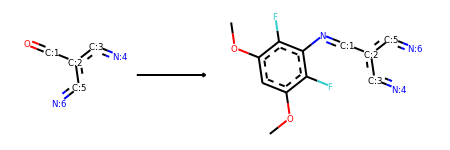

->No precursors could be generated!


--------------------------------------------------

Train index: 333349
RANK 94 PRECEDENT
REACTANT MATCH SCORE: 0.46808510638297873


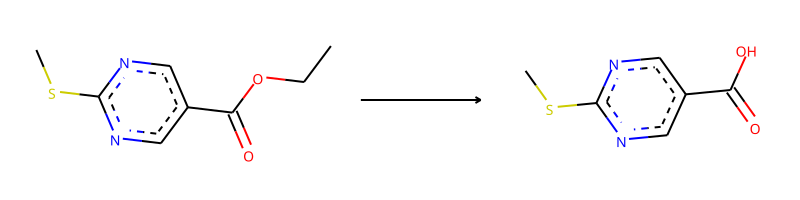

-> template: [C;H3;D1;+0]-[C;H2;D2;+0]-[O;H0;D2;+0:3]-[C:2]=[O;D1;H0:1]>>[O;D1;H0:1]=[C:2]-[OH;D1;+0:3]


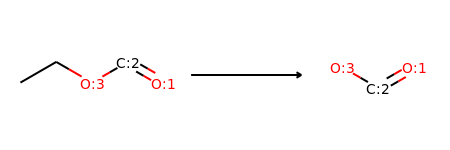

->No precursors could be generated!


--------------------------------------------------

Train index: 152650
RANK 95 PRECEDENT
REACTANT MATCH SCORE: 0.46808510638297873


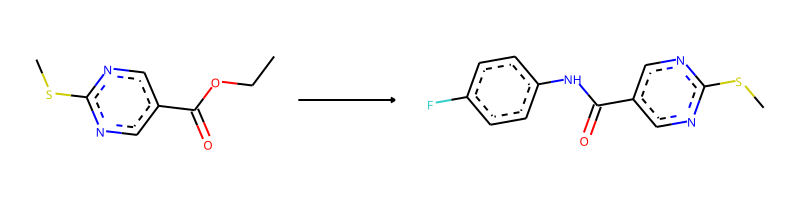

-> template: [#7;a:5]:[c:4]:[c:3](:[c:6]:[#7;a:7])-[C;H0;D3;+0:1](=[O;H0;D1;+0])-[O;H0;D2;+0:2]-[C;H2;D2;+0]-[C;H3;D1;+0]>>F-c1:c:c:c(-N-[C;H0;D3;+0:1](=[O;H0;D1;+0:2])-[c:3](:[c:4]:[#7;a:5]):[c:6]:[#7;a:7]):c:c:1


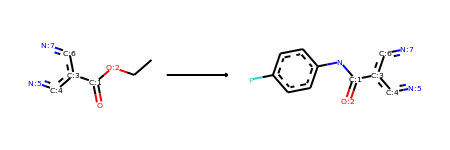

->No precursors could be generated!


--------------------------------------------------

Train index: 410059
RANK 96 PRECEDENT
REACTANT MATCH SCORE: 0.46808510638297873


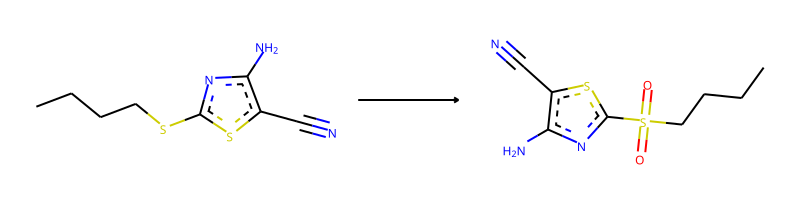

-> template: [#16;a:4]:[c:3](:[#7;a:5])-[S;H0;D2;+0:1]-[C:2]>>O=[S;H0;D4;+0:1](=O)(-[C:2])-[c:3](:[#16;a:4]):[#7;a:5]


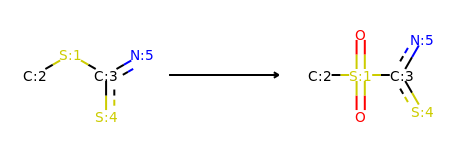

->No precursors could be generated!


--------------------------------------------------

Train index: 12392
RANK 97 PRECEDENT
REACTANT MATCH SCORE: 0.46808510638297873


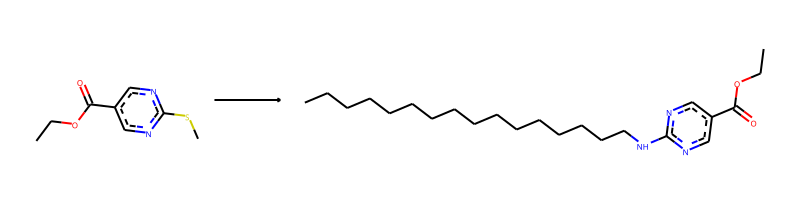

-> template: [#7;a:2]:[c;H0;D3;+0:1](:[#7;a:3])-[S;H0;D2;+0]-[C;H3;D1;+0]>>C-C-C-C-C-C-C-C-C-C-C-C-C-C-C-C-N-[c;H0;D3;+0:1](:[#7;a:2]):[#7;a:3]


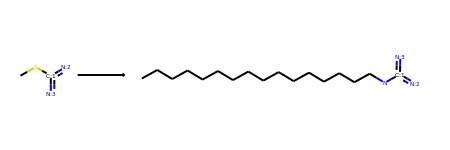

->No precursors could be generated!


--------------------------------------------------

Train index: 349231
RANK 98 PRECEDENT
REACTANT MATCH SCORE: 0.46808510638297873


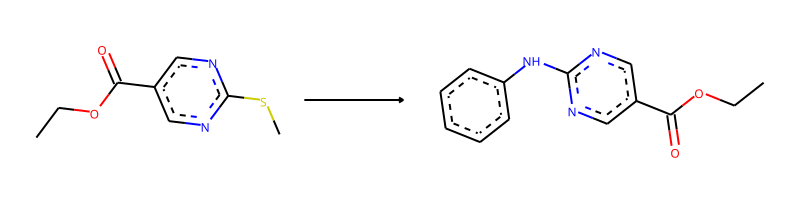

-> template: [#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-[S;H0;D2;+0]-[C;H3;D1;+0]>>[#7;a:1]:[c;H0;D3;+0:2](:[#7;a:3])-N-c1:c:c:c:c:c:1


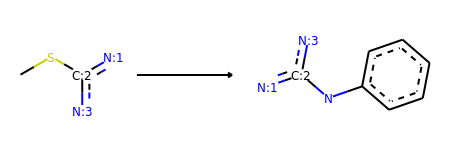

->No precursors could be generated!


--------------------------------------------------

Train index: 232131
RANK 99 PRECEDENT
REACTANT MATCH SCORE: 0.4666666666666667


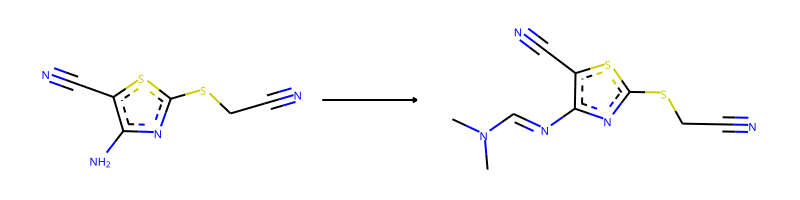

-> template: [#16;a:5]:[c:4]:[c:2](:[#7;a:3])-[NH2;D1;+0:1]>>C-N(-C)-C=[N;H0;D2;+0:1]-[c:2](:[#7;a:3]):[c:4]:[#16;a:5]


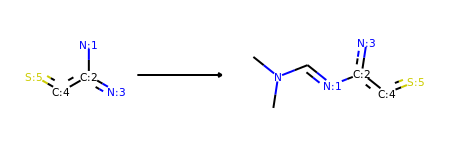

->No precursors could be generated!


--------------------------------------------------

Train index: 262446
RANK 100 PRECEDENT
REACTANT MATCH SCORE: 0.46511627906976744


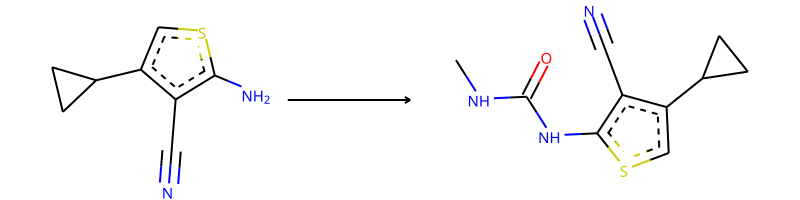

-> template: [#16;a:3]:[c:2]-[NH2;D1;+0:1]>>C-N-C(=O)-[NH;D2;+0:1]-[c:2]:[#16;a:3]


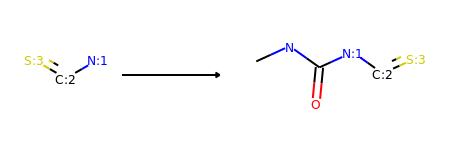

->No precursors could be generated!


(6, 'CCSc1ncc(C#N)c(N)n1.COC(OC)N(C)C>>CCSc1ncc(C#N)c(N=CN(C)C)n1', 1.0, 0.54)

In [48]:
do_one_v4 (208547)